In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
from tensorflow.keras import applications
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dropout, Flatten, Dense, GlobalAveragePooling2D
from tensorflow.keras import backend as k
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard, EarlyStopping
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Conv2D, Flatten, MaxPooling2D, Activation
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Activation
#from tensorflow.keras.layers.normalization import BatchNormalization
import matplotlib.pyplot as plt
import time
import numpy as np
import cv2
from numpy import newaxis
import time
from sklearn.utils import resample
from sklearn.metrics import classification_report,accuracy_score, confusion_matrix
import gc


In [2]:
def predimg(model, imgs, bs):
    #print(imrs)
    #start_time=time.time()

    preds = model.predict(imgs)

    print(preds)
    predicted_class = np.argmax(preds, axis=1)
    print(predicted_class)
    prob = np.empty(bs)
    score1 = np.empty(bs)
    for i in range(bs):
        prob[i] = preds[i][predicted_class[i]]
        score1[i] = preds[i][1]

    #print(prob)
    return predicted_class, prob, score1

In [3]:
import pickle
class_indices = pickle.load( open( "testnnv2-onenewnetv2.p", "rb" ) )
print(class_indices)

class_inv_map = {v: int(k) for k, v in class_indices.items()}

print(class_inv_map)

{'0': 0, '1': 1, '10': 2, '11': 3, '12': 4, '2': 5, '3': 6, '4': 7, '5': 8, '6': 9, '7': 10, '8': 11, '9': 12}
{0: 0, 1: 1, 2: 10, 3: 11, 4: 12, 5: 2, 6: 3, 7: 4, 8: 5, 9: 6, 10: 7, 11: 8, 12: 9}


In [4]:
import glob

    
from tensorflow.keras.models import load_model
model = load_model('one/0_ov4nnnewnet_f0.8_d0.5_l0.01.h5')
#model = load_model('nnparasnet_f32_d0.2_l0.001.h5')


In [5]:
def genresult(X_test, y_test):
    bsize = 32
    #print(X_test)
    flen = len(X_test)

    rlen = flen//bsize
    #rlen = 1

    rst = flen - rlen * bsize

    print('Lens:', flen, 'Blocks:', rlen, 'Bsize:', bsize, 'Rst:', rst)

    t1 = time.time()
    data = np.zeros((bsize, 120,120,3), dtype=np.float32)

    if rst:
        rlen = rlen + 1
    y_pred = np.array([])
    y_prob = np.array([])
    y_score1= np.array([])
    for i in range(rlen):
        bs = bsize
        if rst and i == (rlen -1):
            bs = rst
        for j in range(bs):
            fid = i*bsize + j
            image = cv2.imread(X_test[fid])
            imrs = image.astype(float)
            imrs = imrs / 255.0
            data[j,:,:,:] = imrs

        #print('i:', i, 'bs', bs)
        ret, prob, score1 = predimg(model, data.copy(), bs)

        y_pred = np.hstack((y_pred, ret[:bs]))
        y_prob = np.hstack((y_prob, prob[:bs]))
        y_score1 = np.hstack((y_score1, score1[:bs]))
        #print(ret)
        #print(prob)
        #zzz
    t2 = time.time()

    ttime = t2 - t1
    tfile = len(y_test)
    print('Totaltime:', ttime)
    print('Files:', tfile)
    print('FPS:', tfile/ttime)

    print('All:', len(y_pred))
    print(y_test)
    print(y_pred)
    print(y_prob)
    return y_pred, y_prob

In [6]:
opath = './onetvt/test/'

In [7]:
if False:
    i = 2
    X_test =[]
    y_test =[]
    data = glob.glob(opath + str(i) + '/*.png')
    X_test = X_test + data
    y_test = y_test + [i] * len(data)
    y_pred, y_prob = genresult(X_test, y_test)
    print('++++')
    print(y_pred)
    y_predt = np.vectorize(class_inv_map.get)(y_pred)
    print(y_predt)

In [8]:
oret={}
classes = 13
for i in range(classes):
    X_test =[]
    y_test =[]
    data = glob.glob(opath + str(i) + '/*.png')
    X_test = X_test + data
    y_test = y_test + [i] * len(data)
    y_pred, y_prob = genresult(X_test, y_test)
    print('++++')
    print(y_pred)
    y_predt = np.vectorize(class_inv_map.get)(y_pred)
    print(y_predt)
    #zzzzz
    oret[i] = [y_predt, y_prob, X_test, y_test]
del model
gc.collect()


Lens: 11216 Blocks: 350 Bsize: 32 Rst: 16
[[9.97998059e-01 4.87812167e-06 1.28123947e-08 1.38608113e-04
  2.84251360e-06 9.97483585e-06 1.60553391e-05 2.19121957e-05
  1.80472201e-03 2.09218641e-07 9.54369117e-09 3.29131282e-08
  2.64878895e-06]
 [1.00000000e+00 1.73173365e-09 2.44293552e-14 1.88024618e-08
  1.48504570e-10 6.23744967e-09 1.92050309e-09 7.84514731e-10
  1.18606391e-09 5.12818039e-14 2.80937857e-14 4.56231841e-13
  3.07107312e-10]
 [9.99986291e-01 2.79002097e-06 1.77212467e-08 1.62029640e-10
  7.94812305e-09 1.08465047e-05 1.51970987e-08 1.74957560e-08
  2.57250783e-11 2.69159764e-11 6.15889562e-11 9.21577328e-11
  2.30013675e-09]
 [9.99994755e-01 5.21638822e-06 1.68705779e-11 5.88010679e-14
  2.32955894e-11 7.14392954e-08 1.72266663e-11 2.73832849e-11
  1.85994313e-13 9.05442222e-15 8.20064502e-14 1.30679467e-10
  1.24434352e-10]
 [9.99904752e-01 8.92911412e-05 1.49684396e-07 6.35058672e-11
  1.38458596e-08 5.84816235e-06 1.49898867e-08 4.83891238e-09
  1.87994689e-10 1

[[9.99981165e-01 3.69114900e-06 3.59632479e-09 1.89906419e-08
  4.59329250e-08 4.83579981e-07 2.72673583e-06 1.17434092e-05
  6.39919406e-09 7.59452146e-09 3.03548020e-10 4.07526873e-10
  1.33598590e-07]
 [9.99960542e-01 3.52542884e-05 4.65956475e-11 8.59940537e-13
  6.60819566e-10 4.20904280e-06 1.66220274e-10 1.50215847e-11
  3.14634169e-12 5.60340518e-14 1.13123746e-12 7.53175922e-09
  2.58908184e-09]
 [9.99999881e-01 7.38155990e-08 2.96556187e-15 4.06037969e-13
  5.00070874e-10 5.67245522e-08 5.54688136e-11 1.22488209e-11
  1.08589658e-13 1.00977868e-15 1.17667649e-13 1.01558606e-09
  2.04257739e-11]
 [1.00000000e+00 6.87985535e-09 3.56027382e-13 1.59861688e-08
  3.62595981e-10 1.70027192e-08 4.89981922e-09 4.99651653e-09
  6.37797770e-09 5.86054697e-13 8.57561296e-14 1.00838879e-12
  4.56568561e-10]
 [9.99999881e-01 6.41969606e-08 2.48994923e-14 1.20124849e-14
  1.86529329e-12 6.25648910e-09 2.14006287e-12 9.02258465e-13
  3.72755991e-15 6.58322146e-17 1.28189638e-15 1.01729692e-1

[[1.00000000e+00 5.56969182e-09 3.67128582e-13 3.20869464e-09
  1.36821082e-10 1.02185105e-08 2.08131312e-09 1.93778948e-09
  1.57978675e-09 2.10627658e-13 2.02581441e-13 1.25270497e-12
  8.98858488e-11]
 [9.98605072e-01 3.98500852e-05 4.84065185e-06 7.07364006e-06
  1.02029380e-05 1.35359051e-05 8.65378126e-04 4.01242927e-04
  9.92198125e-07 3.65321512e-06 1.21597196e-07 1.44965554e-07
  4.79551891e-05]
 [9.99781311e-01 2.14095897e-04 2.13335234e-08 1.13285544e-11
  3.58543617e-09 4.60611682e-06 2.78649477e-08 2.83511952e-08
  2.33437297e-10 4.81127325e-11 3.62910153e-11 4.63462546e-10
  8.72603501e-09]
 [9.99999762e-01 1.73311449e-07 8.11920236e-12 2.64448734e-14
  1.47323701e-12 9.91438540e-08 2.36519103e-11 2.20043740e-11
  6.82490063e-15 1.58375192e-15 6.89290171e-15 3.54898944e-14
  6.26360400e-13]
 [9.99786675e-01 1.26861123e-04 3.24012994e-08 1.08895015e-09
  5.23375263e-08 8.60593500e-05 4.42699282e-08 1.09304601e-08
  3.84815868e-09 3.62544023e-11 3.94125621e-09 9.08882358e-1

[[9.99922037e-01 5.02480725e-05 2.89636523e-06 1.32752920e-08
  2.33352324e-07 1.54807803e-05 5.81329277e-06 2.16030071e-06
  3.49108009e-09 3.90655908e-09 3.22798877e-09 1.25256436e-08
  1.01600642e-06]
 [9.99911189e-01 8.47296978e-05 6.05310859e-08 1.25690456e-11
  1.78090187e-09 3.97987742e-06 1.72885493e-08 1.01772049e-08
  3.26042977e-11 1.72792579e-11 2.79291347e-11 2.20524321e-10
  1.28193882e-08]
 [9.99999523e-01 3.78791931e-08 1.51642952e-11 1.36245305e-07
  2.82754375e-09 5.65164235e-08 4.01985609e-08 3.45861686e-08
  2.53213443e-07 1.75352146e-11 1.02159175e-11 2.62713618e-11
  3.29387584e-09]
 [9.99993443e-01 5.88304010e-06 5.98458609e-12 1.77567282e-12
  3.27348038e-10 6.49774734e-07 1.08741938e-09 7.97798771e-11
  1.61531660e-12 2.65377286e-14 1.22761014e-12 2.87706481e-09
  7.97268251e-10]
 [9.99895573e-01 9.97743628e-05 2.98184091e-08 1.34166972e-12
  1.06003473e-09 4.58660134e-06 1.13075804e-09 4.10887019e-10
  6.42376560e-12 4.31289292e-12 9.19239251e-12 1.51028343e-1

[[9.99996305e-01 2.44743705e-06 7.30212668e-10 7.06535541e-09
  2.13679243e-08 3.74055247e-07 3.99931110e-07 5.33986224e-07
  1.28668698e-09 1.12856202e-09 3.23173051e-11 8.49799189e-11
  3.57183261e-08]
 [1.00000000e+00 8.79228867e-09 3.13334699e-14 2.43039898e-12
  2.80078782e-09 6.62666100e-09 4.99279895e-10 1.27111568e-11
  4.13448030e-14 7.57080674e-15 1.32938213e-14 1.17012366e-09
  1.78669943e-11]
 [9.79040504e-01 2.73762066e-06 3.35046551e-08 1.17360326e-02
  9.01677922e-05 4.53585926e-05 1.14586801e-04 2.49314671e-05
  8.92650615e-03 1.25483086e-06 3.41806654e-08 3.20747660e-07
  1.75679979e-05]
 [9.99999881e-01 9.41353875e-08 3.54786990e-12 3.44839643e-11
  2.12499088e-10 3.11184358e-08 1.15898926e-08 6.19350216e-09
  1.01920740e-12 1.52686305e-12 1.68643745e-13 3.92964957e-13
  5.42855656e-11]
 [9.99993563e-01 5.94630637e-06 8.90096352e-09 1.14900884e-12
  2.30594183e-10 4.41411970e-07 5.82511261e-10 6.00341055e-10
  6.52571096e-13 9.06656911e-13 1.26680589e-12 1.48069387e-1

[[9.99998689e-01 1.21784853e-06 7.78009324e-10 7.94834251e-13
  7.80230533e-11 7.98859361e-08 5.82118853e-10 2.62245581e-09
  4.85503727e-13 4.78038670e-13 1.53979883e-13 3.08140449e-12
  1.63697597e-10]
 [9.99990344e-01 8.85672307e-06 8.50221795e-08 9.34934075e-11
  2.76082290e-09 6.64559593e-07 1.82122584e-08 2.72028799e-08
  3.47397770e-11 3.05702755e-11 2.67219094e-11 1.58267816e-10
  1.16809717e-08]
 [9.99998569e-01 9.93341132e-07 1.35821146e-10 1.93587937e-10
  1.06787801e-09 2.79483913e-07 1.50357451e-07 8.57222560e-08
  7.91884197e-11 1.57653196e-11 1.19177324e-11 1.89806591e-11
  5.54123025e-10]
 [9.99992609e-01 6.53494499e-06 1.74382037e-11 8.77085026e-13
  2.33256525e-10 8.44775002e-07 3.37048389e-10 3.09153640e-11
  9.38562162e-13 3.65113111e-14 7.13326262e-13 2.22841368e-09
  4.45413317e-10]
 [9.99999046e-01 8.85194027e-07 3.03965381e-10 1.50470958e-13
  1.07874586e-11 1.66746030e-08 2.71571429e-11 1.95737787e-10
  1.40228676e-13 2.48021140e-14 8.77873552e-14 1.63047158e-1

[[9.99819458e-01 6.74198745e-05 1.53151149e-07 4.04401151e-10
  7.04223524e-08 1.12678892e-04 9.47007521e-08 3.84648864e-08
  3.30349803e-10 8.67567546e-11 3.66497610e-10 9.30335142e-10
  8.20539654e-08]
 [9.99994040e-01 5.77674291e-06 1.54488466e-12 1.99092885e-13
  6.85421442e-11 1.38151819e-07 5.49207485e-11 1.39078480e-11
  7.76051153e-13 5.32417679e-15 2.28944386e-13 3.25564464e-09
  1.96418215e-10]
 [9.99752581e-01 8.73744357e-05 2.02354131e-05 1.03079071e-06
  6.31229977e-06 2.21087685e-05 4.57262759e-05 3.84535706e-05
  3.46464702e-07 1.26468922e-06 3.60244456e-08 1.72781341e-07
  2.44261719e-05]
 [1.00000000e+00 8.98379504e-09 4.36771226e-15 6.32620380e-14
  6.67252538e-12 1.56254440e-08 2.16654628e-11 4.75598597e-12
  1.94931229e-15 7.90108694e-17 5.45569009e-15 2.42810546e-12
  5.44249595e-13]
 [9.99376953e-01 2.89453510e-06 6.56381749e-09 5.70087905e-05
  1.20257221e-06 3.32820741e-06 1.13785991e-05 1.62550368e-05
  5.29994431e-04 1.31117091e-07 6.34134834e-09 1.47294879e-0

[[9.99999881e-01 2.60116373e-08 4.69094815e-12 2.63662372e-08
  8.23858093e-10 6.20553067e-08 4.59663685e-09 4.74364459e-09
  3.19719220e-08 1.52190576e-12 1.36687374e-12 3.93788994e-12
  1.18556165e-09]
 [9.99982357e-01 7.54615257e-07 2.51995314e-10 9.13520864e-07
  2.28912604e-08 9.74968316e-07 1.47464888e-07 2.82562468e-07
  1.44807527e-05 5.50093471e-10 1.87632396e-10 5.46418855e-10
  6.27464303e-08]
 [9.99999642e-01 3.37829107e-07 2.51215737e-12 1.12031818e-15
  2.53895836e-13 1.84417726e-08 9.01279539e-13 2.07478132e-12
  1.26965157e-15 2.66652695e-16 1.51579341e-15 4.83089351e-14
  7.12969451e-13]
 [9.99989986e-01 2.06354244e-07 3.83078812e-11 1.23340544e-06
  2.28978969e-08 4.36395965e-07 7.40647721e-08 5.66470071e-08
  7.97092252e-06 1.03977611e-10 3.16082403e-11 2.12779266e-10
  3.35511032e-08]
 [9.99914408e-01 3.53136983e-07 3.37776251e-10 2.83194222e-05
  3.92364115e-07 1.11998759e-06 3.23416862e-06 2.00737122e-06
  4.99310299e-05 3.89265820e-09 3.17734755e-10 1.67096048e-0

[[1.00000000e+00 2.63947708e-08 3.29945896e-14 3.11052754e-15
  7.43199738e-11 2.28141825e-10 7.08744146e-15 1.60084473e-15
  1.05842071e-15 1.15181250e-18 5.47638750e-14 3.93203275e-10
  1.69902113e-11]
 [9.99999166e-01 5.43187809e-07 5.94437416e-11 2.95667299e-13
  1.73022170e-11 2.37353461e-07 1.01169489e-10 1.59693481e-10
  1.73777374e-13 3.87981273e-14 8.39771706e-14 9.75214159e-13
  1.11839418e-11]
 [9.99999523e-01 3.06360981e-08 3.43800379e-12 9.59539364e-08
  1.29900579e-09 3.86262933e-08 1.91522087e-08 2.05413251e-08
  2.17680153e-07 4.98307775e-12 4.09613055e-12 2.24903395e-11
  3.76186060e-09]
 [9.99345243e-01 1.73536367e-08 8.43679154e-11 6.41881779e-04
  1.06665186e-06 6.98570420e-06 3.85540761e-06 3.21062217e-08
  7.00015221e-07 7.88036580e-11 3.63064023e-11 9.68542468e-10
  2.38848060e-07]
 [9.99942183e-01 4.60731753e-05 5.21191453e-07 2.89939295e-09
  1.02773441e-07 9.53169547e-06 5.81064683e-07 5.23423978e-07
  4.18327195e-09 9.53679469e-10 1.26035626e-09 8.47976267e-0

[[9.99984622e-01 1.22782840e-05 3.43743989e-09 5.05913667e-09
  2.90612263e-08 2.14879788e-06 6.31713419e-07 3.76810988e-07
  3.22945293e-09 2.54503418e-09 2.47509596e-10 5.23464327e-10
  3.98576070e-08]
 [9.99999285e-01 5.42863177e-07 2.37551379e-09 1.60573048e-11
  1.25475774e-09 1.73657654e-07 7.87550136e-10 5.76330206e-10
  3.82592265e-12 9.93210830e-13 1.09964848e-12 7.23105430e-12
  1.04366231e-10]
 [1.00000000e+00 6.58207766e-10 2.50466668e-15 2.97004400e-16
  1.88833764e-14 1.43498136e-09 1.81187002e-13 1.69056636e-13
  9.27122725e-18 1.68469725e-18 1.40234411e-17 2.15224071e-16
  2.16257019e-15]
 [9.99999642e-01 2.67902408e-07 5.56891144e-10 6.48233507e-12
  2.39490316e-10 1.33939139e-07 3.57497587e-10 1.80102211e-10
  5.68424431e-13 1.29628093e-13 2.96848429e-13 1.38224989e-12
  2.78276985e-11]
 [1.00000000e+00 1.59470659e-08 9.69680846e-12 1.84424032e-09
  5.27052013e-10 2.54556500e-08 6.48250786e-09 3.58810892e-09
  1.94915376e-10 1.78518962e-12 5.20807572e-13 2.20025213e-1

[[9.99995947e-01 1.51754057e-06 1.19071941e-09 1.24275545e-07
  3.10206545e-08 1.17765046e-06 2.31525874e-07 4.27638412e-07
  5.44070531e-07 1.35384015e-09 2.22582452e-10 5.19432275e-10
  3.36956667e-08]
 [9.99994993e-01 4.31338094e-06 4.62688448e-08 2.14711027e-11
  1.21769350e-09 6.71649104e-07 8.04332601e-09 5.72282666e-09
  8.79323697e-12 1.88731582e-11 9.96531677e-12 5.72192606e-11
  5.00327890e-10]
 [9.99993205e-01 5.96982773e-06 7.54917032e-11 1.26553100e-11
  1.88844118e-09 8.44886756e-07 2.89326496e-09 2.71823897e-10
  6.25497007e-12 2.95860721e-13 2.54503753e-12 1.46468198e-08
  4.18157109e-09]
 [9.99991417e-01 3.08897938e-08 6.27084981e-11 6.44133934e-06
  1.02455743e-07 4.51390378e-07 4.71236206e-07 1.24318007e-07
  8.92495791e-07 2.48201459e-10 3.81675455e-11 8.38067116e-11
  2.33196857e-08]
 [9.99930859e-01 3.19310057e-05 1.50433038e-07 1.35330168e-07
  2.16311420e-07 7.63098797e-06 1.06348562e-05 1.14942959e-05
  3.48512508e-08 1.84808915e-08 1.54922719e-09 3.46225204e-0

[[9.99982834e-01 1.49389889e-05 2.34904292e-07 3.47445894e-09
  7.53619886e-08 9.08567245e-07 2.73174152e-07 5.89162141e-07
  1.91385130e-09 3.63462371e-09 1.44458390e-10 1.96519534e-09
  1.31014531e-07]
 [9.99995351e-01 4.36336541e-06 5.01110264e-10 1.17857140e-13
  1.97373767e-11 2.54206100e-07 1.48474413e-10 9.19583992e-11
  1.14588067e-13 4.16442495e-14 2.18406375e-13 1.28389899e-12
  1.06071034e-10]
 [9.99999881e-01 6.55053540e-08 3.99518509e-11 5.70166359e-09
  2.42176768e-09 6.27263503e-08 4.29930687e-08 2.75666210e-08
  7.18894333e-10 2.03009432e-11 6.77032735e-12 2.40422075e-11
  4.82276608e-10]
 [9.99965906e-01 2.80715576e-05 8.59588241e-08 4.99946820e-11
  3.62020591e-09 5.86747547e-06 3.89876789e-08 3.94870732e-08
  5.42570155e-11 2.65361760e-11 4.80693298e-11 3.03627928e-10
  1.22889299e-08]
 [1.00000000e+00 2.48074394e-10 1.33410398e-18 1.80288727e-12
  9.20864288e-11 2.99699536e-08 8.49027446e-12 9.70472647e-16
  7.46492413e-16 6.23657321e-19 1.35080422e-17 6.64770600e-1

[[9.97651517e-01 2.31559528e-03 5.68091764e-07 4.20092128e-10
  7.59386154e-08 2.99938602e-05 3.31721651e-07 9.29360965e-07
  2.82627024e-08 3.72095998e-09 2.06800266e-09 1.97349852e-08
  9.20838545e-07]
 [9.91987109e-01 7.93441292e-03 5.12620097e-08 7.61371910e-10
  9.55842765e-08 7.42838529e-05 1.26718294e-06 1.42199008e-06
  3.68066424e-07 7.75853071e-09 4.58537883e-08 8.42153725e-08
  7.50940671e-07]
 [9.99992132e-01 5.67169218e-06 1.06899314e-07 4.45026738e-10
  5.53457458e-09 1.84686337e-06 6.54426557e-08 2.20500027e-07
  1.34510111e-10 5.11170273e-11 3.40636894e-11 1.31098798e-10
  6.84542867e-09]
 [9.99999881e-01 1.24664590e-08 1.44132995e-11 5.14572163e-09
  8.83381923e-10 5.03051325e-08 1.67524661e-08 5.95139493e-09
  2.22974250e-10 2.83631235e-12 1.57358317e-12 2.16983679e-12
  2.02858952e-10]
 [9.99999881e-01 1.13421677e-07 4.87601929e-12 2.45981311e-15
  3.71802741e-13 2.30822490e-08 1.70652902e-12 2.97989454e-12
  6.88887714e-16 3.27809639e-16 1.44538761e-15 9.30042854e-1

[[9.99925852e-01 8.95944322e-06 1.29245326e-08 1.95836414e-08
  1.74850669e-07 5.66215817e-07 2.34647996e-05 4.06078507e-05
  1.99584349e-08 3.49808715e-08 1.25192612e-09 2.82857604e-09
  2.49297187e-07]
 [9.99936223e-01 5.54243670e-05 2.24376663e-06 5.94855110e-10
  4.17720578e-08 5.62279820e-06 2.11765510e-07 1.13082677e-07
  4.09518836e-10 1.62271185e-09 4.32831881e-10 3.79226783e-09
  1.67668773e-07]
 [9.99937654e-01 5.83313995e-05 1.44131116e-08 2.82711636e-12
  1.60451885e-09 4.06356230e-06 1.89684823e-09 7.12409798e-10
  7.52451053e-12 3.68805680e-12 1.19719113e-11 6.62831789e-10
  5.63554226e-09]
 [9.99997854e-01 7.50210702e-08 1.45100043e-11 6.21682943e-07
  2.40906708e-08 1.41389165e-07 3.13036168e-07 2.74649466e-07
  6.55115002e-07 2.00196734e-10 7.44152396e-12 6.03532779e-11
  6.81914392e-09]
 [9.99654055e-01 7.91592265e-06 4.78255373e-08 4.20583710e-05
  2.18989067e-06 6.75986621e-06 9.40408063e-05 1.28982327e-04
  5.87025424e-05 1.17892523e-06 1.69608256e-08 2.60229349e-0

[[9.99960661e-01 3.70863636e-05 2.72841731e-08 2.16904814e-12
  9.28342792e-10 2.26753809e-06 1.30259747e-09 4.74896844e-10
  5.19212321e-12 4.02143987e-12 4.48300685e-12 7.39679012e-11
  9.62742219e-10]
 [9.99999404e-01 3.50353474e-07 1.79853388e-09 1.77789380e-11
  2.93523650e-10 2.79264071e-07 1.63829605e-09 1.86432425e-09
  1.01606635e-12 7.47131252e-13 4.35329236e-13 2.89005755e-12
  1.58229402e-10]
 [9.99998927e-01 6.33660534e-07 1.41872375e-10 2.02651090e-10
  4.43709469e-09 5.19019387e-08 4.73555133e-08 3.49461999e-07
  8.55571794e-11 3.73233250e-10 2.32722817e-11 2.59016159e-11
  1.83072058e-09]
 [9.99933004e-01 1.63829063e-05 3.37815109e-08 1.85437202e-07
  4.70257845e-07 3.15537250e-06 2.55903087e-05 1.99270362e-05
  3.31332970e-08 1.88724030e-07 2.05983652e-09 3.92933464e-09
  9.31932334e-07]
 [9.99998450e-01 1.39754479e-06 4.60677850e-12 6.25906933e-13
  2.15920518e-10 1.12482205e-07 1.18816498e-10 7.99298405e-11
  5.53486185e-13 3.90317593e-14 1.40303771e-13 1.38573752e-0

[[9.99966264e-01 3.05849135e-05 4.28418606e-10 2.23301065e-12
  1.41038980e-09 3.11762960e-06 8.85008344e-10 1.25736047e-10
  4.84446684e-12 4.04024280e-13 3.13458352e-12 4.52053639e-09
  3.70468700e-09]
 [1.00000000e+00 1.24829027e-08 3.11567287e-13 8.47609716e-09
  5.39032263e-10 2.19067964e-08 3.87540311e-09 2.12299511e-09
  7.51766116e-09 6.33745064e-13 8.89658559e-14 1.13228383e-12
  2.88566115e-10]
 [9.99729335e-01 2.08174752e-04 7.00347647e-09 4.54404049e-12
  1.74763115e-09 6.24198510e-05 6.25643137e-09 1.74891157e-09
  3.60751914e-11 3.69631539e-12 7.81319887e-12 5.64507642e-11
  1.15662440e-08]
 [9.58318472e-01 4.14590351e-02 1.09872089e-09 2.11448675e-12
  8.97068464e-09 2.19345355e-04 1.89557192e-09 2.61407629e-09
  4.56016469e-09 3.07313485e-12 7.65274344e-10 1.65855965e-06
  1.52982500e-06]
 [9.99999762e-01 1.63730959e-07 7.80386931e-13 2.11655753e-13
  8.62943831e-12 4.28443201e-08 8.95550370e-11 3.43767861e-11
  3.90264501e-14 2.34002635e-15 1.75878836e-14 2.03366716e-1

[[1.00000000e+00 4.11936762e-10 1.05343463e-14 7.58749397e-10
  8.59796088e-12 2.72333445e-09 2.57039612e-10 1.58616578e-10
  4.34783112e-11 3.74017986e-15 1.19859838e-14 6.39608876e-14
  2.77042608e-11]
 [9.99999762e-01 1.91796403e-07 4.87572049e-12 2.32498066e-11
  4.44563995e-08 5.83443942e-08 3.31321437e-09 1.39378370e-10
  2.15718871e-12 2.34436223e-13 7.03835753e-13 2.62627395e-08
  4.53808435e-10]
 [9.99999762e-01 1.83324161e-07 4.02648817e-11 6.58876773e-11
  2.78614554e-09 1.62666467e-08 3.90422024e-08 9.45458254e-08
  6.06316603e-12 1.11948173e-10 2.39103507e-12 3.13252506e-12
  5.64410851e-10]
 [9.99997735e-01 2.05541073e-06 1.06063505e-08 1.16307294e-11
  2.00776409e-10 2.43635213e-07 3.59288754e-09 6.01418915e-09
  2.69447290e-12 2.02977132e-12 2.90922733e-12 1.39460188e-11
  9.71643876e-10]
 [9.99654174e-01 3.17896687e-04 7.34128269e-09 1.56639849e-12
  1.21766863e-09 2.79272608e-05 1.51931723e-09 1.36767042e-09
  6.09792494e-11 4.97982775e-12 1.47209103e-11 1.11013400e-1

[[9.97222781e-01 7.11258399e-05 6.19613104e-07 1.50267488e-05
  9.40440441e-06 2.04924654e-05 1.12417398e-03 1.43803516e-03
  2.26382394e-06 2.50497051e-05 6.95645568e-08 9.46634771e-08
  7.08809166e-05]
 [1.00000000e+00 4.03850180e-08 5.09489803e-13 7.35352100e-13
  1.73094106e-09 8.12358536e-09 2.55923836e-13 9.52207250e-15
  1.85295166e-14 7.98790781e-18 4.12975557e-12 2.16829310e-09
  2.92276470e-09]
 [9.99982238e-01 5.97614235e-06 4.57975102e-10 1.57360263e-13
  3.24525580e-11 1.18410362e-05 7.03283334e-11 1.79672856e-11
  9.41219487e-14 2.68007679e-14 2.05548320e-13 5.62555807e-13
  5.50852246e-11]
 [9.99981880e-01 1.75595251e-05 7.03565917e-08 1.43810972e-12
  2.02425132e-10 3.95572670e-07 4.54292215e-10 1.20316068e-09
  1.52907082e-12 2.52756453e-12 5.25946094e-13 1.82631063e-11
  1.15789178e-09]
 [9.99918103e-01 7.68106838e-05 1.19689844e-07 4.59273349e-11
  1.13878817e-08 4.93245852e-06 1.06879305e-08 3.63107655e-09
  1.17930055e-10 6.66170799e-11 2.51739740e-11 5.77475012e-1

[[9.99999881e-01 3.53265683e-08 9.81532217e-12 1.08284457e-08
  8.58318916e-10 2.87757871e-08 8.88714347e-09 1.32277691e-08
  1.44621737e-08 9.04267720e-12 8.68834518e-13 4.89688715e-12
  8.08532130e-10]
 [9.99999881e-01 8.99954173e-08 2.32265387e-11 1.78043791e-13
  2.15024370e-11 1.10480638e-08 4.40065900e-11 2.78031955e-11
  1.80636518e-14 1.85698133e-14 3.02579481e-15 9.96560216e-14
  4.11246254e-12]
 [9.99999881e-01 7.38086570e-09 4.03458761e-13 6.41713740e-08
  5.12392739e-10 2.38383180e-08 6.72736977e-09 1.02829318e-08
  4.44489423e-08 1.24553113e-12 1.53026761e-13 1.28596840e-12
  1.72699344e-09]
 [1.00000000e+00 3.75934484e-09 1.40757503e-17 1.13247924e-14
  1.11976487e-12 1.54707236e-09 1.05735299e-12 1.07967563e-14
  1.20083564e-15 1.23771004e-18 4.56558435e-16 9.16297902e-16
  6.02606073e-14]
 [9.99998927e-01 7.59026932e-07 1.82780291e-10 3.59709346e-10
  2.32900677e-09 1.51886908e-07 6.85407571e-08 4.29323848e-08
  7.36382275e-11 3.82206454e-11 1.42204174e-11 5.91821661e-1

[[9.99907732e-01 8.73003664e-05 1.25747221e-07 3.97328906e-11
  9.54471435e-09 4.79441405e-06 1.45894159e-08 4.88128116e-09
  1.14386479e-10 7.80217627e-11 4.22380429e-11 6.86087243e-10
  1.36632048e-08]
 [9.99999881e-01 1.65731855e-08 3.75027179e-12 2.12112603e-08
  6.81798396e-10 2.48922074e-08 1.20341239e-08 1.09736762e-08
  1.57570081e-08 3.34112599e-12 1.78047290e-12 5.79154216e-12
  5.28528776e-10]
 [9.99940991e-01 5.58264182e-05 2.09350343e-10 2.46237780e-14
  1.93236226e-11 3.14934005e-06 5.26443993e-11 9.94274177e-11
  7.67528185e-13 4.28885172e-14 2.61711741e-13 2.49937853e-12
  9.26922775e-11]
 [9.99999046e-01 1.98468342e-07 2.24848501e-10 9.41244949e-09
  7.63710251e-09 6.81707490e-08 2.49785955e-07 4.62576708e-07
  6.43786913e-10 5.83734561e-10 6.24425468e-12 2.00718001e-11
  3.10077208e-09]
 [9.99976039e-01 2.27693326e-05 2.75272942e-08 2.01693887e-11
  1.66513292e-09 1.10565907e-06 2.62203752e-08 5.80730024e-08
  6.95129301e-11 2.90049477e-11 2.31091968e-11 2.12598619e-1

[[9.99999046e-01 8.89852629e-07 9.52193741e-11 3.21048933e-14
  2.99003205e-12 1.01251672e-07 2.50264462e-11 3.46296637e-11
  1.99273869e-14 7.61927058e-15 3.58293310e-14 2.45889870e-13
  1.56040493e-11]
 [9.99999523e-01 3.28479132e-07 6.39336023e-12 8.34664742e-15
  6.77154838e-13 1.59936889e-07 1.21083534e-11 1.60751759e-11
  3.96460674e-15 1.19906831e-15 4.47722685e-15 2.88198522e-14
  8.78440495e-13]
 [1.00000000e+00 5.93588734e-09 2.25458503e-14 1.13663410e-14
  3.58665268e-12 1.42828860e-09 2.69188491e-12 1.50537704e-13
  1.56633359e-16 2.87876257e-17 8.66451442e-17 8.13820853e-13
  6.19813445e-13]
 [9.99999404e-01 2.72836559e-07 1.35524703e-10 1.41642953e-09
  1.79524018e-09 1.68007844e-07 6.42751061e-08 6.09294730e-08
  1.35662551e-10 5.75728978e-11 7.24506739e-12 1.06519880e-11
  8.28841440e-10]
 [9.99986649e-01 1.22669799e-05 5.51096946e-09 1.77033544e-11
  8.41632597e-10 1.01369108e-06 2.49421142e-08 7.67547661e-08
  6.05301434e-11 1.12936830e-11 8.89617026e-12 9.75938011e-1

[[9.99932766e-01 6.01556603e-05 1.31249820e-07 3.08046566e-09
  7.74010047e-08 6.02056798e-06 4.42094148e-07 1.95331097e-07
  5.01471176e-09 3.01837866e-09 7.40836226e-10 3.92263200e-09
  8.50064268e-08]
 [9.99999881e-01 5.35941851e-08 1.68031301e-11 1.45164425e-09
  6.10440143e-10 6.70427838e-08 5.77517012e-09 4.34887149e-09
  3.78016507e-10 2.51915372e-12 9.78260875e-13 2.96998168e-12
  2.36679898e-10]
 [9.99634266e-01 3.52303527e-04 4.37449756e-07 1.87915516e-10
  2.80003185e-08 1.27559260e-05 4.49688002e-08 5.49487353e-08
  1.34640654e-09 4.33702629e-10 2.08140033e-10 3.02098457e-09
  5.75180543e-08]
 [9.99770820e-01 6.05912937e-05 7.89880403e-07 8.42786960e-07
  1.84012276e-06 1.29444788e-05 6.05993264e-05 7.40743562e-05
  3.60649267e-07 5.99570967e-07 1.61128373e-08 6.29538306e-08
  1.64889261e-05]
 [9.99527454e-01 2.74053775e-04 4.11641992e-08 2.90606465e-07
  1.47646051e-06 3.23789245e-05 1.01647856e-04 5.61041306e-05
  1.55518467e-06 3.02983949e-07 3.45970861e-08 4.21426307e-0

[[9.99693990e-01 2.99943757e-04 4.45193287e-08 3.87442967e-10
  3.86684427e-08 5.36894049e-06 3.24492078e-07 2.40741315e-07
  5.39886136e-09 1.39313494e-09 5.95629379e-10 7.78392995e-09
  7.78645841e-08]
 [9.99999642e-01 1.29064262e-07 4.66385507e-11 2.56469623e-09
  2.19253793e-09 9.96973739e-08 6.05019324e-08 2.96894491e-08
  3.76094794e-10 1.71162771e-11 8.35918487e-12 1.06473996e-11
  6.36657171e-10]
 [9.99999642e-01 3.20230157e-07 8.31519166e-14 4.77093171e-15
  9.20057216e-13 6.27831938e-08 2.78541816e-12 1.82435425e-12
  9.12207050e-15 9.30694722e-17 3.54680817e-15 3.27786474e-12
  1.36620869e-12]
 [1.00000000e+00 3.01280667e-09 1.33426443e-14 1.28146200e-14
  3.27689677e-12 6.79617607e-09 1.02124299e-12 1.01719312e-13
  2.65368117e-16 1.16972396e-17 5.85039674e-16 3.22188844e-15
  5.93340481e-14]
 [9.99989986e-01 8.35706828e-07 5.75307801e-10 6.77412743e-07
  3.31485879e-08 8.91638649e-07 2.01998006e-07 4.03159845e-07
  6.83641429e-06 1.11540688e-09 2.27948174e-10 7.03154979e-1

[[9.99960899e-01 2.91339511e-05 2.43629596e-08 1.36623166e-08
  1.25684736e-07 5.29148201e-06 3.53546511e-06 6.71901034e-07
  7.85932741e-09 5.12992004e-09 1.47947266e-09 2.56737676e-09
  2.09874187e-07]
 [9.99999404e-01 1.01903652e-07 6.30832886e-11 6.94518363e-08
  4.55956739e-09 9.67670175e-08 6.51026326e-08 6.77536320e-08
  9.86590152e-08 9.68248468e-11 8.72469631e-12 3.33909358e-11
  3.63274322e-09]
 [9.99473035e-01 4.35728056e-04 2.36400524e-06 7.45672395e-08
  8.76817580e-07 4.14036367e-05 8.71905740e-06 1.40481461e-05
  4.32569777e-07 3.47121265e-08 1.72041155e-08 7.45056781e-08
  2.32293460e-05]
 [9.99940991e-01 1.94878721e-05 4.48856866e-07 3.12859747e-08
  1.09901748e-06 3.34992546e-05 3.02486592e-06 7.18832553e-07
  6.51192833e-09 2.16423190e-09 2.23290653e-09 4.76514650e-09
  7.13509337e-07]
 [9.99729812e-01 2.61882349e-04 8.58829175e-13 9.93404984e-14
  1.99177688e-10 8.27291569e-06 1.63509747e-10 3.58841533e-11
  2.59605653e-11 4.30185376e-15 1.24356003e-11 6.56329302e-0

[[9.99994874e-01 4.85135661e-06 9.65933222e-10 7.40530738e-13
  7.28836505e-11 2.31104721e-07 1.05335951e-09 1.65056802e-09
  1.01430366e-12 4.66790398e-13 5.44705774e-13 6.80172021e-12
  1.66988326e-10]
 [9.99811709e-01 1.83591052e-04 4.01515514e-08 4.99838929e-12
  1.23270993e-09 4.68673079e-06 9.39311118e-09 2.68529696e-08
  8.32938579e-11 2.68409461e-11 3.20197410e-11 2.56275584e-10
  1.70606480e-08]
 [9.99995112e-01 4.09646145e-06 3.57334926e-11 1.68155911e-14
  4.90835584e-12 7.52412973e-07 8.31004501e-11 3.90614797e-11
  4.66988881e-14 5.99061680e-15 2.59906046e-14 1.68979075e-13
  7.62136014e-12]
 [1.00000000e+00 8.37207248e-10 4.88705485e-15 9.27233046e-09
  1.30951125e-10 3.44124507e-09 1.13152565e-09 1.47664284e-10
  1.78105572e-10 1.13688127e-14 4.29939016e-15 2.01452461e-13
  1.25437993e-10]
 [9.95768905e-01 3.39166331e-03 1.73220360e-06 1.96003325e-09
  2.07620047e-07 8.32763209e-04 4.93629500e-07 2.07471984e-07
  6.12292581e-08 1.63677272e-09 2.36256650e-08 3.61652148e-0

[[9.99998093e-01 1.06388325e-06 6.64996780e-10 7.26991300e-10
  1.78441950e-09 7.89190949e-07 2.00588754e-08 3.16238626e-08
  3.71101760e-11 2.84458169e-11 7.05341428e-12 9.55011591e-12
  5.73894576e-09]
 [9.99999881e-01 1.39278143e-07 5.74807807e-14 2.23907552e-14
  2.13750502e-12 3.34059109e-08 1.32138042e-11 3.86456839e-12
  5.68831794e-15 1.81002590e-16 3.29425661e-15 8.76085315e-12
  3.22289482e-12]
 [9.99950051e-01 4.40597505e-05 3.36602675e-08 4.58293924e-11
  2.55517962e-09 5.63343883e-06 6.73742591e-08 1.70564292e-07
  3.78749698e-10 7.26233934e-11 8.80091694e-11 2.96500297e-10
  1.13568577e-08]
 [9.99999881e-01 5.99264354e-08 5.86123372e-11 2.07410045e-09
  1.09731890e-09 7.42704813e-08 1.55166830e-08 1.01427986e-08
  1.51035476e-10 7.73534969e-12 1.81361675e-12 4.41231426e-12
  5.29620625e-10]
 [3.97675097e-01 6.01664364e-01 4.40156711e-09 2.83661593e-14
  9.46369649e-10 6.60420978e-04 9.90236892e-10 2.63344435e-09
  6.16094420e-09 1.45427463e-11 3.72528697e-09 1.24233930e-0

[[9.99972582e-01 2.32859475e-05 3.59667118e-09 9.99222840e-13
  2.22079410e-10 4.17035653e-06 3.92926358e-10 2.28035507e-10
  2.92713770e-12 4.50861218e-13 1.36391712e-12 1.00081037e-11
  6.05585360e-10]
 [9.99997973e-01 1.69097530e-06 3.06410279e-11 4.03608658e-14
  9.30010496e-12 2.77957469e-07 6.39946568e-11 4.11576814e-11
  9.25077208e-14 1.10069941e-14 3.27708035e-14 6.99370249e-13
  5.94101981e-12]
 [9.99999762e-01 2.06908226e-07 1.45964274e-17 9.37989831e-19
  8.64609813e-15 5.17913978e-09 5.05667023e-15 2.99750984e-15
  3.43031932e-17 3.91307579e-20 9.60644947e-17 6.31915325e-16
  6.12782132e-15]
 [9.99770582e-01 2.04051015e-04 3.80733900e-06 3.59018792e-09
  1.91561995e-07 1.72670480e-05 2.05949937e-06 1.25885651e-06
  7.20449611e-09 9.91933291e-09 3.65317177e-09 1.92918570e-08
  6.73857244e-07]
 [9.98897076e-01 3.57523299e-06 5.47243806e-09 6.28015696e-05
  1.55873556e-06 7.97118355e-06 7.34567448e-06 8.37380503e-06
  1.00992830e-03 6.87676831e-08 6.52951915e-09 1.50944466e-0

[[1.00000000e+00 2.34810882e-09 3.55818294e-13 3.80336118e-09
  9.10028303e-11 8.86177176e-09 1.39913303e-09 1.35702805e-09
  4.74577821e-10 1.43521385e-13 1.29546805e-13 4.05893228e-13
  9.93712890e-11]
 [9.99999523e-01 6.16518108e-08 6.78995957e-11 1.00979143e-12
  2.08676375e-11 3.69680947e-07 1.34803627e-10 2.05081351e-11
  1.08396704e-14 7.60159469e-15 3.85296382e-14 8.45164664e-14
  1.09191206e-11]
 [9.99991655e-01 7.90684589e-06 1.06759462e-11 6.01383038e-13
  7.84629028e-11 3.95352885e-07 3.37512546e-10 2.98202213e-10
  3.02960326e-12 4.25502563e-14 6.42212520e-13 1.11876453e-09
  7.31078864e-10]
 [9.99971509e-01 2.74134090e-05 1.25473720e-09 5.34342210e-13
  8.63280419e-11 1.03868865e-06 1.04242426e-09 1.73149939e-09
  2.70496841e-12 5.30188957e-13 3.09266696e-12 2.73846848e-11
  9.87772419e-10]
 [9.99997973e-01 1.63260177e-06 1.90143554e-10 4.70445991e-12
  1.46272494e-10 3.39197015e-07 1.10891196e-09 1.72075609e-09
  3.36865410e-12 8.96951296e-13 5.32235551e-13 2.64985755e-1

[[9.99946117e-01 4.91753635e-05 4.97540725e-07 4.55039978e-10
  4.45876722e-08 4.02486603e-06 6.77736764e-08 3.03672003e-08
  4.09372952e-10 5.65837821e-10 8.72976205e-11 1.64788927e-09
  4.13531112e-08]
 [9.99983788e-01 1.61081019e-07 2.98800359e-11 5.88556486e-06
  8.29150295e-08 7.33006686e-07 2.04783035e-07 1.60785433e-07
  8.78932588e-06 2.09948739e-10 1.94598591e-11 2.43207787e-10
  9.79715296e-08]
 [9.47558641e-01 1.59200805e-04 1.42335388e-09 4.09534406e-10
  6.03337611e-08 5.22817932e-02 1.58178199e-08 1.27281324e-10
  1.06626194e-10 1.44431103e-12 1.52444224e-10 1.43129864e-08
  2.00533947e-07]
 [9.99912262e-01 8.22019938e-05 1.01800950e-07 1.13758197e-10
  2.31578809e-08 5.35456638e-06 2.47407925e-08 7.30660155e-09
  3.23596927e-10 1.67248659e-10 5.07259165e-11 9.95616256e-10
  2.32639543e-08]
 [1.00000000e+00 4.49042181e-09 7.24509591e-13 4.74277573e-13
  9.47496126e-09 2.09029918e-10 1.33454771e-13 7.53286644e-15
  2.09795492e-15 2.26198147e-17 1.54545010e-13 4.59904914e-0

[[9.99974728e-01 2.49388559e-05 1.83304962e-08 1.45686258e-11
  1.28855526e-09 2.54921133e-07 1.45734838e-08 6.75924312e-08
  7.77530401e-11 3.11911712e-11 1.70450598e-11 1.54286278e-10
  5.01448216e-09]
 [1.00000000e+00 3.08896482e-08 7.01244401e-13 1.18596257e-12
  1.92971833e-10 3.13895399e-09 1.25324875e-10 8.07394082e-12
  1.80363875e-14 5.71692521e-15 1.26969138e-14 2.15116383e-10
  3.30310362e-11]
 [9.99892116e-01 1.03034887e-04 4.52393785e-08 2.76340257e-12
  2.00397232e-09 4.86963518e-06 1.64083769e-09 5.75382131e-10
  1.16606854e-11 7.90851586e-12 1.24361008e-11 2.18225507e-10
  5.30900834e-09]
 [9.99998331e-01 8.51187963e-07 1.58618729e-10 1.27188848e-09
  2.61919042e-09 4.15476109e-07 2.14366196e-07 1.78094169e-07
  2.16684559e-10 9.89973034e-11 1.95027241e-11 1.63252190e-11
  1.87713889e-09]
 [9.99412179e-01 5.46314463e-04 1.02892898e-07 1.89944015e-11
  3.61758046e-09 4.13394482e-05 2.51871093e-08 5.08933340e-08
  2.50687998e-10 8.41129388e-11 9.01142841e-11 6.96903590e-1

[[9.99998927e-01 6.64920321e-07 3.01449295e-13 3.90758389e-12
  2.47166043e-09 4.12704480e-07 1.09409104e-09 9.54180762e-11
  2.12302593e-12 2.46113063e-14 3.28319782e-13 6.31598951e-09
  2.71848266e-10]
 [9.99902725e-01 9.27771034e-05 4.44159802e-08 3.64661730e-12
  1.99484851e-09 4.49727304e-06 1.86572335e-09 6.55129173e-10
  1.47368784e-11 9.22606089e-12 1.51942105e-11 2.09253712e-10
  5.41625500e-09]
 [9.99995112e-01 4.35826541e-06 1.43767087e-08 2.72647824e-11
  1.40070955e-09 4.85570581e-07 4.52725013e-09 2.32225550e-09
  9.90481221e-12 5.64628335e-12 4.28290823e-12 4.33371845e-11
  2.43761900e-09]
 [9.99970675e-01 2.19800168e-05 2.12079176e-09 4.98210717e-12
  1.07013798e-09 7.33081333e-06 4.78812856e-09 5.22811749e-09
  1.58280906e-11 4.54084817e-12 7.45222981e-12 3.39981168e-11
  7.67000463e-10]
 [9.99724448e-01 2.64856004e-04 4.49925652e-09 3.03627262e-12
  1.47770429e-09 1.06924936e-05 4.66355488e-09 3.76841536e-09
  1.38732179e-10 7.13715025e-12 1.72966710e-11 1.90567839e-1

[[9.99478042e-01 1.19988772e-05 2.99346645e-08 5.96264836e-05
  2.22836888e-06 1.57329559e-05 7.70557672e-05 1.26362953e-04
  2.19482157e-04 6.88585260e-07 1.13581464e-08 3.43575941e-08
  8.70780059e-06]
 [9.99978423e-01 9.34511627e-06 1.67908123e-08 2.42054154e-10
  1.60783866e-08 1.21268449e-05 5.99389836e-08 3.53790135e-08
  2.06747092e-10 1.05177776e-10 4.39019411e-11 1.58875357e-10
  4.56483162e-09]
 [9.99994516e-01 4.38663892e-06 7.16501747e-10 8.17341767e-12
  4.57709148e-10 1.09600728e-06 5.50522428e-09 4.31658576e-09
  1.45239393e-11 2.28064204e-12 1.43249930e-12 1.10633386e-11
  1.96356112e-10]
 [9.99990702e-01 5.53111886e-06 4.33010711e-10 9.28287502e-10
  4.83389506e-09 1.23576592e-06 1.51342942e-06 1.01321291e-06
  4.68451722e-10 2.95714897e-10 6.41524542e-11 4.71272674e-11
  6.02739947e-09]
 [9.99979377e-01 1.97066529e-05 1.38408576e-10 1.98831819e-14
  7.38770243e-12 9.33649744e-07 4.13597871e-11 6.89094823e-11
  1.87584337e-13 1.95519362e-14 1.33316670e-13 8.48148429e-1

[[1.00000000e+00 2.61539714e-08 3.76391670e-12 1.07629350e-10
  2.89744173e-10 1.05127400e-08 7.27349470e-09 6.20061869e-09
  2.11827951e-12 2.03904211e-12 3.84244340e-13 4.08399226e-13
  7.58109617e-11]
 [9.99956608e-01 4.20584656e-05 9.32198763e-09 1.17789997e-11
  2.66777489e-09 1.21921266e-06 2.58951243e-08 9.71753309e-08
  1.13576579e-10 5.85380772e-11 4.47067834e-11 4.53883181e-10
  5.42836887e-09]
 [9.99999642e-01 3.20230157e-07 8.31519166e-14 4.77093171e-15
  9.20057216e-13 6.27831938e-08 2.78541816e-12 1.82435425e-12
  9.12207050e-15 9.30694722e-17 3.54680817e-15 3.27786474e-12
  1.36620869e-12]
 [9.99995351e-01 2.86837894e-06 3.81053744e-10 2.00161954e-09
  6.61701893e-09 6.65268715e-07 7.72076362e-07 4.41757265e-07
  6.38982867e-10 3.41930290e-10 8.99605529e-11 1.03873507e-10
  1.40275063e-08]
 [1.00000000e+00 4.51615301e-10 5.60761180e-15 6.37878106e-09
  2.54803852e-11 6.70219125e-09 7.26061433e-10 1.96531055e-10
  2.05854375e-10 4.06980442e-15 5.59466363e-15 5.22774878e-1

[[9.99999881e-01 6.26452845e-08 7.29891082e-13 5.13658126e-13
  1.24349029e-11 2.06395558e-08 1.15076088e-10 1.65031010e-11
  2.10007759e-14 1.69524634e-15 1.57839118e-14 6.65610553e-11
  2.00573898e-11]
 [9.99999166e-01 7.58851229e-07 6.18131546e-10 4.18362963e-13
  4.89685757e-11 6.78380587e-08 2.26104732e-10 5.14633336e-10
  1.05322929e-13 1.78018543e-13 6.65794459e-14 1.46101035e-12
  4.89914637e-11]
 [9.99991655e-01 5.82871678e-07 1.40009240e-10 4.40395269e-07
  2.04301962e-08 7.14320947e-07 8.50247233e-08 1.02593440e-07
  6.38315532e-06 2.62408206e-10 9.76345116e-11 3.00695302e-10
  2.59299373e-08]
 [9.99906182e-01 8.17916516e-05 3.53698806e-06 7.87569954e-10
  7.33833474e-08 7.97518896e-06 1.05291974e-07 1.19685467e-07
  7.43595463e-10 1.87145366e-09 2.13644283e-10 4.28590852e-09
  1.54260206e-07]
 [9.99988437e-01 1.13339402e-05 8.82545415e-09 5.61872977e-13
  7.06071243e-11 1.82113482e-07 1.78059026e-10 6.86382118e-10
  1.12446901e-12 6.37492338e-13 9.02533799e-13 9.92651447e-1

[[9.99969006e-01 2.28627891e-06 1.72883272e-08 1.58879038e-06
  4.09603985e-07 5.51077528e-06 1.61597018e-05 4.39946825e-06
  1.65683375e-07 1.32380880e-08 2.32553243e-09 1.14525400e-09
  3.94908312e-07]
 [9.99999642e-01 7.91927022e-08 1.52498186e-13 5.09070260e-12
  3.27014971e-10 3.23878254e-07 4.01924893e-09 1.58001140e-10
  3.18352251e-13 2.45483616e-14 2.08617683e-13 1.32985135e-13
  2.81531985e-11]
 [9.99995947e-01 2.73099204e-06 1.88273717e-07 1.25105892e-09
  7.01018621e-08 5.99588134e-07 2.13629548e-07 2.36402329e-07
  1.79931584e-10 1.29636279e-09 1.14390025e-10 1.06847831e-09
  2.15384652e-08]
 [9.99743044e-01 8.88307841e-06 6.00717831e-09 2.03150153e-11
  1.84426929e-09 2.48114578e-04 6.32589758e-09 2.58785104e-10
  1.84180926e-12 4.72326984e-13 8.13522166e-12 8.19596214e-12
  2.88980062e-09]
 [9.99935865e-01 5.42444286e-05 3.73089483e-06 7.38305084e-10
  5.37108917e-08 5.60516037e-06 2.48050810e-07 1.48594992e-07
  4.31755715e-10 2.19649166e-09 4.56123223e-10 3.77532849e-0

[[9.99017954e-01 2.25030385e-06 1.66611591e-09 1.84081626e-04
  3.70221710e-06 4.93089965e-06 2.07303256e-05 6.57358305e-06
  7.58311711e-04 4.00026892e-08 3.32412720e-09 3.32315260e-08
  1.38546386e-06]
 [1.00000000e+00 8.68239969e-09 2.56124180e-12 5.42773160e-10
  1.39377343e-10 1.68210494e-08 5.86693361e-09 3.30623950e-09
  1.77286293e-11 7.86414716e-13 5.68997432e-13 4.20953528e-13
  8.04384892e-11]
 [1.00000000e+00 3.79373439e-08 1.08390139e-14 1.01928089e-13
  3.24005449e-12 1.45661545e-08 2.83698516e-11 2.01363162e-11
  1.94991575e-14 3.30218177e-16 7.80886535e-15 1.06565052e-11
  1.78671227e-12]
 [9.98784244e-01 1.20161730e-03 1.99061347e-07 4.29061890e-11
  4.20990665e-09 1.29010214e-05 1.76482402e-07 8.17459352e-07
  3.21749027e-09 6.37645658e-10 4.95664954e-10 4.62209071e-09
  5.87313025e-08]
 [9.99997854e-01 1.74474553e-06 1.53992319e-10 2.72777564e-11
  1.22553989e-09 4.21073537e-07 2.18600738e-09 1.86607424e-10
  2.86441378e-12 3.62261436e-13 1.62134596e-12 5.44939249e-0

[[9.99997497e-01 2.23644793e-06 1.88711165e-11 8.32615986e-13
  1.12034645e-10 2.54278916e-07 1.14683596e-10 2.92458349e-11
  6.02473854e-13 2.22197189e-14 1.86653359e-13 8.70484240e-10
  4.14278278e-10]
 [9.99999881e-01 9.91015128e-08 2.56554413e-12 4.25364700e-15
  3.36642362e-13 3.98219697e-08 2.38476383e-12 4.66377371e-12
  1.32429959e-15 2.49251277e-16 1.82005950e-15 1.79481894e-14
  4.98046374e-13]
 [9.99902725e-01 9.27771034e-05 4.44159802e-08 3.64661730e-12
  1.99484851e-09 4.49727304e-06 1.86572335e-09 6.55129173e-10
  1.47368784e-11 9.22606089e-12 1.51942105e-11 2.09253712e-10
  5.41625500e-09]
 [9.99999762e-01 2.10922522e-07 2.06296595e-13 2.32993590e-14
  4.95772867e-12 6.12269062e-08 6.26199483e-12 2.31612732e-12
  7.18379823e-15 2.06505719e-16 3.45598760e-15 1.04132987e-11
  5.80086153e-12]
 [9.99999762e-01 2.88500299e-08 1.01004830e-11 6.14018347e-09
  1.75972881e-09 1.79338613e-07 1.05014752e-08 1.86906735e-09
  4.08572703e-10 1.61264556e-12 3.45027587e-12 8.59238548e-1

[[9.99967694e-01 6.50526829e-07 2.66271449e-10 2.31032004e-06
  4.69525538e-08 1.04713365e-06 2.14951774e-06 5.32012507e-07
  2.55859522e-05 7.03221148e-10 4.19523472e-10 4.41379266e-10
  6.45653628e-08]
 [1.00000000e+00 2.76044538e-08 2.31195136e-13 4.84166946e-14
  2.17063711e-11 3.32252426e-09 8.34118972e-12 3.27806413e-13
  1.67005960e-15 3.91436848e-16 1.16851657e-15 6.51602990e-12
  7.31251604e-12]
 [9.93631184e-01 1.37133102e-04 1.08711070e-07 6.19788761e-06
  7.76660090e-06 2.61884161e-05 2.74963398e-03 3.30817676e-03
  2.85942701e-06 1.19392007e-05 7.96380917e-08 3.56059005e-08
  1.18727949e-04]
 [9.99978065e-01 1.67511353e-05 1.42841872e-08 5.10157888e-11
  1.98089367e-09 5.06674041e-06 5.19197663e-08 4.67111505e-08
  6.19078608e-11 1.19525908e-11 1.93449510e-11 6.63951463e-11
  1.02317816e-08]
 [9.99896646e-01 9.85921288e-05 5.01477224e-08 3.14035538e-12
  2.21196061e-09 4.79895380e-06 1.83502546e-09 6.51087850e-10
  1.24299442e-11 9.10004971e-12 1.29952013e-11 2.25076041e-1

[[9.99999762e-01 9.14621623e-08 1.71885492e-11 3.70155458e-13
  6.94961146e-12 1.73702787e-07 2.71187031e-11 1.58324170e-11
  3.48158087e-14 2.46012228e-15 8.93227278e-14 1.68541464e-13
  1.29352345e-11]
 [9.99956489e-01 3.23032982e-05 2.60889510e-09 3.27451483e-10
  9.40435019e-09 1.10045830e-05 1.05866171e-07 7.76398608e-08
  7.68219433e-10 1.29754027e-10 1.10466032e-10 3.85269566e-10
  1.38063596e-08]
 [9.99995112e-01 4.09646145e-06 3.57334926e-11 1.68155911e-14
  4.90835584e-12 7.52412973e-07 8.31004501e-11 3.90614797e-11
  4.66988881e-14 5.99061680e-15 2.59906046e-14 1.68979075e-13
  7.62136014e-12]
 [9.99885798e-01 1.09318578e-04 5.46335421e-08 3.01059113e-12
  1.86144411e-09 4.92035633e-06 1.98065808e-09 7.94104782e-10
  1.34077723e-11 9.91385966e-12 1.90482925e-11 2.45904130e-10
  5.95589400e-09]
 [9.94555235e-01 1.83560172e-04 1.96008969e-07 6.81417077e-06
  1.15299963e-05 3.59258484e-05 3.16243223e-03 1.97171397e-03
  7.35255981e-06 1.53287547e-05 2.03099930e-07 7.18597164e-0

[[9.99999881e-01 6.60437660e-09 6.61981266e-13 3.89997119e-08
  4.71844785e-10 4.79973714e-08 4.16083390e-09 2.86965718e-09
  1.82840978e-08 4.11481396e-13 2.60134579e-13 1.50838966e-12
  6.77030876e-10]
 [9.99027252e-01 2.42020869e-05 4.35867946e-08 1.79948311e-05
  2.66444185e-05 2.59610115e-05 8.02438182e-04 6.14553719e-05
  6.20016363e-06 1.05335391e-06 1.02443295e-07 1.99871920e-07
  6.50565244e-06]
 [9.99999642e-01 2.80464377e-07 8.26412983e-12 1.20856285e-11
  3.36480399e-10 4.28614797e-08 3.98336386e-09 7.30641814e-09
  5.21152479e-12 2.08132123e-12 4.16536651e-13 5.94929618e-12
  2.01661063e-10]
 [9.99999762e-01 1.64910816e-07 1.04966131e-11 5.52420158e-11
  4.15608020e-10 2.49361634e-08 3.68778497e-09 2.39322873e-09
  6.94909451e-12 5.19925335e-12 1.08152940e-12 4.48098546e-12
  2.64212176e-11]
 [9.99998450e-01 1.37099880e-06 1.53932943e-12 8.20477854e-13
  6.11021372e-11 1.39414297e-07 3.70100450e-10 2.72734169e-10
  1.49502296e-12 1.66260167e-14 2.36958809e-13 7.62217844e-1

[[9.99993205e-01 4.64666482e-06 2.11759263e-10 1.54663615e-10
  8.41463610e-09 1.98005796e-06 1.61561630e-07 3.42186124e-09
  2.20448521e-11 3.76555688e-12 1.35072700e-11 3.07309449e-08
  6.44951026e-09]
 [9.99993801e-01 5.70757857e-06 1.69019972e-11 2.86599358e-15
  2.43629205e-12 5.48355388e-07 8.27976403e-12 6.73473950e-12
  1.60761619e-14 2.18096521e-15 1.41642349e-14 1.61597583e-13
  6.83865638e-12]
 [9.99999881e-01 3.42471118e-09 9.24881374e-14 3.85006054e-08
  2.87522228e-10 1.73805468e-08 2.17434359e-09 1.27019351e-09
  6.51730669e-09 1.44075683e-13 1.31548472e-13 9.61701096e-13
  4.83591944e-10]
 [9.99999762e-01 1.65590038e-07 4.55098632e-12 5.11270883e-14
  2.96782954e-12 7.72333379e-08 2.42387221e-11 2.66053429e-11
  1.53926537e-14 2.54434171e-15 1.35421112e-14 1.01726461e-13
  1.63292513e-12]
 [9.99997497e-01 2.34735421e-06 1.45526955e-13 7.40179334e-14
  1.96530466e-11 1.99226761e-07 1.54135663e-10 3.08742094e-11
  3.90457415e-13 1.64853480e-15 7.02642697e-14 2.88046281e-1

[[9.99988914e-01 3.13854365e-08 2.75595844e-12 9.80621462e-06
  8.06249574e-08 5.19828859e-07 1.28440092e-07 7.61678987e-09
  3.90308202e-07 3.12006566e-11 6.60928430e-12 1.88185953e-10
  3.81523684e-08]
 [9.99894023e-01 7.67953607e-05 4.84375704e-08 4.85078111e-09
  1.81189339e-08 3.67232792e-06 8.38505730e-06 1.69449704e-05
  2.68119837e-08 7.69961339e-09 1.97717176e-09 2.47790055e-09
  1.05924997e-07]
 [9.99997258e-01 5.79305244e-08 5.70638372e-12 1.45214540e-06
  1.96348253e-08 2.48310783e-07 3.64751891e-08 9.56747837e-09
  9.23551340e-07 2.21053609e-11 6.75447068e-12 9.33482944e-11
  1.56534412e-08]
 [1.00000000e+00 4.15059560e-08 8.17933368e-14 1.03107110e-14
  6.65011657e-11 4.92096475e-10 1.61468180e-14 1.09631830e-14
  5.64433195e-15 3.74664303e-18 3.14191246e-13 3.61096930e-10
  7.91288979e-11]
 [9.99999762e-01 1.82408598e-07 5.67787969e-11 1.66358886e-12
  6.14872320e-10 1.25689796e-08 1.85473092e-09 3.76917297e-09
  3.72381108e-13 2.86377476e-12 6.28231679e-13 1.21385269e-1

[[9.99999642e-01 2.81302817e-07 3.45712630e-12 8.81674765e-14
  6.86428388e-12 2.37714772e-08 4.49486932e-12 2.81288686e-12
  1.22013724e-14 3.02818276e-16 3.77102372e-15 2.27850707e-11
  7.99465563e-11]
 [9.99998093e-01 3.99350597e-07 2.68718880e-10 1.44869759e-07
  1.31481590e-08 3.57093825e-07 6.34629700e-08 9.70232250e-08
  8.74817829e-07 2.71524692e-10 5.91507468e-11 2.07371981e-10
  1.12519452e-08]
 [1.00000000e+00 2.78889489e-09 1.30359062e-13 8.70114460e-14
  1.19315902e-09 7.79217316e-11 6.35066435e-13 2.52107414e-14
  8.06332114e-16 3.96732762e-17 3.22830142e-13 1.07975816e-10
  4.28083827e-12]
 [9.99958873e-01 3.66825188e-05 1.26924049e-09 7.12908118e-12
  7.09240167e-10 4.44645457e-06 1.23191182e-08 1.39852396e-08
  1.20647353e-10 5.58000217e-12 5.77231492e-12 4.99148639e-11
  5.56721891e-10]
 [9.99977708e-01 2.01774128e-05 2.54219801e-09 9.29771798e-12
  2.24912000e-09 2.12296300e-06 1.56451274e-09 5.00659125e-10
  8.75491259e-12 1.25289926e-12 6.84648171e-12 4.90776308e-0

[[9.99996781e-01 3.22290680e-06 2.97977029e-13 1.86841645e-13
  8.04242714e-11 1.95127718e-08 2.31062808e-11 4.02759041e-11
  4.13351688e-12 4.49580143e-15 5.27284813e-13 3.89220851e-08
  1.29173283e-10]
 [9.99999046e-01 8.56829445e-07 3.78559678e-13 1.08610075e-13
  1.14923045e-11 7.50659623e-08 5.38343085e-11 1.52033577e-11
  9.83411757e-14 1.41804126e-15 4.36164979e-14 1.37167958e-10
  5.31644104e-11]
 [9.99767125e-01 2.25753494e-04 7.11558457e-08 1.14125244e-10
  8.68306049e-09 5.74973456e-06 2.28040761e-07 9.08527170e-07
  5.03361042e-09 4.12975099e-10 4.81480633e-10 2.53382115e-09
  8.99796220e-08]
 [9.99999523e-01 3.76345071e-07 3.66303411e-11 1.33857675e-14
  1.74386482e-12 9.54627026e-08 1.01631125e-11 9.82567673e-12
  3.99454300e-15 2.29056788e-15 1.03675799e-14 3.12447144e-14
  1.68407194e-12]
 [9.99904275e-01 9.41861581e-05 8.48887964e-08 5.44747103e-12
  4.76174378e-10 1.43693046e-06 1.86358529e-09 2.98429690e-08
  7.07319273e-11 1.77071309e-11 1.62663095e-11 6.07192074e-1

[[9.99961257e-01 2.45417250e-05 1.85596267e-08 5.73161607e-08
  2.01597473e-07 7.07677827e-06 3.67117400e-06 2.67506493e-06
  3.99553208e-08 3.91807227e-08 1.95909755e-09 3.13645065e-09
  4.19491784e-07]
 [9.99999166e-01 1.80625477e-07 1.67015485e-10 2.89783451e-08
  1.03315614e-08 5.78146206e-08 2.32486201e-07 2.96494392e-07
  7.66319364e-09 4.32487768e-10 7.83674254e-12 4.00996979e-11
  5.80043524e-09]
 [9.99992371e-01 2.03977788e-06 1.06961683e-12 5.55043511e-12
  5.08552700e-10 5.61441175e-06 2.54272353e-10 1.27873432e-11
  2.72884168e-12 8.02950049e-15 4.92443163e-13 1.28802258e-09
  5.25728738e-10]
 [9.99997258e-01 2.50168250e-06 1.63683317e-10 5.77310606e-13
  7.06597489e-11 2.82021773e-07 1.99663508e-10 2.36118847e-10
  6.73983493e-13 1.50886261e-13 1.07244468e-13 1.05470331e-12
  8.43101561e-11]
 [1.00000000e+00 4.80875895e-10 1.44054936e-15 1.40089087e-08
  3.04512304e-10 3.51178908e-09 1.55211766e-09 3.17917602e-11
  5.33222771e-11 7.85457548e-15 1.12373426e-15 2.33331746e-1

[[9.99990821e-01 3.86743932e-06 4.83690457e-08 2.04396411e-09
  2.17963567e-08 5.11560575e-06 6.32703419e-08 6.83222297e-08
  2.11106257e-10 1.39784462e-10 8.89354840e-11 1.49957102e-10
  1.46651784e-08]
 [9.99877572e-01 5.65091868e-05 5.05000319e-10 7.63069946e-13
  4.65365635e-10 6.58651261e-05 7.25273619e-10 7.73474618e-11
  2.97870626e-12 2.33336571e-13 1.63253872e-12 7.58606546e-12
  5.25572141e-10]
 [9.99927163e-01 6.51656082e-05 6.45005969e-08 3.40324835e-09
  8.07745124e-08 6.81208166e-06 3.65854532e-07 1.85602602e-07
  6.67306743e-09 3.19919069e-09 6.14977846e-10 3.42703022e-09
  1.06320584e-07]
 [9.99978662e-01 1.89212042e-05 1.34967479e-07 2.64867211e-10
  1.42964618e-08 2.22954031e-06 3.62024046e-08 8.09228595e-08
  1.89149141e-10 1.63682443e-10 4.67372183e-11 3.89866472e-10
  2.97286622e-08]
 [9.99999881e-01 6.02070971e-09 5.67925799e-14 2.35184778e-08
  3.72845810e-10 5.07216349e-08 2.07701012e-09 7.99292299e-10
  6.97774105e-09 9.10219437e-14 1.68632808e-13 3.43011904e-1

[[9.99999881e-01 4.75245621e-09 3.10501760e-13 3.04659551e-08
  4.48651505e-10 3.31367147e-08 3.00661207e-09 1.33492195e-09
  1.22270620e-08 2.71094236e-13 1.37200567e-13 9.34212885e-13
  4.07444356e-10]
 [1.00000000e+00 6.25144103e-10 1.24343812e-15 1.06082965e-08
  5.90166693e-10 6.80011780e-09 2.36267361e-09 5.96177101e-12
  1.74493128e-11 3.79535643e-15 1.88181456e-15 3.10628557e-13
  3.60613588e-11]
 [9.99947548e-01 4.74998778e-05 9.38520998e-07 2.09485929e-10
  2.13487148e-08 3.91100775e-06 4.29798277e-08 2.70639013e-08
  1.46104226e-10 2.83048168e-10 5.29548211e-11 1.08458564e-09
  4.30055778e-08]
 [1.00000000e+00 1.96536787e-09 1.04284308e-14 4.02792771e-10
  6.32726371e-11 5.23977128e-09 2.89560181e-10 4.01853308e-11
  4.37068784e-11 7.96054269e-15 6.62921993e-15 7.54480503e-14
  1.37652086e-11]
 [9.99999881e-01 5.56864208e-08 6.55314605e-12 1.59715838e-10
  3.56206509e-10 5.70821719e-08 3.86745747e-09 1.90801575e-09
  1.18861934e-11 1.49173794e-12 1.54583906e-13 7.12820048e-1

[[9.99989629e-01 9.76675256e-06 3.34390501e-11 2.66032834e-12
  2.50223120e-10 5.49314109e-07 1.88220284e-09 7.28364757e-10
  8.48083236e-12 2.43329933e-13 2.39739023e-12 3.06793413e-09
  1.60810432e-09]
 [9.99999523e-01 4.11449150e-07 3.63010620e-12 1.32322289e-12
  4.67789522e-11 4.33416538e-08 1.60736494e-10 9.47977322e-11
  3.51119090e-13 9.24743053e-15 1.12746401e-13 5.83898541e-10
  3.07004117e-10]
 [9.99999881e-01 1.25443066e-07 3.31607842e-13 2.57501572e-12
  6.46605547e-10 2.08349462e-08 1.54765881e-10 4.78436527e-11
  5.87783077e-13 2.12536372e-14 4.48829721e-13 1.80323116e-08
  1.83714276e-11]
 [9.99983549e-01 1.60267482e-05 4.16141699e-09 1.06916266e-12
  1.17518550e-10 3.86059952e-07 7.64490860e-10 1.52304769e-09
  2.45122911e-12 1.19043252e-12 2.67144770e-12 4.87763475e-11
  1.94801153e-09]
 [9.99999285e-01 6.15402143e-07 7.36453520e-09 1.32076988e-11
  3.48995666e-10 5.35367377e-08 1.97777217e-09 5.94499250e-09
  1.69312177e-12 5.13397571e-12 2.54111294e-13 4.56926684e-1

[[9.99957204e-01 4.03774211e-05 5.95266556e-08 2.34344228e-11
  4.31976055e-09 2.25880626e-06 7.69086750e-09 3.03982373e-09
  4.75444267e-11 3.43381018e-11 2.20255238e-11 3.16872611e-10
  4.72202100e-09]
 [9.99985337e-01 8.20006153e-06 1.68673287e-11 1.55558804e-14
  1.13285752e-11 6.51480468e-06 2.44728265e-11 9.20402556e-12
  6.00646445e-14 5.81702291e-15 1.01452951e-13 2.07620732e-13
  1.04856965e-11]
 [9.99856353e-01 4.29645206e-06 2.92975777e-08 1.80070529e-05
  5.94479502e-07 4.17605179e-06 2.49962395e-05 5.06694269e-05
  3.95116986e-05 2.68200381e-07 7.59130003e-09 1.46058730e-08
  1.03568493e-06]
 [9.99984980e-01 4.44332130e-07 1.51078150e-10 8.74055786e-07
  2.73389613e-08 5.58364320e-07 1.27367883e-07 1.55274734e-07
  1.28489100e-05 3.69086706e-10 1.22931845e-10 4.15604245e-10
  3.75548481e-08]
 [9.99989748e-01 9.37078130e-06 2.71968198e-10 1.09400987e-13
  2.37213842e-11 8.90700164e-07 2.56893867e-10 2.52001503e-10
  4.94226838e-13 6.99876558e-14 2.31669935e-13 1.64971346e-1

[[9.99135673e-01 2.93539892e-06 6.46893241e-08 4.77402908e-04
  9.31323848e-06 1.48625413e-05 1.82057032e-04 1.47996852e-05
  1.58343086e-04 1.69493546e-07 1.70650534e-08 3.02747800e-08
  4.40719032e-06]
 [9.99997616e-01 1.87087642e-06 1.39757483e-09 1.73804460e-11
  1.03153111e-10 4.73460375e-07 2.21238352e-08 7.51862217e-08
  1.17723175e-11 1.33198942e-12 1.35300720e-11 6.25561842e-12
  2.24497332e-09]
 [9.99987602e-01 1.17222025e-05 1.20884281e-12 1.66779324e-13
  5.98384606e-11 6.82003702e-07 2.02724185e-10 6.17052173e-11
  1.53290510e-12 1.05196783e-14 4.61836515e-13 1.03557629e-09
  4.30970898e-10]
 [9.99975562e-01 2.19335743e-05 3.58250762e-10 3.60796527e-12
  2.04883910e-09 2.50998255e-06 1.12749521e-09 1.25146490e-10
  5.76087312e-12 4.42515003e-13 3.71074092e-12 7.17229609e-09
  4.07976630e-09]
 [9.99999642e-01 2.20229097e-07 3.43773031e-11 1.78062778e-13
  9.90498916e-12 1.70774584e-07 6.19681459e-11 4.29630706e-11
  2.60012349e-14 1.04983178e-14 1.53710002e-14 1.48627543e-1

[[9.99950767e-01 4.40522635e-05 1.65669682e-08 1.74731152e-09
  1.77641031e-08 3.65872779e-06 5.60210424e-07 7.82040729e-07
  4.65848471e-09 8.66887950e-10 3.32036981e-10 9.97595451e-10
  8.94713921e-08]
 [9.99999881e-01 4.05973788e-09 5.77084225e-13 3.24362226e-08
  2.56277860e-10 5.92417173e-08 3.21965565e-09 1.38902612e-09
  7.57900676e-09 1.48138527e-13 5.51232454e-13 9.12698953e-13
  1.16651577e-09]
 [9.99985218e-01 1.15269104e-05 3.92475016e-07 7.88818788e-09
  2.40921935e-07 1.94692166e-06 5.59767216e-07 1.20172103e-07
  2.82581047e-09 4.07646894e-09 2.13944285e-09 6.04235284e-09
  3.63976795e-08]
 [9.99990225e-01 8.44836268e-06 7.45844792e-12 6.58581176e-12
  3.98993949e-10 1.34220397e-06 7.91751553e-09 2.89258884e-09
  1.52237372e-11 2.15548079e-13 4.72752263e-12 7.87583954e-09
  1.02934627e-09]
 [9.99999762e-01 1.58713618e-07 2.89616015e-13 6.07114456e-14
  1.69386952e-11 2.02881960e-08 5.58448903e-12 1.02596360e-12
  7.37936459e-15 3.10415976e-16 3.00910403e-15 1.90922955e-1

[[1.00000000e+00 1.01866542e-08 1.56631046e-15 1.51730388e-15
  1.31391577e-12 2.90545654e-09 3.70041888e-13 3.33300112e-14
  5.83072070e-17 3.76828704e-18 4.21833558e-17 3.43377020e-13
  3.05076331e-13]
 [9.99995470e-01 3.78512027e-06 6.22012593e-08 1.57951452e-09
  3.72251243e-08 5.86014096e-07 3.70322155e-08 5.80111390e-08
  1.16652621e-09 1.91499927e-10 5.65241950e-11 2.65520633e-10
  7.91194132e-09]
 [9.99999642e-01 2.97643339e-07 3.42359863e-10 2.60960470e-13
  1.82245625e-11 3.80662755e-08 7.15689660e-11 7.73846542e-11
  3.21759018e-14 3.98694918e-14 1.23251527e-14 2.20869736e-13
  2.62764775e-11]
 [9.99999881e-01 3.49597151e-08 4.03345309e-11 5.85120929e-09
  1.15375476e-09 6.09732140e-08 2.04487272e-08 1.65101159e-08
  1.51550272e-10 1.21255757e-11 2.29785353e-12 3.47530815e-12
  1.05240694e-09]
 [9.99996901e-01 3.00216107e-06 7.20278814e-09 3.09126509e-12
  1.61873515e-10 1.24447865e-07 3.47523510e-10 7.86338494e-10
  1.98970202e-12 1.21510473e-12 1.90679842e-13 8.54745875e-1

[[9.99999642e-01 7.15737158e-08 1.52566338e-12 3.19457669e-08
  4.32293810e-08 1.09298746e-07 1.69113534e-07 7.78843390e-09
  7.54673568e-09 2.97199973e-11 5.05457525e-12 1.58852601e-11
  5.91271754e-10]
 [9.99947906e-01 4.79480586e-05 2.06530231e-07 2.63852516e-11
  6.36205799e-09 3.89658317e-06 1.50639092e-08 6.28709795e-09
  2.45807211e-11 5.76118944e-11 3.91952339e-11 4.46941373e-10
  1.07380052e-08]
 [9.99910593e-01 6.74461480e-05 1.22414594e-05 1.99246863e-09
  1.39953514e-07 8.83022767e-06 3.04914437e-07 2.62968030e-07
  8.54400828e-10 4.65903494e-09 3.37081169e-10 7.09463333e-09
  2.21049234e-07]
 [9.99999166e-01 2.21908877e-07 3.73462622e-10 5.97624572e-09
  4.66903760e-09 6.46545288e-08 1.44051697e-07 4.23734036e-07
  1.25488606e-10 2.23630864e-10 7.33217792e-11 2.82622953e-11
  4.24304991e-09]
 [9.99999762e-01 6.91304507e-08 3.42729525e-11 3.51976333e-08
  2.23079843e-09 1.14123559e-07 5.67602605e-08 4.00565163e-08
  4.42607018e-08 1.66116738e-11 1.25917323e-11 2.11728655e-1

[[9.99999881e-01 1.08932895e-07 1.28367884e-13 2.38203961e-13
  1.13110779e-11 5.43998731e-08 1.41984050e-10 6.16102447e-11
  5.54373171e-14 1.25645977e-15 1.21939761e-14 1.93955477e-11
  7.95964336e-12]
 [1.00000000e+00 1.58753155e-09 7.86870060e-15 1.06636811e-15
  8.66602363e-12 2.49122650e-11 1.55798560e-15 4.52649642e-16
  3.47480940e-17 1.55647952e-19 8.03253287e-15 2.07392454e-11
  1.27452595e-12]
 [9.99939084e-01 2.44075096e-07 1.27473643e-10 1.75480272e-05
  1.45357731e-07 1.51469408e-06 4.62861379e-07 2.87660129e-07
  4.06209765e-05 9.03069231e-10 1.31903460e-10 8.74043504e-10
  2.00899976e-07]
 [9.99987721e-01 1.09178591e-05 4.38908805e-11 1.27131758e-12
  6.41573128e-10 1.39779240e-06 2.93857438e-10 2.28116293e-11
  1.64205975e-12 6.84079936e-14 9.26024990e-13 4.97477393e-09
  1.15006071e-09]
 [9.99998212e-01 8.57526857e-07 9.64423208e-10 6.69938280e-12
  1.91825070e-10 9.30619990e-07 3.25473937e-09 1.37808820e-09
  7.53577810e-13 4.75976788e-13 4.51807672e-13 2.27546692e-1

[[9.99999404e-01 2.13193118e-07 3.36713157e-11 1.00448892e-13
  7.45685198e-12 3.77168163e-07 3.56852187e-11 1.08617689e-11
  9.55302816e-15 4.22755203e-15 1.60805444e-14 8.01820497e-14
  3.94229961e-12]
 [9.99986410e-01 1.22335759e-05 7.01242930e-09 7.64842269e-12
  6.03705808e-10 1.30157878e-06 2.81817614e-09 3.25576277e-09
  1.21420764e-11 5.88105129e-12 2.53986068e-12 2.84799025e-11
  7.79577292e-10]
 [1.00000000e+00 4.54479870e-10 4.15564691e-13 3.62562926e-13
  1.13427795e-10 9.34053668e-11 4.90850850e-13 4.01142031e-14
  4.85518438e-16 1.21178188e-17 1.79290393e-13 1.83513621e-11
  8.26542480e-12]
 [9.99993801e-01 5.57507565e-06 3.24951621e-08 6.41060538e-11
  2.37151720e-09 6.24877714e-07 1.73835559e-08 3.24590452e-08
  2.21879095e-11 2.28821875e-11 4.82597079e-12 8.14594642e-11
  4.78057371e-09]
 [9.99609649e-01 3.74443715e-07 6.21137863e-10 1.91463696e-04
  1.50460107e-06 2.63963238e-06 5.55344150e-06 2.45290130e-06
  1.85273588e-04 7.92729882e-09 5.52515755e-10 6.01330008e-0

[[9.99767482e-01 2.27512472e-04 4.87647145e-10 3.13853354e-14
  4.31634242e-11 4.98190320e-06 1.52149265e-10 1.38303785e-10
  1.74262232e-12 1.21781112e-13 1.64748553e-12 1.11100278e-11
  3.24685695e-10]
 [9.99912620e-01 9.45287979e-07 4.46102905e-10 4.31676972e-06
  1.02731597e-07 2.03015065e-06 4.13909646e-07 5.05254832e-07
  7.89062542e-05 1.68212722e-09 4.89699670e-10 1.36675393e-09
  1.86899911e-07]
 [9.99999285e-01 2.89745515e-07 2.59781779e-10 2.65420508e-09
  5.46800327e-10 1.59686280e-07 8.26597244e-08 9.58006652e-08
  4.06957135e-10 1.96734087e-11 7.40766407e-11 6.35561959e-12
  3.75846732e-09]
 [9.99996424e-01 3.31436831e-06 8.63070593e-09 3.10534020e-12
  2.69159556e-10 2.80143240e-07 1.19351906e-09 1.24879473e-09
  9.66934215e-13 1.81560409e-12 1.61241257e-12 3.67807486e-11
  6.06620587e-10]
 [9.99928474e-01 7.02967372e-05 1.60901067e-11 6.17474171e-13
  2.22826535e-10 1.28189868e-06 6.41849685e-10 2.05485837e-10
  1.05839157e-11 5.68158259e-14 2.56697116e-12 1.28821869e-0

[[9.99616981e-01 1.62115775e-05 2.07054131e-06 2.34391700e-05
  4.72926004e-05 1.18631957e-04 1.57730436e-04 1.06313255e-05
  2.04270691e-07 5.31078058e-06 7.17392723e-08 2.40649651e-08
  1.42317879e-06]
 [9.99996543e-01 3.24215512e-06 9.91383775e-09 2.19074925e-10
  3.68158859e-09 2.20262237e-07 3.93761432e-08 4.23528697e-08
  6.85969823e-11 5.84633106e-11 1.99961280e-11 1.42179504e-10
  3.97723987e-09]
 [9.99933481e-01 6.46566696e-05 4.46449294e-10 9.94729879e-14
  2.91780523e-11 1.88200306e-06 4.92311580e-10 1.18222010e-09
  3.45074468e-12 2.17126068e-13 1.67205464e-12 8.15031549e-12
  2.65094308e-10]
 [9.99979854e-01 1.38914147e-05 1.80682818e-07 1.80988664e-08
  1.33191193e-07 1.32664672e-06 2.10865551e-06 2.29735201e-06
  5.81888404e-09 8.13340595e-09 1.09987208e-09 4.38070247e-09
  2.50723616e-07]
 [9.99918580e-01 7.78622198e-05 6.97472569e-09 6.45965269e-13
  5.97743632e-10 3.58903708e-06 5.44212342e-10 1.92407063e-10
  3.78985949e-12 1.43088037e-12 5.98466285e-12 2.05747350e-1

[[1.00000000e+00 3.64385383e-10 1.32507283e-15 2.81543720e-16
  8.26529904e-12 4.41441068e-12 3.24127798e-16 3.51103825e-17
  1.55886312e-18 1.94070805e-20 6.41937683e-16 1.01858817e-11
  4.18759293e-13]
 [9.99836326e-01 1.44942838e-04 7.52137851e-07 5.55468160e-09
  2.33632690e-07 1.60979416e-05 9.53734684e-07 3.41874795e-07
  1.18898003e-08 8.61107452e-09 1.12455067e-09 1.01095834e-08
  2.89591100e-07]
 [9.99999881e-01 1.74923240e-08 9.18255662e-12 5.82224180e-09
  8.66480887e-10 3.42464119e-08 1.26509727e-08 5.85891469e-09
  9.28529753e-10 2.72414556e-12 1.15731253e-12 3.62348042e-12
  2.32705397e-10]
 [9.99931097e-01 6.52241797e-05 6.34441975e-08 6.19291294e-12
  2.66884181e-09 3.55912107e-06 1.99280215e-09 7.97571398e-10
  1.71411739e-11 1.08481696e-11 7.98570671e-12 1.86899163e-10
  4.53734250e-09]
 [9.99998927e-01 1.04252103e-06 3.56714197e-13 5.88908872e-14
  6.84840292e-12 6.26066452e-08 1.33250520e-11 5.09060155e-12
  6.61701325e-14 6.05649151e-16 2.46624790e-14 8.27892616e-1

[[9.99999762e-01 2.98238518e-08 4.10556693e-11 5.38066089e-08
  5.39384137e-09 4.00052045e-08 6.47081109e-08 3.14919149e-08
  4.94743002e-09 2.96109665e-11 1.07573854e-11 2.31037949e-11
  1.76313220e-09]
 [9.99931216e-01 6.40439466e-05 4.22426666e-07 3.13214454e-11
  8.91333762e-09 4.25118014e-06 1.40811824e-08 7.30111216e-09
  3.31257313e-11 8.11892845e-11 4.84295069e-11 5.79808090e-10
  2.05438386e-08]
 [9.99912858e-01 8.26563264e-05 5.82488155e-08 3.42870849e-12
  1.70822945e-09 4.30161072e-06 1.51628810e-09 6.09934270e-10
  1.23109925e-11 8.38151163e-12 1.31979453e-11 1.87406202e-10
  4.31788028e-09]
 [9.98800397e-01 2.69105584e-07 4.06056216e-10 1.10876467e-03
  1.21019020e-05 9.36999641e-06 4.95108952e-06 2.26317411e-07
  6.28837006e-05 8.72775630e-09 3.68330394e-10 1.54668278e-08
  9.10076437e-07]
 [1.00000000e+00 5.29367217e-10 4.13716006e-15 9.87428006e-09
  9.72537467e-11 9.92437243e-09 5.77189740e-10 9.69561098e-11
  2.33150138e-10 6.25252193e-15 2.45580982e-15 4.85872837e-1

[[9.99999762e-01 2.09036571e-07 8.99889565e-14 1.02113261e-14
  1.59359624e-12 4.10919077e-09 7.04989886e-13 1.91404162e-12
  9.24496313e-15 1.30139227e-16 3.71468459e-15 2.10178350e-11
  5.83322583e-12]
 [9.99999762e-01 2.29095775e-07 6.24572117e-13 1.43296779e-13
  2.93154320e-11 1.90134291e-08 1.84951117e-11 4.57127391e-12
  3.69370265e-14 1.71953999e-15 1.84600175e-14 1.57525423e-10
  1.64541315e-11]
 [9.99999762e-01 1.82754050e-07 6.00281824e-10 1.01589674e-11
  2.38623210e-09 3.99291267e-08 6.85907331e-09 5.53602097e-09
  5.56858541e-13 4.78694558e-12 7.79610317e-13 7.22142311e-12
  1.46595888e-10]
 [9.99999642e-01 3.17931770e-09 5.31047970e-13 3.75386577e-07
  6.66610600e-10 3.11520409e-08 9.51334744e-09 3.70351771e-09
  3.56294443e-08 5.14079502e-13 3.84357097e-13 2.03226238e-12
  3.61068042e-09]
 [9.99986768e-01 1.03287011e-05 1.13262205e-10 1.22955099e-13
  4.65870953e-11 2.85193960e-06 1.57406241e-10 1.92094923e-10
  4.93743880e-13 1.05207184e-13 3.01806919e-13 4.56647394e-1

[[9.99960303e-01 9.03497650e-08 5.96242430e-11 2.55439263e-05
  1.37654382e-07 9.50264621e-07 3.52877464e-07 1.18440056e-07
  1.23463815e-05 4.32938102e-10 5.57351353e-11 5.36033606e-10
  1.59115174e-07]
 [9.99999762e-01 2.46644220e-07 2.29410699e-10 9.26357732e-13
  3.07294017e-11 4.49690276e-08 8.91567375e-11 9.16831472e-11
  1.36244030e-13 6.16030935e-14 5.60799813e-14 4.09236582e-13
  7.26951528e-12]
 [9.99885201e-01 1.08929191e-04 5.14845611e-10 2.74414554e-11
  8.77941542e-09 5.61811112e-06 2.04152819e-08 2.73162071e-09
  1.26774785e-10 3.68728659e-12 3.94368600e-11 1.91150519e-07
  4.47456294e-08]
 [9.99999881e-01 5.61784086e-09 4.93262766e-13 5.39842517e-08
  3.04006792e-10 3.81886807e-08 3.55229690e-09 3.40266482e-09
  2.38778153e-08 2.90573853e-13 2.26188222e-13 1.68839508e-12
  1.84060989e-09]
 [9.99999642e-01 2.47138900e-07 5.98503408e-12 5.93921995e-11
  5.32596744e-10 1.04034321e-07 1.00181685e-08 3.21133231e-09
  4.52237900e-12 1.73934727e-12 6.33308672e-13 7.75968157e-1

[[9.99996662e-01 2.44744251e-06 1.01567713e-10 3.10504152e-14
  8.75998926e-12 8.31219893e-07 1.88561701e-11 1.63745562e-11
  2.78822426e-14 9.79141542e-15 4.48816907e-14 2.61093095e-13
  1.20567896e-11]
 [9.99908805e-01 2.29537036e-05 2.79917481e-06 2.83085004e-08
  1.73541451e-07 6.98320036e-06 4.98939553e-05 7.86807141e-06
  3.56886232e-09 1.02481241e-08 1.37944278e-09 3.28328431e-09
  6.06784738e-07]
 [9.98360336e-01 1.61905272e-03 3.77753615e-08 3.93235574e-12
  1.64552383e-09 2.03077689e-05 2.64701754e-08 1.46533580e-07
  8.65687466e-10 9.02947439e-11 1.46236426e-10 9.99129224e-10
  2.59908930e-08]
 [9.99779642e-01 1.89078346e-04 4.09223685e-06 2.72448126e-08
  8.53395306e-07 1.79131639e-05 3.46051252e-06 2.73643604e-06
  5.87278599e-08 4.35215597e-08 3.32949268e-09 3.25696021e-08
  2.14336387e-06]
 [9.99940157e-01 1.20315940e-06 3.63069075e-10 2.22710423e-06
  6.17771576e-08 2.04381672e-06 3.14029649e-07 4.75858968e-07
  5.33124366e-05 1.32866207e-09 4.60394056e-10 1.01355746e-0

[[1.00000000e+00 2.35957076e-09 9.75711279e-14 6.06437967e-09
  1.01589175e-10 8.95918806e-09 1.44585544e-09 1.12840270e-09
  1.95303618e-09 7.88363651e-14 6.26435481e-14 4.66998510e-13
  1.30049568e-10]
 [9.99970913e-01 2.74848553e-05 5.16464986e-08 1.69417935e-11
  2.43713250e-09 1.59527190e-06 7.64481634e-09 2.61811484e-09
  1.52939050e-11 1.72191584e-11 1.27696170e-11 1.72675152e-10
  5.03572162e-09]
 [9.99997616e-01 1.54895338e-06 1.86110560e-09 7.00332181e-10
  2.17916729e-09 8.03588705e-07 4.15437142e-08 4.83700227e-08
  8.51953924e-11 5.14229978e-11 1.78418877e-11 1.69886813e-11
  2.99137271e-09]
 [1.00000000e+00 6.24319541e-10 3.13508225e-13 2.39281519e-08
  7.20095206e-10 7.04459202e-09 6.07701223e-09 3.37335798e-10
  1.42304252e-10 3.10716866e-13 1.06737391e-14 1.15813785e-13
  1.51490750e-10]
 [9.99968886e-01 2.49905424e-05 6.20581753e-10 7.60769003e-10
  6.50175869e-09 3.78508798e-06 1.24019346e-06 1.11550207e-06
  1.40518708e-09 5.25184229e-10 1.35250200e-10 9.01543354e-1

[[9.99977589e-01 1.07019041e-05 1.92268729e-10 5.03544743e-13
  2.75358521e-11 1.17564323e-05 2.29339117e-10 2.06660952e-10
  9.90453813e-13 5.66846103e-14 7.24156629e-12 1.08906720e-12
  4.13043905e-10]
 [9.99999285e-01 5.09317566e-09 5.28439185e-12 1.75912575e-07
  1.20338350e-09 4.73331141e-07 1.11426104e-08 1.73275660e-09
  6.89670721e-09 5.24042669e-13 5.69066441e-13 9.65499599e-13
  2.46162601e-09]
 [8.31612408e-01 1.51642829e-01 1.24261410e-14 2.75047319e-14
  5.12185352e-08 1.67438351e-02 1.06750872e-10 8.62471553e-13
  1.08926601e-09 2.37214499e-15 2.46430165e-09 8.56098666e-07
  1.89073361e-08]
 [9.99741971e-01 2.46275973e-04 5.14858267e-10 1.09506336e-11
  6.27367003e-09 1.15728963e-05 6.73923362e-09 1.90297045e-09
  2.41766718e-10 4.54318787e-12 6.48511939e-11 1.22574647e-07
  3.01649798e-08]
 [9.99966383e-01 2.05398319e-05 9.50039833e-08 1.52964255e-08
  2.83727417e-07 2.82897554e-06 4.41488237e-06 5.08923358e-06
  2.56618762e-08 6.11574924e-09 1.20962163e-09 7.21633286e-0

[[9.99860287e-01 1.30433968e-04 2.47398503e-07 1.51523828e-11
  7.45255591e-09 8.97158679e-06 8.40484038e-09 3.97846556e-09
  4.31308878e-11 4.84744050e-11 5.23744555e-11 9.25431731e-10
  2.06787529e-08]
 [1.00000000e+00 2.41461873e-09 1.08413766e-13 1.13849481e-08
  1.08316786e-10 2.06219681e-08 1.23631427e-09 1.20366450e-09
  3.95931554e-09 7.00221538e-14 4.54214608e-14 2.51752422e-13
  3.07640247e-10]
 [9.99938011e-01 5.74093356e-05 1.97574970e-10 5.18657443e-11
  1.66183334e-09 4.32355000e-06 6.69225031e-08 1.28482569e-07
  1.98519823e-09 4.01561770e-11 8.47523995e-11 2.44512466e-10
  4.78543427e-09]
 [9.99962687e-01 2.68856382e-07 1.00917760e-10 6.73363184e-06
  7.62834134e-08 1.03358082e-06 2.24193172e-07 1.57646511e-07
  2.85971328e-05 4.38502235e-10 9.38159272e-11 6.51862786e-10
  1.45172621e-07]
 [9.99999285e-01 7.19955722e-07 6.92161649e-12 2.06436734e-12
  1.03323661e-09 4.81833595e-08 4.10754097e-10 5.86683410e-11
  6.97291996e-13 7.54284263e-14 1.51954309e-13 5.63034552e-0

[[9.99999762e-01 1.70482835e-07 7.73687483e-14 7.93171477e-15
  1.01242604e-12 2.01661674e-08 1.20475331e-12 1.32007979e-12
  5.30842960e-15 1.02602802e-16 1.39681408e-15 5.49085690e-12
  2.50359520e-12]
 [9.99962807e-01 3.42049825e-05 2.74943961e-08 6.63268329e-10
  2.40754030e-08 2.82133783e-06 9.60666924e-08 4.24437907e-08
  1.13074783e-09 5.05887887e-10 1.53868029e-10 1.14716647e-09
  2.38443008e-08]
 [9.96720254e-01 4.29907914e-06 1.48055213e-08 2.56349158e-04
  3.14138242e-06 1.39255499e-05 1.51253134e-05 1.70098028e-05
  2.96652317e-03 1.80719937e-07 1.42379228e-08 4.02272349e-08
  3.23721747e-06]
 [9.99999881e-01 2.88885786e-08 1.41507791e-12 4.43339365e-09
  2.46987070e-10 5.86384807e-08 1.90551375e-09 1.97223948e-09
  9.16556253e-09 3.67767692e-13 5.10791659e-13 1.49917405e-12
  6.37259967e-10]
 [9.99656200e-01 2.00633031e-06 1.35991896e-09 2.23677562e-05
  5.79410710e-07 3.55725024e-06 2.60044112e-06 1.54269082e-06
  3.10860982e-04 8.52283044e-09 2.23955854e-09 5.77846260e-0

[[9.98551548e-01 9.08485017e-05 5.48402795e-07 5.79519110e-06
  9.65164963e-06 2.71888948e-05 6.38057070e-04 6.17314538e-04
  9.16358090e-07 1.29262517e-05 4.01953599e-08 8.72295658e-08
  4.50493790e-05]
 [1.00000000e+00 5.99408168e-09 4.79463854e-13 1.06807772e-08
  1.44684237e-10 1.01338662e-08 4.35403447e-09 5.84653570e-09
  1.00445954e-08 3.81585144e-13 4.08986186e-13 1.96741646e-12
  3.29017119e-10]
 [9.99995470e-01 3.80132633e-06 9.34076150e-11 1.06863669e-13
  1.93380589e-11 7.56969143e-07 2.33736391e-10 1.94863556e-10
  2.93738205e-13 3.81391865e-14 8.83659397e-14 9.57642494e-13
  2.21134604e-11]
 [9.99999881e-01 5.40601910e-08 5.23280161e-12 8.13943490e-09
  7.02420677e-10 7.11914225e-08 1.72027779e-08 1.74503363e-08
  1.67832965e-08 4.26584072e-12 3.11314342e-12 8.26901915e-12
  5.82849491e-10]
 [9.99999881e-01 2.02156567e-08 3.03635611e-12 1.64820815e-08
  6.00858141e-10 3.59771128e-08 1.09230571e-08 1.14800844e-08
  2.31129107e-08 2.05221799e-12 1.26896627e-12 4.09250108e-1

[[9.99924183e-01 7.15725182e-05 4.50492408e-08 2.47435384e-12
  1.69827530e-09 4.18696709e-06 1.28737732e-09 4.63667577e-10
  8.71058954e-12 5.71595549e-12 8.95026327e-12 1.82532878e-10
  2.96214675e-09]
 [9.93489385e-01 3.57342971e-04 2.77320032e-06 1.36608547e-08
  1.25954523e-06 6.14321884e-03 1.55332805e-06 4.51900455e-08
  3.20191096e-09 9.55603596e-10 9.84821913e-09 9.56855306e-09
  4.27307623e-06]
 [9.99999046e-01 9.63186494e-07 2.76260200e-12 1.43293133e-13
  5.29274541e-11 3.26131193e-08 2.36370108e-11 2.19978116e-11
  1.94338740e-13 8.97255902e-15 2.82422028e-14 6.17928708e-10
  5.36456053e-11]
 [9.99915123e-01 7.70686675e-05 4.38423115e-07 1.28657460e-10
  1.57238205e-08 7.19581158e-06 9.75084546e-08 3.81903220e-08
  1.37977713e-10 2.88431029e-10 1.98205688e-10 1.74305193e-09
  5.97613337e-08]
 [9.99999881e-01 5.67625102e-09 5.64417545e-13 5.88911213e-08
  7.54925289e-10 5.45175567e-08 5.85071813e-09 2.49936272e-09
  1.83490787e-08 5.63242161e-13 2.04870883e-13 1.94338642e-1

[[9.99849319e-01 7.61542324e-05 3.03247347e-08 3.98067854e-08
  3.59316687e-07 3.03424963e-06 1.81185842e-05 4.91510509e-05
  1.77332467e-07 7.33177572e-08 6.25860253e-09 7.84756082e-09
  3.49127777e-06]
 [9.99732912e-01 2.61375681e-04 2.04279491e-08 2.02323394e-10
  1.75341448e-08 5.22905611e-06 1.30687198e-07 2.78640925e-07
  4.56402427e-09 5.07876075e-10 2.71365208e-10 2.22240670e-09
  6.07711925e-08]
 [9.99999881e-01 2.73550160e-08 1.91912406e-11 5.79062076e-10
  4.53993759e-10 3.14144692e-08 1.18056631e-08 1.25630129e-08
  7.74773821e-12 8.20341711e-12 2.72889729e-13 4.89169415e-13
  2.19674848e-10]
 [3.74520868e-01 5.65974115e-05 6.54144259e-08 9.02082757e-05
  1.37980614e-05 1.05561558e-04 6.22090876e-01 3.06021515e-03
  3.54128206e-05 2.10061398e-06 1.40851327e-07 2.26866614e-08
  2.40782956e-05]
 [9.99999881e-01 2.76666494e-08 1.67841576e-12 1.46012562e-08
  1.60459424e-09 3.20219691e-08 1.42840637e-08 4.03557321e-09
  7.21235027e-09 3.10979627e-12 1.22707497e-12 2.29244271e-1

[[9.99954224e-01 4.24012105e-05 3.01229846e-07 1.37445957e-10
  1.64899134e-08 2.97565862e-06 2.07690860e-08 1.22014132e-08
  1.03763498e-10 1.71727021e-10 3.47423687e-11 9.52040669e-10
  1.94562713e-08]
 [9.99999881e-01 9.89090907e-08 7.30727937e-14 2.13188791e-14
  2.61360533e-09 2.67204081e-09 2.61783217e-12 3.93873654e-13
  4.15578725e-14 7.51460790e-16 1.09997528e-14 8.54458015e-09
  1.75242217e-11]
 [9.99832630e-01 1.47323270e-04 2.31753688e-06 7.72294895e-10
  4.55193643e-08 1.69334780e-05 2.89418864e-07 2.30190082e-07
  1.10747944e-09 1.01835074e-09 6.85266732e-10 3.82502785e-09
  2.06372150e-07]
 [9.99463022e-01 5.24793984e-04 4.78076641e-11 1.42264043e-12
  9.03628061e-10 1.22123383e-05 4.05722522e-09 3.54683638e-09
  3.54285212e-10 9.38713083e-13 3.65533333e-11 2.94223863e-08
  1.03404298e-08]
 [9.99908328e-01 8.74429024e-05 2.25132997e-08 1.45433860e-12
  8.93534136e-10 4.22228732e-06 1.00964692e-09 3.94632993e-10
  7.15119110e-12 3.97640514e-12 1.14561156e-11 1.77835691e-1

[[9.99999881e-01 3.38952368e-08 2.32603108e-12 1.80150206e-08
  3.57060381e-09 3.25999032e-08 2.09691802e-08 7.81692044e-09
  5.84939031e-09 9.55195471e-12 1.38183638e-12 4.21844244e-12
  5.24573773e-10]
 [9.99999642e-01 2.57188987e-07 5.61712081e-13 4.26826245e-13
  1.63066626e-11 5.42797380e-08 3.53578028e-10 7.09294359e-11
  8.54698392e-14 3.88341863e-15 3.06914528e-14 8.88042209e-11
  2.52261632e-11]
 [9.99944448e-01 5.23696799e-05 1.27567802e-07 1.93617986e-11
  5.03419573e-09 3.07854748e-06 6.74826550e-09 2.90724089e-09
  2.90488206e-11 3.05176058e-11 1.84413231e-11 3.48520851e-10
  6.91662860e-09]
 [9.99998569e-01 1.11533302e-06 7.10919323e-10 3.06944664e-10
  1.46519208e-09 1.79919297e-07 4.94874826e-08 8.03368394e-08
  5.13468955e-11 5.55591649e-11 8.37593276e-12 2.05149231e-11
  1.78636139e-09]
 [9.98539209e-01 3.24900088e-06 2.90703372e-09 2.56705069e-04
  7.40790165e-06 1.40291195e-05 2.35598254e-05 8.50068045e-06
  1.14503596e-03 7.87049359e-08 5.12451281e-09 5.61357716e-0

[[1.00000000e+00 2.55244803e-09 2.53056480e-14 1.91458042e-14
  5.91573179e-10 5.40616614e-11 4.62070229e-14 1.54913760e-15
  1.90547076e-16 2.67195240e-18 1.18981532e-14 6.11584672e-10
  9.41643031e-12]
 [1.00000000e+00 2.96905363e-08 7.02229507e-13 3.01819550e-13
  1.89130343e-11 1.01021200e-08 4.86816976e-11 9.49957474e-12
  5.47856845e-15 1.03900672e-15 1.89028997e-15 1.86282708e-11
  1.22767733e-11]
 [9.99918938e-01 6.61717058e-05 6.34010939e-06 1.17019627e-09
  9.32507263e-08 7.45913349e-06 3.05182027e-07 2.30468501e-07
  7.12869486e-10 4.17794421e-09 7.95108701e-10 6.24114493e-09
  3.63773097e-07]
 [9.99932051e-01 1.61252065e-05 5.45521388e-08 8.27978681e-07
  7.17346211e-07 7.37621076e-06 2.11022943e-05 1.99281585e-05
  3.96106344e-07 2.43184900e-07 4.95260899e-09 9.87954252e-09
  1.23526809e-06]
 [9.99972582e-01 1.61113164e-07 1.08495352e-10 7.76542947e-06
  4.25477928e-08 7.09413314e-07 5.13984787e-07 2.61422230e-07
  1.78539394e-05 4.30010333e-10 6.82734563e-11 3.15447085e-1

[[9.99897838e-01 1.00529993e-04 1.06978915e-08 2.04192392e-12
  2.00996206e-10 1.62983270e-06 4.02209110e-09 1.03699982e-08
  2.98596980e-11 4.07576447e-12 2.36923467e-11 1.52894683e-10
  7.62937091e-09]
 [1.00000000e+00 1.02560738e-09 6.62436601e-15 1.39677141e-08
  4.65511407e-10 6.35687014e-09 2.93316882e-09 7.12561191e-11
  1.78364282e-10 1.91787351e-14 9.89851850e-15 6.62848032e-13
  1.27126421e-10]
 [9.99999881e-01 6.05708763e-08 5.32495020e-11 1.14701648e-09
  7.65339347e-10 5.68570258e-08 1.44704231e-08 1.33964129e-08
  2.74994645e-11 8.61145096e-12 6.91836996e-13 1.36922472e-12
  4.88281804e-10]
 [9.99785125e-01 2.09915670e-04 8.85424640e-08 1.52273801e-11
  2.91143842e-09 4.74859780e-06 1.38818832e-08 5.69283642e-08
  2.65091366e-10 7.91974958e-11 9.89699711e-11 9.81902781e-10
  3.60127679e-08]
 [9.96186197e-01 3.69299971e-03 1.25242957e-06 1.03840945e-08
  6.44418265e-07 6.41541264e-05 1.28857855e-05 1.98607759e-05
  1.39818189e-06 4.67125894e-08 3.90726562e-08 2.37932781e-0

[[9.99999285e-01 6.68138284e-07 4.13977620e-12 1.64291519e-12
  4.83462298e-11 9.47465182e-08 5.53393609e-10 2.97981612e-10
  6.33407497e-13 1.97024438e-14 3.65225780e-13 3.65346892e-10
  1.28345959e-10]
 [9.99947190e-01 4.40718104e-05 6.46466958e-07 2.24331909e-09
  2.42648809e-07 6.80679523e-06 4.78395009e-07 2.75501492e-07
  1.42727641e-09 2.20038276e-09 1.56250579e-09 5.03014270e-08
  2.67244275e-07]
 [9.99964952e-01 3.32656819e-05 4.64204447e-07 1.88194363e-10
  3.67357411e-09 1.22212032e-06 1.62769123e-08 1.11437217e-07
  2.96409758e-10 1.42985415e-10 2.22340375e-11 3.20641486e-10
  1.75849078e-08]
 [9.99999881e-01 5.05210949e-08 2.12656715e-11 3.94082406e-10
  3.06891818e-10 3.82342300e-08 6.28258157e-09 7.29447258e-09
  1.80950255e-11 3.70984059e-12 4.65898804e-13 1.18250429e-12
  1.82231855e-10]
 [9.99999166e-01 1.62300751e-07 3.45804982e-11 1.03607732e-07
  3.04920960e-08 8.73945254e-08 2.15522704e-07 8.76482602e-08
  1.31604608e-07 3.32535999e-10 1.82393319e-11 4.35521445e-1

[[1.00000000e+00 6.84897916e-10 1.33388783e-14 7.01805633e-15
  1.02269623e-10 2.02525618e-11 6.34393881e-15 4.69408083e-16
  3.28777559e-17 5.15425132e-19 5.24040480e-15 9.45783452e-11
  2.30949765e-12]
 [1.00000000e+00 2.73015638e-10 1.95112481e-14 1.58565737e-14
  3.04415174e-11 1.64819321e-11 1.74696988e-14 2.74665447e-15
  5.18158013e-17 1.69628553e-18 9.27293893e-15 1.62349786e-11
  9.58988423e-13]
 [9.99999762e-01 4.08664125e-09 1.72126771e-13 2.53927624e-07
  7.14406756e-10 1.84941200e-08 5.59603475e-09 3.48868223e-09
  2.43095499e-08 5.35129449e-13 1.32912900e-13 3.80189673e-12
  3.79445542e-09]
 [1.00000000e+00 3.24341833e-08 5.96561266e-13 4.79270734e-10
  3.24934080e-10 1.88179605e-08 5.54213675e-10 1.84394389e-10
  3.76751880e-10 1.40079639e-13 1.74003813e-12 9.53972058e-12
  1.01459043e-10]
 [9.99999762e-01 9.27311135e-08 3.57441049e-10 5.51325175e-12
  5.89347390e-11 1.25618556e-07 3.70135533e-10 1.40255210e-10
  1.31455651e-13 6.40209253e-14 2.80700132e-13 7.03717629e-1

[[9.99980450e-01 9.73567694e-06 1.60134448e-08 1.11673423e-07
  1.95379727e-07 4.65928315e-06 2.02481056e-06 2.40881172e-06
  1.21873882e-07 2.53112642e-08 1.73048142e-09 2.76299761e-09
  1.81764818e-07]
 [9.99999762e-01 5.82168909e-08 6.69680353e-11 6.57641985e-09
  8.56234028e-10 1.16852434e-07 1.52286983e-08 1.59576512e-08
  3.87503835e-10 5.71211481e-12 1.57316365e-11 7.78502176e-12
  2.35591391e-09]
 [9.99908566e-01 7.88627585e-05 3.74202068e-06 1.06359266e-09
  7.73170896e-08 8.01677470e-06 1.56868794e-07 2.19584749e-07
  7.18094195e-10 2.58098942e-09 2.86140889e-10 5.78561288e-09
  2.47691844e-07]
 [9.99961615e-01 3.06727488e-05 2.90337448e-06 7.37026773e-10
  3.67816320e-08 4.18997161e-06 3.25856774e-07 1.97820526e-07
  1.73227085e-10 1.42934842e-09 1.87044671e-10 1.99966710e-09
  1.32411273e-07]
 [9.99999881e-01 1.91087217e-08 8.68455568e-12 3.60238737e-08
  8.89315843e-10 7.55926095e-08 5.97450578e-09 1.00382165e-08
  1.06741576e-08 3.34154015e-12 1.01566000e-12 4.32218801e-1

[[9.99844432e-01 2.97508905e-07 9.04877329e-09 1.15301962e-04
  1.82058864e-06 4.49320851e-06 1.31732413e-05 1.19807396e-06
  1.84879245e-05 1.05630784e-08 2.99780800e-09 3.85402243e-09
  7.40899793e-07]
 [9.96164918e-01 5.73927478e-04 5.30633145e-07 1.88043887e-05
  3.23361419e-05 3.28439055e-04 1.61221332e-03 1.06242578e-03
  5.46778065e-05 3.16818659e-05 9.90673584e-07 3.21283437e-07
  1.18714983e-04]
 [9.99999881e-01 4.75245621e-09 3.10501760e-13 3.04659551e-08
  4.48651505e-10 3.31367147e-08 3.00661207e-09 1.33492195e-09
  1.22270620e-08 2.71094236e-13 1.37200567e-13 9.34212885e-13
  4.07444356e-10]
 [9.98054028e-01 1.69133591e-06 7.46000772e-09 4.51804721e-04
  3.86037937e-06 8.50885954e-06 1.80596289e-05 1.42079170e-05
  1.44468900e-03 1.23537674e-07 4.83607687e-09 2.36326851e-08
  2.95544442e-06]
 [9.99611795e-01 3.51284631e-04 2.36806031e-07 8.92292976e-11
  1.05369589e-08 3.65034575e-05 4.01008933e-08 4.87771707e-08
  6.08632866e-10 6.62932764e-11 2.71848266e-10 1.51936874e-0

[[9.99999046e-01 4.69324704e-07 1.55722157e-10 9.41531741e-10
  1.20254129e-09 9.78066694e-08 1.65084728e-07 2.48433707e-07
  1.18457008e-10 8.72799333e-11 7.69517002e-12 1.70892259e-11
  1.31276923e-09]
 [9.99927163e-01 6.51656082e-05 6.45005969e-08 3.40324835e-09
  8.07745124e-08 6.81208166e-06 3.65854532e-07 1.85602602e-07
  6.67306743e-09 3.19919069e-09 6.14977846e-10 3.42703022e-09
  1.06320584e-07]
 [9.99986172e-01 1.28294441e-05 1.32596440e-08 1.72365108e-11
  1.43783008e-09 1.03599132e-06 1.98995687e-09 1.71510972e-09
  2.05773697e-11 8.01926928e-12 3.31933135e-12 4.39279967e-11
  1.78921045e-09]
 [9.99967456e-01 1.66551501e-06 9.80633130e-10 5.23812969e-06
  9.11306699e-07 9.68476229e-07 4.59890634e-06 3.27719408e-06
  1.56211463e-05 3.12562669e-08 5.96036664e-10 6.07388273e-09
  1.08986306e-07]
 [9.99999881e-01 9.31034272e-09 8.92849163e-14 6.87156998e-08
  5.21576027e-09 5.43416938e-08 2.58663295e-08 2.48832122e-10
  1.84178284e-09 3.24774333e-13 1.20751120e-13 1.30883620e-1

[[1.00000000e+00 3.63430672e-08 1.31444525e-11 5.94999581e-14
  1.92608793e-11 8.80956197e-09 5.48907031e-11 2.82152982e-11
  2.06238991e-15 5.04303300e-15 5.71576943e-15 3.98081057e-14
  4.00700436e-12]
 [1.00000000e+00 2.04534767e-09 7.95009674e-13 2.29377726e-08
  2.12932019e-10 5.53138868e-09 3.50889007e-09 4.46131043e-09
  5.05361131e-09 8.55704017e-13 7.74021282e-14 4.10074291e-13
  4.24862284e-10]
 [9.99999285e-01 5.82550513e-07 1.89519220e-10 5.09140774e-09
  3.26656546e-09 1.17362539e-07 4.22096775e-08 3.70345496e-08
  7.80956899e-09 5.75465404e-11 2.88995390e-11 7.67424388e-11
  2.89848034e-09]
 [9.99962807e-01 1.66683330e-05 5.18670640e-06 3.87219501e-08
  1.42727640e-06 4.92444406e-06 4.55542613e-06 2.78015978e-06
  3.74162212e-09 3.42937092e-08 1.04441733e-09 8.38002467e-09
  1.48912886e-06]
 [9.99995828e-01 2.32992716e-06 7.25659699e-10 2.00775052e-12
  7.98281649e-11 1.78816936e-06 1.23368504e-09 1.44161982e-09
  7.37925834e-13 2.40819246e-13 4.42456428e-13 1.92189190e-1

[[9.99818027e-01 1.71700856e-04 1.45823409e-09 4.31267626e-11
  2.95094371e-09 1.00510615e-05 8.91979823e-08 1.09833692e-07
  1.75998638e-09 5.78218168e-11 1.09989705e-10 3.29555105e-10
  8.75979111e-09]
 [1.00000000e+00 1.15039125e-08 1.51935214e-14 2.27668643e-12
  4.11430855e-11 3.84139796e-08 9.28729982e-10 3.42829619e-11
  1.93802104e-14 6.19107477e-15 4.05355113e-15 3.96052701e-15
  5.90163855e-12]
 [9.99998569e-01 6.18749922e-08 3.41269235e-11 4.16366277e-07
  9.53226387e-09 1.90075966e-07 1.60907447e-07 1.55650454e-07
  4.65858761e-07 1.05709441e-10 1.80051096e-11 3.87822587e-11
  6.72428202e-09]
 [9.99988914e-01 1.04199135e-05 3.80202252e-08 6.94923494e-11
  2.14493001e-09 7.12889175e-07 8.10101319e-09 6.88786717e-09
  5.33013494e-11 1.65955947e-11 8.06864818e-12 1.13973254e-10
  7.68064456e-09]
 [9.99989390e-01 3.93405799e-06 1.25448745e-08 8.25481408e-08
  9.46623118e-08 1.61327512e-06 2.33988794e-06 2.37317749e-06
  2.19798508e-08 1.70868368e-08 6.57208454e-10 9.72306902e-1

[[9.99925852e-01 6.61505183e-05 1.70955479e-06 2.27012867e-10
  2.43806983e-08 6.01011425e-06 5.83450905e-08 5.81727448e-08
  1.58821858e-10 6.48705756e-10 1.30347122e-10 2.62486677e-09
  9.27056973e-08]
 [1.00000000e+00 5.22648591e-09 1.92608231e-13 2.77751866e-09
  1.46160112e-10 8.76743744e-09 1.65312530e-09 7.08455405e-10
  2.38552622e-10 1.86427534e-13 5.76328332e-14 1.19438395e-13
  1.18301771e-10]
 [9.72437859e-01 3.55031923e-03 1.00548532e-04 3.91073670e-04
  5.31087979e-04 3.21283890e-03 3.06348805e-03 1.79622252e-03
  6.34328579e-04 2.14341373e-04 3.31420852e-05 2.39805995e-05
  1.40107581e-02]
 [9.99938250e-01 5.42478156e-05 1.95249027e-06 9.95659222e-10
  6.51321770e-08 5.00070610e-06 1.69920341e-07 1.14472428e-07
  7.83146270e-10 1.69631142e-09 2.50354876e-10 3.64819930e-09
  1.09028655e-07]
 [9.99998450e-01 1.08252493e-06 5.52700108e-10 4.53785967e-11
  5.81383053e-10 4.14588754e-07 2.22438530e-08 1.64185519e-08
  1.86304080e-11 4.63973998e-12 2.17757843e-12 9.55317943e-1

[[9.99999762e-01 2.19027285e-07 9.52205708e-14 1.02477846e-12
  7.37591099e-09 2.54462265e-08 4.37085562e-10 4.36298254e-11
  8.42917912e-13 5.08466221e-14 2.42222448e-13 9.03662123e-09
  8.06915507e-11]
 [9.99999881e-01 1.91475404e-08 5.44202322e-11 1.36888021e-08
  2.22021201e-09 1.20192084e-07 1.36478979e-08 4.03741307e-09
  5.45796186e-10 5.22671706e-12 2.13412794e-12 3.84611136e-12
  1.03154962e-09]
 [1.00000000e+00 1.85341942e-09 1.28262108e-14 2.54696433e-15
  2.58629403e-11 2.75580652e-11 3.07895989e-15 7.61552553e-16
  5.83112105e-17 4.06444371e-19 1.23791087e-14 4.64267999e-11
  2.92976494e-12]
 [9.99991894e-01 3.18680009e-07 2.09216600e-09 3.37105735e-06
  2.05644255e-07 2.06577624e-06 1.16548972e-06 1.76357744e-07
  5.70230952e-07 1.20136801e-09 3.26267291e-10 5.16417242e-10
  9.72017418e-08]
 [9.99992371e-01 7.05756747e-06 2.02553155e-10 7.20122611e-14
  3.54134777e-11 5.53109885e-07 7.87093793e-11 5.84896159e-11
  2.62383973e-13 5.11194955e-14 6.65002992e-14 1.19482202e-1

[[1.00000000e+00 5.15698928e-10 7.25836678e-15 1.26865194e-08
  9.18645091e-11 1.56103699e-08 1.06005438e-09 1.09577493e-10
  1.73907763e-10 6.97945111e-15 2.66289011e-15 3.92901857e-14
  9.17844689e-11]
 [9.99982238e-01 1.15922916e-07 1.24092736e-09 1.59770375e-09
  3.95043465e-09 1.75851710e-05 1.33266731e-09 3.76194249e-11
  1.29918710e-12 2.69327366e-13 2.82732865e-12 3.44297767e-12
  1.48551860e-09]
 [9.99997735e-01 4.03896848e-07 5.95041794e-09 5.94056315e-09
  1.71009997e-08 1.20836020e-07 3.53829535e-07 1.37093775e-06
  4.21596036e-10 1.02100461e-09 4.09545384e-11 1.21096078e-10
  9.18736909e-09]
 [9.99894023e-01 9.74328359e-05 9.36161825e-07 5.76279129e-11
  1.25471962e-08 7.59048999e-06 2.43667202e-08 1.56627546e-08
  8.92439386e-11 2.32537906e-10 8.46612710e-11 1.07565878e-09
  4.20876241e-08]
 [9.99999404e-01 4.06770766e-07 5.83015650e-11 1.98850617e-10
  7.56327279e-10 7.56245839e-08 3.36515278e-08 5.54672859e-08
  2.86170566e-11 5.24371206e-11 1.79150228e-12 3.43973526e-1

[[1.00000000e+00 6.29848040e-09 7.71096728e-13 8.13558276e-10
  9.29963259e-11 1.06991278e-08 1.43268419e-09 1.16314336e-09
  2.33554287e-10 1.94235172e-13 1.95571979e-13 6.38932483e-13
  4.34689403e-11]
 [1.00000000e+00 4.09052570e-09 7.18621533e-14 9.08748513e-14
  5.62983105e-10 1.21840996e-10 2.45791641e-13 1.37996778e-14
  1.37843601e-15 2.26454573e-17 1.28825092e-13 4.48000831e-10
  4.47812403e-12]
 [9.99993324e-01 6.36044831e-07 6.25474206e-09 8.88087115e-08
  5.85350683e-08 7.31489195e-07 3.94700510e-06 1.30385877e-06
  1.04780729e-09 3.02989611e-09 2.40294562e-10 1.63437763e-10
  3.15523181e-08]
 [9.99999762e-01 1.56994602e-07 1.18800273e-11 2.06989412e-10
  9.20393928e-10 8.86287239e-08 1.96510967e-08 6.74520262e-09
  2.18303015e-11 5.67837487e-12 2.51844704e-12 5.35093974e-12
  1.17768406e-10]
 [9.99958754e-01 3.84961058e-05 1.00924398e-08 2.61913278e-12
  1.15451082e-09 2.73585374e-06 1.35510991e-09 5.28751043e-10
  4.85710604e-12 2.55522253e-12 9.22657784e-12 4.78136142e-1

[[9.99994397e-01 2.52181076e-06 2.12878853e-10 2.74394324e-07
  1.99056743e-07 1.14501518e-06 9.89266141e-07 1.64201069e-07
  2.76846691e-07 8.21257062e-10 6.86828872e-10 1.43408141e-09
  3.27447971e-08]
 [9.99985814e-01 1.23119753e-05 3.37898959e-10 1.73091630e-13
  9.10301834e-11 1.84123292e-06 1.36985992e-10 6.75270950e-11
  5.91084527e-13 1.03174163e-13 2.80479443e-13 4.07850316e-12
  1.20522967e-10]
 [9.99999285e-01 5.31743694e-07 4.95382520e-11 6.39069145e-11
  3.26566690e-10 1.68892655e-07 1.02451230e-08 1.50502384e-08
  8.87411585e-12 5.53211513e-12 8.03164664e-13 3.08652388e-12
  2.79332085e-10]
 [9.99999285e-01 4.86585520e-07 2.71812989e-11 3.66279713e-14
  4.11995741e-12 2.16999624e-07 2.76019190e-11 1.74098392e-11
  1.17703436e-14 3.43938808e-15 8.56478127e-15 7.11553212e-14
  2.02527686e-12]
 [9.99958038e-01 3.93084301e-05 5.83488600e-08 6.94524369e-11
  1.07360458e-08 2.54251313e-06 1.25058754e-08 4.56967797e-09
  1.34056793e-10 7.50211143e-11 3.09892112e-11 4.86690022e-1

[[9.99999046e-01 8.44476801e-07 7.28012858e-11 5.21473767e-14
  6.36653707e-12 1.04824217e-07 3.73612009e-11 3.44909101e-11
  2.64095708e-14 1.10758714e-14 2.05206928e-14 2.07073060e-13
  7.63368362e-12]
 [9.99999285e-01 8.61933458e-08 5.80929853e-11 1.39915612e-09
  8.43467185e-10 6.11846474e-07 8.05854761e-09 1.81969251e-09
  1.92333337e-11 1.98799939e-12 4.43384131e-12 2.07154194e-12
  1.35349865e-09]
 [1.00000000e+00 8.17564239e-09 7.18868324e-14 3.69043294e-12
  2.50963070e-11 1.60664708e-08 5.20904465e-11 8.00388488e-12
  8.38386435e-14 5.52490835e-15 1.80198823e-14 5.85635327e-14
  1.14944144e-12]
 [9.99999881e-01 5.22593986e-08 2.61015406e-12 1.87793574e-14
  7.96127866e-13 3.01757552e-08 1.25146837e-11 1.54944200e-11
  4.32064857e-15 1.27816584e-15 6.05033432e-15 3.10329324e-14
  3.47051706e-13]
 [1.00000000e+00 1.00170068e-08 2.14455363e-12 2.61170412e-15
  1.05958992e-12 2.83802160e-09 2.72808187e-12 2.10402808e-13
  2.79153406e-17 1.58444646e-16 2.78385617e-17 3.13973472e-1

[[9.99997258e-01 2.23373399e-06 3.81451329e-11 2.71299395e-13
  1.72281217e-11 5.21672177e-07 4.65252697e-10 1.21193600e-09
  3.61884161e-13 3.98554074e-14 3.92796066e-13 3.35797080e-12
  6.08561951e-11]
 [9.99987602e-01 1.21929061e-05 1.49968267e-11 4.14087899e-13
  1.19367169e-10 1.80146714e-07 8.44512932e-11 8.72166991e-11
  2.64227485e-12 4.90546866e-14 6.79387482e-13 4.25228519e-09
  5.30966437e-10]
 [9.99801338e-01 1.96714987e-04 5.24202626e-10 9.52904249e-12
  2.46432830e-09 1.51970562e-06 1.23662047e-09 2.10231077e-09
  1.62009864e-10 9.56284856e-13 4.83753974e-11 4.20433111e-07
  4.44910881e-08]
 [9.99233603e-01 6.64051098e-04 6.46811982e-09 3.03039148e-12
  1.20355437e-09 1.02377475e-04 1.30612268e-08 1.34851419e-08
  1.65559524e-10 9.54489005e-12 9.98988392e-11 1.46622797e-10
  1.95873753e-08]
 [9.99960184e-01 3.77653705e-05 3.35830137e-08 8.69292745e-12
  2.03717598e-09 2.10350436e-06 3.26150085e-09 1.25661981e-09
  1.82276676e-11 1.18145702e-11 9.47693746e-12 1.48223600e-1

[[9.99946952e-01 4.98230111e-05 7.24608427e-08 9.20518661e-11
  1.32978988e-08 3.14735598e-06 1.70038597e-08 6.43834719e-09
  1.91976282e-10 1.11392111e-10 3.86084428e-11 6.48855580e-10
  1.21148966e-08]
 [9.99999285e-01 2.28052723e-08 2.01310409e-11 2.87574863e-07
  3.23937743e-09 9.43733625e-08 9.41312095e-08 3.32734302e-08
  1.52931278e-07 1.72865160e-11 2.15045152e-11 2.82672045e-11
  2.95237390e-09]
 [9.98363674e-01 5.92145770e-05 6.52594920e-08 9.17780767e-07
  1.59663898e-06 1.18738117e-05 1.20508706e-03 3.52363277e-04
  3.59582259e-07 9.27317842e-07 3.51899452e-08 1.39075649e-08
  3.86265992e-06]
 [9.99992013e-01 7.15299802e-06 2.03616637e-11 8.55232118e-13
  3.28083283e-10 8.87293993e-07 1.71430439e-10 1.76405193e-11
  1.04375514e-12 3.90055352e-14 5.50988454e-13 3.59424490e-09
  6.60278499e-10]
 [1.00000000e+00 1.75699348e-08 3.46030734e-12 6.17170759e-10
  3.33607364e-10 2.64948419e-08 7.34533545e-09 2.49268828e-09
  4.65107362e-11 1.08043273e-12 2.73972983e-13 7.63255073e-1

[[9.99998450e-01 1.48438232e-06 2.06681222e-12 3.96785706e-14
  1.08722666e-11 6.33472581e-08 3.86017216e-12 2.52071215e-12
  7.25152292e-14 1.39423031e-15 3.76703843e-14 1.53719204e-10
  2.57287767e-11]
 [9.99983788e-01 1.43260922e-05 1.98076444e-10 1.36298646e-11
  3.69323061e-09 1.94120321e-06 2.58401123e-09 1.84294011e-10
  1.22610125e-11 5.99152672e-13 6.93461781e-12 4.08950172e-08
  7.69022179e-09]
 [9.99999285e-01 5.94959886e-07 1.74088610e-09 9.54088267e-11
  1.38191936e-09 9.29015513e-08 2.29010801e-08 4.98341954e-08
  2.20389731e-11 1.45861673e-11 1.58426722e-12 1.80321019e-11
  4.95092800e-10]
 [9.99812067e-01 3.45534354e-05 2.28820468e-07 1.11753741e-06
  2.67551536e-06 1.37921752e-05 1.07165084e-04 2.19446756e-05
  8.56820748e-08 5.37950996e-07 1.40577425e-08 1.10473364e-08
  5.90586205e-06]
 [9.99999762e-01 8.84654057e-08 6.51869184e-11 5.40226338e-13
  1.64621667e-11 1.92310523e-07 4.25941921e-11 1.18061620e-11
  1.49166805e-14 6.20507030e-15 5.34941354e-14 1.62873756e-1

[[9.99999166e-01 8.62030376e-08 1.91883801e-10 9.33761690e-09
  7.56297247e-09 5.80810763e-07 9.58335562e-08 9.89472770e-09
  5.07048847e-11 3.34515540e-11 2.45572850e-11 1.93352175e-11
  2.64425037e-09]
 [9.99999881e-01 1.16119814e-07 1.89058196e-11 2.23313426e-14
  2.17519882e-12 5.03954993e-08 1.50826105e-11 9.75524262e-12
  2.75799327e-15 1.85948614e-15 2.80090163e-15 2.96604443e-14
  1.43085749e-12]
 [9.99999881e-01 6.19298532e-08 7.76331430e-12 4.23726804e-10
  9.63676472e-10 1.72711303e-08 9.54235446e-09 6.01679506e-09
  3.07742165e-11 5.18052571e-12 9.00786553e-13 1.39455884e-12
  2.17706880e-10]
 [9.86244738e-01 1.29689170e-07 6.96965430e-10 1.35859130e-02
  8.80240332e-05 1.76243593e-05 2.31437734e-05 1.77982315e-07
  3.79312696e-05 2.18381366e-08 3.48360923e-10 3.89028543e-08
  2.25371809e-06]
 [9.99984384e-01 1.10784740e-05 3.27548072e-10 3.18174723e-11
  2.12955209e-09 4.50714651e-06 1.46738977e-08 9.68652358e-09
  5.37091135e-11 1.18647175e-11 1.76165783e-11 3.87333637e-1

[[9.99993682e-01 2.34094932e-06 1.61310982e-08 7.16207094e-11
  5.65549962e-09 3.93640948e-06 2.43338372e-09 1.14598597e-09
  6.73687148e-12 3.52682445e-12 3.28281465e-11 1.05805398e-09
  3.08906145e-09]
 [9.99789536e-01 2.04341937e-04 1.61722156e-07 7.16525311e-11
  9.68737002e-09 5.88805869e-06 6.44575238e-08 4.39197620e-08
  3.08772813e-10 1.49672344e-10 1.18199062e-10 1.09434817e-09
  3.95890716e-08]
 [9.99999762e-01 1.53575741e-07 3.46287686e-11 1.80851021e-13
  3.17615101e-11 5.09181106e-08 4.79608714e-11 1.31537038e-11
  1.93864903e-14 6.13081431e-15 1.50317245e-14 8.32163386e-14
  2.80039295e-12]
 [1.00000000e+00 1.18680905e-08 3.08410155e-12 4.35107905e-09
  6.23836260e-10 1.30862619e-08 4.27148183e-09 3.44456130e-09
  2.01337635e-09 2.74521313e-12 2.06223087e-13 1.27876290e-12
  1.88614582e-10]
 [9.99996543e-01 3.19808760e-06 2.87730690e-11 6.26438971e-15
  3.48622433e-12 2.08789643e-07 1.38810109e-11 1.78924410e-11
  2.22809391e-14 5.11768498e-15 1.91158904e-14 1.79573492e-1

[[9.99991894e-01 5.05995331e-06 1.31772621e-10 4.46094883e-10
  8.07258331e-08 8.37959021e-07 1.79486470e-08 1.81487492e-09
  1.59250974e-10 8.49146968e-12 3.87589266e-11 2.17508637e-06
  1.60299773e-08]
 [9.99922037e-01 7.28831510e-05 1.54497172e-07 2.24469110e-10
  2.57300403e-08 4.88019441e-06 4.02671141e-08 1.39400642e-08
  5.21013177e-10 3.00692721e-10 1.18191734e-10 1.39677636e-09
  2.41993199e-08]
 [9.99968410e-01 2.91423949e-05 1.66655081e-08 1.48493648e-10
  6.63768462e-09 1.94607787e-06 1.79315364e-07 2.73225169e-07
  1.12599785e-09 1.15630644e-10 5.26304798e-11 4.33230729e-10
  1.08758762e-08]
 [9.99999285e-01 6.80528387e-07 1.56358593e-09 6.98377120e-12
  3.29643784e-10 8.01778484e-08 1.00401010e-09 8.91866747e-10
  1.06080238e-12 1.14377843e-12 2.59998999e-13 3.53037087e-12
  6.87218477e-11]
 [9.99992251e-01 7.38218614e-06 7.79006992e-09 1.77307149e-12
  2.90919761e-10 3.37485915e-07 1.13026788e-09 1.01487529e-09
  1.60420310e-12 2.26531142e-12 1.62803668e-12 2.27814261e-1

[[9.99968648e-01 2.16465323e-05 1.04920188e-08 2.96688292e-08
  1.22940108e-07 5.97832377e-06 2.06610071e-06 1.34301365e-06
  2.09903739e-08 1.75234334e-08 8.78176809e-10 1.67031178e-09
  2.32664760e-07]
 [9.99928355e-01 5.32225531e-05 3.04917940e-08 2.58293298e-08
  2.51857387e-07 1.01944734e-05 5.40844849e-06 1.98858879e-06
  1.75685742e-08 2.50715360e-08 1.65100289e-09 3.48652396e-09
  4.27633182e-07]
 [9.99993563e-01 5.62045034e-06 1.77615667e-09 4.21502382e-11
  1.35372591e-09 7.54438076e-07 1.18013554e-08 1.76231865e-08
  6.47495876e-11 1.54481705e-11 4.02332898e-12 3.08948214e-11
  1.30099920e-09]
 [9.99999881e-01 3.15148725e-08 6.48923927e-12 2.96113956e-09
  4.62322347e-10 5.14841361e-08 6.13428419e-09 7.04389214e-09
  1.32031874e-09 2.36522173e-12 6.15244563e-13 2.33429769e-12
  2.05676171e-10]
 [9.99998808e-01 4.39203916e-07 1.40401218e-10 8.47999947e-13
  1.50473453e-10 7.36504489e-07 8.76462583e-11 4.11248362e-11
  1.00157269e-13 1.00543902e-13 6.36402823e-14 4.77033235e-1

[[9.99995232e-01 4.28130033e-06 1.84224489e-13 3.93093388e-14
  1.41071174e-11 4.89213846e-07 4.17540690e-11 1.59760399e-11
  3.15441737e-13 1.42586318e-15 6.01468677e-14 1.49869700e-10
  3.84602176e-11]
 [9.99825060e-01 2.09692043e-05 3.92386532e-08 6.40861657e-08
  5.09707434e-07 1.91220806e-06 1.02172307e-04 4.81159477e-05
  5.56982513e-08 5.82126063e-08 3.23679972e-09 8.14229750e-09
  1.09652092e-06]
 [9.98832405e-01 2.33080835e-04 9.82766051e-06 8.85093954e-08
  8.99758220e-07 9.13375465e-04 2.21569348e-06 9.38905941e-07
  5.06083353e-08 6.14521634e-09 8.26759017e-09 1.60193014e-08
  7.07977961e-06]
 [9.99896765e-01 7.23987469e-05 1.39858321e-05 1.57173226e-08
  4.06613452e-07 1.27222283e-05 1.38374730e-06 1.29984221e-06
  6.56397603e-09 2.12035314e-08 1.07787568e-09 2.06013624e-08
  9.81402536e-07]
 [9.03012455e-01 2.34535635e-02 5.29515024e-15 7.37418695e-18
  8.09662447e-15 7.35339671e-02 2.01359207e-11 1.24790846e-12
  5.35370901e-14 2.00773258e-18 3.54744513e-14 1.40292982e-1

[[9.99997377e-01 9.56968051e-07 2.42318920e-09 2.26335839e-08
  2.44773144e-08 7.06356445e-07 5.72342515e-07 3.09047550e-07
  1.20914689e-09 1.17885945e-09 3.67604454e-11 8.57859755e-11
  1.70800991e-08]
 [9.68581796e-01 6.28342168e-05 4.52109634e-06 5.84830414e-04
  1.02126469e-04 2.87981675e-04 2.68000029e-02 2.36333208e-03
  9.91560864e-06 3.94248891e-05 1.16653882e-06 2.05326486e-07
  1.16189965e-03]
 [9.99998689e-01 4.50797387e-07 4.21713402e-12 5.66648728e-09
  2.87883246e-08 2.02788229e-07 6.01786724e-07 6.52513847e-08
  1.79094339e-09 7.60525809e-11 4.33256868e-11 3.61106596e-11
  1.06378795e-09]
 [9.99934435e-01 6.02913606e-05 3.04207191e-07 6.27254984e-11
  9.58384483e-09 4.88454816e-06 2.17986607e-08 1.32206486e-08
  8.86371671e-11 1.00559838e-10 1.19281168e-10 2.16965668e-09
  4.96134049e-08]
 [1.00000000e+00 2.85193096e-08 4.33876974e-14 4.46933072e-14
  1.20254110e-11 4.41293579e-09 4.45617545e-12 8.97042098e-13
  2.37267375e-15 1.86062063e-16 8.81995450e-16 2.12753287e-1

[[9.99998450e-01 1.53722453e-06 7.43755578e-12 4.85936270e-13
  8.42837258e-11 2.49108378e-08 5.05612427e-11 7.74685940e-11
  4.36266447e-13 1.45889431e-14 8.36744479e-14 1.83030080e-09
  3.43903989e-10]
 [9.99999046e-01 4.10305177e-07 1.80176679e-10 6.51071641e-09
  6.19205620e-09 2.81773339e-07 1.66318586e-07 9.27391852e-08
  2.82888557e-09 8.68014757e-11 2.75896476e-11 4.13912238e-11
  2.85100765e-09]
 [9.99817550e-01 4.30673608e-05 6.83209089e-09 1.14016279e-11
  2.10347584e-09 1.39396332e-04 1.09109211e-09 2.77361745e-10
  1.75861808e-11 2.38473824e-12 5.23857737e-12 1.94395611e-11
  1.94366900e-09]
 [9.99977469e-01 7.96894528e-06 2.46551911e-13 2.39401516e-13
  1.72617670e-10 1.45708218e-05 3.70059511e-10 1.81087402e-11
  4.12053340e-13 4.23226788e-15 2.68069936e-13 4.33690195e-10
  2.53981641e-10]
 [9.99951959e-01 4.15097275e-05 1.48497725e-06 1.08298825e-09
  4.37596483e-08 4.44204989e-06 1.97168063e-07 2.54060581e-07
  8.85071627e-10 1.95022132e-09 1.85750179e-10 2.34946551e-0

[[9.99999881e-01 9.71261613e-08 2.52321341e-11 1.88044465e-14
  6.58240606e-13 2.36818316e-08 2.67140498e-12 6.87634151e-12
  3.12106971e-15 4.46046862e-16 2.64876711e-15 1.63970264e-14
  5.30059449e-13]
 [9.99989510e-01 9.55879204e-06 1.37961143e-10 3.99643686e-12
  7.46575135e-10 8.91457944e-07 2.90807067e-09 3.11841525e-10
  4.31175234e-12 4.96678978e-13 4.34537085e-12 2.22033303e-09
  1.38482148e-09]
 [1.00000000e+00 1.34754483e-08 1.90657256e-12 1.11502088e-08
  3.71812581e-10 2.03509103e-08 4.89149921e-09 6.78758694e-09
  7.80939580e-09 2.05906407e-12 2.85041711e-13 1.59847342e-12
  3.48867463e-10]
 [9.99988794e-01 4.33497917e-06 1.46447157e-08 6.55095036e-08
  1.09300068e-07 2.31615763e-06 3.14506633e-06 1.07077460e-06
  6.87320734e-09 9.25978405e-09 5.74015946e-10 4.98735553e-10
  1.27365595e-07]
 [9.99985456e-01 1.24489416e-05 5.48187700e-07 1.90222527e-09
  3.12210773e-08 1.04699961e-06 1.29909296e-07 1.70029821e-07
  6.28474106e-10 7.90526589e-10 1.23383637e-10 1.23691890e-0

[[9.99999881e-01 1.49486841e-08 2.11131841e-11 8.42678638e-09
  1.29616018e-09 3.97480591e-08 1.04281241e-08 4.56931160e-09
  6.60787647e-10 3.72883842e-12 1.19547840e-12 2.79847087e-12
  5.31670208e-10]
 [9.94895637e-01 5.05904667e-03 4.43363471e-11 9.83981668e-13
  1.20449117e-09 4.49201543e-05 1.68843972e-09 2.65381717e-09
  2.58949506e-09 1.82314450e-12 1.90979552e-10 3.17984643e-07
  4.36884413e-08]
 [9.99894500e-01 1.00053156e-04 7.00091078e-08 6.96538703e-12
  3.76805032e-09 5.31757723e-06 3.08436898e-09 1.01330433e-09
  2.32093008e-11 1.56930025e-11 1.48460497e-11 3.19553523e-10
  7.31905292e-09]
 [9.99999166e-01 1.62017049e-08 3.20650109e-13 6.48797595e-07
  1.24112418e-08 1.08911834e-07 2.20469509e-08 1.11503218e-09
  4.09866203e-08 2.30662538e-12 6.68736008e-13 3.04880947e-11
  4.01828837e-09]
 [9.99991298e-01 7.97420216e-06 8.97627805e-10 4.97512830e-11
  1.17957877e-09 6.85332054e-07 1.24494344e-08 3.82627157e-08
  1.06507886e-10 2.49344868e-11 6.97685876e-12 4.88204720e-1

[[9.85670865e-01 1.27509062e-04 8.52200742e-07 7.82571005e-05
  3.51289200e-05 4.48457686e-05 7.46186404e-03 6.15821639e-03
  1.65456731e-05 1.55362184e-04 3.60906455e-07 3.24119412e-07
  2.49880715e-04]
 [9.99993443e-01 5.94800667e-06 8.89648056e-13 2.63025990e-14
  1.07219207e-11 6.08582923e-07 3.58196146e-11 2.45458584e-11
  1.86678946e-13 1.38275079e-15 6.36035346e-14 4.85066640e-11
  6.98373373e-11]
 [9.99902487e-01 9.26211287e-05 1.49742007e-07 1.96181474e-11
  5.99691630e-09 4.73072987e-06 6.27840047e-09 2.50759435e-09
  6.07253275e-11 4.26935848e-11 2.71148260e-11 4.62030525e-10
  1.02604973e-08]
 [9.99999881e-01 1.01878435e-07 9.78621611e-12 5.85261210e-14
  1.54012532e-11 1.15701244e-08 9.38089884e-12 3.29536294e-11
  1.91233205e-14 4.65597198e-15 4.65341707e-14 1.23449252e-13
  2.82142040e-12]
 [9.99999404e-01 5.08970970e-07 3.53118285e-10 2.75264485e-13
  1.66347491e-11 1.21174224e-07 8.46614723e-11 8.91201488e-11
  6.01640997e-14 3.77797904e-14 3.91222055e-14 4.32535057e-1

[[9.99997973e-01 1.37825211e-07 7.90034149e-11 4.50091278e-07
  1.41465453e-08 2.71133842e-07 3.77885897e-07 3.06784585e-07
  5.14127748e-07 1.81865870e-10 4.88327156e-11 1.22071492e-10
  9.39722788e-09]
 [9.99966383e-01 3.18227612e-05 2.58470703e-08 1.83173051e-12
  7.77242548e-10 1.83436885e-06 8.21683666e-10 3.63151315e-10
  3.50892058e-12 3.15755430e-12 4.41680590e-12 7.41977937e-11
  1.50357626e-09]
 [9.99960661e-01 3.79352605e-05 1.11723086e-09 5.76110069e-14
  3.43540717e-11 1.36468952e-06 7.60244506e-11 8.19248350e-11
  4.38575960e-13 1.07122373e-13 5.29021596e-13 4.36429929e-12
  1.98893360e-10]
 [9.99999404e-01 5.75955312e-07 4.12845314e-16 1.11154330e-17
  1.00549519e-17 1.20260646e-08 3.56762661e-13 4.96839549e-12
  5.04932433e-15 6.23364395e-19 1.71670878e-14 9.99224337e-18
  2.10179378e-12]
 [9.99987364e-01 3.72121853e-08 5.02637385e-12 1.10474894e-05
  8.86360780e-08 6.58021577e-07 1.44726229e-07 8.06303291e-09
  5.32678882e-07 3.54389122e-11 4.46769358e-12 1.69836867e-1

[[9.99999881e-01 4.93047470e-09 1.78488290e-12 4.57614284e-08
  5.18400989e-10 1.07284714e-08 6.61587496e-09 1.15135039e-08
  1.01866346e-08 2.91170386e-12 2.21796851e-13 1.30801457e-12
  9.32286581e-10]
 [9.94971752e-01 4.92451045e-06 3.78003335e-08 1.02132140e-03
  1.50767501e-05 2.70887631e-05 6.42197992e-05 1.59961091e-05
  3.86672188e-03 2.27892798e-07 3.00130338e-08 1.00087249e-07
  1.23611890e-05]
 [9.99737203e-01 3.07756163e-05 3.25720562e-09 2.66856068e-11
  2.74197909e-09 2.32010425e-04 7.97914235e-10 3.79043186e-11
  4.69616099e-12 2.07857630e-13 3.01196013e-11 2.49963297e-11
  8.69954331e-09]
 [9.99992132e-01 2.28824911e-06 3.37437567e-09 3.47250733e-07
  7.04142309e-08 1.96899487e-06 5.61139359e-07 1.03497041e-06
  1.47651735e-06 4.64576644e-09 5.43193546e-10 1.30109401e-09
  7.76762477e-08]
 [9.99998808e-01 9.92228934e-07 7.66838815e-11 1.57030652e-13
  1.41114481e-11 2.55903331e-07 4.24616314e-10 2.20973129e-10
  1.01502709e-13 3.28280121e-14 4.65302201e-14 4.22634421e-1

[[9.99989510e-01 1.00526695e-05 8.21687429e-09 5.92109348e-12
  6.34998998e-10 3.72377372e-07 3.41695072e-09 1.06583204e-08
  7.89060310e-12 7.12391691e-12 2.36123057e-12 4.16064370e-11
  1.38642575e-09]
 [1.00000000e+00 6.57283517e-09 2.84710677e-14 5.16471309e-15
  3.59704072e-11 7.38363329e-11 7.74712088e-15 4.04252573e-15
  4.95460964e-16 1.71917041e-18 6.90635632e-14 1.07593434e-10
  8.87339421e-12]
 [9.99982238e-01 1.63762616e-05 2.98015751e-10 4.36688934e-13
  1.00999646e-10 1.38579242e-06 9.37580569e-10 6.93481217e-10
  4.04013238e-12 2.84698155e-13 6.85275350e-13 7.39897726e-12
  1.11362058e-10]
 [9.99915957e-01 5.23853232e-05 1.76662525e-05 1.77994686e-08
  3.65155387e-07 8.48091986e-06 2.50872768e-06 1.41206658e-06
  5.79345194e-09 2.02122266e-08 1.81178705e-09 1.25826771e-08
  1.17386844e-06]
 [9.99989390e-01 9.91293109e-06 2.31654851e-09 1.50502310e-12
  1.61678504e-10 6.82040707e-07 4.06940925e-09 9.10561226e-09
  4.23042027e-12 1.59410256e-12 2.05328896e-12 1.75883301e-1

[[9.99998808e-01 1.03872492e-06 2.22652830e-09 1.68515098e-11
  5.72235481e-10 1.04135488e-07 5.27121058e-09 6.15870910e-09
  5.13328789e-12 3.26309661e-12 7.98624296e-13 1.05277410e-11
  2.29169933e-10]
 [9.99954343e-01 4.14933602e-05 2.20446483e-09 4.04236236e-12
  2.23404806e-09 4.10716530e-06 1.31069144e-09 2.95319713e-10
  8.23690855e-12 1.32259037e-12 7.43490165e-12 3.52169005e-09
  6.59004584e-09]
 [9.99918938e-01 7.45010839e-05 7.26195481e-07 4.26619712e-11
  1.06501714e-08 5.87400245e-06 1.43582941e-08 8.85574813e-09
  4.91002586e-11 1.07466168e-10 4.79996390e-11 7.65310926e-10
  2.59767603e-08]
 [9.99975562e-01 1.76737922e-05 1.13108865e-06 4.13820000e-09
  3.81673090e-07 3.89501520e-06 6.69366671e-07 3.30644923e-07
  1.05595022e-09 1.94476235e-09 7.71539499e-10 1.53092312e-08
  3.38776260e-07]
 [9.99911070e-01 8.20400091e-05 4.18655873e-07 3.36154056e-11
  7.92350541e-09 6.42218811e-06 1.44464156e-08 7.90248134e-09
  5.01609969e-11 7.89655147e-11 6.89582835e-11 1.24987010e-0

[[1.00000000e+00 8.57377014e-09 2.15142422e-12 1.30539968e-09
  1.95923985e-10 2.78484595e-08 2.55149879e-09 1.93007632e-09
  2.03349421e-10 3.55254075e-13 4.12601377e-13 9.01979825e-13
  1.36518172e-10]
 [7.43336439e-01 1.89360417e-02 6.77991423e-08 1.98287359e-11
  5.10197857e-08 2.37726942e-01 2.99554230e-08 2.16461737e-10
  7.13156811e-10 1.15189958e-11 1.54887270e-09 5.59251978e-10
  4.23277385e-07]
 [9.99994040e-01 5.63838466e-06 7.21398939e-12 1.13635544e-12
  1.11143532e-10 3.73050511e-07 1.40694689e-09 5.53715906e-10
  3.64729818e-12 8.65011052e-14 1.05009122e-12 2.41736009e-09
  5.13504073e-10]
 [9.99909878e-01 8.59775828e-05 3.54820067e-08 1.41857435e-12
  1.21679122e-09 4.10362327e-06 8.49577075e-10 3.27901817e-10
  5.87067200e-12 4.17032034e-12 8.08059262e-12 1.47400550e-10
  3.70928577e-09]
 [7.33320177e-01 2.66351938e-01 2.31076278e-08 2.99964182e-13
  1.69399794e-09 3.27709655e-04 4.72170125e-09 1.77421224e-08
  1.39537093e-08 5.09695515e-11 1.60313551e-09 1.29874964e-0

[[9.99997854e-01 1.97506188e-06 1.34255843e-10 6.55337601e-14
  1.09915471e-11 1.95105514e-07 3.68574199e-11 1.98152415e-11
  4.92130073e-14 5.87189582e-15 1.19064874e-13 5.65911575e-13
  5.85291052e-11]
 [9.99902368e-01 9.25491549e-05 6.72543479e-08 1.38477068e-11
  5.71325609e-09 4.95959694e-06 5.83123194e-09 1.70728964e-09
  4.61632087e-11 2.62103030e-11 2.03888295e-11 4.48163034e-10
  9.73930359e-09]
 [9.99733508e-01 2.70505893e-07 4.85952834e-10 1.64472673e-04
  1.17903573e-06 2.58243222e-06 1.96388419e-06 7.17483601e-07
  9.48117668e-05 6.06551609e-09 3.10797499e-10 3.96440303e-09
  5.51029473e-07]
 [1.00000000e+00 6.89157043e-09 1.20078657e-13 1.82413404e-10
  1.30153055e-10 1.77610815e-08 3.39373196e-10 6.15038784e-11
  4.01479440e-11 2.63039746e-14 7.87843572e-14 3.53641676e-13
  1.97354355e-11]
 [9.99966145e-01 4.76685045e-06 6.95276267e-11 1.50274531e-08
  2.90537770e-07 7.67630411e-07 2.36830801e-05 4.23799838e-06
  8.16332459e-08 4.33676384e-09 3.04112513e-10 7.67689246e-1

[[9.99999523e-01 3.44834774e-08 1.17460538e-11 7.96995678e-08
  2.69322808e-09 3.12153986e-07 1.60079470e-08 4.46536053e-09
  4.98467543e-08 2.41068407e-12 9.65964461e-12 1.08780034e-11
  5.46891465e-09]
 [9.99916196e-01 7.60759867e-05 1.00619786e-06 6.12044235e-11
  1.42802525e-08 6.52744484e-06 2.50092373e-08 1.92662384e-08
  6.55192636e-11 1.77352022e-10 4.86140607e-11 1.09327469e-09
  6.55252350e-08]
 [9.99997973e-01 1.60637273e-06 5.61329900e-13 1.25794885e-15
  5.59668577e-13 4.07001068e-07 2.92934557e-12 2.77132809e-12
  4.42673055e-15 1.84335082e-16 3.09685812e-15 1.71600662e-13
  1.89315013e-12]
 [9.99926329e-01 7.02038669e-05 3.10907566e-08 1.38869135e-12
  1.04853082e-09 3.46148863e-06 7.48892504e-10 3.28108041e-10
  5.59624482e-12 3.61351725e-12 6.12892376e-12 1.31722522e-10
  2.89511393e-09]
 [9.99999881e-01 2.98562797e-09 1.32663439e-13 6.66636879e-08
  3.08986281e-10 1.45664858e-08 3.51912410e-09 2.73860667e-09
  1.25340041e-08 2.40157395e-13 7.48183660e-14 7.78062456e-1

[[1.00000000e+00 7.85184273e-09 3.09647788e-13 1.11697589e-10
  9.81311907e-11 4.45157822e-09 1.53228250e-10 5.62957077e-11
  6.46839310e-12 3.11565925e-14 1.81401050e-13 1.14363976e-12
  1.66721463e-11]
 [9.99981761e-01 1.04008759e-05 7.00024927e-09 5.78042388e-12
  5.46339307e-10 7.83849919e-06 3.26555516e-09 3.15429105e-09
  4.09773040e-12 1.49900112e-12 3.20902896e-12 2.15638566e-11
  1.48143497e-09]
 [9.99861717e-01 1.19407952e-04 2.62827541e-07 1.84474604e-08
  3.22769864e-07 1.45433150e-05 1.94499262e-06 1.11000782e-06
  3.95530577e-08 2.23151719e-08 4.55945237e-09 1.55929776e-08
  4.93325956e-07]
 [9.99985695e-01 1.16413557e-05 3.49711087e-07 1.28112432e-09
  1.30337146e-08 1.82359690e-06 1.17181443e-07 3.09120566e-07
  5.11204301e-10 3.97367667e-10 3.20569092e-11 4.56790245e-10
  5.79626835e-08]
 [9.99994993e-01 4.67925065e-06 1.54970192e-09 2.32945038e-13
  3.89955221e-11 3.43066716e-07 1.47818813e-10 1.63502267e-10
  3.38143359e-13 1.38559777e-13 3.97576964e-13 3.02548459e-1

[[9.99999404e-01 3.99213690e-07 3.93005101e-10 6.12920467e-13
  2.75642009e-11 2.28005447e-07 1.83947801e-10 1.45982282e-10
  7.74932215e-14 5.17914433e-14 5.73662957e-14 4.63020356e-13
  1.58724752e-11]
 [9.99999881e-01 3.92944033e-09 1.87825645e-12 7.74250992e-08
  2.90788993e-09 1.32574227e-08 1.14419390e-08 9.31570732e-09
  1.13782550e-09 5.75342508e-12 3.34315149e-13 1.20493103e-11
  4.52830579e-10]
 [9.99998689e-01 1.10613234e-06 3.33690124e-11 3.92757489e-14
  4.86770563e-12 2.13975540e-07 3.13973708e-11 4.41967261e-11
  3.86593833e-14 7.78431834e-15 1.96802735e-14 1.35705981e-13
  6.83304411e-12]
 [1.00000000e+00 2.47864063e-09 1.57717630e-13 4.00047373e-09
  7.22025773e-11 5.08334796e-09 2.52034482e-09 1.47530077e-09
  1.00715059e-09 9.16755075e-14 1.61656238e-13 6.22943537e-13
  1.07007084e-10]
 [9.99999285e-01 9.28177784e-08 3.39321290e-13 6.52122523e-11
  1.98385486e-09 6.19258344e-07 4.54093069e-10 3.69497488e-11
  2.44318801e-12 3.05762190e-14 4.11558076e-13 2.83868133e-1

[[9.99903321e-01 8.53051679e-05 4.55673671e-06 2.82819795e-10
  4.59417961e-08 6.52268773e-06 9.23656103e-08 8.94154581e-08
  2.66470235e-10 1.60969615e-09 2.42581316e-10 3.05943626e-09
  1.12907728e-07]
 [9.99999523e-01 3.96694475e-07 2.68192451e-13 6.03077226e-14
  6.40024145e-12 1.01296919e-07 2.39750216e-11 7.80982744e-12
  3.17790871e-14 4.59979389e-16 1.07138750e-14 2.17733696e-11
  1.42730341e-11]
 [9.99999523e-01 8.88642848e-09 3.79927903e-12 2.58455970e-07
  1.93581218e-09 9.70196581e-08 3.40806920e-08 1.84314661e-08
  8.18831509e-08 3.98296977e-12 1.84632019e-12 6.80764429e-12
  2.32891928e-09]
 [9.99990582e-01 9.07212780e-06 1.28421995e-10 5.79407074e-13
  1.09264660e-10 3.27231504e-07 2.85013929e-10 4.33375863e-10
  1.88421305e-12 1.59462667e-13 1.29914341e-12 3.44071216e-10
  9.38402356e-10]
 [4.38768178e-01 3.96648858e-04 3.79409872e-12 3.28013224e-12
  1.65199268e-08 5.60835123e-01 1.40339101e-10 9.74252281e-14
  1.94573958e-12 1.89941696e-15 3.76705091e-12 5.58609881e-1

[[9.99994636e-01 1.85977569e-06 2.86988855e-09 1.26696440e-08
  1.67470091e-08 4.94521146e-07 2.29940065e-06 7.59291538e-07
  1.03641751e-09 1.07866405e-09 2.31599850e-10 1.75801804e-10
  3.13280815e-08]
 [9.99959946e-01 8.23354003e-06 4.17732089e-08 1.15936579e-07
  3.99743840e-07 2.45994670e-06 9.39624806e-06 1.77754264e-05
  9.82537784e-09 8.60329408e-08 1.41425738e-09 2.51902343e-09
  1.55501800e-06]
 [1.00000000e+00 5.01976405e-10 2.62188732e-14 8.41949266e-09
  4.94438900e-11 9.36755740e-09 1.45623968e-09 2.81322354e-10
  3.19704929e-10 1.15206095e-14 2.02708893e-14 7.58205347e-14
  9.70110520e-11]
 [9.99954462e-01 4.36132141e-05 1.14334896e-10 8.23840592e-15
  9.74949808e-12 1.95397479e-06 2.49953738e-11 3.90179694e-11
  1.75483583e-13 1.58273290e-14 1.40454759e-13 1.06193711e-12
  7.68781774e-11]
 [9.99999881e-01 6.74550265e-08 3.36491326e-14 2.36813429e-15
  2.86846297e-10 3.17169124e-10 5.41279888e-15 5.32674457e-16
  6.50486522e-16 2.30549402e-18 4.31151256e-14 2.23308905e-0

[[1.00000000e+00 1.20055310e-09 1.62025036e-14 3.83905528e-15
  6.20465831e-11 2.44499507e-11 3.48208447e-15 3.19800916e-16
  2.89507259e-17 4.17928171e-19 5.28735203e-15 9.66885183e-11
  2.52895101e-12]
 [9.99999166e-01 9.88062538e-08 3.22367022e-10 1.19546684e-07
  1.91985414e-08 1.18387966e-07 3.34566295e-07 1.32010882e-07
  7.84171927e-09 2.66456635e-10 3.97100790e-11 6.51391510e-11
  9.84788340e-09]
 [9.99999881e-01 5.47056764e-08 8.14957802e-13 3.37628467e-11
  2.30623354e-10 3.70816444e-08 5.71816283e-09 2.22684937e-09
  2.73713994e-12 6.36272773e-13 5.50742720e-13 1.54254691e-12
  3.71180309e-11]
 [9.99987960e-01 2.06951654e-06 3.09964365e-09 4.09029505e-10
  7.31266248e-09 9.86675786e-06 1.55208713e-09 1.28242722e-10
  5.80386954e-12 3.54014696e-13 5.94287597e-12 2.24234231e-08
  8.52447641e-08]
 [9.99817669e-01 1.50942378e-05 3.04666194e-08 1.19580164e-07
  9.46715602e-07 1.77605364e-06 1.14937466e-04 4.77062458e-05
  5.57007063e-08 8.23457498e-08 4.24054036e-09 1.41246641e-0

[[1.00000000e+00 3.56937857e-09 4.37812357e-14 2.44448305e-14
  2.86083414e-11 1.17447205e-10 3.47755949e-14 1.72110962e-14
  9.46849639e-16 2.55183275e-18 1.05333467e-13 3.69407595e-11
  1.39267252e-11]
 [9.99877810e-01 1.18361706e-04 4.87563838e-08 1.43806633e-09
  3.23200560e-08 2.53625967e-06 1.47854024e-07 7.59777208e-07
  5.10592058e-09 2.45087084e-09 7.65387531e-10 4.25399227e-09
  2.72718580e-07]
 [9.99426365e-01 5.57657157e-04 6.30478354e-08 4.83032364e-11
  1.51213246e-08 1.58964103e-05 2.25115482e-08 2.01902708e-08
  1.90345495e-09 2.57669469e-10 2.53660620e-10 2.77118550e-09
  2.44090845e-08]
 [9.99986529e-01 1.17110058e-05 7.57578675e-08 6.57710719e-10
  1.05767368e-08 9.43038287e-07 2.55935817e-07 4.88270416e-07
  7.32452710e-10 1.89489702e-10 1.68231165e-10 7.17194748e-10
  2.42907827e-08]
 [9.99897599e-01 9.58073288e-05 1.66518177e-07 4.75668949e-11
  1.13914718e-08 6.28710904e-06 1.41083447e-08 4.97597652e-09
  1.28914115e-10 8.61261132e-11 3.30819330e-11 6.99007741e-1

[[9.99999404e-01 5.03370018e-07 7.29808747e-09 3.72002984e-11
  2.51514254e-09 9.73733734e-08 9.52574730e-09 1.68029857e-08
  2.42018341e-12 1.27122401e-11 4.03201040e-12 4.31512916e-11
  7.59598939e-10]
 [9.99998093e-01 1.47250361e-07 4.84815452e-11 4.22665664e-07
  1.90330649e-08 3.68589781e-07 1.24550937e-07 1.11198219e-07
  6.58410954e-07 1.12136474e-10 2.06413758e-11 5.22816547e-11
  1.10106191e-08]
 [9.99881744e-01 1.11753652e-04 1.52160368e-07 2.75727861e-11
  8.65110739e-09 6.37419907e-06 1.09549596e-08 3.67750963e-09
  8.55086557e-11 6.41156156e-11 3.82330834e-11 6.61222632e-10
  1.44790393e-08]
 [9.99998331e-01 1.50734945e-06 8.07711537e-12 1.18526567e-13
  1.76609977e-11 1.39865335e-07 2.21073247e-11 1.06456797e-11
  1.33977126e-13 5.02543335e-15 5.28143948e-14 9.41185810e-11
  7.22888624e-11]
 [9.99999642e-01 2.02050614e-07 4.09495389e-11 2.85520330e-10
  5.26295452e-10 1.19768700e-07 2.30898607e-08 1.90898817e-08
  1.73171130e-11 9.47808845e-12 1.39371826e-12 1.65645839e-1

[[9.99999046e-01 6.07842139e-07 6.41501782e-11 8.00845112e-10
  1.79518489e-09 1.86518264e-07 7.32039425e-08 6.38376818e-08
  3.58039903e-10 4.04516802e-11 1.65031513e-11 2.23555653e-11
  9.50488577e-10]
 [9.99899864e-01 9.46539803e-05 1.32836917e-07 2.32718411e-11
  7.10236892e-09 5.33294860e-06 1.01343200e-08 3.15025095e-09
  6.55461865e-11 5.01141489e-11 3.36616082e-11 5.14101539e-10
  1.15415721e-08]
 [9.99998927e-01 2.16886392e-07 1.35129463e-10 1.12427138e-07
  6.65748967e-09 1.28561481e-07 1.06059233e-07 1.53457037e-07
  3.01079893e-07 2.06253861e-10 2.72601022e-11 8.76103287e-11
  7.50380025e-09]
 [9.99991179e-01 2.22658286e-06 3.45376749e-09 4.39725682e-07
  6.64084041e-08 1.93248252e-06 7.17875253e-07 1.52858820e-06
  1.84826422e-06 5.81518833e-09 6.28934571e-10 1.43008871e-09
  1.05633241e-07]
 [9.96523440e-01 2.39469932e-06 1.34074352e-08 7.40357966e-04
  6.90523348e-06 1.53318433e-05 2.92492659e-05 1.43939660e-05
  2.66253366e-03 1.99978246e-07 1.79604740e-08 5.62423565e-0

[[1.00000000e+00 1.00135678e-08 2.20032529e-14 2.74368032e-15
  6.05189440e-11 6.64598307e-11 2.31243849e-15 1.39371669e-15
  2.68170684e-16 1.25337984e-18 1.80016406e-14 6.50973830e-10
  1.08721383e-11]
 [1.00000000e+00 1.27977495e-09 1.21496356e-14 2.46579782e-15
  3.13171468e-11 3.11986825e-11 2.56075932e-15 2.61778709e-16
  2.05040935e-17 1.00024593e-19 3.34969703e-15 6.41317624e-11
  7.42837996e-12]
 [9.99863029e-01 1.21384910e-04 1.50421465e-06 6.37380537e-10
  5.41870904e-08 1.29461541e-05 6.65887114e-07 2.20670557e-07
  7.82693077e-10 2.11935447e-09 1.06569464e-09 5.21732479e-09
  2.11946173e-07]
 [9.99999523e-01 3.08521123e-07 2.86866277e-11 3.91832088e-11
  6.76364631e-10 1.29981899e-07 4.92880847e-09 3.59826224e-10
  1.06310967e-12 2.42250122e-13 5.15453945e-13 4.87608975e-09
  5.46078127e-10]
 [9.99999046e-01 8.44476801e-07 7.28012858e-11 5.21473767e-14
  6.36653707e-12 1.04824217e-07 3.73612009e-11 3.44909101e-11
  2.64095708e-14 1.10758714e-14 2.05206928e-14 2.07073060e-1

[[9.98713970e-01 4.63114384e-06 7.24221350e-09 6.95057679e-05
  2.30966248e-06 5.74177193e-06 1.91399158e-05 1.13499136e-05
  1.17205677e-03 1.16578043e-07 1.11278649e-08 2.78043721e-08
  1.24817313e-06]
 [1.00000000e+00 4.05083753e-08 1.29367232e-14 2.56377595e-14
  2.78335341e-12 2.24843255e-09 1.01878575e-12 1.63186695e-12
  1.23952692e-14 3.35532084e-17 6.04955039e-15 4.36981250e-11
  9.01584200e-13]
 [9.97671425e-01 2.27241591e-03 7.15090607e-07 8.90149968e-11
  3.57277052e-08 5.47276068e-05 1.48372777e-07 1.76628063e-07
  4.50059723e-09 1.34727873e-09 2.34426789e-09 2.43402578e-08
  3.13779424e-07]
 [9.99944687e-01 5.32473314e-05 4.79357842e-09 6.63246758e-12
  6.32309261e-10 1.97321538e-06 1.52168838e-08 3.62015165e-08
  8.17847248e-11 1.19154088e-11 4.95243950e-11 1.72971915e-10
  7.72234543e-09]
 [9.99979377e-01 1.81123542e-05 6.91265933e-10 1.33166100e-11
  8.02540479e-10 2.44935700e-06 2.02260413e-08 1.99991721e-08
  1.03931898e-10 6.06952162e-12 6.64943057e-12 3.88123700e-1

[[9.99977469e-01 1.27262892e-05 1.14047089e-06 7.40488293e-09
  7.10331705e-08 8.15716066e-06 1.33724541e-07 1.61228300e-07
  1.47885393e-09 2.29866037e-09 1.68065437e-10 7.84528553e-10
  3.53716949e-08]
 [9.99998927e-01 4.27376925e-08 1.15110764e-12 5.59429566e-07
  5.38991873e-09 1.11634385e-07 9.38780005e-08 1.11127019e-08
  2.46422076e-07 5.15428368e-12 3.67775949e-12 3.40395628e-11
  1.07852518e-08]
 [9.99999523e-01 4.92768550e-07 2.10211570e-11 3.01539054e-14
  3.98267357e-12 3.99425275e-08 1.01644500e-11 1.01781856e-11
  2.91600172e-14 2.45749542e-15 1.26003105e-14 4.18466070e-13
  2.87513611e-12]
 [9.99999046e-01 6.24736799e-07 2.06735479e-11 1.17682766e-10
  5.44880419e-10 2.61417910e-07 2.71760978e-08 2.14339444e-08
  1.97461474e-11 8.11227734e-12 2.85058435e-12 3.11892959e-12
  4.60224497e-10]
 [9.99971151e-01 2.68380900e-05 1.09702221e-08 3.04126807e-10
  7.18442283e-09 1.85570332e-06 8.25893167e-08 8.49267039e-08
  5.53970425e-10 1.72565226e-10 9.20237220e-11 3.38895106e-1

[[9.99999046e-01 8.52176299e-07 1.38848433e-13 3.34886537e-14
  9.25142688e-12 7.50990452e-08 1.60456058e-11 2.24575358e-11
  8.91021333e-14 8.56402349e-16 1.55683233e-14 6.62175870e-11
  1.13263331e-11]
 [9.99934673e-01 5.20539324e-05 2.08489315e-08 2.20578524e-08
  2.30597664e-07 9.03857199e-06 2.39338465e-06 1.10812880e-06
  1.97322194e-08 1.98664694e-08 1.28524658e-09 3.81284559e-09
  4.35447703e-07]
 [9.99999762e-01 1.85187304e-07 4.40593661e-13 1.15785054e-13
  1.09396355e-11 1.95978700e-08 2.93605903e-11 9.17007529e-12
  2.05305743e-14 1.25854146e-15 1.14581518e-14 5.09386248e-11
  1.94099771e-11]
 [9.99978065e-01 2.00111972e-05 1.19188756e-11 1.68851749e-14
  7.45802899e-12 1.87739738e-06 8.17325652e-11 1.50193635e-10
  6.31589290e-13 2.18315441e-14 2.65140584e-13 4.94620230e-12
  3.44570449e-11]
 [9.99903321e-01 9.14412740e-05 8.68598704e-08 2.32548824e-11
  8.99230290e-09 5.06231891e-06 7.76516806e-09 2.35916708e-09
  7.06765688e-11 4.45811062e-11 2.34462588e-11 5.11458653e-1

[[9.99999642e-01 1.17225333e-07 8.65104169e-12 2.07814814e-08
  1.01865294e-09 7.50050333e-08 1.18405463e-08 3.03174943e-08
  1.41808840e-07 1.03312168e-11 2.99984755e-12 1.08804953e-11
  4.84739981e-09]
 [9.99999166e-01 1.34024290e-07 7.00270395e-14 2.94257313e-10
  1.28312312e-08 4.97507358e-07 2.77716168e-07 9.98526928e-10
  1.11681310e-10 2.90643074e-12 1.04642575e-12 1.09011324e-12
  3.53076318e-11]
 [9.99999642e-01 4.93504828e-08 9.34213210e-12 5.11699696e-08
  2.76581358e-09 8.89314862e-08 3.08754409e-08 2.85367641e-08
  9.47649852e-08 1.13623659e-11 5.01659868e-12 2.80844965e-11
  1.93569050e-09]
 [1.00000000e+00 2.77070900e-09 1.55851300e-17 5.42257787e-14
  3.78399430e-11 3.34104855e-09 5.40817738e-11 5.47037425e-14
  1.48955805e-15 1.79911436e-17 1.35219757e-15 1.33786715e-15
  1.55884027e-13]
 [9.99999762e-01 1.45271128e-08 1.57301359e-11 7.52388386e-13
  5.36192514e-11 2.52748123e-07 4.64887295e-11 1.10257307e-11
  3.53667553e-15 9.84188757e-15 7.20762442e-15 9.90766375e-1

[[9.99898911e-01 9.48513334e-05 1.38241347e-07 3.80200836e-11
  1.12053211e-08 6.08615619e-06 1.19971357e-08 4.00616251e-09
  9.82800993e-11 6.82529380e-11 2.80199249e-11 6.33041730e-10
  1.75505761e-08]
 [9.99999166e-01 6.61903869e-07 5.01890751e-10 2.22677446e-10
  9.27003696e-10 9.70625749e-08 1.86164186e-08 4.61843932e-08
  2.89807327e-11 4.58734474e-11 3.08315786e-12 1.28932793e-11
  9.51368317e-10]
 [9.99977469e-01 5.71754754e-06 3.87843698e-07 2.24895658e-09
  3.98111304e-08 1.63001623e-05 7.94237494e-08 2.15731770e-08
  1.20726484e-10 1.55519347e-10 1.28086153e-10 4.01067263e-10
  5.74653072e-08]
 [9.99999881e-01 4.99908726e-10 8.18724174e-15 1.07816476e-07
  1.75714987e-09 7.53136575e-09 5.33957056e-09 8.50780210e-11
  3.96807504e-10 7.82404604e-14 2.14345012e-15 4.02249306e-13
  3.02779996e-10]
 [9.99960303e-01 3.20483668e-05 2.38962139e-06 3.88604127e-09
  8.77718307e-08 4.19267235e-06 2.25050570e-07 4.39602246e-07
  1.64787173e-09 4.23164304e-09 2.32737024e-10 4.06412459e-0

[[9.99987841e-01 2.76800023e-07 7.46338547e-11 8.99858037e-07
  1.60558908e-08 4.02754694e-07 8.85517935e-08 1.34758054e-07
  1.02780004e-05 1.96117511e-10 6.04213207e-11 2.37806969e-10
  3.70641544e-08]
 [1.47877149e-02 2.26300035e-04 9.95226834e-09 1.30190456e-10
  8.38202965e-08 9.84985948e-01 5.36370770e-09 7.22603531e-12
  3.04560877e-10 9.31472781e-12 5.21386198e-11 2.11388788e-11
  7.78507481e-09]
 [9.99995232e-01 4.41261000e-06 1.56800262e-09 5.42557535e-13
  1.29249986e-10 3.17227119e-07 4.90864238e-10 2.04671058e-10
  5.47021521e-13 5.00001950e-13 9.50574146e-13 1.17622335e-11
  1.38539930e-10]
 [9.99998331e-01 7.73009834e-09 5.96109859e-13 1.42722774e-06
  2.99392795e-08 5.22114938e-08 6.66572220e-08 5.83332671e-09
  4.41190373e-08 8.66941501e-12 1.37433711e-13 2.42591312e-11
  3.00776026e-09]
 [9.99999881e-01 5.17388052e-08 3.60265284e-13 1.79401632e-12
  2.76169417e-11 3.73979354e-08 3.31140004e-10 7.42515285e-11
  6.80670459e-14 2.60143368e-14 1.82095634e-14 4.75235323e-1

[[9.99907970e-01 8.77457715e-05 5.05234858e-08 4.13557079e-12
  2.84482193e-09 4.28348767e-06 2.03068407e-09 6.36263764e-10
  1.41977957e-11 9.70557402e-12 1.05132804e-11 2.16891977e-10
  4.90720531e-09]
 [9.99995589e-01 4.16799094e-06 8.89745166e-09 6.61961068e-12
  5.52746959e-10 2.81168923e-07 1.44848233e-09 8.22065138e-10
  3.22313899e-12 2.43114860e-12 1.83163033e-12 2.47620778e-11
  8.81183737e-10]
 [9.99999285e-01 4.48467752e-08 3.20509834e-11 1.49970887e-07
  1.28496742e-08 4.38014069e-07 1.20760859e-07 1.64567524e-08
  9.65136948e-09 1.53448591e-11 8.40115477e-12 4.73619616e-11
  1.01981170e-08]
 [1.00000000e+00 1.27879651e-09 8.36073696e-15 6.24174268e-10
  9.92178839e-11 4.26765423e-09 4.64368322e-10 3.87317504e-11
  1.71823250e-11 7.07021323e-15 7.52407847e-15 1.06257247e-13
  1.53722000e-11]
 [9.99999762e-01 1.24431836e-07 6.92245497e-11 1.55286650e-09
  9.92326776e-10 1.18808217e-07 2.28812684e-08 2.28331807e-08
  1.46954504e-10 1.48682438e-11 2.01402566e-12 4.52086198e-1

[[9.99897957e-01 9.32663461e-05 5.97293992e-09 1.20988264e-09
  2.28244996e-08 4.19086382e-06 2.95999257e-06 1.42468980e-06
  6.97056546e-09 1.70565151e-09 1.30566979e-09 1.65728786e-09
  5.21520143e-08]
 [9.99922991e-01 7.26483195e-05 8.21224333e-08 8.40420008e-12
  3.53470186e-09 4.21164350e-06 2.68496958e-09 1.05224573e-09
  2.23038671e-11 1.50640576e-11 9.57997397e-12 2.43346121e-10
  5.82829385e-09]
 [9.99999166e-01 8.46656633e-07 1.45172698e-12 6.15737225e-13
  2.66451913e-11 2.09696438e-08 1.55289063e-11 1.60044356e-11
  3.71708171e-13 8.12522284e-16 1.08489796e-13 1.64652825e-09
  5.08666775e-10]
 [9.99951720e-01 4.25224280e-05 2.91919893e-08 4.38383907e-09
  6.66077256e-08 4.49198478e-06 7.21264939e-07 2.81724255e-07
  6.08756556e-09 3.34770611e-09 1.08386222e-09 3.16295568e-09
  8.19209376e-08]
 [9.99999166e-01 2.52334701e-07 2.74141604e-13 9.11259457e-10
  5.20824269e-12 4.81904330e-08 2.21322267e-08 3.29926024e-07
  1.80858180e-07 7.97495154e-13 3.01711802e-12 1.89195773e-1

[[9.99966145e-01 3.21345542e-05 2.33291058e-08 6.09840563e-12
  1.77008141e-09 1.67367307e-06 1.94911842e-09 8.15634449e-10
  1.19745143e-11 7.42520975e-12 5.10537012e-12 1.18420801e-10
  2.34616238e-09]
 [9.99758542e-01 2.09939128e-04 5.38279380e-07 2.91030755e-08
  5.30719092e-07 1.29242017e-05 8.73700810e-06 6.34547951e-06
  1.18759850e-07 3.86704215e-08 5.83338533e-09 2.88393309e-08
  2.32380535e-06]
 [9.99992013e-01 5.97948087e-07 4.42945181e-10 1.75797504e-06
  1.05330543e-07 1.71762508e-06 2.57983811e-06 4.17713039e-07
  6.12142060e-07 9.23268573e-10 3.21672522e-10 2.68033346e-10
  5.11387483e-08]
 [9.99995470e-01 3.31838805e-06 9.71225322e-09 4.29411819e-11
  1.47784007e-09 1.17994330e-06 1.27666873e-08 2.53542609e-08
  1.64098370e-11 1.21882209e-11 4.11595194e-12 3.65130044e-11
  9.35046374e-10]
 [9.99929547e-01 6.46796034e-05 3.26462661e-08 2.44991666e-10
  2.15655209e-08 5.66416975e-06 4.65154280e-08 2.12303277e-08
  8.03551170e-10 2.46328485e-10 8.16070961e-11 1.11661658e-0

[[9.99910355e-01 8.59926295e-05 2.86686905e-08 1.38358509e-12
  1.30044930e-09 3.69957797e-06 9.50538315e-10 3.45963785e-10
  6.44433075e-12 4.62092734e-12 9.39323619e-12 1.51314877e-10
  3.50329254e-09]
 [9.99998450e-01 1.41528005e-06 6.66952518e-12 1.85996878e-12
  1.24331836e-10 1.42088638e-07 7.48903661e-10 2.39794462e-10
  1.69073230e-12 5.46983384e-14 4.95623562e-13 9.75237335e-10
  3.15426962e-10]
 [9.99999285e-01 6.35396248e-07 1.86446344e-12 1.59872156e-13
  2.34865113e-11 3.82450729e-08 2.09348060e-11 1.50819982e-11
  6.97376794e-14 2.95639973e-15 2.70682660e-14 1.68177167e-10
  7.87982457e-11]
 [9.99994755e-01 1.73466105e-06 2.51827514e-09 9.80348531e-08
  9.41474809e-08 8.76722424e-07 1.03534830e-06 1.27665692e-06
  1.14841869e-08 6.68717792e-09 6.94056257e-10 4.71696571e-10
  5.19854382e-08]
 [9.99999285e-01 5.60623505e-07 6.44790679e-11 3.27814924e-13
  1.86940782e-10 1.38252062e-07 2.33476183e-10 7.85069565e-10
  2.90066988e-13 3.20847163e-13 4.23289713e-13 4.02686044e-1

[[1.00000000e+00 2.94523317e-09 7.69018028e-14 5.21163379e-09
  5.71964177e-11 1.38436134e-08 8.07578227e-10 6.43900488e-10
  2.13917661e-09 2.80996811e-14 5.91158050e-14 2.53622454e-13
  3.71328523e-10]
 [9.99994993e-01 1.48280390e-06 1.65275438e-09 2.67328460e-07
  4.32817338e-08 1.24880557e-06 3.65928912e-07 6.81090341e-07
  9.35702985e-07 2.43636378e-09 3.01320968e-10 8.09526557e-10
  5.48336949e-08]
 [9.99973655e-01 7.21015340e-07 3.79887499e-09 2.47864068e-06
  2.74548313e-07 4.53320609e-07 1.69145278e-05 4.77753611e-06
  5.24651398e-07 1.57173634e-08 9.97157801e-10 1.83108639e-09
  1.24387299e-07]
 [9.98216927e-01 1.76054239e-03 5.90288596e-10 9.08084719e-12
  7.63334285e-09 2.08043166e-05 5.41922418e-09 5.71960745e-09
  2.49505372e-09 1.16977730e-11 3.11622617e-10 1.50234564e-06
  1.12849165e-07]
 [9.99888301e-01 1.05896470e-04 1.10885708e-07 2.05018277e-11
  7.09370385e-09 5.61314209e-06 8.52035509e-09 2.83434010e-09
  6.74858780e-11 4.59459415e-11 3.23893412e-11 5.52063950e-1

[[9.99998689e-01 1.23051075e-06 1.34593501e-08 2.28049068e-12
  2.04386889e-11 1.21498601e-07 1.30768507e-10 1.02155495e-09
  4.16517190e-13 8.66881436e-14 8.23535359e-13 3.99701496e-12
  3.50830143e-10]
 [9.98221338e-01 1.76641962e-03 1.57715646e-10 1.77362172e-12
  1.82692972e-09 1.16375068e-05 9.49829104e-10 6.87736756e-10
  3.10167614e-10 7.54099149e-13 7.58919247e-11 4.90106856e-07
  5.63416194e-08]
 [9.89085734e-01 1.08139403e-02 1.25496285e-07 3.90927525e-12
  7.33520356e-09 1.00125821e-04 1.02178728e-08 1.14849552e-08
  1.74206749e-09 8.79773684e-11 1.00897013e-09 5.49736701e-09
  9.63503552e-08]
 [9.99996543e-01 3.33459298e-06 5.10075404e-09 4.30701525e-12
  5.36716005e-10 1.37639162e-07 1.70719983e-09 3.24142047e-09
  3.34477476e-12 3.11526542e-12 3.33342555e-12 6.59490726e-11
  3.89150573e-10]
 [9.89518821e-01 1.04926303e-05 4.27663487e-08 5.78325882e-04
  1.01115202e-05 2.34019899e-05 8.47519113e-05 1.01250349e-04
  9.66100302e-03 1.38785083e-06 6.70420022e-08 1.38913578e-0

[[1.00000000e+00 8.18420798e-09 1.21260044e-13 5.15106045e-14
  1.71156546e-12 4.33166969e-09 1.97878172e-12 2.17929364e-12
  6.61070929e-15 4.38000684e-16 7.58948636e-15 1.87903322e-13
  1.99697260e-13]
 [9.99999762e-01 1.74758895e-07 5.37699017e-11 2.69927120e-13
  1.52372177e-11 1.00500792e-07 6.47840878e-11 3.81409349e-11
  3.37474697e-14 1.56182423e-14 1.15817237e-14 1.20350100e-13
  3.20435258e-12]
 [9.99969244e-01 5.64722086e-06 1.39910670e-08 7.89361962e-08
  1.30782055e-07 3.81195400e-06 1.77488109e-05 3.24869620e-06
  6.20903151e-09 8.00992783e-09 1.80344673e-09 8.93005891e-10
  1.25124160e-07]
 [9.99999642e-01 2.29181850e-07 1.22991513e-11 2.04927407e-14
  1.08360846e-12 8.03712581e-08 2.16771132e-11 2.96577658e-11
  7.19059652e-15 2.11720099e-15 1.10689503e-14 8.09096510e-14
  1.71525120e-12]
 [9.98313427e-01 5.44455538e-08 5.31144954e-11 1.65547163e-03
  9.37070854e-06 1.95679399e-06 1.48436411e-05 1.07379769e-07
  4.32839352e-06 1.40446976e-09 6.89028834e-11 7.66713271e-0

[[9.99999762e-01 1.06639455e-07 2.17049174e-11 1.26136851e-10
  2.16655513e-10 7.17619599e-08 7.95992783e-09 8.56040216e-09
  4.60159385e-12 2.66515477e-12 1.40750573e-12 1.31473261e-12
  2.92960489e-10]
 [1.00000000e+00 1.07083298e-09 2.83943697e-15 3.48403806e-11
  2.33803324e-11 3.43437989e-09 4.54677303e-11 1.19943725e-11
  2.62586372e-12 1.45494151e-15 1.51160246e-14 1.37229109e-13
  4.60122652e-12]
 [9.99991655e-01 7.37880373e-06 3.84318515e-11 7.78032673e-12
  9.63848779e-10 9.14605096e-07 1.43679069e-09 9.79729006e-11
  5.26352920e-12 1.75458321e-13 3.15768223e-12 1.32851827e-08
  3.38862138e-09]
 [9.99963522e-01 1.34616940e-07 8.69733938e-11 1.81432188e-05
  1.48927398e-07 1.22020049e-06 2.78934664e-07 1.04915095e-07
  1.64371322e-05 4.26800900e-10 6.77145354e-11 6.65335342e-10
  1.45950111e-07]
 [9.99724567e-01 2.52038644e-05 5.30379225e-07 9.44015710e-07
  1.49347534e-06 7.87981389e-06 1.63339035e-04 6.80586818e-05
  1.60027454e-07 1.29239581e-07 2.01425916e-08 2.89624325e-0

[[9.99998569e-01 1.33015158e-06 2.22265706e-10 4.65344939e-13
  4.42556027e-11 1.10525015e-07 1.16123916e-10 1.38981077e-10
  3.92694693e-13 8.26967821e-14 1.42664187e-13 1.57701836e-12
  3.46894770e-11]
 [9.99895930e-01 9.82594865e-05 1.08957934e-07 2.44546345e-11
  9.61133750e-09 5.65305163e-06 8.47765680e-09 2.58272470e-09
  7.37700873e-11 4.86901873e-11 2.41749867e-11 5.16646448e-10
  1.28017463e-08]
 [9.99770820e-01 6.05912937e-05 7.89880403e-07 8.42786960e-07
  1.84012276e-06 1.29444788e-05 6.05993264e-05 7.40743562e-05
  3.60649267e-07 5.99570967e-07 1.61128373e-08 6.29538306e-08
  1.64889261e-05]
 [9.99922872e-01 7.62234122e-05 4.56149918e-12 4.02117087e-13
  2.66606598e-10 9.44120131e-07 9.08132791e-10 3.32386341e-10
  1.68135037e-11 8.92792378e-14 2.76512212e-12 1.43236125e-08
  1.42755208e-09]
 [9.99994516e-01 1.05366516e-08 7.16457319e-12 4.43006320e-06
  3.79485705e-08 9.08942255e-08 2.01286241e-07 7.43836424e-08
  5.79666505e-07 7.16422130e-11 7.79784657e-13 2.68998782e-1

[[9.99999046e-01 7.23127755e-07 5.29771726e-10 9.69230013e-13
  1.08479753e-11 1.95403487e-07 1.06853609e-10 1.08804313e-10
  1.80119700e-13 8.19779832e-15 7.43953849e-14 4.19176033e-13
  5.05985365e-10]
 [9.99998808e-01 1.10072153e-06 2.43193826e-10 9.12704496e-14
  1.86286733e-11 8.51489972e-08 3.60679195e-11 1.89611243e-11
  3.20345421e-14 1.84021364e-14 2.09574162e-14 4.64426403e-13
  1.73575425e-11]
 [9.99999166e-01 6.18498063e-07 2.27682673e-13 3.51502071e-14
  8.60717574e-12 2.19974595e-07 6.27395792e-12 1.73834493e-12
  1.68005275e-14 3.27297104e-16 7.92061271e-15 2.99896670e-11
  2.49388669e-11]
 [9.99999523e-01 9.77714549e-08 2.16833648e-10 1.60887268e-08
  5.61686431e-09 1.25515186e-07 1.03427105e-07 7.61392656e-08
  5.34246924e-10 1.12179842e-10 8.40744054e-12 1.85659040e-11
  2.89456392e-09]
 [9.99997854e-01 1.05078266e-06 1.13107224e-09 2.46864840e-08
  2.70655214e-08 5.98706492e-07 2.82347855e-07 1.95232445e-07
  1.94855296e-08 9.37001698e-10 9.62358873e-11 2.07843950e-1

[[9.99985576e-01 1.00370444e-05 2.79689857e-07 3.92830479e-09
  8.73108590e-08 1.23458983e-06 1.21045434e-06 1.49918867e-06
  2.52385868e-09 2.24314856e-09 5.84120974e-10 2.76728884e-09
  5.05707014e-08]
 [9.99997377e-01 2.30541650e-06 3.55542262e-11 4.28564282e-14
  1.07378863e-11 3.40734232e-07 7.34619102e-11 4.82185923e-11
  1.32003309e-13 1.32345603e-14 4.41253411e-14 9.05849722e-13
  7.40792930e-12]
 [9.99994874e-01 4.86794352e-06 1.61136021e-10 6.14515220e-14
  1.61617646e-11 3.14032434e-07 6.21346100e-11 1.03335375e-10
  1.62830090e-13 2.56290215e-14 1.13783481e-13 1.15814801e-12
  2.75821119e-11]
 [9.99902487e-01 9.52945920e-05 5.13774054e-08 5.74552107e-11
  6.60496813e-09 2.09013160e-06 3.58242715e-08 2.63183004e-08
  2.38001729e-10 9.61166494e-11 6.40309125e-11 9.65431513e-10
  1.72676682e-08]
 [1.00000000e+00 7.14231518e-09 4.90446307e-14 2.81739692e-13
  2.56769970e-11 3.62002561e-09 2.41793929e-11 3.26460712e-12
  5.25565987e-15 7.26279454e-16 2.80924851e-15 6.06048822e-1

[[9.99999881e-01 9.98913521e-08 6.00630613e-12 1.81299237e-14
  7.98838426e-13 5.66578358e-08 1.02482207e-11 1.33728801e-11
  2.52302083e-15 1.13562353e-15 3.95681192e-15 1.49173649e-14
  4.81147565e-13]
 [9.99877572e-01 5.65091868e-05 5.05000319e-10 7.63069946e-13
  4.65365635e-10 6.58651261e-05 7.25273619e-10 7.73474618e-11
  2.97870626e-12 2.33336571e-13 1.63253872e-12 7.58606546e-12
  5.25572141e-10]
 [9.99997139e-01 2.19507137e-06 7.96583421e-08 7.11797510e-10
  3.62298742e-08 3.27800223e-07 1.10172529e-07 7.19017876e-08
  8.15877088e-11 5.03785902e-10 8.36133662e-11 2.11778795e-09
  1.29732465e-08]
 [9.99997377e-01 1.83116413e-06 5.06837176e-11 2.84506255e-11
  1.13560894e-09 7.55327846e-07 2.84049051e-08 1.27632960e-09
  2.71965827e-12 5.25266516e-13 2.01434377e-12 6.66895561e-09
  1.48730173e-09]
 [9.99857545e-01 1.02250007e-04 2.17455272e-05 6.32486064e-09
  2.55586230e-07 1.62399465e-05 6.93602203e-07 5.88258558e-07
  2.96253710e-09 1.09278364e-08 8.73215777e-10 1.34214613e-0

[[9.99980450e-01 1.85745666e-05 4.48487705e-11 6.77313040e-15
  6.00865278e-12 9.19635340e-07 1.14392558e-11 7.08411108e-12
  5.77981470e-14 3.57751777e-15 1.00919978e-13 5.73374518e-13
  5.06407277e-11]
 [9.99931574e-01 6.56813791e-05 2.19086829e-08 9.57791355e-13
  8.01114952e-10 2.76405785e-06 6.12773499e-10 2.49622267e-10
  3.84496818e-12 2.71139968e-12 6.12325381e-12 1.07640251e-10
  2.37426589e-09]
 [9.99995112e-01 1.37902660e-07 1.54621746e-10 1.76673200e-06
  2.28913333e-08 3.58538244e-07 3.35475505e-07 2.89028407e-07
  1.96904216e-06 2.20092763e-10 9.28082194e-11 9.87324181e-11
  5.08288913e-08]
 [9.99999881e-01 8.02028310e-08 2.80933696e-13 4.12409940e-14
  2.22160040e-10 5.97963346e-10 1.07009968e-13 7.64536817e-14
  2.23754290e-14 6.11940607e-17 2.13733371e-12 1.12876419e-09
  6.66670191e-11]
 [1.00000000e+00 8.88982310e-09 1.69478771e-11 1.20158692e-08
  1.42144274e-09 2.53940620e-08 6.56888721e-09 2.90947688e-09
  4.66170713e-10 3.74209821e-12 3.30206701e-13 1.62031694e-1

[[9.99356687e-01 6.22563763e-04 1.84936155e-08 7.67196799e-13
  1.41579193e-09 2.07485900e-05 7.05240755e-10 6.29668262e-10
  4.26045692e-11 5.65121994e-12 5.25459433e-11 7.27810701e-10
  9.75720482e-09]
 [1.00000000e+00 2.32450481e-09 1.53270612e-14 1.13733805e-08
  6.79396928e-10 1.12148779e-08 2.35498021e-09 7.44512091e-11
  2.08828288e-10 4.47791455e-14 1.80592100e-14 6.79682330e-13
  1.33246914e-10]
 [9.99999881e-01 4.28516813e-08 5.30508797e-12 3.44065887e-10
  2.30187397e-10 3.34853958e-08 2.38087705e-09 1.84027993e-09
  5.75013717e-11 1.04961287e-12 3.18047048e-13 9.41071440e-13
  8.76075740e-11]
 [9.99656200e-01 2.00633031e-06 1.35991896e-09 2.23677562e-05
  5.79410710e-07 3.55725024e-06 2.60044112e-06 1.54269082e-06
  3.10860982e-04 8.52283044e-09 2.23955854e-09 5.77846260e-09
  3.20110985e-07]
 [9.99996543e-01 2.86335353e-06 3.42419888e-08 6.16017293e-10
  7.13888548e-09 2.59361371e-07 1.09196932e-07 2.11548368e-07
  2.64602812e-10 9.41083600e-11 4.54278733e-11 4.27414604e-1

[[9.99994159e-01 5.10783730e-06 6.16602680e-09 9.23865498e-11
  1.24151511e-09 7.14585099e-07 1.73670252e-08 4.41986145e-08
  1.36094913e-10 5.11760252e-12 1.87223050e-11 7.94591962e-11
  5.48714940e-09]
 [9.90831912e-01 8.63807727e-05 5.19082676e-07 6.59410871e-05
  3.65462438e-05 3.70311063e-05 4.72795451e-03 3.91353667e-03
  1.12558819e-05 8.97836726e-05 1.02672814e-07 1.98035991e-07
  1.98870737e-04]
 [9.99999404e-01 1.30552976e-07 3.36131345e-10 1.41156817e-11
  1.64795733e-10 4.73286519e-07 8.72785122e-10 1.45275361e-10
  1.90612689e-13 8.80805574e-14 2.93184124e-13 7.56311734e-13
  9.81279502e-11]
 [9.99850035e-01 1.45233047e-04 1.82843289e-11 3.95272487e-12
  1.81095938e-09 4.51098731e-06 5.06836439e-09 9.26564936e-10
  1.75106790e-10 1.12605173e-12 5.50856132e-11 2.20420134e-07
  7.13551218e-09]
 [9.99536514e-01 4.51751665e-04 1.80773807e-09 1.36903875e-13
  2.62269761e-10 1.18063126e-05 5.61772018e-10 2.71506539e-10
  9.55853365e-12 6.05026012e-13 5.88835881e-12 5.03063008e-1

[[9.99998808e-01 1.12445412e-06 4.16619170e-12 1.17866098e-13
  1.75322604e-11 4.81659725e-08 2.05639377e-11 2.03060329e-11
  1.09855315e-13 4.52889416e-15 5.24539146e-14 1.61730920e-10
  5.19510754e-11]
 [9.99999046e-01 1.62885847e-08 8.07739509e-13 6.89499586e-07
  5.25559107e-09 4.59012597e-08 3.13226032e-08 1.25469821e-08
  1.70339703e-07 5.64637052e-12 8.35119083e-13 2.79503486e-11
  9.35110744e-09]
 [9.99994993e-01 2.04666344e-06 1.40035150e-09 1.17197395e-07
  2.92696356e-08 1.53358189e-06 2.22481361e-07 4.22416946e-07
  5.83655208e-07 1.40219303e-09 2.52484395e-10 6.04575168e-10
  3.55058098e-08]
 [9.99992967e-01 6.55865415e-06 1.35316816e-08 1.90940232e-11
  1.08094633e-09 4.16944488e-07 2.47992826e-09 4.64702854e-09
  1.65903454e-11 1.36488243e-11 1.52955166e-12 3.90410620e-11
  1.15669718e-09]
 [9.99903798e-01 9.13220938e-05 6.31411510e-08 5.08732206e-12
  2.41349318e-09 4.72872944e-06 2.42527909e-09 8.25036872e-10
  1.69608945e-11 1.19753894e-11 1.91576876e-11 2.53327692e-1

[[9.99898434e-01 9.68076129e-05 5.47843904e-08 2.78224275e-12
  1.88498062e-09 4.73455611e-06 1.45720869e-09 5.85167304e-10
  1.10852976e-11 8.16509187e-12 1.15222042e-11 2.02059536e-10
  4.70583883e-09]
 [9.96393979e-01 1.84389393e-07 7.83024257e-10 3.48133524e-03
  2.18891619e-05 1.21353669e-05 1.12812413e-05 4.20131443e-07
  7.69125691e-05 1.74193442e-08 3.06905279e-10 1.95152516e-08
  1.83173654e-06]
 [9.99948502e-01 4.61911077e-05 5.49178054e-08 2.16398388e-09
  5.42380469e-08 4.73941964e-06 3.50534151e-07 1.38099168e-07
  3.60957331e-09 1.70720571e-09 3.17884413e-10 2.36586617e-09
  6.56897825e-08]
 [9.99984741e-01 1.82744870e-07 4.02582134e-11 7.77371133e-06
  1.67950432e-07 6.04894069e-07 6.39470841e-07 3.71509032e-07
  5.60954686e-06 8.54633642e-10 2.41191442e-11 4.65728123e-10
  4.00830480e-08]
 [9.99997377e-01 1.31103741e-06 1.75562093e-13 3.14933816e-13
  4.12401641e-11 1.30361173e-06 3.58589464e-10 8.70588254e-11
  3.21502644e-13 3.96623135e-15 7.05375225e-14 1.30361902e-1

[[9.99995470e-01 3.61455386e-06 3.73933107e-10 9.00419794e-10
  1.04249887e-09 8.64895753e-07 6.17298923e-09 2.84469230e-08
  4.83998619e-10 2.52898900e-11 2.14415655e-11 5.00772791e-11
  1.10254694e-08]
 [9.99983430e-01 1.60588461e-05 6.07971984e-08 1.64433207e-11
  1.04360043e-09 3.69747596e-07 4.30258851e-09 2.27825616e-08
  2.12302641e-11 2.76762866e-11 3.58915285e-12 9.53025506e-11
  2.27794672e-09]
 [9.96872127e-01 5.93558871e-05 2.46171021e-05 4.77394133e-06
  7.59861041e-06 6.67143613e-05 2.81434203e-03 1.16303876e-04
  2.11617916e-07 4.49102600e-07 7.95777098e-08 9.80852164e-08
  3.32202726e-05]
 [9.99757469e-01 1.29329492e-04 6.98461067e-09 3.39791040e-09
  3.38922405e-07 1.04259845e-04 1.09956993e-07 4.68822625e-09
  1.75342330e-09 5.96488900e-11 1.61530456e-09 5.33301773e-06
  3.08887547e-06]
 [9.99998569e-01 7.65925847e-07 1.05213199e-10 5.13292964e-10
  1.31829381e-09 2.07113686e-07 2.39005800e-07 1.89878492e-07
  7.07201103e-11 7.85284268e-11 1.31116064e-11 8.78485392e-1

[[9.99996781e-01 3.13688383e-06 4.35104210e-12 5.27554454e-13
  1.51926333e-10 1.24987949e-07 6.20637777e-11 1.34457046e-11
  6.38895078e-13 1.39329025e-14 2.75139883e-13 3.31383032e-09
  3.06410064e-10]
 [9.99999762e-01 1.02895676e-07 7.77978584e-11 2.36427322e-09
  1.95706673e-09 6.17493825e-08 3.54422447e-08 1.99020107e-08
  2.27866934e-10 1.94602806e-11 6.20743561e-12 2.10502119e-11
  8.00654820e-10]
 [9.99995470e-01 1.20453066e-07 2.37553883e-11 1.12153623e-06
  3.77848011e-08 2.47742435e-07 2.02222310e-07 1.59034443e-07
  2.55653549e-06 1.89164948e-10 1.00725253e-11 1.10151582e-10
  1.46371342e-08]
 [9.99999523e-01 3.57013619e-07 1.62859841e-08 5.97235594e-11
  7.25625005e-10 5.82495332e-08 7.50741158e-09 1.89877678e-08
  2.94804871e-12 1.85505049e-11 5.25423943e-13 7.57119020e-12
  6.10896556e-10]
 [9.99995947e-01 3.57773274e-06 1.24277362e-08 4.81404803e-12
  1.42710843e-10 4.87953798e-07 7.25830418e-09 5.02352027e-09
  1.83171490e-12 3.87964921e-12 5.27235373e-12 1.23508235e-1

[[9.99994636e-01 5.07344839e-06 9.12758757e-09 3.76228822e-12
  3.07630393e-10 2.37325452e-07 4.18538898e-10 8.26365476e-10
  3.24436593e-12 1.99722574e-12 5.35968351e-13 1.55971677e-11
  4.75110506e-10]
 [9.99922037e-01 6.89772787e-05 1.53801888e-10 7.95808298e-12
  2.33419950e-09 8.81413143e-06 2.14276663e-09 2.54937238e-10
  3.24920993e-11 1.16434206e-13 1.90834570e-11 4.48884947e-08
  4.08712069e-08]
 [9.99999285e-01 6.12531892e-07 2.48046333e-10 2.06226475e-13
  8.72148447e-12 1.12704683e-07 1.44775233e-10 2.37534964e-10
  8.10537279e-14 4.67466675e-14 1.21431009e-13 4.61847195e-13
  1.59630364e-11]
 [9.99999404e-01 2.61534083e-08 8.76358556e-13 3.36629739e-07
  2.94786151e-09 5.94776388e-08 2.30599717e-08 9.30834965e-09
  1.68888491e-07 2.92933841e-12 1.60843647e-12 2.30348796e-11
  7.67349206e-09]
 [9.99935031e-01 1.73026929e-05 1.06035811e-08 1.07261847e-07
  2.70548298e-07 5.23956851e-06 1.27799431e-05 2.73400346e-05
  5.06439157e-08 4.42504096e-08 3.32377859e-09 1.51951229e-0

[[9.99999881e-01 2.57915467e-08 2.93864794e-11 5.11533704e-09
  7.19326376e-10 5.73441810e-08 7.13705806e-09 3.72684594e-09
  7.20280557e-10 2.27325407e-12 2.33141436e-12 3.47749629e-12
  5.71525993e-10]
 [9.99998927e-01 6.56383975e-07 1.88903906e-13 3.53979405e-13
  4.09717746e-11 3.95563546e-07 2.35369224e-10 9.11288336e-11
  2.96544880e-13 5.12164231e-15 7.59643338e-14 1.62137401e-10
  2.78243886e-11]
 [1.00000000e+00 1.77775181e-08 5.86739468e-12 3.67087832e-10
  3.25181465e-10 2.72600698e-08 4.75315476e-09 1.87129379e-09
  1.25578688e-11 1.06694341e-12 2.51954192e-13 7.48196969e-13
  4.08205726e-11]
 [9.99662638e-01 7.55424408e-05 5.54432404e-07 1.57463023e-06
  4.32765501e-06 1.92544776e-05 1.06370397e-04 1.00758560e-04
  4.03823094e-07 2.00080399e-06 2.27553247e-08 7.25504421e-08
  2.65509643e-05]
 [9.99998808e-01 1.15146679e-06 1.55913357e-12 2.55788333e-17
  1.97255127e-15 1.66498981e-09 2.47675991e-14 1.15643519e-12
  4.85767942e-16 1.18819222e-18 3.74457257e-15 9.72839998e-1

[[9.99999285e-01 5.79933612e-07 1.05533386e-11 3.00774420e-14
  4.14539410e-12 1.15453119e-07 5.52396739e-11 2.97296250e-11
  2.83979383e-14 4.00119137e-15 1.23065442e-14 2.62133658e-13
  2.42744149e-12]
 [9.99999642e-01 1.64985288e-08 5.09326695e-12 8.12856200e-08
  1.48386514e-09 2.64035350e-07 2.72317902e-08 3.90295973e-09
  2.93621429e-08 1.11967900e-12 7.23082228e-12 5.52339728e-12
  6.35981490e-09]
 [9.99998927e-01 1.81390583e-08 3.28124463e-13 4.28517836e-07
  2.92074986e-07 3.00773678e-07 8.89047982e-08 1.83885718e-09
  5.94132965e-09 1.55895609e-11 1.99149421e-12 5.84807411e-11
  9.12271370e-10]
 [9.99891043e-01 9.57071679e-05 3.80407369e-06 7.81512688e-10
  7.57159739e-08 8.98264170e-06 1.03023318e-07 1.17464943e-07
  8.75202577e-10 1.91781946e-09 2.43944309e-10 5.01374720e-09
  1.54729051e-07]
 [9.99999881e-01 5.76571590e-09 5.57557906e-13 1.03491871e-07
  3.90467103e-10 1.69337167e-08 6.29345998e-09 8.10617173e-09
  4.84063065e-08 6.97056995e-13 7.72713165e-13 2.99158593e-1

[[9.99915242e-01 7.87949466e-05 3.28875984e-08 2.01961867e-11
  2.03952188e-09 5.90125182e-06 1.69572978e-08 2.59659156e-08
  8.60658905e-11 1.99059172e-11 1.68271074e-11 1.41346532e-10
  7.30830996e-09]
 [1.00000000e+00 1.96374539e-09 2.86413857e-14 1.27552176e-14
  3.22789850e-11 4.85904164e-11 1.90302469e-14 5.66795824e-15
  2.93287884e-16 1.71213493e-18 4.91474503e-14 3.93853838e-11
  5.35212499e-12]
 [9.99999762e-01 8.08745710e-08 1.28327852e-11 1.44259715e-08
  2.34970754e-09 8.74514328e-08 2.10167848e-08 2.28052386e-08
  2.21908252e-08 1.39995350e-11 3.19422310e-12 1.23340158e-11
  8.30275237e-10]
 [9.99999762e-01 1.79266280e-07 1.93448993e-14 1.09540103e-13
  2.94190432e-12 1.01466149e-07 3.02546738e-10 5.70054802e-11
  4.59343426e-14 4.43958846e-16 1.08496010e-14 2.40936212e-11
  3.29568144e-12]
 [9.99999762e-01 5.63028379e-09 5.82415924e-14 8.30430356e-14
  1.77261573e-11 2.12502016e-07 6.47924206e-13 2.45970135e-14
  7.84902816e-16 2.47768453e-17 7.89563509e-16 2.56287081e-1

[[9.99999762e-01 1.83072402e-07 1.90676489e-12 5.32684833e-15
  2.07082008e-12 1.58223812e-09 9.75354346e-13 1.60321788e-12
  3.81784897e-15 4.27893463e-16 3.11451601e-15 2.93266862e-14
  6.62168074e-13]
 [1.00000000e+00 6.65506872e-10 4.16355276e-15 1.12163328e-08
  3.01756120e-10 4.89417751e-09 2.12929696e-09 6.11841064e-11
  9.83541720e-11 1.13343435e-14 2.64447646e-15 2.09632496e-13
  8.97429769e-11]
 [9.99998212e-01 1.41118517e-06 8.90406915e-11 2.34464059e-13
  4.81430902e-11 4.18174380e-07 2.96894898e-10 6.97644512e-11
  1.19038121e-13 4.24662170e-14 2.46497650e-14 3.50259779e-13
  4.11292840e-11]
 [9.99890685e-01 4.12852114e-06 1.17333615e-10 4.34143521e-09
  2.97661007e-08 2.79042325e-07 3.45112276e-05 7.02672696e-05
  4.22686330e-09 1.74703416e-08 4.02340272e-10 1.67841990e-10
  9.58593027e-09]
 [9.99994040e-01 5.83450128e-06 2.18545078e-11 3.37377045e-13
  9.54640325e-11 1.44941296e-07 9.90869886e-11 9.32536756e-11
  8.34403185e-13 4.72394849e-14 3.74961889e-13 7.73748121e-1

[[9.99999166e-01 8.06431274e-07 1.02314068e-09 4.97129464e-12
  2.06321987e-10 6.64195738e-08 1.25937549e-09 2.75264456e-09
  1.85702083e-12 1.31426554e-12 1.76464149e-13 5.34608078e-12
  1.25069247e-10]
 [9.99927163e-01 6.52824165e-05 1.71287320e-06 2.96076469e-10
  2.89709536e-08 5.52364099e-06 8.71402293e-08 6.81095784e-08
  2.90814289e-10 7.91366084e-10 2.91064561e-10 2.91401880e-09
  1.24115275e-07]
 [9.99998093e-01 1.73980118e-06 1.25972913e-10 3.46751843e-14
  6.92324540e-12 1.76054854e-07 2.17564838e-11 1.96858085e-11
  2.79011704e-14 1.02347076e-14 4.18303257e-14 7.85495746e-13
  3.19097353e-11]
 [9.99993086e-01 4.94535789e-06 3.12365911e-10 9.88398585e-10
  5.21593346e-09 1.14760235e-06 4.94973847e-07 3.26251694e-07
  4.67028971e-10 2.77445372e-10 5.68852986e-11 8.03264677e-11
  4.46418191e-09]
 [9.99412298e-01 5.11850580e-04 1.19923724e-08 1.35292089e-09
  3.82326881e-08 7.39869429e-05 4.81325628e-07 1.21198696e-06
  6.61438762e-08 2.12666595e-09 3.14889514e-09 8.21366708e-0

[[9.99991298e-01 8.36612617e-06 1.38754528e-08 6.03045261e-12
  5.74227610e-10 3.33179571e-07 6.95832669e-10 1.11064025e-09
  5.91232402e-12 3.86242731e-12 1.41992158e-12 3.11813977e-11
  7.55382645e-10]
 [1.00000000e+00 5.57402791e-09 3.86139654e-14 6.65356662e-15
  4.71428972e-11 6.51968826e-11 1.28460907e-14 3.90454279e-15
  3.39515899e-16 2.48287835e-18 5.66831772e-14 1.41468018e-10
  5.89406779e-12]
 [9.99906540e-01 8.81494198e-05 7.78524765e-08 3.70157488e-10
  2.90682145e-08 3.05638287e-06 5.12727411e-07 1.56401143e-06
  5.42733103e-09 1.15295851e-09 2.56237309e-10 2.36991737e-09
  6.05162640e-08]
 [1.00000000e+00 3.88296312e-10 1.14269878e-14 4.18045445e-15
  1.77144670e-11 1.89069749e-11 4.81321559e-15 7.58826642e-16
  2.37589565e-17 3.66721529e-19 5.94783698e-15 1.22145046e-11
  5.78336044e-13]
 [9.99894977e-01 9.42029801e-05 1.56644592e-06 1.18832821e-09
  1.07377709e-07 8.78629908e-06 1.43434235e-07 8.85624942e-08
  1.45778190e-09 1.94973837e-09 2.08559975e-10 3.76499898e-0

[[9.99998808e-01 8.99685119e-07 1.44063849e-11 3.47223010e-12
  8.55105015e-11 2.35411065e-07 7.45444151e-09 1.16907595e-09
  7.87333794e-13 5.30498564e-14 7.09174039e-13 2.46865750e-10
  2.31979255e-10]
 [9.99999881e-01 3.03450385e-08 1.95341764e-11 4.12974588e-09
  9.81207449e-10 1.15843513e-07 9.45602174e-09 4.45229098e-09
  3.34713146e-10 3.01489411e-12 2.11881272e-12 2.92827850e-12
  4.10477874e-10]
 [9.99996305e-01 3.26265672e-06 1.68942804e-10 1.22447599e-11
  4.19732360e-10 3.85354923e-07 1.25273392e-08 7.71923947e-09
  1.69389919e-11 2.12362376e-12 2.39842629e-12 1.19625247e-11
  3.18914450e-10]
 [9.99994755e-01 3.61667890e-06 2.85168444e-10 7.04331775e-13
  9.60113586e-11 1.66179063e-06 5.35489986e-10 3.04620468e-10
  9.16359111e-13 1.91504608e-13 2.60029059e-13 1.60541925e-12
  4.85165380e-11]
 [9.99970794e-01 2.63834190e-05 5.06224715e-11 5.72501595e-12
  1.89445615e-09 2.69963493e-06 8.25109481e-10 6.87349622e-11
  1.14521561e-11 2.66540669e-13 1.02528888e-11 9.36387679e-0

[[9.99999166e-01 4.36342134e-07 6.27415203e-11 5.91336632e-11
  1.47992441e-09 4.30310394e-07 1.64790510e-08 4.69435102e-10
  9.79062751e-13 3.44412433e-13 9.34235436e-13 4.56713822e-09
  9.74172853e-10]
 [1.00000000e+00 2.37490277e-10 5.00806271e-16 3.50096818e-09
  6.22937049e-11 1.99920613e-09 4.11631229e-10 1.51375718e-11
  1.30688065e-11 1.01731431e-15 3.74338985e-16 6.85240168e-14
  3.13018604e-11]
 [9.99976277e-01 2.26109187e-05 4.58269689e-09 1.97735404e-12
  5.53772528e-10 1.13455405e-06 1.13182030e-09 4.99107145e-10
  4.64985212e-12 2.07974068e-12 2.73394501e-12 3.90162902e-11
  6.73947287e-10]
 [9.99918461e-01 6.97671494e-05 5.64561446e-08 1.19181607e-08
  1.86396889e-07 8.82298173e-06 1.56162753e-06 6.58567615e-07
  1.30360203e-08 1.06150813e-08 1.55590341e-09 6.08506490e-09
  3.37643513e-07]
 [9.97998536e-01 2.67741907e-05 1.57604617e-07 2.33989983e-08
  5.70553823e-07 1.97364413e-03 1.33636433e-07 2.97831182e-09
  7.60480179e-10 2.80672569e-10 3.84873994e-10 5.34992162e-1

[[9.99992132e-01 7.36714219e-06 5.38106892e-09 7.27656217e-12
  6.18884555e-10 4.62093340e-07 1.55440816e-08 4.18260555e-08
  1.19571601e-11 1.16895556e-11 4.54023581e-12 3.75106023e-11
  1.23225530e-09]
 [9.98620391e-01 1.35566678e-03 7.96218785e-07 1.44856116e-09
  1.47121696e-07 1.77935472e-05 1.21611663e-06 2.55089071e-06
  6.45924843e-08 1.03479820e-08 6.95751767e-09 3.11807753e-08
  1.36571373e-06]
 [9.99991298e-01 7.89925343e-06 4.17473139e-10 1.55113390e-12
  1.19762145e-10 7.88815385e-07 3.85502208e-09 4.09798684e-09
  9.86237741e-12 6.87578087e-13 1.51830035e-12 1.03469056e-11
  1.09251191e-10]
 [9.99988556e-01 1.08531513e-05 1.79183512e-08 4.31249654e-12
  1.81066717e-10 6.24571783e-07 3.73610609e-09 1.60830265e-08
  1.25641693e-11 9.55366862e-12 4.30006942e-12 3.64095490e-11
  5.04627840e-10]
 [9.99998212e-01 1.60591981e-06 2.61521027e-10 3.31554798e-13
  2.05096738e-11 2.18892467e-07 1.91266822e-10 7.98699717e-10
  3.17264905e-13 8.61773692e-14 2.60176808e-13 1.89804964e-1

[[9.99999642e-01 1.09113785e-07 1.01477680e-12 6.61950550e-10
  2.13470885e-09 1.88104636e-07 1.73425594e-08 1.09509601e-09
  6.88356039e-11 1.02773985e-12 3.83693484e-13 2.78355550e-11
  1.04290854e-10]
 [9.99990344e-01 2.36207779e-06 1.44775580e-10 1.21530719e-09
  5.72077113e-07 7.83948963e-07 7.39570822e-08 2.33191599e-09
  1.64939840e-10 3.22593445e-11 3.33442371e-11 5.81742779e-06
  1.63884781e-08]
 [9.99909639e-01 8.13525621e-05 1.26872487e-06 1.19798349e-09
  1.04529953e-07 7.27588031e-06 1.54751106e-07 8.28402733e-08
  1.26913924e-09 1.84870819e-09 2.14783719e-10 4.01495637e-09
  1.33239396e-07]
 [9.99983668e-01 1.56095739e-05 2.97211411e-09 3.25217826e-13
  1.50899987e-10 6.86085400e-07 2.92028596e-10 9.87974078e-11
  5.93747707e-13 3.91924882e-13 1.41929610e-12 1.37563225e-11
  2.75197587e-10]
 [9.99858499e-01 4.92746076e-05 1.53080182e-05 6.17377509e-07
  3.09483153e-06 1.17485215e-05 2.37372824e-05 2.58524306e-05
  1.37136055e-07 6.50743686e-07 1.57103379e-08 9.85041027e-0

[[9.99939084e-01 5.60238113e-05 4.83699864e-07 2.54255422e-10
  3.29679608e-08 4.40085159e-06 4.67927030e-08 2.20354526e-08
  2.49857551e-10 3.44044959e-10 7.37926942e-11 1.38461698e-09
  3.95153208e-08]
 [9.99690890e-01 3.00353597e-04 6.03158279e-09 2.19597222e-11
  3.57283825e-09 8.78103856e-06 1.04007105e-08 2.16847162e-08
  9.42556699e-10 3.73896018e-11 5.12345548e-11 3.44476253e-10
  1.73475581e-08]
 [9.99998331e-01 7.48454909e-07 6.41896980e-10 4.06056984e-08
  1.65404739e-08 5.25995006e-07 8.76595507e-08 1.10959263e-07
  9.39693123e-08 3.99595051e-10 6.81231530e-11 2.09467804e-10
  8.62027605e-09]
 [1.00000000e+00 2.94471647e-09 2.86816740e-14 1.49131161e-08
  2.39992942e-10 1.06623155e-08 1.49759616e-09 4.29116770e-10
  1.30470268e-09 5.65681535e-14 1.87916479e-14 5.46988670e-13
  3.10709625e-10]
 [9.99948502e-01 4.90431739e-05 4.38150352e-08 1.01683141e-11
  3.66314445e-09 2.43312661e-06 3.34245098e-09 1.21331090e-09
  2.30200060e-11 1.65960631e-11 1.06685650e-11 2.13142504e-1

[[9.9999988e-01 8.4143545e-09 2.4005264e-12 4.7984536e-09 2.3762844e-10
  4.8114696e-08 2.5481963e-09 8.9750885e-10 6.7658812e-10 2.1380707e-13
  6.8001941e-13 9.1898581e-13 4.8026078e-10]
 [9.9971968e-01 2.6287357e-04 1.8995765e-06 2.2821158e-09 1.5062849e-07
  1.3647569e-05 6.0657976e-07 7.0628897e-07 1.1391487e-08 4.9594115e-09
  1.0109922e-09 1.1245123e-08 4.8999084e-07]
 [1.0000000e+00 1.3702380e-09 1.3780642e-13 1.2457113e-09 4.6287099e-11
  1.0546058e-08 9.2253311e-10 2.8839556e-10 9.8343667e-11 2.3218535e-14
  4.8494144e-14 1.9557758e-13 6.6246453e-11]
 [9.9999964e-01 2.7718130e-07 3.0763940e-11 2.4926396e-13 2.0538750e-11
  5.9633848e-08 8.2787902e-11 1.0331399e-10 7.9065836e-14 2.1212039e-14
  2.6882022e-14 4.5399210e-13 3.2258215e-12]
 [9.9998820e-01 1.1149147e-05 2.9683856e-11 8.4084475e-13 2.7123681e-10
  6.0478999e-07 2.1095317e-10 6.8564363e-11 2.3276281e-12 5.8414584e-14
  7.6079995e-13 3.9739310e-09 1.0523885e-09]
 [9.9999988e-01 6.8877588e-09 1.1483331e-11 2.2164729e-

[[9.99897361e-01 9.71188565e-05 8.14501817e-08 1.29795306e-11
  5.71340175e-09 5.34753599e-06 5.52338886e-09 1.62186897e-09
  4.16029988e-11 2.70773716e-11 1.93764015e-11 3.79571513e-10
  9.73368319e-09]
 [1.00000000e+00 2.96853262e-08 3.40447765e-12 4.49264936e-09
  2.48579912e-09 1.26319497e-08 1.81540649e-08 1.03814282e-08
  7.19281246e-10 1.43404143e-11 1.27451142e-12 1.84107785e-12
  3.20589721e-10]
 [9.97367561e-01 2.60049873e-03 1.58356994e-09 7.51226677e-14
  2.51248189e-10 3.20053514e-05 1.26891508e-09 1.14480692e-09
  4.33616233e-11 1.19831619e-12 1.63444085e-11 1.21572641e-10
  2.81606494e-09]
 [9.91987109e-01 7.93441292e-03 5.12620097e-08 7.61371910e-10
  9.55842765e-08 7.42838529e-05 1.26718294e-06 1.42199008e-06
  3.68066424e-07 7.75853071e-09 4.58537883e-08 8.42153725e-08
  7.50940671e-07]
 [9.99999762e-01 2.36680918e-07 3.95638904e-11 3.69991147e-12
  3.29373508e-11 2.06770636e-08 7.18263782e-10 1.72409043e-09
  7.91793768e-13 2.27682375e-13 1.46393924e-13 1.06160046e-1

[[9.99903321e-01 8.53156671e-05 7.78979725e-08 6.25748431e-09
  1.27225775e-07 9.84441886e-06 7.74093110e-07 3.39807883e-07
  1.20848282e-08 5.51628343e-09 1.03834297e-09 5.49645485e-09
  2.21745438e-07]
 [9.99998212e-01 1.73519493e-06 8.71140882e-10 7.93770323e-13
  3.22290319e-11 2.50650629e-08 5.97784114e-11 5.17994869e-10
  9.64372137e-13 1.61596769e-13 1.22468726e-13 2.60571772e-12
  9.38996381e-11]
 [9.99715865e-01 6.70795998e-05 1.40675682e-09 1.26858636e-12
  4.84893403e-10 2.16989152e-04 6.95654312e-10 9.02746627e-11
  3.77915277e-12 2.56218359e-13 1.02315222e-11 6.84115178e-12
  1.00835962e-09]
 [9.99996781e-01 1.53933297e-06 2.75235967e-09 1.76227726e-08
  2.27957777e-08 5.30554018e-07 5.40028509e-07 5.72191539e-07
  4.83287321e-09 2.35488273e-09 1.29322913e-10 2.17200216e-10
  1.53809143e-08]
 [9.99999762e-01 1.81081788e-07 3.70557578e-12 4.23650129e-13
  2.08756051e-11 5.32758868e-08 1.81745174e-10 5.94076177e-11
  5.11613287e-14 1.12216238e-14 3.80241493e-14 2.25934896e-1

[[1.00000000e+00 4.17818917e-08 1.88650270e-13 1.78229773e-12
  1.09025766e-08 1.15737455e-08 2.42429937e-10 9.97297297e-12
  2.16785032e-13 1.09211922e-14 9.15372988e-14 1.69151573e-08
  4.43027073e-11]
 [1.00000000e+00 6.03440320e-09 8.06659088e-14 3.81288866e-14
  5.35682262e-12 1.41773870e-09 5.63861631e-12 3.94554940e-13
  2.96620562e-16 8.05796670e-17 1.12528221e-16 1.85421557e-12
  3.27749069e-12]
 [9.99997735e-01 3.70704441e-07 1.37212852e-09 2.94047254e-07
  2.85183752e-08 3.86988063e-07 5.19153161e-07 3.23259854e-07
  2.99567830e-07 1.09705500e-09 1.99129629e-10 2.72590450e-10
  1.21617942e-08]
 [9.99812186e-01 1.86076169e-04 1.08479248e-09 8.67765129e-14
  4.46297027e-11 1.77048696e-06 6.24059415e-10 4.82950069e-10
  3.79574280e-12 3.24179919e-13 7.41167284e-12 2.30129596e-11
  5.97629890e-10]
 [9.99991417e-01 7.56638065e-06 1.52967179e-12 2.41393033e-13
  5.90430413e-11 9.93713911e-07 1.92310265e-10 6.83924375e-11
  1.15268754e-12 8.74994437e-15 3.01157401e-13 5.31071798e-1

[[9.99999046e-01 8.42294696e-07 2.53652571e-10 1.20400586e-12
  4.24656664e-11 1.64113999e-07 1.06487852e-09 2.45251952e-09
  5.45866683e-13 2.64447671e-13 2.53986231e-13 2.41492590e-12
  2.81323020e-11]
 [9.99998689e-01 1.20939023e-06 4.62540759e-13 2.07167413e-13
  3.31170369e-11 8.87897116e-08 6.89684074e-11 2.05440977e-11
  3.01391724e-13 2.99075623e-15 7.78779778e-14 5.45075596e-10
  7.74371400e-11]
 [9.99999404e-01 3.18831219e-08 1.56509343e-12 1.18926749e-07
  1.59572411e-09 1.39027662e-07 1.89862437e-08 2.20316547e-08
  2.13954479e-07 3.31984397e-12 2.23605943e-12 1.18237356e-11
  4.09714485e-09]
 [9.99262393e-01 7.11022702e-04 5.88719672e-07 1.19818738e-10
  1.91089473e-08 2.49280565e-05 9.21236634e-08 5.20241883e-07
  3.02449554e-09 1.35306633e-09 5.99326921e-10 6.29770103e-09
  2.88796258e-07]
 [9.99998927e-01 8.78673859e-07 6.20013207e-11 1.29407023e-11
  4.85215756e-10 1.58152019e-07 8.72563299e-10 2.47839554e-10
  1.63751803e-12 1.13900331e-13 6.98624318e-13 4.29936620e-0

[[1.00000000e+00 2.62846689e-10 4.77772661e-15 2.17859225e-15
  1.70474398e-11 9.48295609e-12 2.14110490e-15 1.87494184e-16
  6.43246043e-18 1.10111453e-19 2.09661068e-15 1.44644427e-11
  3.85843890e-13]
 [1.00000000e+00 9.44590517e-10 3.71891239e-14 6.10019191e-09
  5.03429763e-11 4.56923601e-08 1.33467770e-09 1.23526231e-10
  2.30338512e-10 5.07344275e-15 4.03625633e-14 8.76883608e-14
  2.78701645e-10]
 [9.99998927e-01 6.72883289e-07 2.17218896e-10 9.40104860e-14
  8.81844858e-12 4.29568189e-07 3.38800932e-11 2.23594008e-11
  1.78155305e-14 1.03825733e-14 4.95823949e-14 1.27744928e-13
  9.18787355e-12]
 [9.99999881e-01 4.26874678e-08 2.36857924e-13 5.13465655e-15
  1.17028024e-12 1.97843839e-08 7.58953664e-13 9.10961519e-13
  1.12544579e-15 8.76083067e-17 9.32145528e-15 2.01632246e-14
  2.39300062e-13]
 [9.99999642e-01 2.34156275e-07 7.21077295e-11 6.11753866e-13
  2.24185601e-11 1.60509131e-07 8.46133857e-11 7.81385512e-11
  1.01819242e-13 2.72304067e-14 3.12847316e-14 2.48375539e-1

[[9.99557436e-01 4.38007264e-04 2.53614219e-09 1.98553264e-13
  1.74706985e-10 4.53392840e-06 1.06624920e-09 2.07794937e-09
  2.27117040e-11 1.62178224e-12 1.20469884e-11 1.35374920e-10
  3.00309311e-09]
 [9.99951124e-01 3.92959773e-05 2.06265831e-08 1.30353026e-08
  1.44946824e-07 7.47732929e-06 1.16316482e-06 5.59489308e-07
  1.17916752e-08 8.29466096e-09 7.08623438e-10 2.72993073e-09
  2.25934926e-07]
 [9.99991059e-01 8.11099198e-06 2.33863133e-08 3.64733271e-10
  1.87288123e-08 5.55267661e-07 5.37497264e-08 1.69919417e-07
  4.71139128e-10 2.98249841e-10 4.02254619e-11 3.29988953e-10
  3.37488224e-08]
 [9.99985695e-01 9.08994934e-06 2.95368295e-07 5.26073585e-09
  4.59831888e-08 3.76974776e-06 3.90351232e-07 6.07722711e-07
  1.96828442e-09 4.80210927e-10 6.13181950e-10 1.62209590e-09
  7.11705965e-08]
 [9.72464383e-01 2.73498576e-02 1.34884388e-07 2.66225909e-12
  5.96527094e-09 1.85360230e-04 3.02673477e-08 2.16220233e-08
  2.32990183e-09 8.50140999e-11 1.12451148e-09 6.89975010e-0

[[9.99994040e-01 2.38863095e-06 6.56499966e-10 3.78342843e-12
  2.06013026e-10 3.57211070e-06 3.16630527e-10 1.83477969e-10
  1.45862500e-12 2.33557883e-13 4.89481069e-13 2.69875246e-12
  1.28335745e-10]
 [9.99961495e-01 3.44297441e-05 1.75849578e-07 9.13769199e-11
  9.28457311e-09 3.83552879e-06 1.09703455e-08 5.76105341e-09
  1.20664936e-10 6.16414975e-11 2.92677167e-11 3.65814878e-10
  1.63315566e-08]
 [9.99979615e-01 1.84874261e-05 2.21546212e-10 6.00407040e-14
  2.36295653e-11 1.89227831e-06 9.72256095e-11 1.67901748e-10
  5.81210427e-13 5.67339415e-14 1.53756836e-13 1.89714585e-12
  4.64963935e-11]
 [1.00000000e+00 4.19916679e-09 5.88815157e-14 4.16405929e-12
  2.38642144e-11 8.08182676e-09 4.66774570e-11 5.92782290e-12
  1.25858633e-13 4.00214047e-15 4.74611915e-15 1.40620852e-14
  1.37936917e-12]
 [9.99999285e-01 7.33329216e-07 1.88273797e-09 1.39678351e-12
  6.94829957e-11 3.13682271e-08 3.21702498e-10 1.84159910e-09
  3.63656208e-13 5.93696912e-13 4.73196311e-14 2.19472639e-1

[[9.94055986e-01 5.90629457e-03 8.17416190e-10 1.22526156e-11
  7.94685828e-09 3.20398503e-05 6.63949384e-09 6.73710776e-09
  2.73866085e-09 1.64936966e-12 3.58824609e-10 3.30388571e-06
  2.33576725e-06]
 [2.73685247e-01 7.24816203e-01 1.10328222e-06 2.25782837e-10
  2.48111519e-07 1.41859206e-03 8.78156527e-07 1.24789249e-05
  4.79162845e-05 1.67587601e-07 7.57483349e-07 1.47523997e-06
  1.50049154e-05]
 [9.99999642e-01 2.47405353e-07 2.98808844e-09 5.00514213e-11
  1.08222276e-08 5.67435805e-08 2.90954958e-08 2.51841836e-08
  3.83753706e-12 5.63869229e-11 2.45569082e-12 5.18786403e-11
  1.61474079e-09]
 [9.99999762e-01 2.02163591e-07 6.56471100e-10 1.09585145e-11
  4.80355089e-10 4.34650147e-08 1.18575816e-09 9.76511760e-10
  7.53353380e-13 1.15868610e-12 6.57249117e-14 1.21667596e-12
  1.55489871e-10]
 [9.99999881e-01 4.68805048e-08 3.39081818e-11 3.33443342e-13
  1.06190898e-11 1.81508089e-08 7.09024089e-11 1.23069513e-10
  1.83003010e-14 1.36842450e-14 7.31702466e-15 9.17942954e-1

[[9.99998927e-01 3.03971461e-08 3.43003889e-11 4.80894926e-07
  8.84698448e-09 9.57500319e-08 8.47311838e-08 7.45063673e-08
  2.62204878e-07 6.81506102e-11 9.05281579e-12 2.13491273e-11
  4.88097207e-09]
 [9.99997616e-01 2.00156614e-06 5.04391598e-11 2.74281178e-14
  4.20209093e-12 3.63163224e-07 4.02896883e-11 5.24574342e-11
  3.35321946e-14 8.86250064e-15 5.75843491e-14 2.18472281e-13
  1.19388804e-11]
 [9.99999404e-01 5.44405623e-07 1.36967215e-10 6.01784247e-11
  3.60078800e-10 6.67154225e-08 5.07556486e-09 1.37197711e-08
  1.14341496e-11 1.02380951e-11 8.30660193e-13 4.58315460e-12
  3.73199249e-10]
 [9.99995232e-01 4.11597921e-06 4.57906424e-08 1.22292551e-10
  2.84853452e-09 5.24053121e-07 4.37020660e-08 8.60062332e-09
  1.28092268e-11 1.78071689e-11 9.01470305e-12 8.67581076e-11
  7.35200034e-09]
 [9.99999762e-01 2.93230258e-08 2.74241263e-12 3.48320555e-08
  9.19588516e-10 8.32953546e-08 6.04647621e-09 8.29745339e-09
  7.34001588e-08 1.74847474e-12 2.24721955e-12 5.80335129e-1

[[9.99807298e-01 3.16545493e-06 2.22704593e-08 6.78085853e-05
  4.06919389e-06 1.12418575e-05 5.24183088e-05 7.80292976e-06
  4.39907817e-05 1.85333619e-07 6.90585988e-09 1.03479971e-08
  2.08782490e-06]
 [9.99185979e-01 1.05770823e-06 2.80334289e-09 2.07413774e-04
  2.73298883e-06 7.88108355e-06 6.18602189e-06 2.85126771e-06
  5.84735419e-04 3.35877495e-08 2.70568457e-09 1.16092975e-08
  1.08303891e-06]
 [9.99923825e-01 6.84661354e-05 7.03082094e-07 2.58029553e-09
  1.12200844e-07 6.22152629e-06 4.07166567e-07 1.99581365e-07
  2.92190117e-09 3.27847127e-09 3.89648869e-10 5.42162004e-09
  1.28247180e-07]
 [9.56666648e-01 4.31402102e-02 1.25712759e-07 5.31585453e-12
  9.72937197e-09 1.92445674e-04 7.17620949e-08 1.22050722e-07
  1.26478836e-08 3.12420451e-10 2.22572383e-09 1.36451899e-08
  3.22987489e-07]
 [9.99979734e-01 2.53916586e-08 7.47216308e-13 1.84287219e-05
  3.29992957e-07 1.02439060e-06 3.04607966e-07 9.87147586e-10
  6.33446220e-08 1.33102661e-11 1.14403756e-12 4.27002433e-1

[[9.99784768e-01 1.64835670e-04 5.87734341e-08 5.44467085e-08
  6.72938768e-07 7.20997787e-06 8.94410186e-06 1.97495847e-05
  2.40014884e-07 1.59106520e-07 9.26301791e-09 2.32675106e-08
  1.30971848e-05]
 [9.99999642e-01 3.21234012e-07 4.41490350e-13 1.21236192e-13
  4.48994453e-11 5.87320148e-09 2.16282027e-12 3.29640417e-12
  1.86802274e-13 9.13920280e-16 6.05506923e-14 6.63678723e-10
  1.25012257e-11]
 [9.99966145e-01 8.67811286e-06 7.90845722e-11 3.50383698e-12
  8.37921330e-11 2.51306446e-05 2.68730760e-10 2.22602561e-10
  1.21010467e-11 4.40196450e-14 8.74818067e-13 1.76031488e-12
  3.29407834e-10]
 [9.99999762e-01 2.25346810e-07 3.41454058e-14 2.33098487e-14
  5.95013708e-12 2.57598352e-08 6.59092616e-12 6.81821006e-12
  2.28925918e-14 4.39738346e-16 5.46291528e-15 3.21962144e-11
  4.04582487e-12]
 [9.99903560e-01 8.59349020e-05 1.74761499e-06 1.67459235e-09
  1.31221825e-07 8.28062093e-06 1.76960953e-07 1.20914663e-07
  1.82403548e-09 2.92387115e-09 2.72431716e-10 5.08835774e-0

[[9.99996901e-01 3.00216107e-06 7.20278814e-09 3.09126509e-12
  1.61873515e-10 1.24447865e-07 3.47523510e-10 7.86338494e-10
  1.98970202e-12 1.21510473e-12 1.90679842e-13 8.54745875e-12
  3.85407123e-10]
 [9.99256909e-01 7.81311769e-07 1.97033811e-09 2.78428226e-04
  3.67668235e-06 6.21982599e-06 8.07325341e-06 3.36112203e-06
  4.41218115e-04 3.01640917e-08 4.97358266e-10 1.24654926e-08
  1.28922591e-06]
 [1.00000000e+00 4.79893680e-10 5.76633402e-16 7.21825155e-10
  2.40690866e-12 7.22627247e-09 1.11871623e-09 2.45721221e-10
  5.49295609e-11 5.12389288e-16 2.21412443e-15 1.39271817e-14
  1.98141139e-11]
 [9.99880791e-01 3.92018273e-06 2.01091810e-09 4.75053312e-08
  9.11974922e-08 6.03004253e-07 4.83273725e-05 6.59861180e-05
  1.38939127e-08 1.89231137e-08 1.07072162e-09 4.77919260e-10
  2.25070892e-07]
 [9.99999404e-01 1.00092272e-08 4.69929868e-13 3.92172666e-07
  1.95391814e-09 2.29627108e-08 1.55315991e-08 7.77405074e-09
  6.74696636e-08 2.48231622e-12 5.38785488e-13 1.44854172e-1

[[1.00000000e+00 9.12613429e-10 3.91175824e-15 8.24632314e-16
  7.07957564e-12 1.68075224e-11 1.36457685e-15 1.80808698e-16
  1.59248051e-17 6.20361226e-20 3.04508620e-15 1.65858438e-11
  1.47674830e-12]
 [9.99999523e-01 1.39600701e-07 1.01074239e-10 2.09433004e-09
  1.95737226e-09 3.29189447e-07 2.13647731e-08 6.10109652e-09
  7.82324899e-11 9.43530323e-12 5.57860052e-12 5.98019507e-12
  1.10615272e-09]
 [9.99998569e-01 1.20554864e-06 6.60669436e-14 8.26587351e-15
  2.23352565e-12 1.69879215e-07 1.17501208e-11 5.18254493e-12
  3.09464165e-14 2.07448996e-16 6.69168691e-15 1.10550727e-11
  6.21144325e-12]
 [1.00000000e+00 2.13094751e-08 4.22813938e-13 1.76563188e-14
  2.70858856e-11 1.04756398e-10 2.61666800e-13 4.68739576e-13
  1.95013052e-15 2.18902933e-16 7.64794391e-12 1.54596752e-11
  1.83076883e-12]
 [9.99961853e-01 3.33942444e-05 5.63866454e-10 1.10272591e-09
  9.54570467e-09 3.10279120e-06 8.64452716e-07 7.98665781e-07
  5.04492448e-09 8.04380673e-10 3.90672772e-10 3.22687793e-1

[[9.99832511e-01 1.65069767e-04 1.33777540e-08 4.61925463e-12
  1.62889713e-09 2.43036538e-06 3.84403620e-09 2.08980255e-09
  6.74831441e-11 1.24774123e-11 3.53039646e-11 3.25013516e-10
  3.43017814e-09]
 [9.99992490e-01 1.41919585e-07 2.12556708e-10 4.48385079e-12
  1.93261365e-10 7.32539638e-06 8.83661408e-11 4.12206770e-12
  2.32455673e-14 1.96144218e-14 6.19466067e-13 3.81048437e-13
  6.63237035e-11]
 [9.99999881e-01 7.78901921e-08 1.49078232e-12 6.28089802e-11
  4.32084063e-10 5.46301848e-08 1.14465664e-08 4.09289758e-09
  6.30342133e-12 1.45409455e-12 1.07075156e-12 2.62027487e-12
  6.57317881e-11]
 [9.99990344e-01 8.13943188e-06 1.28763933e-09 1.78373939e-12
  3.78211962e-10 1.57057298e-06 3.80840415e-10 8.65053723e-11
  2.44754564e-12 9.89382255e-14 4.45394025e-12 1.70144020e-11
  1.04506981e-09]
 [9.99998450e-01 1.78057569e-08 3.17045565e-12 5.24399809e-07
  1.14027072e-08 8.30086208e-07 1.65615731e-07 1.06273159e-08
  4.74453579e-08 6.12915491e-12 9.06018262e-13 8.23768050e-1

[[9.99999762e-01 3.25781269e-09 5.17196962e-14 1.56409527e-07
  2.83172312e-08 4.51370248e-08 1.79302440e-08 2.67743661e-10
  3.25599686e-10 7.62079581e-13 3.07718769e-14 5.61485407e-12
  1.76938394e-10]
 [9.99933958e-01 5.78572181e-05 2.33487003e-06 4.79357942e-10
  3.90120967e-08 5.42162161e-06 1.67646661e-07 1.04555021e-07
  3.39044126e-10 1.22130339e-09 3.79756310e-10 3.39857498e-09
  1.68181671e-07]
 [9.99944806e-01 3.26510199e-05 3.02578336e-08 9.18827112e-08
  3.24683072e-07 8.68180177e-06 7.28953410e-06 5.20461435e-06
  4.42219843e-08 7.99092135e-08 2.13136131e-09 3.71972386e-09
  8.09428514e-07]
 [9.99998808e-01 1.09544158e-06 4.15959124e-13 2.41849082e-14
  8.64890624e-12 8.25827726e-08 3.16219655e-11 1.51479818e-11
  6.48656544e-14 1.32707447e-15 2.11070073e-14 4.42380577e-11
  1.55943175e-11]
 [9.99891520e-01 1.02308586e-04 2.62286278e-07 1.38425929e-11
  5.12536857e-09 5.97293320e-06 6.61754296e-09 2.90822366e-09
  3.69112553e-11 4.72251648e-11 3.45869305e-11 4.34811603e-1

[[9.99746621e-01 6.50476068e-05 2.25157237e-07 6.94160462e-07
  2.12397481e-06 1.22530819e-05 7.22278855e-05 8.93690230e-05
  1.25578964e-07 1.42728902e-06 1.32343363e-08 2.11276863e-08
  9.85703264e-06]
 [9.99998689e-01 2.79868679e-08 4.40849197e-11 4.85274711e-07
  8.64700489e-09 1.81210808e-07 5.12776637e-07 4.02938660e-08
  9.62891775e-08 2.28905506e-11 3.31304949e-11 1.73988410e-11
  7.31925720e-09]
 [1.00000000e+00 3.61165986e-09 2.65182841e-13 1.34308769e-08
  1.16524110e-10 1.37597960e-08 2.08529860e-09 2.40423725e-09
  9.50625889e-09 1.24577540e-13 1.74620789e-13 8.18956285e-13
  3.65561831e-10]
 [9.99999404e-01 1.40635748e-07 6.04862480e-11 3.05099022e-08
  6.31329478e-09 8.18072650e-08 1.26315399e-07 1.68275790e-07
  1.01618287e-08 1.46925874e-10 5.91988741e-12 1.57292304e-11
  4.25798419e-09]
 [9.99999642e-01 2.71572162e-07 4.37193684e-11 4.31812086e-10
  7.18034965e-10 1.16532135e-07 2.11981508e-08 2.76470704e-08
  5.50111103e-11 1.65541695e-11 3.66938207e-12 4.22975327e-1

[[9.99607861e-01 3.72846174e-04 5.65626479e-08 1.00187367e-11
  3.16719162e-09 1.89403254e-05 2.51124987e-08 9.11070615e-08
  1.52851218e-10 4.34506493e-11 1.01835436e-10 4.09485862e-10
  6.05377792e-08]
 [9.99999762e-01 1.87896319e-07 4.59740926e-12 3.53713955e-12
  8.84511464e-10 3.41774999e-08 4.28760749e-10 4.01367550e-11
  2.96291854e-13 4.90917901e-14 1.48733050e-13 4.42302150e-09
  6.90254659e-11]
 [9.99900460e-01 9.11496900e-05 1.81792495e-06 1.30391045e-10
  1.79240534e-08 6.33135778e-06 4.41517614e-08 4.82501470e-08
  1.42800965e-10 4.96653496e-10 1.32435063e-10 2.14686424e-09
  7.62235501e-08]
 [9.99999285e-01 4.34935032e-07 9.94855726e-11 1.07597257e-10
  4.11725931e-10 2.18557915e-07 8.46210213e-09 6.06736039e-09
  7.19723239e-12 3.41372828e-12 2.63432960e-12 3.12931061e-12
  5.95922589e-10]
 [9.99999762e-01 2.41107244e-07 4.98624753e-11 1.48253832e-13
  2.57463712e-12 1.92946956e-08 9.79051354e-11 1.40058729e-10
  4.55975725e-14 8.70201755e-15 6.82558122e-14 4.22503449e-1

[[5.37458400e-04 9.99140859e-01 5.02764334e-14 4.32181171e-16
  5.80264337e-10 3.20130523e-04 2.23236568e-10 4.58450916e-11
  5.52663941e-08 9.29506716e-14 3.71739262e-09 1.14313809e-06
  3.60147141e-07]
 [1.09660718e-07 9.99992847e-01 2.28196317e-14 7.72187481e-21
  6.20161420e-13 7.06123319e-06 9.02712963e-14 8.22710566e-14
  4.78559636e-09 4.87387586e-15 4.35893474e-11 2.09826410e-11
  2.99531511e-09]
 [9.83229938e-07 9.99994636e-01 4.47369057e-14 7.21559827e-21
  8.98581475e-14 4.38863526e-06 6.45365041e-14 3.41533198e-13
  2.21408136e-09 3.25369983e-15 2.54327618e-11 2.07066829e-11
  1.08966292e-09]
 [2.62384833e-06 9.99984503e-01 5.34501306e-12 2.56267006e-18
  2.53027356e-11 2.01771718e-06 9.44506452e-12 1.18899569e-11
  6.81338452e-09 6.26575140e-14 1.91034046e-11 1.35596118e-10
  1.08521554e-05]
 [3.59842688e-01 6.09340668e-01 1.43151879e-09 3.69235961e-11
  3.90727280e-07 3.02537289e-02 4.86205600e-08 3.57698027e-09
  2.38568617e-07 3.82175055e-11 6.21248759e-08 8.46193798e-0

[[4.04514819e-02 9.57400680e-01 2.56845413e-11 3.41319990e-14
  3.40645756e-09 2.14418094e-03 4.37134051e-10 2.55841293e-10
  7.88257850e-08 1.72970741e-12 6.92212065e-09 2.93873677e-06
  6.35207755e-07]
 [5.91240387e-05 9.99880075e-01 3.09591914e-12 2.00307534e-18
  1.29908723e-11 6.08429800e-05 2.88378826e-12 3.19129554e-12
  1.74502990e-09 5.39784417e-14 1.34688330e-10 1.54615751e-10
  1.41270817e-08]
 [6.80716634e-02 9.21235740e-01 1.56637512e-08 1.26869229e-12
  9.96454617e-08 1.06876977e-02 3.87151751e-08 8.32684499e-09
  1.32691383e-07 4.22817614e-10 1.02048581e-07 5.78308914e-07
  3.89905517e-06]
 [9.09881783e-04 9.95478868e-01 5.30253901e-13 1.78635585e-15
  4.56532456e-09 3.60956532e-03 4.15526669e-10 7.83218022e-12
  5.59281643e-09 3.73760430e-13 7.06903824e-09 9.09132723e-07
  7.82317557e-07]
 [3.86937886e-01 6.12350464e-01 4.81077009e-08 3.22031057e-13
  5.17655030e-09 7.11026136e-04 6.06348571e-09 1.95497023e-08
  3.40723041e-08 1.47171580e-10 7.66454011e-09 4.43566890e-0

[[5.04301861e-05 9.99860525e-01 6.00300932e-15 1.22140383e-18
  2.56984035e-11 8.90310839e-05 2.90623818e-12 3.01598509e-13
  2.06335193e-09 1.72142686e-15 1.12407979e-10 7.72184272e-09
  2.97280423e-08]
 [7.91278202e-04 9.98516262e-01 8.58567162e-10 2.66948850e-15
  1.20329613e-09 6.92198926e-04 4.34614594e-10 5.14179976e-10
  7.84049590e-08 3.68846828e-11 1.76384827e-08 8.26967206e-09
  1.35299913e-07]
 [1.62007374e-04 9.95964885e-01 1.46082965e-10 5.41321181e-16
  5.95253014e-10 3.87234264e-03 1.08220433e-09 1.87094628e-11
  1.98790207e-09 1.45643512e-12 1.02691711e-09 4.52055837e-10
  6.59068860e-07]
 [1.10250103e-05 9.99939919e-01 1.01591294e-12 6.80879814e-19
  3.98598515e-12 4.91247629e-05 3.14660104e-12 5.05672240e-12
  5.01799091e-09 7.06749993e-14 2.12057996e-10 1.36099465e-10
  7.46387574e-09]
 [9.81268295e-06 9.99964476e-01 2.66403788e-13 2.08301178e-19
  3.50395147e-12 2.57795346e-05 5.30454315e-13 9.50534031e-13
  2.84288881e-09 2.02744993e-14 1.43214066e-10 1.52154581e-1

[[9.97166932e-01 2.79564084e-03 1.99735027e-07 8.94671750e-12
  8.58623306e-09 3.70119997e-05 9.84072912e-09 1.38889602e-08
  9.96314475e-10 1.25815275e-10 2.08203302e-10 2.72454792e-09
  8.42307202e-08]
 [9.34280433e-06 9.99979854e-01 5.96513941e-13 2.22800400e-19
  8.37919198e-13 1.08831355e-05 1.07453955e-12 7.76886194e-12
  7.11560233e-09 8.01697779e-14 1.37421172e-10 1.11841154e-10
  2.71104872e-09]
 [2.32353614e-06 9.99990821e-01 3.16142647e-13 1.03514978e-19
  9.03371291e-13 6.89680382e-06 5.72392665e-13 6.61580166e-13
  6.42036957e-09 1.90578246e-14 6.18949544e-11 3.35603628e-11
  2.21232099e-09]
 [2.27007185e-05 9.99089956e-01 2.82913189e-11 3.18329639e-17
  9.62224536e-11 8.87268397e-04 3.68491834e-11 6.49495648e-12
  1.65566831e-08 1.03616974e-12 2.96861402e-09 6.91660895e-10
  2.72634839e-08]
 [5.53134078e-06 9.99990702e-01 2.85384672e-12 4.31134704e-19
  2.06486252e-11 1.83282918e-06 8.02634435e-12 5.26248012e-12
  8.71874073e-10 2.45983857e-14 9.59825448e-12 9.04608402e-1

[[9.22004227e-04 9.99009132e-01 6.23790949e-11 1.44477589e-16
  2.10885233e-11 6.87497304e-05 3.32628890e-11 1.14016807e-09
  6.05981825e-08 3.10965576e-12 4.86596718e-09 3.47323459e-09
  1.32948310e-08]
 [2.12851446e-04 9.99637604e-01 4.90823693e-09 4.11065462e-14
  4.95219643e-10 1.30530956e-04 1.25807997e-09 1.45032857e-07
  1.85067838e-05 1.03546460e-09 6.44702354e-08 8.20797297e-08
  2.63393844e-07]
 [1.07539243e-04 9.99642015e-01 5.86404467e-11 1.09475898e-16
  4.08075934e-11 2.50323268e-04 2.32515986e-11 3.44310996e-10
  1.01763533e-07 3.72560620e-12 6.06280981e-09 3.05720760e-09
  3.55133203e-08]
 [6.45592945e-06 9.99932647e-01 1.68852710e-11 2.60174243e-16
  2.17668591e-10 5.80907326e-05 7.65294772e-11 4.16002038e-10
  2.72039324e-06 1.81984705e-11 1.18408376e-08 3.48257778e-09
  6.60547315e-08]
 [8.69588315e-01 1.30241662e-01 1.89163973e-08 2.38622083e-13
  1.35157363e-09 1.69829000e-04 2.88283730e-09 1.41260115e-08
  3.64704311e-09 3.19519099e-11 1.06121645e-09 7.41736805e-0

[[5.99172836e-07 9.99964833e-01 1.80762184e-14 6.96256420e-21
  3.49968969e-13 3.45341323e-05 1.11568510e-13 3.88076751e-14
  8.48836557e-10 1.89702812e-15 2.77551176e-11 7.91063048e-12
  6.18983365e-10]
 [5.69496537e-04 9.99276102e-01 7.54225241e-13 4.38540959e-16
  1.80604628e-10 1.52093227e-04 2.51603079e-11 2.13474641e-10
  4.51722656e-07 6.86568803e-13 5.51196155e-09 1.71393378e-06
  4.01278228e-08]
 [2.23963056e-03 9.97619450e-01 1.80990195e-10 3.80229914e-16
  1.55212995e-10 1.40833465e-04 5.37874988e-11 4.30938785e-10
  2.25517862e-08 5.67702699e-12 3.10381876e-09 5.58730573e-09
  2.97614893e-08]
 [1.17324998e-04 9.99810398e-01 5.30909258e-12 4.19588606e-18
  8.93807077e-12 7.23886915e-05 3.77506490e-12 2.72878768e-12
  3.41431905e-09 8.02784353e-14 1.44337098e-10 2.03233708e-10
  7.25030258e-09]
 [6.84369443e-05 9.98865724e-01 1.36301442e-10 2.47065958e-16
  3.73870601e-10 1.06577214e-03 8.25115809e-11 3.62759718e-11
  4.92182366e-08 5.66091141e-12 5.25231858e-09 2.31699304e-0

[[6.20820280e-03 9.92022634e-01 8.43617531e-09 3.13629365e-14
  4.29164260e-09 1.76856085e-03 1.15457777e-09 1.47375612e-09
  8.90805367e-08 7.03945097e-11 1.61123737e-08 2.52093653e-08
  5.19546916e-07]
 [9.95281807e-05 9.99789298e-01 2.84811452e-10 8.05860899e-16
  1.71618150e-10 1.10304951e-04 6.81004697e-11 1.85392679e-09
  7.07216429e-07 2.76451154e-11 7.92562371e-09 9.95925475e-09
  9.62242268e-08]
 [5.45782223e-03 9.94354367e-01 4.10890488e-10 1.46893830e-15
  2.36049985e-10 1.87741069e-04 1.77247064e-10 1.69072345e-09
  4.75178510e-08 1.24612751e-11 4.65305439e-09 1.08387086e-08
  4.58342591e-08]
 [2.50182929e-04 9.99641180e-01 4.34213637e-11 3.07930788e-17
  3.03790361e-11 1.08729204e-04 9.13373197e-12 4.35459377e-11
  1.43129153e-08 8.83373724e-13 9.86894344e-10 9.84750725e-10
  8.03460853e-09]
 [1.09333550e-05 9.99939322e-01 1.73740232e-12 3.35807329e-18
  2.93741073e-11 4.96739449e-05 2.04033448e-12 2.54082150e-12
  1.74909971e-08 1.66698767e-13 3.70412589e-10 2.92788627e-1

[[3.75208328e-03 9.95173156e-01 7.91537680e-09 1.67231477e-14
  3.86570465e-09 1.07421365e-03 8.50873538e-10 1.25250432e-09
  5.52812445e-08 5.68055880e-11 8.89990392e-09 2.43209755e-08
  4.42644676e-07]
 [3.65902196e-07 9.99994516e-01 7.47685723e-15 1.48819354e-21
  7.88554877e-14 5.14816566e-06 1.58898502e-14 1.54559711e-14
  9.48101486e-10 4.20422606e-16 5.31725618e-12 4.30409137e-12
  7.53512974e-10]
 [4.26642800e-05 9.99775469e-01 2.04033596e-11 4.68940932e-17
  1.61074862e-10 1.81722469e-04 2.37452245e-11 3.82592152e-11
  4.19588098e-08 2.43662447e-12 2.37861353e-09 1.70165404e-09
  2.29714097e-08]
 [1.73360948e-03 9.96881604e-01 6.25364149e-10 1.15510667e-15
  7.36808115e-11 1.38474384e-03 9.92910545e-11 5.10953779e-10
  4.12642969e-08 3.38050096e-12 2.47278775e-09 1.25364985e-09
  8.59352767e-08]
 [1.88930926e-03 9.97949302e-01 9.70922127e-12 1.20156702e-17
  1.09245781e-11 1.61455988e-04 6.23369065e-12 1.50544091e-11
  1.15980203e-09 7.46364640e-14 1.29855932e-10 3.73932468e-1

[[3.32136638e-02 9.65815425e-01 2.46167539e-12 1.83717042e-15
  6.35887898e-10 9.70309076e-04 2.55989119e-10 4.89794490e-11
  3.04764591e-09 1.21146528e-13 6.49236553e-10 2.41229401e-07
  2.81130724e-07]
 [2.20415089e-03 9.96555209e-01 1.35402334e-09 2.77039850e-15
  6.95150049e-10 1.24054763e-03 6.97998548e-10 3.98755029e-10
  2.80253030e-08 1.63870098e-11 7.84739385e-09 4.16015844e-09
  1.11018473e-07]
 [9.35347416e-05 9.99783695e-01 4.06927374e-11 4.46276977e-17
  4.27650346e-11 1.22705926e-04 2.68397856e-11 6.66158725e-11
  4.06827141e-08 2.62886327e-12 3.68323483e-09 1.33699007e-09
  1.28476145e-08]
 [3.13576238e-05 9.99653101e-01 1.01774583e-14 7.04245195e-18
  3.60615704e-11 3.15424579e-04 1.22915593e-11 1.01149232e-12
  9.70045111e-09 6.30805595e-15 5.72078052e-10 5.03229032e-08
  7.80420493e-08]
 [6.37967605e-06 9.99900341e-01 1.69901625e-12 1.00044827e-18
  8.94318907e-12 9.32326002e-05 1.94206283e-12 1.97141218e-12
  6.84591006e-09 9.17694062e-14 3.93104826e-10 1.63462785e-1

[[5.62368631e-02 9.36471581e-01 3.82001986e-07 8.31310628e-12
  9.08719784e-08 7.28422822e-03 9.82249233e-08 1.75196405e-07
  1.89073955e-06 1.19229009e-08 1.15057134e-07 3.82830223e-07
  4.05439550e-06]
 [1.07194409e-02 9.88924563e-01 6.10900486e-09 6.74401466e-14
  1.68658865e-09 3.54900723e-04 3.52673712e-09 3.24355369e-08
  8.59668546e-07 2.68880834e-10 3.53034615e-08 4.31179679e-08
  2.12599929e-07]
 [2.12570672e-08 9.99998093e-01 1.17253299e-15 9.57855674e-23
  3.15651910e-14 1.93904589e-06 1.18407176e-14 2.00446154e-15
  3.58135854e-10 1.22410607e-16 3.94332483e-12 1.87927777e-12
  3.08117087e-10]
 [2.95667596e-05 9.99921679e-01 5.51275822e-12 5.60085730e-18
  6.26794623e-12 4.87055659e-05 9.85279740e-12 4.21488157e-11
  2.22814638e-08 4.26496783e-13 2.28191410e-10 3.08834819e-10
  1.38498715e-08]
 [9.54468608e-01 1.99517217e-02 1.46893740e-06 3.87992031e-06
  7.93767249e-05 2.27448791e-02 9.30017384e-04 6.01087704e-05
  5.66110393e-05 3.24213784e-06 1.96839414e-06 5.26873862e-0

[[1.04575744e-03 9.98505235e-01 1.39181736e-10 1.57573579e-16
  1.47840892e-10 4.48983774e-04 1.76244401e-11 1.50853670e-11
  1.38000020e-08 1.62498324e-12 2.41098186e-09 1.40683387e-09
  1.36790090e-08]
 [1.81489622e-06 9.99982953e-01 8.11528037e-14 2.54415666e-20
  8.41971783e-13 1.52135144e-05 1.44103195e-13 1.17295700e-13
  1.65189307e-09 4.87585453e-15 2.58579113e-11 1.83620445e-11
  8.65039484e-10]
 [1.50805306e-06 9.99990106e-01 4.86526672e-13 3.79487718e-19
  3.13010555e-12 8.35560695e-06 1.12646296e-12 1.79291781e-12
  3.67543471e-08 1.05976073e-13 1.30784591e-10 1.15738627e-10
  3.77789577e-09]
 [1.03646070e-01 8.21953297e-01 4.93260011e-09 1.96327885e-11
  7.53709344e-07 7.42865428e-02 6.26887982e-08 1.14639975e-09
  1.28950859e-07 7.38019645e-11 1.32691810e-07 6.48894056e-05
  4.81673414e-05]
 [9.84161852e-06 9.99935389e-01 1.77399230e-12 2.21378368e-18
  3.63610964e-12 5.47534873e-05 6.30169267e-12 2.18796682e-11
  2.36004070e-08 2.35212538e-13 1.94541772e-10 1.46376078e-1

[[2.30781120e-06 9.99993205e-01 1.86922594e-13 4.99984862e-20
  7.89925634e-13 4.54049223e-06 2.42054586e-13 1.18454161e-12
  5.61729996e-09 2.78360759e-14 5.76070303e-11 7.73338407e-11
  1.49446722e-09]
 [5.28069831e-05 9.98973727e-01 1.31633440e-10 2.64332381e-16
  2.28062499e-10 9.73417656e-04 1.02208131e-10 5.45894510e-11
  8.17665509e-08 5.05933836e-12 2.88877233e-09 1.35395317e-09
  4.61308716e-08]
 [7.48716116e-01 2.12220281e-01 2.14461302e-08 2.29839731e-10
  3.37696633e-06 3.89633998e-02 3.17163881e-07 5.88782401e-09
  1.48711692e-07 5.59238933e-10 1.14573751e-07 6.86243875e-05
  2.74969279e-05]
 [2.55237319e-06 9.99974847e-01 3.32093240e-13 1.38301251e-19
  1.22254247e-12 2.26668053e-05 2.51241465e-13 2.67017138e-12
  9.47879020e-09 3.72177095e-14 3.62425062e-10 1.43932213e-10
  2.81349766e-09]
 [2.51663360e-03 9.38534260e-01 1.20386676e-06 1.60227331e-10
  2.87084617e-06 5.87302893e-02 6.72126362e-07 5.40330127e-08
  2.47969929e-05 3.61477213e-08 1.47710728e-06 6.82428947e-0

[[4.50493813e-01 5.46503484e-01 1.48589141e-10 5.95269548e-13
  1.33789877e-08 2.99749197e-03 5.20935339e-09 2.45348364e-09
  6.34055652e-08 6.35993515e-12 1.17042900e-08 3.17537865e-06
  1.96246219e-06]
 [5.55521157e-03 9.89486217e-01 2.28575257e-08 1.22570262e-13
  1.33893536e-08 4.94899973e-03 7.62423724e-09 3.62328301e-09
  3.04957588e-08 1.28751246e-10 5.66322953e-08 3.54331640e-08
  9.47154331e-06]
 [3.49573442e-03 9.95909572e-01 1.74176751e-09 2.07688244e-14
  8.77687034e-10 5.93950157e-04 8.69847472e-10 6.50704868e-09
  4.40004357e-07 6.68919711e-11 1.19971828e-08 1.36381431e-08
  2.52103035e-07]
 [6.14206583e-05 9.99910474e-01 9.82817473e-12 1.53830944e-17
  1.62436228e-11 2.80116510e-05 1.42883778e-11 1.04581330e-10
  5.31018216e-08 1.20999977e-12 1.52133373e-09 1.00786746e-09
  1.11026095e-08]
 [4.13101050e-04 9.95715082e-01 1.00017113e-11 9.84959663e-16
  2.41982701e-09 3.87093564e-03 2.31143299e-10 2.93057332e-12
  1.84598115e-09 6.69194138e-13 4.43410153e-09 3.01255483e-0

[[2.19219401e-02 8.30066492e-05 3.44906113e-08 3.42333994e-10
  3.45945779e-08 9.77994978e-01 6.55062564e-08 1.19685831e-10
  8.45253728e-11 2.97669910e-11 1.77371007e-10 3.52520894e-11
  5.05602600e-08]
 [1.45982554e-07 6.17073539e-08 4.57056129e-11 1.09035975e-11
  3.83593879e-10 9.99999762e-01 2.67915445e-09 9.24566870e-15
  1.01457898e-13 1.63292672e-14 1.00593057e-14 3.23257334e-15
  1.13905163e-10]
 [5.11106641e-08 3.58671855e-07 1.18950693e-13 2.92316464e-13
  5.14583542e-10 9.99999642e-01 5.79781334e-10 2.18384893e-16
  4.59044044e-13 6.69971425e-15 3.11439432e-13 6.76344924e-15
  1.31345809e-10]
 [4.53470234e-10 2.68062728e-09 5.09763168e-16 4.07959291e-17
  1.03134312e-13 1.00000000e+00 6.01938117e-12 4.10855731e-20
  4.49414547e-18 1.14259130e-19 1.69631699e-19 5.70889104e-20
  8.42264745e-15]
 [5.66469815e-10 8.34798275e-09 1.66477160e-14 2.93165116e-14
  7.81254228e-12 1.00000000e+00 1.67736158e-10 7.19695440e-18
  4.45518281e-15 6.32489097e-17 4.81262574e-16 1.71674653e-1

[[6.47345360e-08 2.08179447e-08 1.59911971e-12 3.57070547e-13
  8.43596026e-11 9.99999881e-01 8.83852158e-10 2.31835485e-16
  5.64448187e-15 6.40216036e-16 6.66542561e-16 1.86660624e-16
  2.71245526e-11]
 [2.86203601e-07 1.37191807e-06 1.10663129e-15 8.14694585e-15
  1.17682461e-10 9.99998331e-01 2.15029765e-11 1.34056091e-17
  7.13768169e-14 2.32960894e-17 1.60815182e-13 1.16327933e-12
  7.17306839e-11]
 [3.73415388e-09 3.43315030e-08 2.08745629e-12 7.49497781e-14
  4.71203111e-12 1.00000000e+00 2.72817186e-11 1.99539985e-17
  4.48062938e-15 1.27444551e-16 2.20531571e-15 2.24817579e-16
  8.62848959e-11]
 [1.88200715e-07 1.03554544e-06 1.15907952e-11 1.69345360e-09
  1.22823962e-09 9.99987721e-01 6.37172271e-09 2.74670067e-14
  6.79642245e-11 2.55604592e-13 4.41695899e-12 3.59145358e-13
  1.10126639e-05]
 [5.61870515e-08 7.16652778e-07 1.17758622e-10 6.42026640e-11
  2.12702500e-09 9.99998689e-01 1.00594022e-08 8.83257768e-14
  1.24797716e-11 1.00091756e-13 5.52135941e-12 1.88811748e-1

[[3.68790012e-08 1.24957902e-08 3.19645128e-14 3.19669345e-15
  2.30281180e-12 1.00000000e+00 3.43142320e-11 3.23218715e-18
  1.88927245e-16 8.78773853e-18 1.80625227e-17 6.44179144e-18
  1.24274465e-13]
 [1.53163128e-07 1.07524023e-07 2.33048932e-12 8.10700045e-14
  6.16196399e-11 9.99999762e-01 3.69578229e-10 1.46645782e-16
  5.41094049e-15 4.88723770e-16 1.73003193e-14 8.60965845e-16
  2.63179600e-11]
 [2.15948885e-03 2.80308886e-04 1.26361970e-08 9.53052220e-12
  2.17216556e-08 9.97560143e-01 8.02488831e-09 2.83175740e-12
  1.57418818e-11 2.45636757e-12 5.87314433e-11 1.26263488e-11
  2.20270149e-08]
 [4.60227056e-08 2.45819535e-07 1.02216889e-11 6.19805924e-14
  1.93575520e-11 9.99999762e-01 1.91927741e-11 8.47132126e-18
  3.89181273e-15 5.40052127e-17 1.17318807e-15 4.54327562e-16
  6.49408638e-10]
 [6.01149495e-08 5.90109778e-07 1.79903255e-15 2.79596543e-17
  1.60429938e-13 9.99999285e-01 6.26111684e-13 8.68945685e-19
  1.01744115e-16 2.60660095e-19 5.79879459e-18 2.63349760e-1

[[3.44641649e-08 1.92952889e-08 3.87896719e-13 1.08053527e-13
  2.08527275e-11 1.00000000e+00 6.35445474e-10 1.02212174e-16
  2.81697493e-15 1.45243969e-16 1.16613863e-15 7.01039672e-17
  5.86316586e-12]
 [2.14581419e-08 1.57158286e-08 3.33179529e-13 7.39749624e-13
  5.31625369e-11 1.00000000e+00 5.98713190e-10 1.19457123e-16
  1.04812348e-14 5.91078490e-16 8.58761865e-16 7.99291126e-17
  2.52265084e-11]
 [1.62031967e-07 1.01947862e-05 7.41286112e-12 1.66018593e-13
  2.71046380e-10 9.99989629e-01 3.52604543e-11 1.23708146e-14
  5.81306357e-12 5.28650305e-14 4.14971876e-13 8.72869688e-14
  3.35423578e-10]
 [1.23105849e-07 8.25359265e-08 2.26203431e-12 1.80659219e-14
  5.72096840e-12 9.99999762e-01 2.70988995e-11 7.57961080e-17
  2.53871847e-15 1.05854918e-16 1.49218523e-15 1.02362760e-16
  2.76210868e-12]
 [9.75124337e-08 9.92583296e-08 8.22170782e-13 1.98044807e-14
  1.00237353e-11 9.99999762e-01 5.69800422e-11 1.02657217e-16
  1.57689149e-15 8.36953388e-17 2.23871951e-15 3.07230497e-1

[[9.84342119e-09 1.12673050e-07 1.60115465e-13 1.89469348e-15
  5.09375398e-12 9.99999881e-01 5.68716914e-11 7.54058839e-18
  1.10704676e-15 2.31085742e-17 7.18593265e-16 3.34836458e-17
  4.48326012e-12]
 [4.34061207e-07 7.12178689e-08 3.93910512e-12 3.02845802e-13
  6.47124299e-11 9.99999404e-01 7.52676310e-10 8.03353523e-16
  6.89523994e-15 1.23305985e-15 2.93038460e-15 3.39325343e-16
  1.24258165e-11]
 [2.67563428e-06 9.23908920e-06 5.87015991e-11 5.41959002e-13
  3.58186925e-10 9.99988079e-01 1.61294911e-09 8.55812105e-15
  2.47801996e-13 1.46819982e-14 9.26991990e-13 1.84091796e-13
  5.17679766e-09]
 [3.92988468e-08 2.69583644e-08 5.43737039e-13 1.52373722e-14
  5.97935416e-12 1.00000000e+00 8.35429850e-11 4.09768533e-17
  9.44634436e-16 6.20939869e-17 1.42602772e-15 4.42241394e-17
  2.53063976e-12]
 [1.63780403e-08 1.60029856e-07 5.12882304e-15 6.35809331e-13
  1.14488918e-10 9.99999881e-01 3.85231874e-10 2.51758732e-16
  3.91268696e-13 1.81973318e-15 2.64095928e-14 5.91601798e-1

[[8.63317169e-08 3.31395881e-07 1.66439831e-11 2.32537678e-09
  3.45934681e-09 9.99999285e-01 8.09158891e-08 1.13175562e-13
  2.92578843e-11 9.04082202e-13 2.79153914e-12 2.25768284e-13
  2.41453677e-07]
 [5.65717698e-07 1.23677097e-07 5.93598738e-12 1.21067978e-12
  7.23246851e-10 9.99999285e-01 3.42192119e-09 1.94534394e-15
  2.96740612e-14 5.54883533e-15 1.16290441e-14 1.69289964e-15
  5.27833055e-11]
 [1.01031983e-08 7.17986595e-08 1.71674740e-12 3.25967118e-13
  5.07870968e-11 9.99999881e-01 1.89361429e-10 1.38509250e-16
  4.72823075e-14 9.75453412e-16 8.41301329e-15 1.35539406e-15
  9.28740002e-11]
 [3.81484924e-08 1.59344864e-07 1.75729711e-13 1.91496662e-11
  3.48093748e-10 9.99999881e-01 3.76983511e-09 1.00753934e-15
  1.02733046e-12 7.47532834e-15 1.88185920e-13 5.40118648e-15
  3.06269765e-09]
 [3.22728397e-07 3.67343773e-07 2.79808220e-14 1.88018627e-13
  1.25829930e-10 9.99999285e-01 1.96447345e-10 5.12189309e-17
  4.13761703e-14 3.97453501e-17 4.54705751e-14 1.08026923e-1

[[1.07236211e-07 5.69620966e-07 2.09031362e-10 9.43596221e-13
  9.31117961e-11 9.99999285e-01 1.91967664e-10 5.05718586e-16
  4.57658881e-14 2.06371848e-15 3.72606676e-14 1.16582701e-14
  1.08458575e-09]
 [1.48186729e-07 6.68852920e-08 1.05945027e-12 3.52730161e-13
  1.18342822e-10 9.99999762e-01 4.07331058e-09 6.84479066e-16
  1.52576096e-14 1.32878791e-15 1.14492755e-15 2.57643494e-16
  3.55888279e-12]
 [2.28690866e-09 1.55851495e-07 2.79654023e-19 8.69532260e-21
  7.27133570e-15 9.99999881e-01 5.69740164e-13 2.05598932e-21
  2.21917617e-19 6.74469561e-22 1.41758380e-21 7.09004210e-21
  1.12969557e-15]
 [2.38345894e-08 8.11270340e-08 2.02780894e-13 3.11185632e-15
  7.34135929e-12 9.99999881e-01 1.11183618e-10 1.47633608e-17
  8.17612687e-16 3.10744029e-17 1.18292206e-15 4.05404163e-17
  4.82231963e-12]
 [9.98792604e-10 2.82630097e-08 6.85412691e-14 3.52149077e-15
  8.25100838e-13 1.00000000e+00 1.55826515e-11 7.11286322e-18
  1.69853495e-15 1.54036763e-17 5.51416755e-16 1.69306699e-1

[[3.10508952e-08 2.36072992e-06 2.43224452e-15 1.72225409e-15
  4.64172138e-11 9.99997616e-01 1.32625829e-11 5.54655289e-18
  1.47753497e-14 1.61651209e-17 1.32062465e-14 2.46614252e-13
  3.68555846e-11]
 [2.58051802e-08 3.06768655e-08 3.47012526e-14 1.83859421e-11
  7.16498860e-10 1.00000000e+00 1.16833574e-08 7.16756368e-16
  1.62122499e-13 1.36481707e-14 5.82701324e-15 3.45381205e-16
  2.48640469e-10]
 [5.89909277e-09 1.84605717e-08 4.17849755e-13 1.18828677e-14
  3.27108306e-12 1.00000000e+00 4.12951340e-11 1.97200239e-17
  8.35974403e-16 6.08156752e-17 9.96009698e-17 1.71088876e-17
  2.19316275e-12]
 [6.74672774e-05 8.21431422e-06 2.35077202e-09 4.30535919e-11
  3.45368156e-09 9.99924302e-01 2.22070184e-08 8.24088887e-12
  9.50099374e-12 3.66352521e-12 4.96262406e-12 1.86107271e-12
  1.04200986e-08]
 [5.15029654e-08 7.38815800e-07 3.11121996e-11 5.70142024e-13
  3.18696909e-11 9.99999285e-01 1.05897395e-10 2.88057456e-16
  1.21315487e-13 8.77966590e-16 4.29321055e-14 6.74394419e-1

[[2.1667215e-07 9.5352974e-08 4.4368475e-15 3.3550941e-14 5.6218859e-11
  9.9999964e-01 1.2061202e-10 1.1136275e-17 2.5688987e-15 7.7394567e-18
  2.2273390e-15 7.9492104e-14 1.5179462e-11]
 [7.3793323e-09 5.2210883e-08 1.6234885e-15 3.1060778e-17 5.2283698e-13
  1.0000000e+00 5.3647265e-12 2.2261886e-19 3.0737462e-17 1.1748661e-18
  2.3982141e-17 2.0638270e-18 4.8230693e-14]
 [7.6159452e-09 3.4365637e-08 1.6812467e-14 5.4786075e-16 8.7173617e-13
  1.0000000e+00 1.4921857e-11 1.3864127e-18 1.9860753e-16 3.3629563e-18
  2.5293412e-16 8.0480405e-18 8.1227630e-13]
 [5.0401052e-09 1.3891348e-07 1.8438908e-14 1.3205363e-15 3.6971324e-12
  9.9999988e-01 1.6141361e-11 5.6286696e-18 2.4831660e-15 3.0468490e-17
  1.6171341e-15 1.6611380e-16 5.5263702e-12]
 [2.2644295e-09 8.3317140e-08 1.4191404e-12 1.9177490e-14 1.7298094e-12
  9.9999988e-01 6.7099604e-11 6.3438801e-18 1.4203975e-15 2.5082206e-17
  6.4089530e-16 1.1386986e-16 1.1509189e-10]
 [5.9180701e-07 3.5126175e-06 2.0844928e-11 1.9224081e-

[[1.06149338e-08 1.70988926e-07 3.48636728e-13 6.42639371e-13
  2.47387832e-10 9.99999881e-01 7.39066641e-10 3.20542255e-16
  4.89063976e-13 1.11477701e-14 5.75587822e-14 3.62640639e-15
  9.57560004e-11]
 [4.76816467e-06 4.15163669e-07 1.95563687e-11 1.00065740e-10
  9.19312537e-09 9.99994755e-01 9.45819636e-08 1.54607284e-13
  1.43585881e-12 3.89985218e-13 1.83268318e-13 5.24075988e-14
  1.88666571e-09]
 [1.20411201e-07 1.65680561e-07 5.89392562e-14 1.08409245e-12
  5.54337243e-10 9.99999762e-01 2.01875561e-09 6.69021138e-16
  1.20674670e-13 1.08702322e-14 2.06442830e-15 7.78910481e-16
  4.79361793e-11]
 [2.38559661e-08 9.92581448e-08 1.78533485e-13 6.64241069e-14
  9.17718540e-11 9.99999881e-01 2.48611665e-09 1.73146624e-16
  1.33748493e-14 4.11749280e-16 9.35108704e-15 3.30765307e-16
  1.91965489e-11]
 [5.11616918e-07 3.83342240e-06 4.76315515e-12 2.04525558e-14
  2.66466904e-10 9.99995708e-01 1.34950010e-10 2.77592390e-16
  2.26285563e-14 1.58970159e-15 8.51721918e-14 6.25528665e-1

[[5.66821598e-07 3.38229533e-08 5.17114184e-13 1.60484029e-14
  8.53511532e-12 9.99999404e-01 4.07613387e-11 7.71425661e-17
  5.07512072e-16 8.29360333e-17 2.43479118e-16 5.09404920e-17
  1.26712258e-12]
 [2.72965522e-11 5.91222671e-09 1.69760602e-18 7.34642948e-20
  1.85762982e-14 1.00000000e+00 1.13991295e-13 1.34322161e-22
  2.78508533e-19 2.37134547e-21 9.55960355e-21 1.01166935e-20
  4.86000485e-15]
 [1.84666561e-07 7.61993363e-07 3.20882589e-13 3.02417677e-15
  1.61366059e-11 9.99999046e-01 9.83917878e-11 6.76490870e-17
  3.38674943e-15 1.44759294e-16 1.34254959e-14 5.28550888e-16
  4.39271145e-12]
 [1.17938505e-07 2.56338808e-07 1.97284829e-13 5.61949440e-15
  1.87153747e-11 9.99999642e-01 3.85168425e-11 4.13677590e-17
  4.09431332e-15 2.71465245e-16 7.08446583e-15 5.54576558e-16
  4.97714153e-12]
 [2.32159669e-09 8.74227197e-08 4.37856335e-14 4.13607724e-11
  3.64451004e-11 9.99999404e-01 1.09931686e-09 2.12484554e-16
  1.92294748e-12 2.16789655e-15 5.90301394e-14 2.91135388e-1

[[1.03645874e-08 7.18620683e-08 7.57967907e-14 1.11655157e-10
  9.64793939e-11 9.99999642e-01 7.70205399e-10 6.67904114e-16
  9.88945297e-12 5.34035723e-15 5.90209170e-14 3.52510506e-15
  2.11169677e-07]
 [2.68256258e-07 7.58187113e-08 2.05735559e-12 2.75520217e-14
  1.53468835e-11 9.99999642e-01 1.18717869e-10 1.31093370e-16
  1.37409369e-15 1.23908096e-16 1.64008914e-15 1.60205906e-16
  6.10697907e-12]
 [1.39840313e-06 2.27999976e-07 1.03089585e-15 2.64651209e-14
  2.07563564e-10 9.99998331e-01 1.62378010e-11 2.54194753e-18
  3.53265234e-15 8.57499264e-18 1.04631555e-15 1.74342284e-13
  4.38709243e-11]
 [7.41855644e-08 1.51050085e-06 3.79870018e-13 3.04846332e-15
  2.58170603e-11 9.99998331e-01 1.82819471e-11 2.65614660e-17
  2.60672424e-14 1.75140592e-16 7.46221458e-14 1.53940911e-15
  2.48220576e-11]
 [1.34589122e-08 1.42306374e-06 1.67898586e-13 6.53240809e-16
  5.51515951e-12 9.99998569e-01 8.56818696e-12 7.09542791e-18
  5.65195101e-15 2.88753532e-17 5.53496263e-15 3.04677672e-1

[[5.96812470e-07 1.32922352e-07 8.58789168e-12 1.49080902e-13
  1.25684824e-10 9.99999285e-01 6.14044371e-11 4.97760447e-16
  1.08991676e-14 2.00662889e-15 8.27411344e-15 1.35873752e-15
  3.70082047e-12]
 [8.09996958e-10 1.73365208e-07 2.67636580e-13 1.88329475e-14
  8.06193740e-12 9.99999881e-01 2.10661696e-10 4.47402927e-18
  4.91251157e-15 2.75330210e-17 9.82762777e-16 4.12894336e-16
  3.88004029e-09]
 [3.81646345e-07 4.69631800e-07 1.93830173e-12 3.86729676e-10
  7.35136840e-09 9.99998927e-01 3.56970311e-08 5.34477891e-14
  3.22865831e-11 1.09299852e-12 8.15504782e-12 1.51545267e-13
  7.03800680e-08]
 [1.57232364e-06 3.83463600e-07 3.26503668e-12 6.32685568e-14
  1.39194559e-10 9.99998093e-01 1.83929573e-11 1.86594807e-16
  1.20106765e-14 1.54615319e-15 5.82597986e-15 4.32233883e-15
  1.60756113e-11]
 [9.07945577e-08 2.60446509e-08 2.44508787e-15 5.45272716e-14
  1.88899243e-11 9.99999881e-01 6.83716278e-11 1.16150675e-17
  2.23918983e-15 4.54894247e-18 1.07003533e-15 3.02224337e-1

[[7.09886990e-07 1.72865825e-07 2.52613954e-11 2.43038771e-12
  7.64527608e-10 9.99999166e-01 1.93060878e-09 3.43351497e-15
  1.70883937e-13 1.07765020e-14 1.19568445e-13 7.84133636e-15
  1.15544026e-10]
 [2.93663547e-08 2.22672334e-08 1.57692801e-15 2.38111651e-14
  1.27434426e-11 1.00000000e+00 4.39859538e-11 3.75691910e-18
  8.63475657e-16 1.98717983e-18 4.14191117e-16 5.14771865e-15
  8.62471726e-12]
 [6.64628317e-08 1.25776907e-07 5.17979366e-12 6.85183204e-12
  3.48871376e-10 9.99999762e-01 2.19309459e-09 2.95242291e-15
  2.42536812e-13 1.34593493e-14 7.05144222e-14 8.03014170e-15
  2.86203589e-10]
 [9.83955495e-09 3.49140059e-08 1.21695405e-13 7.52375254e-14
  4.22022382e-11 1.00000000e+00 3.12649573e-09 5.72720004e-17
  3.89867836e-15 1.56682963e-16 1.73471924e-16 4.34162751e-17
  7.56123636e-12]
 [1.45562126e-07 1.79072316e-07 2.16706414e-13 2.28944112e-15
  1.32701758e-11 9.99999642e-01 2.40148422e-11 2.45773707e-17
  8.99147390e-16 1.48441187e-16 1.05044812e-15 1.34578964e-1

[[7.79042748e-05 1.23790278e-06 6.08912501e-07 5.39790790e-07
  4.17219837e-07 9.99918818e-01 2.78711070e-07 8.18881282e-11
  5.22043020e-10 3.21187327e-10 6.59156549e-11 5.57911078e-11
  1.38526786e-07]
 [8.20596213e-08 8.01792453e-07 5.11144024e-13 1.03920846e-14
  4.82457199e-11 9.99999046e-01 7.12153904e-12 5.15195184e-17
  6.57466770e-14 1.81193807e-16 1.17711042e-14 2.44101301e-15
  1.86605162e-10]
 [3.27641004e-07 1.66832407e-07 1.19057021e-11 1.64856491e-13
  4.89842888e-11 9.99999523e-01 1.99147074e-10 5.41678099e-16
  1.17448250e-14 5.50304865e-16 3.04116846e-14 3.31366489e-15
  2.41097958e-11]
 [7.94839125e-11 5.88587579e-09 1.04932555e-18 1.36024488e-19
  7.30316635e-15 1.00000000e+00 7.49891008e-14 3.41553043e-22
  2.07765759e-19 2.20076249e-21 1.43111324e-21 3.17092377e-21
  2.68939165e-15]
 [2.65466182e-09 1.93505571e-07 5.20698597e-15 9.28201006e-12
  4.55922453e-11 9.99999642e-01 9.53371071e-09 2.95741448e-16
  7.59314400e-12 1.23880263e-15 1.28901257e-13 2.44871825e-1

[[2.10545839e-08 6.53651924e-08 2.68135926e-12 1.83759918e-14
  5.40487403e-12 9.99999881e-01 1.89851381e-11 3.73121032e-18
  7.99184691e-16 1.15162839e-17 7.54632188e-16 1.06891693e-16
  1.78169077e-10]
 [1.43221556e-07 6.71500948e-06 3.44720539e-17 9.28272617e-20
  8.04400763e-15 9.99993205e-01 4.95448417e-15 9.89253729e-20
  6.96009421e-17 1.61203187e-20 6.75117364e-19 3.22686595e-19
  7.48358098e-15]
 [7.48413299e-07 1.85985940e-07 1.60683532e-12 6.70903925e-13
  5.53587676e-10 9.99999046e-01 1.37114653e-09 1.42765921e-15
  6.97540238e-14 9.71883740e-15 1.89513373e-14 5.33121521e-15
  6.54978224e-11]
 [7.29082750e-09 2.21103107e-07 1.08453925e-12 6.09418267e-15
  5.66355643e-12 9.99999762e-01 3.44381294e-12 1.34325984e-18
  1.91713689e-15 1.03613984e-17 1.97987323e-15 5.59094685e-16
  8.48045689e-10]
 [7.12730053e-09 6.00094836e-07 1.78220817e-12 3.47401542e-15
  3.35212262e-12 9.99999404e-01 3.22586359e-12 3.72163964e-19
  2.28309155e-15 5.05459715e-18 3.98436125e-15 6.20745607e-1

[[5.46877121e-09 5.24295309e-08 2.78775267e-12 4.18786235e-14
  4.36254852e-12 1.00000000e+00 3.99188738e-11 4.64149488e-18
  1.76534139e-15 1.61525841e-17 3.21191003e-16 6.81157823e-17
  1.20950250e-10]
 [5.71104870e-08 7.47402922e-08 3.65136693e-14 2.45282554e-13
  1.88557003e-10 9.99999881e-01 1.47973911e-09 1.45781279e-16
  2.51730179e-14 1.23944584e-15 1.30540557e-15 5.54386346e-16
  1.12798451e-10]
 [8.51439495e-07 6.76525005e-08 2.31241350e-12 6.29504722e-14
  5.27689975e-11 9.99999046e-01 7.05289993e-11 1.71630713e-16
  1.38229456e-15 7.03697238e-16 3.56352584e-16 1.94794920e-16
  1.62659513e-12]
 [1.86900502e-06 4.23142046e-05 1.76999908e-08 2.65814509e-10
  5.32318456e-09 9.99953389e-01 2.32750299e-08 1.50836570e-12
  1.31902836e-10 1.98985424e-12 5.95908600e-11 3.50958602e-11
  2.41802854e-06]
 [1.60045577e-09 5.63688545e-08 5.83564704e-14 6.50312880e-16
  8.40171736e-13 1.00000000e+00 1.09212500e-11 1.78192178e-18
  5.38817881e-16 5.80486278e-18 5.26099310e-16 1.71613110e-1

[[1.14508900e-08 1.74181551e-07 9.03983624e-11 1.30632657e-12
  1.72803299e-11 9.99999881e-01 9.30250529e-11 6.77088174e-16
  1.51330513e-13 3.58034516e-15 5.87079146e-14 9.15361994e-15
  4.36294362e-10]
 [1.04767949e-07 1.73408637e-06 1.05876766e-12 2.00902387e-15
  9.08754669e-12 9.99998093e-01 2.76614929e-11 1.91273423e-17
  3.43188761e-15 4.05401880e-17 3.23923398e-15 3.69964377e-16
  2.87281449e-11]
 [2.16167795e-09 5.45887069e-09 1.00375152e-18 1.40450239e-16
  2.57694192e-12 1.00000000e+00 2.89426972e-11 1.80327538e-20
  3.44904405e-17 2.69932379e-20 3.98037739e-18 9.50391812e-17
  8.24029362e-14]
 [6.31213197e-07 8.05495546e-08 4.93729101e-14 3.09668639e-14
  7.57208740e-11 9.99999285e-01 3.66223683e-11 4.20517415e-17
  1.49013096e-15 2.00720206e-16 1.12290205e-15 6.11887199e-15
  8.72353058e-12]
 [9.88142013e-09 2.14607603e-08 7.11382789e-14 5.62700724e-14
  2.19823968e-11 1.00000000e+00 5.00898545e-10 4.54317040e-17
  3.74252063e-15 2.57113357e-16 1.48570400e-16 7.52725755e-1

[[2.13795047e-07 2.71827005e-08 6.73669285e-16 1.08646358e-14
  1.26983597e-11 9.99999762e-01 2.75805125e-11 2.55940704e-18
  5.77493987e-16 9.72531446e-19 5.34932699e-16 1.43243978e-14
  3.82440694e-12]
 [8.45821633e-05 3.01219661e-05 3.35311268e-09 2.02957460e-11
  4.21199919e-09 9.99885082e-01 1.38660627e-09 3.30316774e-13
  3.00942929e-12 6.53157704e-13 3.48782255e-13 1.42933224e-12
  1.17967403e-07]
 [4.17786516e-08 5.12650240e-06 3.87438172e-11 4.17119579e-14
  1.82296997e-10 9.99994874e-01 3.12325790e-11 1.12561560e-16
  2.17349061e-13 1.95018007e-15 3.29220836e-13 5.72823920e-14
  2.46299114e-09]
 [5.44119583e-10 8.23667250e-08 1.67569984e-16 1.32383620e-13
  1.93914135e-10 9.99999881e-01 1.43894707e-09 1.48973822e-17
  5.72210140e-13 1.34603191e-15 2.21492780e-14 1.56745710e-16
  5.09502891e-11]
 [4.45553852e-08 1.48560872e-07 9.46184754e-13 4.10398000e-14
  3.38573856e-11 9.99999881e-01 4.19565771e-10 9.14251232e-17
  8.72671788e-15 1.90936327e-16 1.83370927e-14 3.29816551e-1

[[1.07043348e-07 7.08362720e-08 4.86088925e-13 1.63135158e-10
  1.09600107e-09 9.99999762e-01 4.38708021e-08 5.77738854e-15
  1.87697774e-12 3.71296486e-14 3.27623806e-13 5.92763143e-15
  1.78057047e-09]
 [2.40884219e-07 3.25767786e-07 5.03857633e-12 3.61574459e-13
  1.23179134e-10 9.99999404e-01 6.18978757e-10 1.92411856e-15
  5.84342958e-14 6.46868770e-15 9.14524329e-14 5.88809998e-15
  1.27120287e-10]
 [3.04807166e-08 2.52655099e-07 8.67362009e-14 1.11862294e-15
  1.36764359e-11 9.99999762e-01 5.51549466e-11 8.57745846e-18
  1.09168105e-15 3.77189760e-17 4.78799731e-15 1.50468534e-16
  9.21193850e-12]
 [7.46072786e-08 5.53427890e-06 3.50425834e-11 2.49705177e-13
  4.82586540e-11 9.99994397e-01 5.29496558e-10 2.59255143e-15
  2.30439691e-13 3.80098624e-15 9.28039384e-14 3.20082604e-14
  1.93596943e-08]
 [6.97576752e-08 1.02440140e-06 2.70401431e-13 1.47757539e-15
  8.69233505e-12 9.99998808e-01 3.92041122e-11 4.34609627e-17
  5.45150193e-15 1.02477533e-16 2.51017435e-14 7.99433878e-1

[[6.22018703e-09 1.71377721e-08 1.45067836e-13 4.46921993e-14
  3.40805266e-11 1.00000000e+00 3.29961669e-10 3.48660003e-17
  6.13271039e-15 2.74152378e-16 1.17612346e-15 6.38532809e-17
  6.09700701e-12]
 [1.38880608e-07 2.12204512e-07 2.00336414e-11 1.13895037e-12
  1.55440341e-10 9.99999642e-01 1.82960835e-09 1.96473527e-15
  4.69202483e-14 2.69056035e-15 7.79916157e-14 5.94014846e-15
  1.27049787e-10]
 [1.62709227e-06 4.79509055e-08 3.54815664e-15 4.69291652e-13
  4.72097028e-10 9.99998331e-01 4.72124007e-10 4.83532298e-17
  9.14802020e-15 3.07958581e-17 6.88894903e-15 4.09254743e-13
  2.70739091e-11]
 [2.89579390e-07 1.35011612e-06 9.90694371e-09 4.30303304e-09
  3.96906508e-09 9.99989390e-01 1.36392195e-08 1.44015374e-13
  1.69567915e-10 8.48260481e-13 7.72824860e-12 4.49071856e-12
  8.96405436e-06]
 [1.57147934e-10 3.94904331e-09 8.27761492e-17 3.48328965e-17
  1.54603977e-13 1.00000000e+00 3.19510737e-12 4.94698855e-20
  9.29286133e-18 3.43002875e-19 3.14411506e-19 2.23851075e-1

[[1.97522487e-09 5.24019772e-10 2.85310783e-14 7.37732930e-10
  1.54640245e-09 3.56993830e-08 9.99999881e-01 2.46864857e-08
  1.19237631e-09 2.74426142e-11 4.94248132e-12 8.23691430e-14
  1.17791332e-10]
 [4.64199559e-07 2.67342717e-08 1.09300364e-11 2.87394606e-08
  3.32297354e-08 2.19879823e-07 9.99995470e-01 3.81472728e-06
  2.11477822e-08 7.59145813e-09 3.07117637e-10 7.85984212e-12
  1.60275260e-08]
 [2.31661513e-11 5.24107277e-12 4.85631186e-17 4.67459491e-12
  1.30212518e-12 2.13598320e-10 1.00000000e+00 3.93180422e-08
  1.13328695e-11 3.59252531e-13 3.53468882e-14 3.01922141e-16
  1.93870229e-13]
 [2.21123481e-10 2.40736098e-10 4.51780438e-15 2.41180076e-10
  2.09299619e-10 9.97673588e-09 1.00000000e+00 1.51825006e-08
  5.75433479e-09 4.24916135e-12 1.69594124e-12 2.77737919e-14
  2.05114710e-11]
 [1.44089727e-08 7.78489384e-10 9.70911922e-14 4.95416930e-10
  9.94488492e-10 1.06501963e-08 9.99999523e-01 4.88309865e-07
  1.88932425e-10 1.87092078e-10 8.46260735e-12 3.69483666e-1

[[7.25273896e-10 6.80979370e-11 9.05785058e-16 1.31257383e-11
  1.37556619e-10 3.25234972e-09 1.00000000e+00 3.81172027e-09
  7.61910066e-12 6.16114798e-13 4.90182574e-14 1.88798371e-15
  2.48372893e-12]
 [3.05515946e-09 7.54610041e-10 8.91906246e-14 6.26116847e-09
  3.08418224e-09 7.72700446e-08 9.99999881e-01 7.30379028e-08
  3.39244082e-08 4.25421538e-11 9.42616905e-12 1.01463380e-12
  2.16330162e-10]
 [6.61458046e-07 1.34410589e-08 1.18319157e-11 1.82371181e-07
  3.46180826e-08 1.89737506e-07 9.99992967e-01 5.84330428e-06
  9.78967805e-08 4.41735937e-09 6.90837720e-10 1.76481069e-11
  1.75892918e-08]
 [4.94683461e-10 1.20355143e-10 5.44730912e-15 4.05754319e-11
  3.16237703e-10 6.12987527e-09 1.00000000e+00 1.04723741e-08
  4.38208185e-11 8.10164696e-12 8.81842017e-13 3.88711043e-15
  1.01389348e-11]
 [1.65173049e-11 1.19925586e-12 1.87862081e-17 1.72297712e-12
  1.28725687e-12 7.57917340e-11 1.00000000e+00 1.23663559e-08
  1.25307533e-12 4.47665925e-14 1.41211090e-14 4.16938138e-1

[[3.13355706e-08 1.63109615e-09 1.29401297e-12 4.14494084e-09
  6.26115160e-09 3.10764783e-08 9.99999046e-01 8.82892380e-07
  1.21066979e-09 1.88680693e-09 4.76780941e-11 3.20858113e-13
  1.07050524e-09]
 [4.92318908e-10 2.20089502e-11 6.40511873e-15 1.35758391e-10
  2.82261825e-10 2.43197906e-09 9.99999881e-01 6.75831657e-08
  1.59467882e-12 4.87441268e-11 2.65788422e-13 7.71768225e-15
  5.59043957e-11]
 [2.32652491e-11 6.37844248e-12 2.28549659e-16 2.48319377e-12
  2.68502512e-11 1.31983535e-09 1.00000000e+00 4.16435747e-10
  1.34927041e-12 3.18139910e-13 2.76874725e-14 1.60716991e-17
  6.57563034e-13]
 [2.64641954e-11 2.99107874e-12 1.68260431e-17 8.21531428e-13
  1.47834067e-12 2.46866527e-10 1.00000000e+00 4.50852999e-09
  7.12973788e-13 5.57030449e-14 5.42400258e-15 1.29199358e-17
  1.22070160e-13]
 [1.04721440e-10 3.64050352e-11 4.71074515e-16 2.53564652e-11
  1.51136922e-10 5.37385958e-09 1.00000000e+00 1.68083736e-09
  3.50076426e-11 7.36986481e-13 1.40441871e-13 1.07137111e-1

[[6.27235069e-11 5.77739896e-12 4.87119436e-16 2.72643436e-11
  3.12413775e-11 5.38257661e-10 1.00000000e+00 2.03602273e-08
  2.92911116e-12 1.83587043e-12 7.12846936e-14 1.17663051e-15
  4.37166102e-12]
 [6.57847554e-10 2.33622011e-10 1.77545577e-14 1.20304477e-09
  1.33338252e-09 2.40547244e-08 1.00000000e+00 7.28058769e-09
  1.14333014e-08 6.88140647e-12 6.02861901e-12 7.34793696e-14
  4.59369660e-11]
 [2.89630195e-11 2.85199035e-12 7.70044640e-16 4.51528953e-11
  7.55783700e-11 3.80724979e-10 1.00000000e+00 2.42098874e-08
  2.72851902e-12 5.07854305e-12 5.65887635e-14 4.24432752e-15
  4.42363984e-12]
 [1.16285433e-10 3.81533694e-12 3.70118961e-16 2.30165800e-11
  5.99491012e-11 7.89573684e-10 1.00000000e+00 9.18111809e-09
  6.90238285e-13 1.44638284e-12 9.56539569e-15 7.55329296e-16
  1.66132852e-12]
 [2.80767021e-10 1.14450446e-11 6.48793939e-16 1.89280848e-11
  8.73597930e-11 1.13280185e-09 1.00000000e+00 2.50394478e-08
  8.01215973e-13 6.77298885e-12 2.89614287e-14 1.59745300e-1

[[1.28503069e-10 3.78219053e-11 1.76170200e-15 1.01292759e-10
  1.69439341e-11 4.17225454e-09 1.00000000e+00 2.99238572e-08
  9.71544178e-10 3.17672559e-12 1.33776643e-13 1.40130812e-15
  2.84679463e-12]
 [6.03062600e-10 1.22333726e-10 7.40355839e-15 1.70043229e-10
  5.85140769e-10 1.13362377e-08 1.00000000e+00 9.83522064e-09
  8.99542801e-11 1.20925041e-11 1.13350681e-12 1.05879279e-14
  2.29636969e-11]
 [2.08050539e-11 7.39772566e-12 1.78424215e-17 4.36175792e-12
  3.55608143e-12 8.59910143e-10 1.00000000e+00 6.25068086e-09
  7.45542378e-11 1.95280126e-13 1.04167815e-14 8.71922746e-16
  1.09554550e-13]
 [5.41949763e-10 7.05829006e-11 1.85182006e-15 7.57583440e-11
  5.02533709e-11 4.34716396e-09 1.00000000e+00 2.14709974e-08
  6.51602106e-11 1.76608836e-12 1.14877454e-13 7.57739412e-15
  5.56729359e-12]
 [9.75054593e-10 1.22073823e-10 1.89115623e-14 1.06411591e-09
  5.75541781e-10 1.19997887e-08 9.99999881e-01 5.05477935e-08
  1.44312218e-09 1.14108428e-11 1.73541097e-12 1.42235101e-1

[[4.89315699e-10 3.90059027e-11 1.39026493e-15 1.32025181e-11
  2.41987194e-11 1.11152298e-09 9.99999881e-01 7.23372224e-08
  7.41432263e-12 3.27146947e-12 2.29579783e-13 9.23924798e-16
  2.59144767e-12]
 [3.88416299e-10 4.66776340e-11 1.27460976e-14 6.47154663e-10
  5.99405581e-10 4.41118519e-09 1.00000000e+00 3.84107572e-08
  1.76649445e-10 1.54753710e-11 7.29597535e-13 6.29063655e-14
  4.39038944e-11]
 [7.48728510e-08 1.75177250e-09 1.41938154e-12 5.92207972e-09
  7.08973502e-09 2.77876016e-08 9.99998093e-01 1.79372103e-06
  7.13195170e-10 3.52096441e-09 3.75563573e-11 2.33994031e-13
  1.62665803e-09]
 [1.36232636e-09 1.03294123e-10 8.77847074e-15 8.80155809e-11
  1.23040955e-09 6.28333741e-09 1.00000000e+00 2.85959469e-08
  5.66705884e-12 5.94440122e-11 9.90279581e-13 1.07440022e-14
  3.97659752e-11]
 [1.32947039e-11 5.80816992e-12 2.16152167e-16 6.38273852e-12
  5.58097665e-12 5.38194989e-10 1.00000000e+00 5.64887248e-09
  5.60788785e-12 6.12120543e-13 3.60715520e-14 1.48465592e-1

[[2.56300601e-12 6.15241094e-13 1.51394814e-18 2.42477208e-13
  6.97763109e-14 1.69820148e-11 1.00000000e+00 1.75208417e-08
  6.07738556e-12 1.55360344e-14 3.32360418e-15 7.14688847e-18
  1.09512288e-14]
 [1.98685512e-08 5.28931166e-09 1.71914197e-12 2.72878840e-08
  1.54481956e-08 1.87381602e-07 9.99999404e-01 2.27153791e-07
  7.61440475e-08 6.34061248e-10 1.57783966e-10 3.16618021e-12
  3.12620774e-09]
 [8.31126172e-08 8.13736278e-09 4.07391482e-12 1.00481344e-07
  6.01039218e-08 2.96001616e-07 9.99998927e-01 3.49519667e-07
  2.03336128e-07 1.41136169e-09 2.24308322e-10 8.67875129e-12
  6.11079409e-09]
 [4.03711861e-14 3.24600622e-15 2.38185284e-21 9.77144408e-16
  2.00738063e-15 8.24937178e-13 1.00000000e+00 1.11598571e-10
  1.36082895e-15 1.96429174e-17 2.60563982e-18 1.18586955e-20
  4.73781129e-17]
 [7.50647738e-11 6.27720705e-12 8.09781034e-17 1.29802688e-11
  1.34933280e-11 8.40033654e-10 1.00000000e+00 8.55864091e-09
  5.98459086e-12 3.33702955e-13 4.12386164e-15 7.62936658e-1

[[2.01417066e-07 5.01021313e-09 3.17187140e-12 1.47940771e-08
  3.67385189e-09 5.20082502e-08 9.99989033e-01 1.06136404e-05
  2.23588614e-09 3.19102722e-09 6.53104237e-11 1.21391840e-12
  6.97324865e-09]
 [1.02789599e-08 7.06619208e-10 1.29722215e-13 4.39923209e-09
  5.13832810e-10 2.96413862e-08 9.99998808e-01 1.19216759e-06
  7.45112949e-09 1.94414262e-10 7.61694180e-12 1.69974996e-13
  1.73786860e-10]
 [6.38954931e-11 4.22336124e-12 2.21544075e-16 1.33367328e-11
  1.30550941e-12 1.38314027e-10 9.99999762e-01 2.57736559e-07
  8.60882286e-12 9.27483893e-13 7.15003686e-14 1.76798196e-16
  7.77514988e-13]
 [2.36817765e-09 1.07972097e-10 2.09645567e-14 5.78967096e-10
  2.57584842e-10 3.79151111e-09 9.99999881e-01 1.65918706e-07
  8.11098896e-11 2.54701780e-11 2.32825933e-12 2.58327736e-14
  4.18602375e-11]
 [5.31354960e-10 6.72796679e-11 7.93343711e-16 3.45632516e-11
  1.28111508e-10 6.09192474e-09 1.00000000e+00 7.32266026e-09
  4.06674763e-11 1.38130956e-12 5.39621651e-14 4.73098945e-1

[[1.78729458e-08 4.67771044e-10 3.73741565e-13 3.35567263e-09
  1.97459538e-09 2.65772311e-08 9.99999642e-01 3.50125106e-07
  2.90642926e-10 4.04973499e-10 7.70782136e-12 6.84625899e-14
  4.25852742e-10]
 [1.02813811e-08 9.31968280e-10 1.68038787e-13 8.10472911e-10
  3.60138874e-09 2.22037801e-08 9.99999762e-01 1.74355861e-07
  2.29956110e-10 4.11504719e-10 8.75246837e-12 1.43362115e-13
  2.28961322e-10]
 [1.56796885e-12 3.10384558e-13 1.05226773e-18 3.03352992e-13
  2.17894767e-13 3.98263957e-11 1.00000000e+00 2.14183027e-09
  4.97761554e-13 6.55953961e-15 4.34456195e-16 9.82926893e-18
  1.49070413e-14]
 [3.89277388e-10 6.77889897e-11 1.47244362e-14 1.68086850e-10
  5.58188717e-10 4.72232209e-09 1.00000000e+00 2.01560209e-08
  2.45476105e-11 2.21664735e-11 2.71001342e-12 1.75898318e-14
  4.24132535e-11]
 [2.23233741e-07 2.28987336e-08 5.36661948e-12 3.47692492e-07
  1.08031585e-07 9.98832093e-07 9.99992251e-01 5.64975039e-07
  5.42675389e-06 8.28200231e-10 6.47935205e-10 2.95501505e-1

[[6.59017702e-11 9.96914964e-12 9.27519341e-17 2.04174698e-12
  4.68159018e-12 5.19652377e-10 1.00000000e+00 2.12219859e-08
  3.43380467e-12 7.81941081e-13 2.47490237e-14 9.49464178e-17
  3.61907227e-13]
 [8.24528144e-08 1.73737735e-08 3.36204697e-12 8.56397833e-08
  2.68468412e-08 3.36936751e-07 9.99997377e-01 7.72249450e-07
  1.27409760e-06 1.27423283e-09 7.62123975e-10 3.54372196e-12
  4.27230962e-09]
 [2.49720272e-10 2.74908638e-11 5.00605630e-16 7.51751959e-12
  8.75806372e-12 3.85624449e-10 9.99999881e-01 7.62647261e-08
  8.63019638e-12 1.22260112e-12 1.70340304e-13 4.76823751e-16
  1.77665987e-12]
 [2.54978868e-11 8.19131655e-12 4.83297306e-16 5.47271777e-12
  5.21732761e-11 7.79751430e-10 1.00000000e+00 1.69403647e-09
  5.44393133e-12 7.20320776e-13 9.63694863e-14 1.90411921e-16
  1.08195885e-12]
 [1.17214527e-09 5.50287628e-11 2.09677860e-15 2.15961207e-10
  7.95042698e-10 6.59115162e-09 1.00000000e+00 2.63747904e-08
  1.19730531e-10 8.27752537e-12 1.19725315e-13 8.30126508e-1

[[3.54086344e-10 4.83129890e-11 1.01499238e-15 7.06177755e-11
  8.56879151e-11 5.29831112e-09 1.00000000e+00 8.80052653e-09
  4.14880838e-11 1.28965295e-12 1.90871827e-13 1.56299782e-15
  7.17534799e-12]
 [5.74786219e-09 9.73393366e-10 1.85165915e-13 3.31255134e-09
  3.09869330e-09 3.40751818e-08 9.99999881e-01 8.15631651e-08
  3.09269432e-09 1.01444131e-10 2.88954780e-11 3.02757602e-13
  5.64700564e-10]
 [1.96744639e-12 5.15888981e-13 5.74366920e-19 1.27562213e-13
  2.09266957e-13 7.95075672e-11 1.00000000e+00 7.62408026e-10
  3.29492022e-13 2.98360410e-15 3.53469178e-16 4.12198368e-18
  1.28649710e-14]
 [3.57423557e-09 3.26965149e-10 1.98792670e-14 7.36974870e-10
  5.49862933e-10 1.72936101e-08 9.99999881e-01 1.01948217e-07
  2.85949875e-10 4.39065659e-11 1.83584571e-12 8.09899565e-14
  5.13636113e-11]
 [2.98250785e-10 4.38944332e-11 2.36585916e-15 6.93234012e-11
  1.89796456e-10 3.34768901e-09 1.00000000e+00 6.76166634e-09
  5.60229918e-11 2.46192454e-12 7.15645533e-13 2.05811451e-1

[[1.13530765e-11 7.35638276e-13 4.15772161e-18 4.91293855e-13
  2.26810909e-12 1.48101767e-10 1.00000000e+00 1.68909031e-09
  8.64735733e-14 2.72185787e-14 4.72426009e-16 1.99608509e-17
  4.93954582e-14]
 [2.64242739e-09 4.55029764e-10 2.40669962e-14 3.09283488e-10
  6.48077370e-10 1.60709757e-08 1.00000000e+00 4.06618774e-08
  3.50472124e-10 2.86428485e-11 2.25736270e-12 2.35544125e-14
  6.54566748e-11]
 [3.80480342e-10 1.30232769e-10 2.88233686e-15 4.78371821e-11
  1.64677064e-10 5.84620130e-09 1.00000000e+00 1.30928282e-08
  1.15295579e-10 4.15782122e-12 5.60631294e-13 8.27140548e-15
  7.98570845e-12]
 [6.58654797e-10 9.23285892e-11 3.06441803e-15 6.98711020e-11
  3.87150555e-11 3.16268567e-09 9.99999881e-01 6.91884949e-08
  1.75373369e-10 4.33121638e-12 5.08495644e-13 6.82136131e-15
  6.64196129e-12]
 [3.24946186e-08 6.09862161e-09 3.05870043e-12 9.29677313e-08
  5.77117376e-09 1.93382590e-07 9.99996185e-01 1.99094598e-06
  1.56070530e-06 1.31104383e-09 3.28048366e-10 2.38176839e-1

[[7.17732596e-10 5.00364507e-11 3.11544372e-15 1.14426274e-10
  2.04767689e-10 4.88816987e-09 1.00000000e+00 2.84015123e-08
  1.06969893e-11 1.56426851e-11 8.56982467e-14 7.78041013e-15
  1.26867657e-11]
 [2.43876155e-08 2.41296050e-09 3.96409685e-13 1.26165594e-08
  5.86212145e-09 1.01286112e-07 9.99999642e-01 2.03279271e-07
  1.97788701e-08 2.33164738e-10 3.35095528e-11 9.96011325e-13
  4.61853361e-10]
 [3.29889471e-09 1.70004635e-10 4.04431508e-15 3.63183622e-10
  1.02574227e-09 1.43171786e-08 1.00000000e+00 1.61353526e-08
  3.16049575e-10 6.07358478e-12 3.83452195e-13 8.16373201e-14
  1.26985800e-11]
 [2.75100898e-09 2.02466613e-10 6.72456882e-14 1.47352319e-09
  1.69494119e-09 1.39593759e-08 9.99999881e-01 1.20511515e-07
  1.21144400e-10 1.91226660e-10 1.73536456e-12 1.34235681e-13
  1.49846954e-10]
 [3.16060323e-07 4.16335730e-08 1.51215724e-11 5.81750953e-07
  1.76645358e-07 1.46332252e-06 9.99983907e-01 1.71999625e-06
  1.17449417e-05 9.00117936e-09 7.44413919e-10 4.48939462e-1

[[1.48310059e-10 5.18659551e-12 6.14863440e-16 3.65346850e-11
  3.92670662e-12 3.42062906e-10 9.99999762e-01 2.37487427e-07
  2.99855661e-11 2.51800512e-12 9.15453084e-14 2.94886421e-16
  1.11706196e-12]
 [1.42940521e-10 1.42958163e-11 3.78529071e-16 1.47934529e-11
  5.54816913e-12 2.75579726e-10 9.99999881e-01 1.00563497e-07
  1.86990735e-11 1.03411106e-12 1.56793198e-13 1.08401233e-15
  1.33520766e-12]
 [4.23196200e-10 1.64907688e-11 3.13686158e-15 1.45493409e-10
  9.90938165e-11 2.01462869e-09 1.00000000e+00 4.93473955e-08
  7.05838036e-12 9.27053052e-12 3.65313140e-13 2.73988371e-15
  1.20183950e-11]
 [4.08589251e-08 2.98760283e-09 1.78526974e-12 1.00487645e-08
  9.86869875e-09 5.48883321e-08 9.99999166e-01 7.70188592e-07
  2.63767186e-09 1.31248390e-09 1.55771798e-10 9.57284490e-13
  3.30589001e-09]
 [7.58158980e-10 1.50664856e-10 9.03673109e-15 2.44264192e-10
  1.15914930e-10 4.51614568e-09 9.99999762e-01 1.85091082e-07
  5.66945269e-10 2.55192881e-11 1.84870283e-12 2.41550588e-1

[[2.48686653e-08 1.83017379e-09 8.27767650e-13 8.83237217e-09
  9.41719502e-09 7.65275701e-08 9.99999642e-01 2.68144476e-07
  3.59499208e-09 5.85051285e-10 2.03212759e-11 1.49677091e-12
  8.68845551e-10]
 [3.37874297e-08 3.22873128e-09 9.77928459e-13 6.44559117e-09
  4.33342739e-09 5.77959014e-08 9.99999523e-01 4.63171972e-07
  4.63894700e-09 3.97086003e-10 3.29581432e-11 6.16437782e-13
  1.49282420e-09]
 [1.73147596e-09 5.54237989e-10 3.43665153e-14 4.41221809e-10
  2.24534258e-09 3.13420543e-08 1.00000000e+00 1.37213494e-08
  7.05496883e-10 3.82989161e-11 4.07904309e-12 4.20542405e-14
  7.93598451e-11]
 [5.57260835e-11 1.11379482e-11 4.37239440e-16 3.11736401e-11
  4.45268388e-12 5.26936439e-10 1.00000000e+00 5.48193277e-08
  1.48248733e-10 1.03102303e-12 1.37245602e-13 1.06451480e-15
  1.10674664e-12]
 [1.57560596e-08 5.41068435e-09 8.49612535e-13 2.74286567e-08
  1.22912347e-08 2.06476557e-07 9.99998927e-01 1.82113297e-07
  5.91766423e-07 3.38565953e-10 1.99013681e-10 5.24037714e-1

[[5.91959441e-08 3.44028495e-09 1.26051296e-12 1.95111838e-08
  3.21296305e-08 2.01979674e-07 9.99999404e-01 2.56102226e-07
  4.12599599e-09 2.78821788e-09 1.76610167e-11 2.50049721e-12
  1.74043147e-09]
 [3.55648666e-08 4.32766178e-09 4.10307205e-13 5.96088956e-09
  2.90559865e-09 7.01497243e-08 9.99999404e-01 4.95703546e-07
  9.31346467e-09 3.70330294e-10 3.34866058e-11 9.02998325e-13
  7.90094490e-10]
 [1.56578928e-08 3.57287688e-09 4.06724697e-12 7.12589028e-08
  1.45102135e-08 2.07033466e-07 9.99999285e-01 2.98032091e-07
  1.37304170e-07 7.70547459e-10 2.27240948e-10 1.88113782e-12
  5.57262059e-09]
 [1.25148802e-07 2.10624620e-08 2.73790864e-12 3.83765695e-08
  1.68482913e-07 1.04835499e-06 9.99998331e-01 4.89476939e-08
  2.58418453e-07 4.92619667e-10 1.48127510e-10 6.56199140e-12
  5.32403321e-09]
 [1.53978796e-09 4.34054424e-11 2.46247746e-15 4.57679589e-11
  1.94588963e-11 1.24619992e-09 9.99999166e-01 7.85358907e-07
  2.02026208e-11 9.20057173e-12 2.74336706e-13 1.98676427e-1

[[9.32580124e-10 1.17419657e-10 2.50839693e-14 1.73165010e-10
  5.69426062e-10 5.92282534e-09 1.00000000e+00 4.10259169e-08
  2.81855546e-11 5.40248610e-11 1.68651237e-12 8.78778556e-15
  4.39306161e-11]
 [2.19128671e-09 1.07520148e-09 1.73334010e-14 4.42906245e-09
  3.56176338e-10 1.85428846e-08 9.99999046e-01 1.96882155e-07
  7.66866833e-07 5.09188438e-12 1.72759983e-11 3.28285386e-13
  1.19710089e-10]
 [8.56172790e-07 3.39825057e-08 2.10490948e-11 6.15478996e-07
  9.57923447e-08 5.66858205e-07 9.99992490e-01 3.48966046e-06
  1.81374037e-06 3.96736688e-09 2.54828447e-09 5.91034999e-11
  3.87578254e-08]
 [5.59747415e-10 2.68548739e-10 2.46863073e-15 6.24457652e-10
  2.98991804e-10 4.20973869e-08 1.00000000e+00 1.29729871e-08
  1.15105196e-08 3.65467335e-12 4.77000113e-13 5.47415269e-14
  1.63079116e-11]
 [2.83399681e-09 4.93463992e-10 1.37887045e-14 6.84177159e-10
  5.52956070e-10 2.67057985e-08 9.99999881e-01 8.53090540e-08
  1.57085367e-09 2.44440249e-11 2.54014192e-12 1.25989998e-1

[[7.75533804e-12 7.27606072e-13 2.06035801e-18 3.39347420e-13
  8.99764963e-13 2.99715225e-10 1.00000000e+00 8.27614477e-10
  1.53527283e-13 1.07478554e-14 4.37401249e-16 7.22542596e-18
  2.65070440e-14]
 [2.81490964e-09 1.10486253e-09 1.04897570e-13 3.49111162e-09
  1.34416811e-09 8.51705195e-08 9.99999762e-01 1.43730546e-07
  1.72555854e-08 1.80928578e-10 1.17546172e-11 2.92830457e-13
  1.30131184e-10]
 [4.86336589e-08 9.53730206e-10 3.30360603e-14 1.94334618e-10
  6.19825746e-10 8.89929908e-09 9.99999166e-01 7.97436712e-07
  6.88923155e-11 7.64379948e-11 9.12066646e-13 7.69755556e-14
  5.61671681e-11]
 [2.99661771e-12 2.87197891e-13 7.74113823e-19 2.38392612e-13
  5.90974589e-13 9.00316904e-11 1.00000000e+00 6.58756605e-10
  1.02208233e-13 5.89896233e-15 1.27808232e-16 8.66417925e-18
  1.21836093e-14]
 [4.75717101e-08 3.88552523e-09 1.04981627e-12 5.48495871e-09
  8.23242186e-09 4.73951047e-08 9.99999166e-01 7.35662354e-07
  1.68213798e-09 1.10447840e-09 9.96150593e-11 5.08883354e-1

[[3.30484910e-11 9.87601667e-12 1.70515594e-16 6.92700975e-12
  8.00918845e-11 1.55103452e-09 1.00000000e+00 8.04362243e-10
  3.97800629e-12 3.05856469e-13 3.53601730e-14 3.16990381e-16
  1.23903416e-12]
 [1.20008825e-09 3.92018362e-11 2.52957390e-15 1.50004523e-10
  2.14545562e-10 3.78399756e-09 9.99999881e-01 5.64984468e-08
  2.67800764e-11 1.09116509e-11 3.12250226e-13 1.26763436e-14
  6.76413179e-12]
 [2.14020371e-10 3.40398577e-11 2.77673113e-15 7.92509322e-11
  2.39766765e-11 1.27003119e-09 9.99999881e-01 7.94453783e-08
  3.89775677e-11 4.52282873e-12 3.69613655e-13 4.09033311e-15
  1.11228101e-11]
 [1.55597604e-10 1.22930112e-11 1.99437362e-16 2.36892537e-11
  2.23697172e-10 1.89493798e-09 1.00000000e+00 6.04797679e-09
  6.86463993e-12 1.80423916e-12 2.35428691e-14 7.47512929e-15
  9.84062441e-13]
 [6.17156326e-11 2.95526346e-11 4.64342985e-16 6.33683774e-12
  2.31956416e-11 1.22685695e-09 1.00000000e+00 4.17448298e-09
  2.68698223e-11 7.12960181e-13 8.61596154e-14 4.63665041e-1

[[4.43947601e-10 8.12563766e-11 1.84793896e-15 1.77541783e-11
  1.56088073e-10 6.44855769e-09 1.00000000e+00 6.19411722e-09
  1.36129901e-11 4.27619485e-12 1.79740310e-13 5.22578936e-16
  2.97854254e-12]
 [7.09261816e-12 3.64105014e-12 1.96720226e-16 3.56334623e-12
  2.57897401e-11 5.06537201e-10 1.00000000e+00 4.86313267e-10
  3.38594387e-12 2.32095593e-13 2.90939758e-14 3.99344370e-17
  7.99155555e-13]
 [1.18422548e-07 3.32837979e-09 1.60891363e-12 1.82306863e-08
  1.69959478e-08 7.86996210e-08 9.99998450e-01 1.34899199e-06
  5.94113381e-09 1.72901804e-09 5.34642608e-11 4.01739839e-12
  1.78694737e-09]
 [1.06194442e-09 1.65456274e-10 3.32374509e-14 6.04513606e-10
  1.89426461e-10 4.26902158e-09 9.99999881e-01 1.35515663e-07
  3.14053311e-10 1.81314391e-11 4.68214356e-12 5.11782186e-14
  9.63356200e-11]
 [1.23260788e-08 7.21608495e-10 3.98372633e-13 6.84368917e-09
  1.40465373e-09 1.77778112e-08 9.99999285e-01 7.44097179e-07
  1.26223487e-09 3.80026038e-10 2.54378289e-11 3.42278235e-1

[[8.52784723e-08 1.28136080e-08 2.31211144e-12 9.77118031e-09
  1.86857338e-08 1.14365356e-07 9.99998093e-01 1.70389660e-06
  4.57985436e-08 3.15806292e-09 2.01274178e-10 3.32678676e-12
  2.22822627e-09]
 [5.78190273e-10 2.12024131e-11 1.25142553e-15 1.45427947e-10
  1.48283451e-11 8.91848706e-10 9.99998212e-01 1.79508856e-06
  2.63064404e-10 2.44607286e-11 6.67037226e-13 2.47629557e-14
  1.97113528e-12]
 [4.54259030e-09 3.58703900e-10 2.94247387e-14 1.10902620e-09
  1.15597953e-09 2.29649988e-08 9.99999881e-01 8.64250254e-08
  3.41875112e-10 5.60815734e-11 1.28952491e-12 1.82348047e-13
  9.56384485e-11]
 [7.21200948e-08 1.24419923e-08 3.33477842e-12 1.01126304e-07
  4.60820040e-08 4.04354012e-07 9.99997973e-01 5.33231457e-07
  7.73586294e-07 1.20028276e-09 7.00436598e-10 1.56247324e-11
  7.20397741e-09]
 [1.01254486e-07 8.36004599e-09 2.81238422e-12 1.73463057e-08
  9.60147251e-09 1.13400610e-07 9.99998212e-01 1.56570547e-06
  1.85608435e-08 1.66381098e-09 1.60454483e-10 3.87724618e-1

[[1.74458439e-08 3.44612539e-09 1.27166967e-13 2.08448245e-10
  4.55042489e-15 2.14553254e-11 1.67144083e-06 9.99984741e-01
  1.34604406e-05 1.21432976e-07 1.31430122e-09 1.57862855e-11
  1.64396496e-10]
 [9.55031876e-09 5.30215427e-10 3.49164565e-14 2.20453950e-11
  7.73939880e-16 2.54134582e-12 6.86551346e-07 9.99998808e-01
  3.67677274e-07 8.50302015e-08 3.98637595e-10 9.84196340e-13
  2.14502253e-11]
 [2.43059799e-06 1.49246944e-08 2.08507213e-12 1.78468107e-09
  3.08888071e-12 3.26635968e-10 3.69809568e-04 9.99625921e-01
  3.12065026e-07 1.49427240e-06 6.95465685e-10 4.63157845e-11
  3.45546231e-10]
 [3.44079432e-08 8.52789306e-09 2.43321341e-13 1.11414455e-09
  3.92476477e-14 4.78548000e-11 2.51510005e-06 9.99868512e-01
  1.28710031e-04 1.98704527e-07 2.34273645e-09 2.44132908e-10
  2.96785624e-10]
 [6.80074379e-07 1.72099259e-08 2.34361640e-12 6.14700157e-09
  2.49844264e-12 4.35756126e-10 6.76197757e-04 9.99318838e-01
  3.91476760e-06 3.67803068e-07 3.34052452e-09 1.62126687e-1

[[1.04405480e-08 2.54797294e-10 3.30838398e-14 5.25152491e-11
  2.84644956e-15 2.49302337e-12 4.97322299e-06 9.99994755e-01
  1.45037902e-07 3.98727629e-08 4.27818364e-10 4.31903211e-13
  2.33291598e-11]
 [1.15348300e-08 1.16776500e-09 9.04679435e-14 8.73050104e-11
  2.75287021e-15 9.40399408e-12 1.81988969e-06 9.99994516e-01
  3.61430557e-06 9.23906001e-08 1.48414070e-09 5.20877482e-12
  4.36956374e-11]
 [3.82068457e-08 4.80648055e-09 1.28324136e-13 1.90207877e-10
  1.12462513e-14 2.09974156e-11 9.42738438e-07 9.99987125e-01
  1.16957772e-05 2.60940055e-07 1.20184585e-09 6.31192251e-11
  1.50392199e-10]
 [3.20235188e-07 1.60835423e-09 1.46138716e-13 2.72790290e-10
  1.29443589e-13 2.70932252e-11 2.01602452e-05 9.99979138e-01
  5.74376777e-08 3.04735892e-07 2.38596809e-10 4.29555263e-12
  1.78072640e-10]
 [1.51882687e-05 1.05105265e-07 2.69859274e-10 2.54368700e-07
  3.63853642e-10 1.04670494e-08 9.25585628e-04 9.98995960e-01
  1.55003472e-05 4.73308792e-05 3.37669803e-08 2.80337642e-0

[[6.48944791e-08 1.04698525e-08 8.04721253e-13 3.42284268e-09
  1.07009528e-13 1.06218867e-10 5.35995378e-06 9.99711573e-01
  2.82616238e-04 2.40582125e-07 5.18764098e-09 4.22109320e-10
  5.65216485e-10]
 [7.03792367e-08 5.99996319e-09 2.18179302e-13 4.33378444e-10
  4.58682707e-14 4.88817563e-11 4.46065542e-06 9.99979377e-01
  1.57981158e-05 2.69995780e-07 3.85531429e-09 5.14956723e-11
  1.52729357e-10]
 [1.86371918e-09 1.14743284e-10 3.57922242e-15 5.12536454e-12
  9.60666189e-17 5.80525970e-13 7.94396669e-07 9.99999046e-01
  1.54963004e-07 1.53767257e-08 8.22927282e-11 2.37414065e-13
  2.00088340e-12]
 [1.87693772e-09 1.57313454e-10 4.39540728e-15 1.31925504e-11
  2.61853592e-16 1.37161647e-12 3.59883006e-06 9.99996066e-01
  3.37493617e-07 1.21075683e-08 9.09346279e-11 3.43971515e-13
  3.63842550e-12]
 [1.15601679e-08 1.80285764e-09 9.17265057e-14 1.87132684e-10
  8.54456344e-15 7.57898952e-12 1.34059258e-06 9.99989629e-01
  8.79633717e-06 2.23681539e-07 5.48809498e-10 8.62566893e-1

[[2.90495649e-07 9.85825110e-09 4.56825929e-13 1.30553224e-09
  3.12146196e-13 1.18050056e-10 5.24057396e-05 9.99941349e-01
  5.80505593e-06 1.57557025e-07 6.99997615e-10 8.66862762e-11
  2.27563926e-10]
 [1.33784042e-07 6.19115692e-09 2.55577189e-13 2.18074864e-10
  5.15340300e-14 1.95017683e-11 1.93702886e-06 9.99994993e-01
  2.28380168e-06 7.14476641e-07 4.69380312e-10 8.70327144e-11
  1.16148084e-10]
 [3.14858504e-08 1.37375045e-08 1.06247758e-12 1.58941582e-09
  2.80813530e-14 1.48610804e-10 1.81898156e-06 9.99557436e-01
  4.40244621e-04 4.29304805e-07 1.62754308e-08 1.03438626e-10
  6.67675804e-10]
 [1.22235608e-08 6.42601306e-09 1.89529490e-13 6.77155942e-10
  4.99355840e-14 4.10929589e-11 3.55960606e-06 9.99948144e-01
  4.79372793e-05 2.83999469e-07 3.47266216e-09 1.74633322e-10
  2.55868021e-10]
 [1.47720229e-07 6.15935480e-09 4.86858546e-13 1.15540288e-09
  9.01161334e-14 7.96129274e-11 1.58689709e-05 9.99966264e-01
  1.75516161e-05 1.76792739e-07 1.76063686e-09 3.70459149e-1

[[8.85517068e-07 2.18312790e-09 4.44787544e-13 6.84166446e-10
  5.26059719e-13 1.09365093e-10 3.15502024e-04 9.99683022e-01
  2.36895055e-08 6.12497047e-07 4.71818529e-10 2.06624323e-12
  2.80293899e-10]
 [1.93561664e-08 1.16524956e-09 8.96177257e-14 4.83161740e-11
  3.61022044e-15 7.00618469e-12 1.39508620e-06 9.99997258e-01
  1.13137639e-06 1.44182678e-07 1.41632661e-09 1.98571042e-12
  3.50258468e-11]
 [1.12209491e-07 9.01092179e-08 1.39326094e-11 1.74008967e-08
  1.99217812e-12 1.24378707e-09 1.02694148e-05 9.99602377e-01
  3.70359543e-04 1.65881866e-05 2.09206334e-07 2.47979681e-09
  2.70525984e-08]
 [2.28241106e-08 1.79943249e-09 9.66484651e-14 9.70916750e-11
  9.12706037e-15 1.23933867e-11 1.78291361e-06 9.99993443e-01
  4.40633630e-06 3.88951463e-07 2.33365299e-10 4.02925193e-11
  8.95683042e-11]
 [5.78004800e-09 1.78112566e-10 2.27955438e-14 1.72437047e-11
  1.18493768e-15 1.25989963e-12 2.66081088e-06 9.99997258e-01
  3.67021400e-08 9.46388568e-08 1.45587944e-10 7.17563921e-1

[[1.05319184e-08 1.16452081e-09 6.16997162e-14 1.02733273e-10
  3.33881245e-15 6.55265425e-12 1.20600134e-06 9.99995351e-01
  3.28044371e-06 1.55921697e-07 5.51222401e-10 8.93977514e-12
  4.68755729e-11]
 [8.30505769e-07 3.27658700e-09 1.50161426e-12 3.84415655e-09
  1.39754560e-12 1.79943865e-10 4.68481274e-04 9.99530196e-01
  2.33777541e-07 2.84268708e-07 1.19100274e-09 5.76030673e-12
  9.94012206e-10]
 [6.52786483e-08 5.39857825e-10 2.62181065e-13 5.16591214e-10
  1.07585138e-13 2.95287648e-11 1.22974729e-04 9.99876738e-01
  5.28278790e-08 2.38241228e-07 5.55425761e-10 1.25387233e-12
  1.37361664e-10]
 [1.13060850e-08 1.57258850e-09 4.90956051e-14 2.20790278e-11
  1.17860410e-15 4.49839254e-12 7.14930252e-07 9.99997377e-01
  1.78375740e-06 1.16725182e-07 4.42737208e-10 4.96429330e-12
  2.80183567e-11]
 [7.14972259e-08 1.26468764e-08 4.30009327e-13 8.13986933e-10
  7.21226667e-14 4.86640728e-11 1.95539906e-06 9.99945045e-01
  5.23927447e-05 5.54171891e-07 3.37599348e-09 5.34353339e-1

[[1.32268667e-07 4.41271997e-09 2.96553363e-13 8.47947879e-10
  7.59866481e-14 9.71090500e-11 1.63581608e-05 9.99974012e-01
  9.37664208e-06 1.98854025e-07 1.99283079e-09 2.36396666e-11
  1.27327440e-10]
 [2.59023267e-07 5.78079451e-09 1.40443083e-12 1.46699852e-09
  2.31529721e-13 9.72352476e-11 6.04095367e-05 9.99937534e-01
  1.40063378e-06 4.17938480e-07 1.06710230e-09 3.27992633e-11
  6.46742826e-10]
 [4.58364227e-08 1.59720337e-09 1.09713352e-13 1.84583862e-10
  1.25938155e-14 1.32524347e-11 3.55207544e-06 9.99995112e-01
  1.21220228e-06 1.40176141e-07 4.89652319e-10 7.75510819e-12
  1.15858247e-10]
 [3.20332902e-06 3.33163683e-08 1.62962981e-12 5.68597969e-09
  5.46348513e-12 8.78885964e-10 4.99337330e-04 9.99492288e-01
  4.44346415e-06 6.21797199e-07 3.97838962e-09 1.98008152e-10
  5.07982489e-10]
 [2.06272034e-07 7.56391394e-09 2.44440080e-12 5.49118928e-09
  3.59149613e-13 2.86578816e-10 4.13493908e-05 9.99896646e-01
  6.14836390e-05 1.99980619e-07 1.99907682e-08 6.37978212e-1

[[7.95108868e-09 4.51179982e-10 4.65390937e-14 6.65984420e-11
  2.14535785e-15 4.00424138e-12 2.21253185e-06 9.99996901e-01
  7.57461294e-07 7.11149397e-08 4.64078220e-10 2.45637755e-12
  2.64420135e-11]
 [1.16159420e-07 1.56020583e-08 2.65077153e-12 2.01756922e-09
  1.95288216e-13 8.85746546e-11 3.55852649e-06 9.99957561e-01
  3.70206290e-05 1.74230422e-06 5.09416775e-09 3.73293257e-10
  1.36107647e-09]
 [4.13386525e-09 5.10887610e-10 1.77297057e-14 1.60048971e-11
  5.30226161e-16 2.47799220e-12 5.27907162e-07 9.99997377e-01
  2.06046548e-06 6.31454924e-08 4.24274060e-10 2.93386192e-12
  7.36835939e-12]
 [3.14074775e-08 6.09546102e-09 1.20754643e-13 2.72012607e-10
  1.98382943e-14 2.73633928e-11 5.32863169e-07 9.99945164e-01
  5.38253626e-05 3.73862093e-07 3.50990237e-09 1.54529403e-10
  5.00961599e-11]
 [1.34656863e-08 2.04238138e-09 8.06065487e-14 1.73332904e-10
  6.47281487e-15 8.36939892e-12 1.22553286e-06 9.99988675e-01
  1.00104526e-05 1.33127870e-07 5.13718790e-10 5.67343256e-1

[[1.43766323e-08 4.70132322e-10 4.23498720e-14 8.17346191e-11
  3.26843799e-15 2.56266232e-12 2.26762154e-06 9.99997497e-01
  2.04358983e-07 5.73334376e-08 1.63163122e-10 3.46469706e-12
  5.55226663e-11]
 [2.17511513e-07 7.28435090e-09 1.34886622e-12 3.52109808e-09
  2.65328016e-13 1.88430438e-10 5.32516933e-05 9.99923587e-01
  2.26667671e-05 2.21719077e-07 8.30451530e-09 6.15362483e-11
  4.48577064e-10]
 [5.68055221e-08 2.73974488e-09 3.53368485e-13 1.74224191e-09
  1.97208840e-13 3.91337691e-11 3.88650587e-05 9.99957681e-01
  3.04403920e-06 2.35738597e-07 9.50701295e-10 6.41028827e-11
  3.73469228e-10]
 [1.79566815e-08 3.23807225e-09 9.90285531e-14 1.23570140e-10
  8.60765130e-15 1.01573697e-11 9.19466231e-07 9.99991179e-01
  7.67664642e-06 2.27329849e-07 1.17040799e-09 5.65026081e-11
  1.05464776e-10]
 [9.51295842e-09 7.82623566e-09 1.54436373e-13 9.85119347e-11
  1.41566065e-14 2.56314085e-11 1.59802653e-06 9.99992967e-01
  4.56650741e-06 9.59929025e-07 3.21927729e-09 3.19501960e-1

[[1.73675563e-08 2.06364326e-09 1.53720664e-13 1.80217383e-10
  3.55361450e-15 8.01257498e-12 3.94532407e-07 9.99982715e-01
  1.67415183e-05 1.53453954e-07 1.70353964e-09 2.79061583e-11
  8.50403775e-11]
 [1.53312261e-08 4.25859437e-09 1.86910261e-13 1.03824636e-10
  2.65437002e-15 1.22544735e-11 3.73658253e-07 9.99965310e-01
  3.42045787e-05 1.70069384e-07 3.19901994e-09 3.07233614e-11
  1.60134614e-10]
 [3.03994945e-08 6.26011465e-10 4.40549832e-14 4.67588988e-11
  7.86424267e-15 3.29107119e-12 1.71282613e-06 9.99997973e-01
  1.02582739e-07 1.89137381e-07 1.80186796e-10 3.46594151e-12
  3.03162391e-11]
 [1.21046662e-06 4.63831213e-08 4.08375070e-12 1.81927735e-08
  2.60209519e-12 6.38354480e-10 5.51273333e-05 9.99734342e-01
  2.08743179e-04 5.02878663e-07 1.12861782e-08 1.16871557e-09
  2.25785990e-09]
 [6.67204203e-09 2.54312238e-10 1.82888982e-14 3.22156433e-11
  1.56144595e-15 1.08650664e-12 1.39293957e-06 9.99998450e-01
  8.44761843e-08 5.91930664e-08 7.86642279e-11 1.90966297e-1

[[1.11376458e-07 2.45694509e-09 1.67193123e-13 4.36442299e-10
  4.40865640e-14 2.47116876e-11 8.61896660e-06 9.99989867e-01
  1.31440402e-06 1.48865865e-07 5.89218174e-10 1.17913275e-11
  1.37336337e-10]
 [3.70586726e-08 6.35753761e-09 4.88162896e-13 5.54772173e-10
  8.12472716e-14 2.97454769e-11 5.74456817e-06 9.99988675e-01
  5.16947739e-06 3.36900086e-07 3.06086467e-09 9.79933495e-11
  1.08236931e-09]
 [3.10988838e-07 1.82468103e-08 2.86267017e-12 6.44118980e-09
  5.86139210e-13 3.53257035e-10 2.49737896e-05 9.99858141e-01
  1.15686409e-04 8.98592248e-07 5.91120752e-09 4.92174967e-10
  1.23371269e-09]
 [1.33419883e-06 1.27147173e-08 6.66556491e-13 1.18955978e-09
  7.59521460e-13 1.37277772e-10 9.29130256e-05 9.99904752e-01
  7.85447355e-07 2.10576303e-07 1.18068089e-09 3.07594922e-11
  4.82077156e-10]
 [4.57656455e-08 6.97473468e-10 6.99687839e-14 1.73418613e-10
  3.99624046e-14 7.69361051e-12 8.66509617e-06 9.99990940e-01
  1.18131766e-07 1.82153357e-07 3.59355379e-10 5.99153799e-1

[[2.85074595e-08 1.67008107e-09 9.54200572e-14 2.84529983e-10
  1.52420563e-14 1.00118178e-11 2.88579440e-06 9.99992609e-01
  4.37411927e-06 1.48370631e-07 3.36270761e-10 3.52338020e-11
  4.25817021e-11]
 [1.81463502e-08 4.13905049e-10 1.11112908e-13 2.92953412e-10
  2.26990786e-14 5.82262450e-12 2.03084310e-05 9.99979377e-01
  1.00075049e-07 1.85293587e-07 2.35759107e-10 5.08812437e-12
  1.04909199e-10]
 [4.29316636e-08 1.56118996e-09 5.46662596e-14 7.27869987e-11
  1.14398686e-14 9.08795695e-12 1.91280378e-06 9.99997377e-01
  5.54388521e-07 1.25373148e-07 5.09070619e-10 8.42639847e-12
  2.74303531e-11]
 [3.72464122e-08 1.23453194e-08 5.62605951e-13 1.23777333e-09
  2.41434748e-14 7.57336971e-11 1.01758940e-06 9.99785244e-01
  2.13098596e-04 5.95164465e-07 8.52126458e-09 1.49535287e-10
  5.02831554e-10]
 [3.55360385e-07 7.37624433e-08 2.51659197e-11 3.79426481e-08
  9.46525237e-12 2.21954033e-09 4.84194316e-05 9.99811709e-01
  1.00997953e-04 3.84166597e-05 3.68314339e-08 1.87674565e-0

[[9.83946293e-08 6.67106992e-09 5.17228784e-13 7.82871712e-10
  5.52749171e-14 3.41116684e-11 3.43993656e-06 9.99980569e-01
  1.54453191e-05 3.61792956e-07 8.89056162e-10 2.37737663e-10
  1.47962226e-10]
 [1.03943187e-07 2.19990959e-08 1.08700657e-12 2.15782747e-09
  7.65834810e-14 2.54503973e-10 5.03624369e-06 9.99880433e-01
  1.13914408e-04 4.87666739e-07 1.12309824e-08 8.53315960e-11
  1.95018979e-09]
 [3.00126999e-07 1.96262491e-08 4.42051262e-13 5.43153744e-10
  7.04447351e-14 6.77564740e-11 2.53311032e-06 9.99979973e-01
  1.69556552e-05 2.40734153e-07 2.30124542e-09 2.39256864e-10
  2.77063622e-10]
 [1.11182166e-08 2.70581091e-09 1.46025742e-13 2.69010952e-10
  7.64175761e-15 6.50313657e-12 6.92307196e-07 9.99970555e-01
  2.84060552e-05 2.68590952e-07 1.85506233e-09 1.41999648e-10
  9.13990134e-11]
 [4.99521136e-08 1.73773151e-09 1.69505347e-13 1.85264359e-10
  1.84192498e-14 8.30869835e-12 3.66741278e-06 9.99995708e-01
  4.61188506e-07 1.62343227e-07 3.59325542e-10 1.53924668e-1

[[5.85195252e-08 3.65720521e-09 2.09180858e-13 3.11443732e-10
  1.23153635e-14 3.54621610e-11 3.90522519e-06 9.99987125e-01
  8.89313105e-06 8.59714646e-08 2.35249864e-09 1.09097419e-11
  1.30128283e-10]
 [5.46742029e-08 7.21728011e-09 4.65180683e-13 7.99350641e-10
  2.47428014e-14 6.34055516e-11 2.89937793e-06 9.99904990e-01
  9.17529323e-05 2.47289222e-07 4.81480189e-09 9.33101305e-11
  2.18957130e-10]
 [2.98754372e-08 1.27220834e-09 5.52308782e-14 5.15150006e-11
  6.52745104e-15 4.92094950e-12 1.49184211e-06 9.99997973e-01
  3.65639778e-07 1.45611182e-07 1.49171384e-10 6.44275648e-12
  3.26584766e-11]
 [1.01849295e-07 8.06407208e-09 1.88354337e-13 7.37948258e-10
  5.84382193e-14 6.10039450e-11 5.76789171e-06 9.99965549e-01
  2.85396454e-05 1.18922387e-07 1.86645277e-09 1.00193839e-10
  1.17999110e-10]
 [1.88367668e-08 5.83248450e-10 3.35132617e-14 4.64794904e-11
  5.38630792e-15 2.97265533e-12 4.09697122e-06 9.99995589e-01
  1.24111082e-07 8.91522518e-08 1.14520088e-10 4.10038279e-1

[[2.32973534e-07 8.77991901e-09 4.81153962e-13 1.12257204e-09
  9.69319026e-14 7.10228543e-11 7.38622066e-06 9.99969244e-01
  2.29099514e-05 1.95064572e-07 2.97309177e-09 9.14316747e-11
  2.75294926e-10]
 [4.20105062e-09 9.73109704e-10 3.48394714e-14 4.66086093e-11
  6.52913113e-16 4.19370311e-12 2.67918381e-07 9.99984980e-01
  1.46920065e-05 7.77729454e-08 6.13310180e-10 8.03446285e-12
  1.61581529e-11]
 [5.17013232e-09 4.95442853e-10 1.25076798e-14 1.82167927e-11
  1.57160505e-15 1.54355153e-12 9.95853725e-07 9.99998569e-01
  4.09505532e-07 6.95825193e-08 1.04961449e-10 1.39017053e-11
  5.56403708e-12]
 [1.04933795e-09 1.75952974e-10 4.58588550e-15 2.30565003e-12
  3.82224544e-17 3.71864350e-13 1.66291088e-07 9.99999642e-01
  2.47087030e-07 3.26001448e-08 1.01617235e-10 4.40445748e-13
  1.94201859e-12]
 [6.41366512e-07 4.52367850e-08 1.09418518e-12 2.54932631e-09
  3.87395682e-13 3.41352807e-10 6.45482351e-06 9.99886274e-01
  1.06221545e-04 3.06225957e-07 5.77296122e-09 6.74638956e-1

[[5.54504389e-08 2.10395767e-09 9.00512100e-14 2.35823527e-10
  3.35810752e-14 1.41396573e-11 9.39134588e-06 9.99989390e-01
  1.06060907e-06 1.57800983e-07 4.56062410e-10 2.18477372e-11
  7.40581138e-11]
 [2.08511707e-07 1.48234118e-08 1.00632295e-12 2.14631157e-09
  1.89954728e-13 1.83393981e-10 7.47020067e-06 9.99950051e-01
  4.18916643e-05 3.81032351e-07 4.96046937e-09 9.88487486e-11
  7.91079313e-10]
 [1.47206379e-07 6.65242439e-09 1.36682725e-13 8.87847185e-10
  3.42912378e-14 4.95676174e-11 6.36007371e-06 9.99964476e-01
  2.89074687e-05 8.61265832e-08 8.67096617e-10 8.77215175e-11
  1.12232411e-10]
 [1.41054883e-07 3.49095197e-09 5.23206966e-13 3.93701460e-10
  4.89042231e-14 4.51885543e-11 1.10109586e-05 9.99986410e-01
  2.08746428e-06 2.62465306e-07 2.08166218e-09 7.28490879e-12
  2.02480102e-10]
 [3.48309150e-05 4.53188591e-07 8.00052316e-11 1.03806116e-07
  6.54608867e-10 2.47764671e-08 2.61315983e-03 9.97309446e-01
  2.58980162e-05 1.59955707e-05 4.25545963e-08 2.84837132e-0

[[2.14890523e-08 1.48786361e-09 2.04550230e-13 2.68869954e-10
  1.57279161e-14 8.01125746e-12 5.15713418e-06 9.99993682e-01
  1.00718989e-06 1.71314312e-07 5.36942768e-10 2.28754220e-11
  1.72608608e-10]
 [1.96087253e-08 1.89576999e-09 5.71306037e-14 1.47936940e-10
  3.93595585e-15 5.70146187e-12 2.11113934e-06 9.99994636e-01
  3.16952810e-06 5.53475985e-08 1.47225052e-10 2.17755466e-11
  8.02431385e-11]
 [2.56440824e-08 1.94453409e-09 5.47823336e-14 1.40008727e-10
  8.58855156e-15 1.64128433e-11 5.05407343e-06 9.99989867e-01
  4.94586993e-06 8.45331556e-08 5.49230605e-10 1.59674253e-11
  3.29009216e-11]
 [2.40947546e-08 2.87995938e-09 1.41544383e-13 3.01140751e-10
  1.43731632e-14 1.25031790e-11 2.90357025e-06 9.99991894e-01
  5.01332306e-06 1.65861536e-07 4.42988229e-10 5.11122394e-11
  1.22996960e-10]
 [3.69758197e-07 2.72089444e-08 2.73569518e-11 1.13044933e-08
  2.24138893e-12 3.43285095e-10 5.39898565e-06 9.99919534e-01
  2.00493741e-05 5.46247866e-05 2.37457822e-08 1.70270442e-0

[[2.14597318e-08 1.11116512e-08 1.92883253e-12 1.85457161e-09
  3.12685668e-14 1.42454659e-10 2.24864539e-06 9.99566853e-01
  4.30026994e-04 7.96704398e-07 3.41380186e-08 1.63449726e-10
  6.67617128e-10]
 [8.02052611e-08 4.09905310e-09 4.95878512e-13 6.46205978e-10
  6.58601795e-14 3.30764825e-11 9.38276935e-06 9.99988317e-01
  2.03681657e-06 2.43751913e-07 8.10347622e-10 3.60205164e-11
  4.99285446e-10]
 [4.31371082e-05 3.44826418e-07 8.62208221e-12 2.52980392e-08
  1.66410108e-10 1.15944658e-08 5.18984394e-03 9.94754791e-01
  1.05726449e-05 1.21526341e-06 1.09663283e-08 6.01262595e-10
  4.82611595e-09]
 [3.04188717e-07 8.98253583e-10 3.74498636e-13 3.02198905e-10
  2.09770393e-13 3.44374841e-11 1.80864052e-04 9.99818385e-01
  1.64335479e-08 4.47578088e-07 3.76471576e-10 6.33275984e-13
  9.27017699e-11]
 [2.20239489e-08 5.19475805e-08 2.29409330e-12 2.47941880e-08
  2.34274161e-13 3.84470233e-10 2.46653735e-06 9.57618535e-01
  4.23778966e-02 9.62015747e-07 3.49493376e-08 1.14315641e-0

Totaltime: 4.998190879821777
Files: 1378
FPS: 275.6997547979072
All: 1378
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4

[[9.85467871e-12 1.34018774e-09 6.45831451e-14 1.04355466e-08
  2.65999072e-12 2.89528151e-10 2.36010278e-12 6.71386013e-09
  1.00000000e+00 5.78906700e-09 2.90095459e-09 5.24338040e-09
  1.26257049e-09]
 [1.18573640e-12 1.49694993e-10 4.10639201e-14 1.29657138e-08
  5.77878457e-13 4.45238880e-11 5.49576931e-13 6.94269442e-09
  1.00000000e+00 4.03974205e-08 1.51466273e-09 8.96231533e-09
  1.59266239e-10]
 [2.79498638e-17 4.40882357e-12 2.46954176e-17 3.49178650e-12
  5.37389201e-16 2.50173163e-14 1.36666066e-15 2.45712783e-10
  1.00000000e+00 2.15511872e-10 1.12726627e-10 9.57032897e-10
  2.11058471e-12]
 [6.59767446e-18 1.92557645e-12 3.22064240e-18 6.58479239e-13
  6.95801418e-18 3.97270988e-14 1.75051948e-17 1.10231676e-11
  1.00000000e+00 3.76026071e-10 2.13998246e-11 5.38418581e-11
  8.29550323e-14]
 [8.81383776e-15 1.52539700e-11 3.51156037e-17 4.32647754e-12
  1.79369384e-17 1.82069353e-13 3.03451214e-14 4.99051893e-08
  1.00000000e+00 2.65382105e-10 2.61099836e-10 1.94485608e-1

[[2.48829481e-16 5.03643655e-12 1.49518190e-16 1.09017016e-12
  6.24722268e-17 2.72091974e-13 1.95484418e-16 1.67447514e-10
  1.00000000e+00 1.39000422e-09 8.62613193e-12 5.65264224e-10
  5.57615105e-14]
 [8.06372136e-16 1.80309795e-11 6.62815126e-17 1.29579559e-11
  8.23522595e-16 5.19249357e-13 9.78696278e-16 7.81361920e-11
  1.00000000e+00 2.33435826e-10 3.57952661e-11 3.52087526e-10
  4.94895271e-12]
 [3.78213425e-14 2.90262453e-10 6.84965390e-15 4.48597659e-10
  2.71021351e-13 1.09058257e-11 2.38839981e-13 1.83187532e-09
  1.00000000e+00 3.32287908e-09 7.97208077e-10 7.70774733e-09
  7.82806320e-10]
 [5.68421063e-18 1.73775039e-11 8.12398151e-18 5.16341798e-13
  3.52118002e-16 2.22333518e-13 8.01770815e-17 7.11340058e-12
  1.00000000e+00 3.84756116e-10 4.89989820e-11 6.48800902e-10
  3.05742302e-12]
 [3.77061812e-17 2.06284659e-11 1.45876908e-17 1.61626105e-12
  8.90053115e-16 2.21095318e-13 9.30460729e-17 6.31466147e-12
  1.00000000e+00 2.95012292e-10 4.30467502e-11 9.02569741e-1

[[8.81860877e-16 2.35676166e-11 2.14858096e-17 2.29758205e-12
  7.05732565e-17 1.89190772e-13 1.59134653e-15 7.19272975e-10
  1.00000000e+00 4.24996816e-10 1.06502925e-10 1.30125494e-10
  9.06297986e-13]
 [3.33498206e-16 1.33648315e-10 3.18174004e-16 4.98955694e-12
  1.17636126e-15 1.00703571e-12 3.53387973e-14 1.93795309e-08
  1.00000000e+00 2.62392650e-08 4.18742596e-09 5.63757085e-09
  3.80541813e-11]
 [1.89768097e-15 5.52098256e-10 3.17734923e-16 7.21861590e-12
  1.13038165e-14 3.66702545e-12 2.29864169e-13 5.66252956e-09
  1.00000000e+00 1.35912104e-09 4.61947147e-09 2.41396947e-09
  1.53985019e-10]
 [1.19209596e-14 6.96491684e-11 1.40336697e-16 1.00106885e-11
  2.82947730e-16 7.09556437e-13 3.34007792e-14 9.63767199e-09
  1.00000000e+00 4.18593826e-10 3.18719190e-10 7.84723883e-11
  5.41817936e-12]
 [9.45038153e-16 8.46501775e-12 1.55474314e-16 4.31880399e-11
  1.10323161e-15 7.76722165e-13 5.57036236e-16 3.29871512e-11
  1.00000000e+00 1.31251754e-09 4.34563392e-11 6.20285101e-1

[[7.54143503e-15 5.13407261e-10 1.81209274e-15 3.48037155e-11
  1.23240583e-13 8.55382952e-12 1.24072207e-13 1.04403386e-09
  1.00000000e+00 2.35681807e-09 1.20385046e-09 5.30809263e-09
  4.70381956e-10]
 [8.90931526e-19 1.43203721e-12 7.79801858e-18 3.91597995e-13
  7.50589577e-17 1.14168361e-14 3.10682454e-17 1.01497899e-11
  1.00000000e+00 1.78939127e-10 5.03177291e-11 5.46555690e-10
  2.55855016e-13]
 [1.60127754e-16 2.58351830e-11 2.79669269e-17 1.16176242e-12
  5.74052095e-17 2.42876194e-13 8.11494568e-16 1.17073920e-10
  1.00000000e+00 9.88095786e-11 4.45703648e-11 7.67820252e-11
  3.23056989e-12]
 [1.47595326e-17 5.73474645e-12 6.52170834e-17 1.65719296e-11
  5.11381954e-15 1.73556251e-13 6.59521505e-16 1.40189110e-11
  1.00000000e+00 7.48239470e-10 1.13458951e-10 4.24158886e-09
  1.59099765e-11]
 [5.48678231e-17 2.86193264e-10 1.15183564e-16 7.83481786e-13
  2.90943472e-15 2.89023558e-12 4.35380525e-15 2.14520120e-11
  1.00000000e+00 1.02741449e-09 1.50877777e-09 2.85580920e-1

[[1.31231013e-16 3.05811279e-11 6.78135160e-16 1.50616256e-11
  1.62603034e-14 3.68207120e-13 1.74649925e-15 1.36438513e-10
  1.00000000e+00 1.12569252e-08 1.66099834e-09 5.51334578e-09
  1.39561878e-11]
 [1.25721387e-13 1.05739639e-10 1.94502007e-14 1.34728264e-08
  4.16900238e-12 2.10802296e-11 1.63250208e-12 3.66903907e-09
  1.00000000e+00 6.10709572e-09 1.86741089e-09 1.90496614e-08
  1.13733523e-09]
 [2.41710216e-13 8.22774210e-11 3.64625703e-15 8.70167660e-10
  1.73739654e-14 9.29737537e-12 1.45936757e-13 7.95009747e-09
  1.00000000e+00 4.83289808e-09 6.46016352e-10 8.40796655e-10
  1.17264714e-11]
 [3.08829970e-15 1.63730193e-11 5.20372838e-16 6.66473196e-11
  2.54377949e-15 9.46300330e-13 3.44685108e-15 4.70374739e-10
  1.00000000e+00 6.90158064e-09 1.88747726e-10 2.15560481e-09
  2.08877468e-12]
 [5.49105073e-18 4.81852275e-12 1.58475305e-18 1.13255325e-13
  6.32761488e-18 3.15183264e-14 2.40524121e-17 9.18912776e-12
  1.00000000e+00 3.75426079e-11 1.48190973e-11 4.47717835e-1

[[2.0184544e-14 1.2310099e-10 6.0637336e-16 2.5687627e-11 1.1273452e-15
  1.5414031e-12 2.8933270e-14 9.7428927e-09 1.0000000e+00 4.3355048e-09
  1.1609490e-09 3.6336653e-10 3.0044066e-12]
 [8.9216720e-16 1.8620183e-09 1.1025117e-15 3.9287289e-12 1.2178726e-14
  1.1012971e-11 1.8687380e-14 1.9325881e-09 9.9999964e-01 3.3019532e-07
  5.1946318e-09 2.1148518e-08 5.3896498e-11]
 [2.9526501e-14 5.9908752e-11 2.1068381e-14 1.2033162e-08 1.1100558e-11
  2.3806570e-11 9.4787372e-13 5.4916810e-10 1.0000000e+00 5.9716472e-09
  7.3168627e-10 3.3074208e-08 5.3799898e-10]
 [3.8323810e-16 5.5222542e-11 1.0881846e-15 1.1512769e-10 2.5203962e-14
  2.5946625e-12 6.3056219e-16 3.5890086e-11 1.0000000e+00 1.1551493e-08
  3.3681760e-10 2.6455959e-08 3.8892115e-10]
 [6.6572073e-12 1.0668108e-09 3.8677801e-14 7.5048101e-09 5.6470296e-13
  1.6667893e-10 2.6833139e-12 1.8345650e-08 1.0000000e+00 1.0064635e-08
  1.8849635e-09 3.8529975e-09 9.1567171e-10]
 [3.1764057e-15 1.6192342e-10 6.2949990e-16 1.4301409e-

[[1.42054943e-15 3.87784888e-10 4.40599831e-16 4.41266815e-12
  4.38276658e-15 4.74704998e-12 5.98326117e-14 1.05451481e-09
  1.00000000e+00 1.74229908e-09 9.64092139e-10 4.38048792e-10
  3.43586375e-11]
 [4.17210214e-17 8.87930268e-12 1.89565418e-16 7.00199577e-12
  4.67692418e-15 2.37267156e-13 3.66044256e-16 1.88745478e-11
  1.00000000e+00 1.36802358e-09 7.59835181e-11 3.47159057e-09
  6.36700458e-12]
 [3.43503751e-15 1.09323791e-11 3.96997884e-16 7.25447827e-11
  2.10568388e-15 7.26736488e-13 5.25014685e-16 2.19529103e-10
  1.00000000e+00 1.92270306e-08 1.61545222e-10 2.35524955e-09
  5.67941310e-13]
 [5.43476721e-17 5.64348221e-11 2.74411725e-17 1.41200452e-12
  1.50671407e-15 3.03353588e-13 7.64991189e-16 1.01013385e-10
  1.00000000e+00 1.47418688e-09 6.23819607e-10 2.59598343e-09
  2.11382092e-11]
 [2.03904674e-15 7.64451610e-12 1.47716511e-16 1.80495702e-10
  1.18459305e-15 9.37703149e-13 3.39043657e-15 4.59330463e-10
  1.00000000e+00 4.15973922e-09 1.19264876e-10 1.24132582e-0

[[1.17630231e-16 1.68633961e-11 1.81242287e-17 3.94744827e-12
  5.71426214e-16 1.66605255e-13 5.96398810e-16 1.65414869e-11
  1.00000000e+00 4.15653900e-11 3.86822865e-11 9.13135331e-11
  2.58694390e-12]
 [1.64072631e-17 1.31667163e-10 1.42394428e-17 1.50523921e-13
  6.07134847e-16 7.22945575e-13 9.66475287e-16 1.10203513e-11
  1.00000000e+00 2.74791384e-10 3.30804190e-10 2.18315671e-10
  1.11251459e-11]
 [5.45411122e-14 1.26453403e-10 2.88996673e-15 3.31955974e-09
  6.51771714e-13 3.54745261e-11 6.24952089e-14 3.81006650e-11
  1.00000000e+00 4.65008254e-10 6.63466337e-10 2.44072496e-09
  1.99550687e-09]
 [1.74906447e-17 2.69801195e-12 4.22782652e-16 2.74923501e-10
  1.16727916e-13 7.07316096e-13 3.11973537e-16 9.96021191e-13
  1.00000000e+00 2.79761636e-09 8.02386699e-11 1.79167099e-08
  2.63341848e-11]
 [6.74844582e-17 2.75751002e-11 1.69421049e-17 8.41819127e-13
  1.86935711e-16 1.57482561e-13 2.45533093e-16 3.82879596e-11
  1.00000000e+00 1.47459100e-10 6.66938588e-11 2.08974116e-1

[[1.17196165e-17 5.78146363e-13 1.10333569e-17 3.11071169e-11
  5.60938464e-16 5.86677313e-14 8.98889562e-18 5.63514079e-13
  1.00000000e+00 7.88362264e-10 1.09106110e-11 8.64071426e-10
  4.22920406e-13]
 [1.17846328e-15 2.39396194e-11 7.69779969e-17 2.06857838e-12
  5.21765976e-17 1.79597060e-13 4.30434615e-15 9.59250190e-09
  1.00000000e+00 4.58945371e-09 9.99213712e-10 1.68846465e-10
  1.88240875e-13]
 [2.54734902e-18 3.82545818e-12 1.83055103e-17 1.62351252e-12
  5.87578232e-16 7.60532858e-14 4.75564456e-18 2.47802104e-13
  1.00000000e+00 2.30120270e-10 1.45679666e-11 1.26011901e-09
  4.70642622e-12]
 [1.11478142e-14 3.40212303e-11 3.95839540e-16 1.13355776e-10
  9.18496101e-15 2.79143982e-12 1.47855056e-14 2.92874530e-10
  1.00000000e+00 8.13432599e-10 1.47912627e-10 3.95640715e-10
  8.57329919e-12]
 [3.76201039e-18 2.31932529e-11 1.10880815e-17 2.57545179e-13
  1.30290251e-16 1.42724821e-13 2.78716059e-17 4.24884520e-12
  1.00000000e+00 4.32474112e-10 7.00093108e-11 5.29012945e-1

[[3.75547770e-15 8.56204413e-11 1.18842672e-15 4.10950093e-11
  8.87270400e-15 1.21317247e-12 9.40423344e-14 5.17619814e-09
  1.00000000e+00 2.34552600e-09 7.33094363e-10 2.61434363e-09
  2.47484949e-11]
 [4.97561215e-17 5.35319948e-11 5.24181906e-17 6.24818882e-13
  3.75779735e-16 1.71015166e-13 4.00617319e-15 2.22482768e-10
  1.00000000e+00 1.28140110e-10 4.72267114e-10 1.86792290e-10
  1.98693301e-11]
 [8.09988027e-17 2.34786010e-11 3.83565503e-17 1.79130853e-12
  2.36734750e-16 1.95931162e-13 7.21504941e-16 5.62069766e-11
  1.00000000e+00 1.82388007e-10 1.50115864e-10 1.37127795e-10
  3.38179376e-12]
 [1.66852582e-14 8.83785666e-12 1.12673032e-15 5.79009418e-09
  6.67700324e-13 5.48419079e-12 2.58587080e-14 2.10474867e-11
  1.00000000e+00 6.25176300e-10 8.49889881e-11 2.17499507e-09
  2.46489062e-11]
 [4.86466770e-12 4.76809814e-10 1.67699344e-14 4.29166080e-09
  2.41059207e-13 6.30839270e-11 1.37958752e-12 2.26952430e-08
  1.00000000e+00 3.37375217e-09 2.46276888e-09 1.05498954e-0

[[2.96975939e-17 5.15265053e-11 1.63523400e-17 8.56424035e-13
  3.81730883e-16 4.35852092e-13 7.78500372e-17 1.93380620e-12
  1.00000000e+00 5.06316725e-11 3.77345724e-11 4.53124399e-10
  7.12104681e-11]
 [1.76928358e-17 7.31518058e-12 4.80260733e-18 1.86720770e-13
  2.46143473e-17 4.84913691e-14 1.51505822e-17 6.10651547e-12
  1.00000000e+00 8.19694729e-11 2.25046388e-11 1.09264854e-10
  5.48880331e-13]
 [3.65182320e-16 4.67510544e-11 2.23957338e-16 6.31998707e-12
  2.88864408e-15 4.29137384e-13 2.58271484e-15 2.04979989e-09
  1.00000000e+00 2.60800981e-08 1.03746933e-09 9.24418231e-09
  6.47444121e-12]
 [2.03980039e-16 3.55280180e-11 3.53154969e-17 8.01090639e-13
  1.30038020e-16 1.32195660e-13 6.91795101e-16 1.08981846e-09
  1.00000000e+00 1.68269776e-09 3.43107820e-10 4.44565329e-10
  9.86563804e-13]
 [2.48026929e-11 1.19375076e-09 4.89828794e-12 2.49406469e-07
  7.19198095e-12 1.72597592e-09 3.99898170e-11 7.69096971e-07
  9.99997973e-01 8.22342827e-07 1.63029892e-08 1.48668022e-0

[[3.56531414e-14 5.80109814e-11 4.84857700e-16 4.62913353e-11
  1.95457659e-15 1.70936008e-12 1.23402113e-14 2.34046271e-09
  1.00000000e+00 3.20959437e-09 2.42191461e-10 4.94461749e-10
  1.21142441e-12]
 [5.56570848e-13 1.59721944e-10 2.71567132e-14 3.76642140e-09
  1.34796362e-12 4.46473657e-11 5.40629444e-13 1.45118495e-09
  1.00000000e+00 5.62221514e-09 4.04681760e-10 4.49692727e-09
  9.70328887e-11]
 [2.93272304e-15 1.08451078e-11 4.12389214e-15 8.05865863e-09
  1.84964088e-12 4.04614103e-12 1.21669329e-14 9.43091993e-11
  9.99999762e-01 1.30231570e-07 9.98280014e-10 1.16668261e-07
  2.64360877e-11]
 [1.44298381e-14 7.32884642e-10 5.50551045e-15 1.62888328e-10
  4.06662713e-13 2.75182516e-11 3.99089344e-13 1.25889854e-09
  1.00000000e+00 6.19597218e-09 2.52660204e-09 1.27722251e-08
  1.48041968e-09]
 [7.75140338e-16 2.60127423e-11 2.02818519e-16 1.02171310e-11
  7.63449430e-15 3.05739239e-13 5.79241787e-15 2.61948324e-10
  1.00000000e+00 3.98092503e-10 1.06746154e-10 1.09956921e-0

[[3.16705301e-15 1.79204165e-10 5.21903586e-16 1.80257528e-11
  1.37212028e-14 1.75864954e-12 5.05980959e-14 3.76860587e-09
  1.00000000e+00 3.21192140e-09 1.92545446e-09 3.54991991e-09
  1.08980956e-10]
 [1.59957503e-15 1.38837136e-10 4.05283798e-16 1.55046496e-11
  1.06446249e-14 2.11093903e-12 5.96217132e-15 1.61921254e-10
  1.00000000e+00 9.24195664e-10 2.36128034e-10 1.24974275e-09
  7.44303438e-11]
 [2.39596225e-19 1.96008154e-13 5.26176774e-19 2.58780000e-14
  9.17002811e-19 9.71258291e-15 4.11236977e-19 3.04591991e-13
  1.00000000e+00 8.51567636e-11 5.63906506e-13 6.50386481e-11
  1.71742293e-15]
 [1.50679613e-13 1.08698418e-10 2.34716133e-15 2.57037169e-10
  1.50570931e-14 5.77507400e-12 9.38049687e-14 4.17606794e-09
  1.00000000e+00 2.26405383e-09 5.24954191e-10 7.00200287e-10
  1.40357127e-11]
 [1.46769581e-15 1.34127830e-11 4.42083065e-16 7.79364490e-11
  4.11683550e-15 1.04521784e-12 1.25947351e-15 7.44838774e-11
  1.00000000e+00 2.79308976e-09 6.27972466e-11 1.15931598e-0

[[3.43676305e-07 7.47188687e-06 5.84913877e-08 1.85714729e-04
  1.40943689e-06 1.93497690e-04 7.87993883e-07 2.26843235e-06
  9.96356249e-01 8.38390479e-05 1.64355174e-06 3.70636844e-05
  3.12965317e-03]
 [3.92217293e-15 8.06635661e-11 4.34307065e-16 2.07329667e-10
  2.01669288e-13 4.04118275e-12 1.18656834e-13 1.99495406e-10
  1.00000000e+00 2.01796954e-10 4.32493902e-10 1.88633731e-09
  1.39550246e-10]
 [1.22370755e-15 2.77676909e-11 1.68376820e-15 1.64497499e-10
  1.51076742e-13 1.53123792e-12 5.18922072e-15 1.27172009e-10
  1.00000000e+00 1.21925963e-08 5.44597256e-10 1.18819292e-08
  3.91841212e-11]
 [8.39053384e-18 1.58588886e-12 3.07748742e-18 8.70201209e-13
  1.32546073e-17 2.07927632e-14 3.18216315e-17 5.27041431e-12
  1.00000000e+00 3.03027152e-11 9.28892033e-12 2.94074522e-11
  1.98250948e-13]
 [5.80243350e-16 1.41411369e-10 4.74749314e-16 1.83490168e-11
  1.36239639e-13 2.62697568e-12 1.67061477e-14 7.22976679e-11
  1.00000000e+00 1.62337266e-09 4.99161823e-10 5.45084911e-0

[[4.36005015e-17 8.54081996e-12 2.28776336e-17 2.31565071e-12
  1.17888987e-16 1.04338481e-13 1.20813606e-16 2.74569621e-11
  1.00000000e+00 5.86896753e-10 1.32939743e-10 1.84166973e-10
  7.78429187e-13]
 [1.29426833e-16 1.24700499e-12 5.20958515e-17 3.89978161e-10
  2.47092957e-15 3.93973645e-13 1.82356148e-16 3.57614676e-12
  1.00000000e+00 6.04042261e-10 1.64814933e-11 1.12942333e-09
  1.09421838e-11]
 [3.49126186e-15 6.50328194e-11 6.50280640e-16 5.71102957e-11
  9.83801875e-16 2.41827934e-12 1.05292438e-14 9.58278679e-10
  1.00000000e+00 1.41324619e-09 3.54735963e-10 4.83370677e-10
  5.05129306e-11]
 [2.40512305e-16 1.49749046e-09 4.68099153e-16 1.12156248e-12
  3.72545631e-15 3.10730651e-12 4.96250007e-15 8.00577105e-10
  1.00000000e+00 1.29906415e-08 3.17501625e-09 1.01790798e-08
  1.34729994e-09]
 [2.45403622e-18 6.55097244e-12 1.01605231e-18 7.06907067e-14
  1.04802195e-17 4.11245846e-14 1.62687798e-17 1.85644512e-12
  1.00000000e+00 1.77896343e-11 1.06779906e-11 6.32213656e-1

[[1.73591266e-10 4.88044327e-10 5.17999922e-13 3.36202561e-07
  3.82963366e-12 1.26900129e-10 1.80275489e-10 1.68423821e-06
  9.99997973e-01 2.49865835e-08 5.10232834e-09 1.00357465e-08
  2.24261165e-09]
 [2.37585288e-15 2.30934907e-11 8.11714426e-16 1.03452702e-09
  8.41414612e-13 3.53984008e-12 1.05882364e-13 1.74092296e-10
  1.00000000e+00 9.60084345e-10 3.76331022e-10 8.07575518e-09
  1.30071648e-10]
 [2.13676303e-16 7.80491644e-12 4.30862929e-17 2.20542959e-11
  1.32579079e-15 7.57904969e-13 1.01209648e-15 1.09779312e-11
  1.00000000e+00 1.29926597e-10 2.43114192e-11 2.55789556e-10
  3.05031087e-12]
 [9.67090669e-17 7.86246068e-11 3.69102389e-16 4.89992378e-12
  1.24931541e-14 6.29868391e-13 2.59263529e-15 2.79075596e-10
  1.00000000e+00 2.55746873e-08 4.06495282e-09 1.09672111e-08
  2.71558748e-11]
 [2.76745760e-15 7.12422954e-10 2.14274729e-15 3.78694749e-11
  3.70048739e-14 9.34785669e-12 1.32640362e-14 1.89180602e-10
  1.00000000e+00 4.06897094e-09 1.18856402e-09 5.05603115e-0

[[4.82219728e-17 6.80698831e-11 1.44327691e-16 5.46859606e-12
  6.39230481e-15 1.03164656e-12 1.02586045e-15 1.57718387e-11
  1.00000000e+00 4.16487372e-10 2.21353894e-10 2.55312971e-09
  2.08596598e-10]
 [8.60125694e-16 4.64760392e-12 1.31302124e-16 8.07155870e-11
  2.48802100e-15 7.36590205e-13 5.55921752e-16 9.07621808e-12
  1.00000000e+00 3.01258102e-10 2.07746789e-11 3.54363344e-10
  1.89380412e-12]
 [4.59327074e-17 8.25572777e-10 5.35833175e-17 1.89963130e-13
  1.17248153e-15 2.33052553e-12 1.11113814e-15 1.55396820e-10
  1.00000000e+00 2.68051981e-09 1.00034259e-09 3.15487192e-09
  1.91228144e-10]
 [7.55934607e-16 1.21293309e-10 8.19063986e-17 1.39491023e-12
  1.02919565e-16 6.35522071e-13 3.80002146e-15 1.52684809e-09
  1.00000000e+00 9.66822955e-10 2.41711040e-10 2.07646664e-10
  7.33527215e-12]
 [1.57271592e-12 4.78463213e-10 4.90057214e-14 3.70233155e-09
  1.32023529e-13 4.99520494e-11 1.54806441e-12 8.42680521e-08
  9.99999762e-01 8.38918268e-08 2.75556156e-09 7.51542206e-0

[[6.06338636e-16 1.78765405e-11 8.07680061e-17 2.96624574e-12
  4.11389794e-16 1.96247573e-13 6.49385750e-16 8.35023578e-11
  1.00000000e+00 3.64246411e-10 8.05138525e-11 3.48342188e-10
  2.06196431e-12]
 [2.86630523e-16 9.08028687e-12 3.09916756e-16 4.70702366e-10
  6.13325173e-14 7.23225570e-13 2.03914013e-15 3.72571973e-11
  1.00000000e+00 4.13994350e-09 2.08186399e-10 2.34596111e-08
  1.46800197e-10]
 [8.20405011e-18 4.54488920e-12 3.07286679e-17 4.77227849e-12
  1.62020325e-15 7.99765053e-14 4.78744577e-17 9.61580642e-12
  1.00000000e+00 1.71877501e-09 8.24247545e-11 5.06433162e-09
  3.61841156e-12]
 [5.40029594e-17 2.40105453e-11 4.12304166e-16 2.87802490e-11
  1.02337123e-14 4.61426633e-13 7.43335362e-16 5.30120435e-12
  1.00000000e+00 1.51454640e-10 8.64644675e-11 3.94967614e-09
  1.10263965e-09]
 [1.32694304e-17 3.79647746e-12 1.15294233e-18 3.31028390e-13
  3.55466178e-17 2.51826741e-14 3.63435236e-17 2.52575500e-12
  1.00000000e+00 1.58649170e-11 6.66218643e-12 3.34133207e-1

[[3.57662838e-15 9.10018155e-12 2.00806897e-14 5.49759882e-09
  7.07417902e-13 1.39778781e-12 8.11819247e-15 5.73702419e-09
  9.99987483e-01 1.05833815e-05 5.81643178e-09 1.89950015e-06
  4.40734732e-12]
 [6.51956892e-17 3.77452965e-11 4.48195804e-17 8.38825103e-13
  7.90338173e-16 1.51550633e-13 1.69401190e-15 2.76500600e-10
  1.00000000e+00 5.85723692e-10 3.18557541e-10 7.27363003e-10
  8.59315744e-12]
 [5.42230365e-16 3.78278207e-11 6.04885220e-17 9.34405548e-13
  5.85745054e-17 1.46869143e-13 1.21894606e-15 1.31337652e-09
  1.00000000e+00 1.94033389e-09 4.20366852e-10 2.52769972e-10
  4.51105814e-13]
 [3.41010065e-15 7.40056280e-12 8.45496377e-16 1.06812192e-09
  6.00702281e-14 2.53370176e-12 2.66570544e-15 3.33869460e-11
  1.00000000e+00 3.52943630e-09 1.48078036e-10 2.35596409e-09
  5.94675741e-12]
 [1.08412882e-14 6.40506259e-10 1.13812609e-15 1.78283586e-11
  5.84874852e-15 5.64896090e-12 9.05140546e-13 1.89427407e-08
  1.00000000e+00 5.39078560e-10 2.32878716e-09 6.06340478e-1

[[1.28343160e-17 1.26594687e-12 6.07036956e-18 1.52441601e-12
  1.85790324e-17 2.26732814e-14 4.91850757e-17 7.69363566e-12
  1.00000000e+00 1.92718671e-11 5.88011063e-12 2.81079240e-11
  4.02501871e-13]
 [2.06596762e-12 2.31899847e-10 8.80684956e-14 1.21520571e-08
  2.63768309e-13 5.50194057e-11 1.33243948e-12 6.50482832e-08
  9.99999762e-01 1.49952371e-07 1.96059369e-09 1.14708909e-08
  9.60208232e-11]
 [8.10993231e-16 1.44141808e-11 1.16041806e-16 1.93694869e-11
  6.09232153e-16 5.58364607e-13 5.28103973e-16 1.60516905e-10
  1.00000000e+00 6.00467809e-09 3.24803351e-10 6.60821731e-10
  7.07842422e-13]
 [1.10478090e-16 2.60057479e-11 3.31700187e-17 9.33769446e-13
  1.68141175e-16 1.49330309e-13 3.75745324e-16 2.55044652e-10
  1.00000000e+00 6.77996592e-09 8.88551288e-10 6.44427567e-10
  4.81281627e-13]
 [5.02135795e-16 7.27275254e-11 1.91201660e-16 5.03000462e-12
  2.21151599e-15 4.29202870e-13 2.16417240e-14 1.34931621e-09
  1.00000000e+00 5.44992107e-10 4.99510378e-10 9.92162352e-1

[[5.46748369e-10 2.19530509e-08 7.32093608e-10 3.81100153e-06
  4.11803258e-09 1.14223617e-07 6.63191557e-10 4.54924020e-07
  9.99528646e-01 4.61327174e-04 2.36691960e-07 5.11997041e-06
  1.96176998e-07]
 [2.10612286e-14 9.98995955e-11 2.41625042e-16 6.84429683e-12
  2.06379776e-16 8.20106732e-13 1.67514894e-14 1.10639435e-08
  1.00000000e+00 2.10677920e-09 3.80740939e-10 2.17319426e-10
  8.84761719e-13]
 [1.17499055e-12 3.22971039e-10 9.95300390e-15 1.36078371e-09
  5.28397963e-13 2.75595328e-11 1.45854249e-11 1.06088265e-07
  9.99999881e-01 2.03929007e-09 1.26157862e-09 2.64814370e-09
  1.74431303e-10]
 [8.82924116e-17 1.01684884e-11 3.21462966e-17 1.60575839e-12
  2.26970128e-16 8.90420753e-14 3.95190765e-16 1.37058240e-10
  1.00000000e+00 1.07468168e-09 2.72395634e-10 3.91164878e-10
  9.03484698e-13]
 [4.73313752e-15 2.53011015e-11 6.02564045e-16 4.53157234e-10
  2.41419823e-14 3.91693839e-12 9.73695544e-15 3.42938178e-11
  1.00000000e+00 6.19615803e-10 2.70928752e-10 4.39954545e-1

[[3.94453350e-13 1.57590371e-10 1.07197669e-14 1.22514354e-08
  9.34923796e-14 3.44375639e-11 5.61057006e-13 9.23637522e-09
  1.00000000e+00 9.18248411e-09 5.52440593e-10 9.17037202e-09
  4.47193438e-09]
 [1.21745494e-14 1.45953680e-10 2.74561728e-15 1.01021670e-10
  6.64187630e-15 3.49863975e-12 1.17751634e-13 6.87050550e-09
  1.00000000e+00 9.53496926e-09 2.45934229e-09 9.90687310e-10
  3.59167245e-11]
 [2.55546289e-13 1.19789967e-09 4.04246347e-15 1.70239545e-10
  1.52887533e-14 3.31304081e-11 3.10585433e-12 9.71287548e-08
  9.99999881e-01 4.45735493e-09 1.64243297e-09 1.45445178e-09
  1.43314791e-10]
 [9.89663046e-15 3.49409356e-11 1.99149326e-15 4.03926809e-10
  5.69616037e-14 3.76120402e-12 2.02311431e-14 1.01185588e-10
  1.00000000e+00 9.91035032e-10 8.85169438e-11 8.56992366e-10
  2.19603120e-11]
 [3.19382480e-14 3.38392647e-10 6.17541271e-15 2.82083717e-10
  1.69531950e-13 8.81659155e-12 2.60698852e-13 4.96391594e-09
  1.00000000e+00 9.71161196e-09 1.08354237e-09 1.22255939e-0

[[1.14322199e-14 1.35604944e-10 3.45619936e-15 6.08436246e-10
  5.39371878e-13 9.23942693e-12 6.91762863e-14 8.46982262e-10
  1.00000000e+00 1.74306116e-08 1.82249349e-09 3.04822336e-08
  2.70259842e-10]
 [1.35208926e-15 1.26953406e-10 1.79768833e-16 3.90235240e-12
  4.55151884e-15 1.19458274e-12 1.32053277e-13 2.35352071e-09
  1.00000000e+00 1.35622527e-10 4.74374207e-10 3.91498528e-10
  4.69473731e-11]
 [7.07498510e-16 1.16865101e-10 1.27519031e-15 2.42457096e-11
  3.78773618e-14 3.33450541e-12 1.40293745e-14 8.49589982e-11
  1.00000000e+00 1.33379463e-09 4.40400383e-10 2.80952506e-09
  1.03508112e-10]
 [2.73958068e-15 5.38260148e-12 1.48991603e-15 1.28932287e-09
  3.78923916e-14 2.11432369e-12 8.30580603e-15 1.40385578e-10
  1.00000000e+00 5.69102765e-09 5.66601599e-10 1.64912262e-09
  2.58788650e-12]
 [5.33040150e-17 4.42278159e-11 2.94403043e-17 1.08597387e-12
  4.40978164e-16 1.54164930e-13 7.12460217e-16 8.52072926e-11
  1.00000000e+00 1.80752011e-10 7.36104996e-11 7.48713425e-1

[[5.59242016e-16 7.37770608e-11 7.17880672e-17 2.90295370e-12
  3.42941909e-16 6.02043426e-13 2.90271669e-15 8.21200552e-10
  1.00000000e+00 3.08891601e-09 4.01129102e-10 7.39941275e-10
  1.71946431e-12]
 [1.08293257e-07 3.89897004e-08 2.13293092e-10 1.30531844e-05
  9.37966682e-09 1.38418855e-07 1.44501968e-07 8.46969124e-06
  9.99971986e-01 5.17965600e-06 6.88180535e-08 4.96664654e-07
  3.96167906e-07]
 [5.44522608e-17 1.86655431e-11 2.25274169e-17 8.89100913e-13
  4.24040866e-16 1.63705055e-13 9.45463139e-17 7.92805318e-12
  1.00000000e+00 7.91385568e-11 1.61405004e-11 4.68175554e-10
  4.54452535e-12]
 [6.67761071e-18 4.00252097e-12 7.12720405e-18 1.11405557e-12
  4.95247194e-17 1.05566374e-13 2.68103050e-17 4.04790958e-12
  1.00000000e+00 2.48428583e-10 3.10929997e-11 3.05690723e-10
  9.73137695e-13]
 [9.08149017e-14 8.54916901e-11 2.77641391e-15 7.90367716e-10
  8.73821618e-14 8.68884738e-12 3.02834878e-14 6.81308399e-10
  1.00000000e+00 7.52937002e-09 2.05914466e-10 5.29323074e-0

[[1.16225017e-07 2.87606028e-08 4.28063665e-08 3.14734466e-02
  3.37306074e-06 1.34187021e-05 2.95189892e-07 4.46651086e-07
  9.62518632e-01 4.98940535e-05 5.71769249e-07 1.07030883e-05
  5.92903653e-03]
 [8.81675854e-16 1.33243538e-11 1.71564101e-16 9.86748704e-12
  1.92486014e-16 3.56874496e-13 1.33939393e-15 2.18087726e-09
  1.00000000e+00 1.78134290e-08 2.55490157e-10 1.24131871e-09
  1.54502564e-13]
 [1.72397357e-15 4.86465104e-11 1.05947495e-15 8.07566930e-11
  2.77713525e-14 1.87062692e-12 1.26998127e-15 3.37926936e-10
  9.99999881e-01 6.26644052e-08 6.52622290e-10 2.22235279e-08
  1.39209607e-11]
 [2.15452439e-16 1.64052487e-11 4.85833429e-16 1.98760002e-11
  1.92202262e-14 3.05347598e-13 9.93888555e-16 6.16700926e-11
  1.00000000e+00 2.87408897e-09 2.84736235e-10 4.99653563e-09
  1.37069149e-11]
 [2.26696806e-15 5.34615893e-11 1.37389445e-16 4.01329968e-12
  3.62518799e-16 3.45479911e-13 5.16030174e-15 2.20227081e-09
  1.00000000e+00 4.37860026e-10 1.74571108e-10 3.41912304e-1

[[2.99281159e-17 1.41095729e-12 5.54185269e-17 1.42327053e-10
  3.03591889e-14 2.06638865e-13 2.00082788e-16 7.01736737e-13
  1.00000000e+00 2.72158296e-10 1.15157285e-11 5.26964827e-09
  2.54914557e-12]
 [1.26132404e-16 3.71894486e-12 5.78122023e-17 2.32491474e-11
  2.96295990e-16 1.77472186e-13 1.73817037e-16 5.06081149e-11
  1.00000000e+00 3.40180861e-09 1.56265903e-10 9.40305056e-10
  9.80543771e-13]
 [5.84754404e-15 5.07884316e-12 1.30403200e-15 4.54055549e-09
  1.66519169e-13 2.25767690e-12 8.27080578e-15 2.62021151e-11
  1.00000000e+00 1.17010135e-09 2.23436079e-11 3.17887006e-09
  1.45965028e-11]
 [2.82903472e-16 8.46056697e-11 2.24317300e-16 5.29179912e-12
  7.43279035e-15 8.86171941e-13 1.61519230e-15 1.72174358e-10
  1.00000000e+00 5.24383026e-09 3.17029458e-10 3.97361433e-09
  1.18678912e-11]
 [3.09512695e-16 3.88516858e-11 1.87824304e-15 1.44131165e-10
  3.36336082e-14 4.03378980e-12 6.87014024e-16 3.37209531e-11
  1.00000000e+00 3.27433582e-08 5.28229516e-10 2.79042354e-0

[[1.38778535e-15 6.80620976e-11 5.47282122e-16 2.88954260e-11
  7.39263675e-15 1.30393450e-12 4.03446833e-15 3.87909899e-10
  1.00000000e+00 4.85793450e-09 8.56660631e-10 1.49611146e-09
  2.86634518e-11]
 [1.22991369e-14 3.60867641e-10 9.49016138e-15 1.45149434e-10
  1.00178980e-13 6.61030345e-12 1.88336759e-13 9.43485379e-09
  1.00000000e+00 3.30195569e-08 5.15775911e-09 1.88380707e-08
  3.69587472e-10]
 [1.06491522e-18 4.73926063e-12 2.26698194e-18 8.30022018e-14
  5.55330153e-17 1.19180500e-14 7.25750138e-17 1.14653426e-11
  1.00000000e+00 5.17105143e-11 2.93474967e-11 2.78928186e-10
  1.03997193e-12]
 [6.46203604e-14 4.39326492e-10 6.20741531e-15 4.46605058e-10
  1.87853151e-13 1.75185751e-11 9.05453067e-13 1.03421778e-08
  1.00000000e+00 5.51648016e-09 2.59736010e-09 8.04118727e-09
  1.34067346e-09]
 [1.76374706e-14 6.03618433e-10 4.41621464e-15 6.11500364e-11
  1.70105815e-14 1.19913524e-11 2.73234018e-13 6.52480781e-09
  1.00000000e+00 3.06339487e-08 5.91195626e-09 1.53469626e-0

[[2.31293782e-18 5.54308249e-12 7.24512919e-19 7.92998073e-14
  1.33139484e-17 2.81496763e-14 2.07102864e-17 1.25463940e-12
  1.00000000e+00 9.04083319e-12 8.28624495e-12 1.94984810e-11
  4.50180122e-13]
 [6.97852217e-14 1.71030823e-09 6.35270433e-15 1.14455508e-10
  1.50791719e-13 3.89664932e-11 1.06603667e-11 6.11707733e-08
  9.99999881e-01 6.93763713e-09 1.47628372e-08 5.73478687e-09
  9.94191063e-10]
 [1.68225852e-16 1.85083164e-11 2.63349214e-16 4.66908144e-11
  3.31877715e-15 1.28682731e-12 4.61052950e-16 4.90536882e-11
  1.00000000e+00 4.10533154e-08 8.11884115e-10 4.90112795e-09
  2.31092099e-12]
 [2.32243813e-14 6.61147026e-10 5.75034574e-15 2.74257811e-10
  4.02613977e-13 2.86701773e-11 2.35137132e-13 1.88553528e-09
  1.00000000e+00 1.33159652e-08 3.45912476e-09 1.85155820e-08
  1.59530822e-09]
 [6.59851160e-16 7.78602627e-10 2.29291051e-16 1.79983621e-12
  2.15757672e-15 3.41353530e-12 3.37181536e-13 2.93348936e-08
  1.00000000e+00 3.09030668e-09 3.99616518e-09 1.81036752e-0

[[4.31239720e-16 1.89031898e-11 8.68347406e-17 5.90935417e-12
  4.21407573e-16 1.94665031e-13 5.00674452e-16 3.36332906e-10
  1.00000000e+00 5.53301360e-09 4.38135694e-10 8.91663243e-10
  8.50070556e-13]
 [5.30941563e-14 8.42081752e-11 1.36823604e-15 1.06158005e-09
  1.96350809e-14 7.60835405e-12 4.61167732e-14 1.89139193e-09
  1.00000000e+00 8.80359874e-09 3.08288728e-10 6.70831746e-09
  1.34310751e-09]
 [4.15948658e-16 8.81155288e-11 8.07668203e-16 1.47673505e-11
  3.92051233e-15 1.35370925e-12 4.09303388e-15 4.27918562e-10
  1.00000000e+00 3.47866291e-09 6.61498911e-10 4.76997419e-09
  9.09656933e-11]
 [5.26512874e-16 1.10130655e-10 1.30953967e-16 1.12264766e-12
  4.75514185e-16 4.37700684e-13 2.56694033e-15 1.01200304e-09
  1.00000000e+00 1.55505719e-09 5.70410885e-10 5.51624579e-10
  7.31812527e-12]
 [3.30394399e-17 8.34666451e-12 1.39671167e-17 1.45768803e-12
  2.41083656e-16 1.05049765e-13 2.12897668e-16 1.42067963e-11
  1.00000000e+00 7.37936726e-11 6.35737296e-11 1.07709647e-1

[[2.54965454e-17 3.31262882e-12 5.16781874e-18 7.65412744e-13
  1.65165932e-17 3.79116226e-14 6.93636604e-17 2.19736365e-11
  1.00000000e+00 3.33218626e-11 1.84840095e-11 3.44801548e-11
  2.98615787e-13]
 [2.52359851e-15 1.06293438e-11 2.49690013e-16 1.95602118e-10
  8.13944198e-15 1.06174845e-12 2.67850813e-15 9.95775268e-11
  1.00000000e+00 2.55706256e-09 2.68553874e-10 6.70368372e-10
  3.05256341e-12]
 [1.24956075e-18 5.95423667e-12 5.35648716e-19 1.71762036e-14
  5.75444034e-18 1.28852558e-14 2.48317200e-18 7.47331233e-13
  1.00000000e+00 1.56922617e-11 7.53057946e-12 4.26644518e-11
  3.09439974e-13]
 [5.68117429e-08 3.28400631e-08 4.48068284e-11 4.19452863e-06
  2.98936625e-10 1.17454766e-08 2.44016519e-07 3.23557324e-04
  9.99670506e-01 1.08215249e-06 1.54473199e-07 7.62659269e-08
  1.55496437e-07]
 [2.69159701e-16 2.31250054e-11 7.69313174e-17 2.31391577e-12
  2.57293881e-16 1.32312455e-13 1.84753704e-15 1.81537096e-09
  1.00000000e+00 2.42506837e-09 1.21013766e-09 4.38404868e-1

[[3.58828949e-15 9.21700702e-11 2.96602605e-15 8.35793171e-11
  2.79526785e-14 1.40188501e-12 1.68565841e-14 1.43754275e-09
  1.00000000e+00 9.37136413e-09 1.18357124e-09 6.13659035e-09
  6.99505801e-11]
 [2.67999901e-16 9.81246404e-11 7.93122410e-17 1.45019500e-12
  3.42249247e-16 5.58325250e-13 9.90198774e-16 6.05948569e-10
  1.00000000e+00 2.69496248e-08 1.12730769e-09 2.05382289e-09
  1.55680568e-12]
 [1.51619948e-14 4.71767174e-11 8.07107626e-16 7.59159069e-10
  3.84557972e-14 6.79232972e-12 1.30650724e-14 6.17363521e-11
  1.00000000e+00 6.19087781e-10 3.31889322e-10 9.96450256e-10
  1.04649157e-10]
 [3.00099703e-17 4.68481504e-12 5.60129612e-18 2.79655053e-12
  1.81756105e-16 8.90648368e-14 6.83192820e-17 2.02779850e-12
  1.00000000e+00 2.47189613e-11 9.55614667e-12 1.70723741e-10
  7.09430951e-12]
 [1.01684433e-16 7.97768934e-11 3.66157189e-17 1.81666357e-12
  2.32232955e-16 4.03677417e-13 5.38090703e-16 1.13108266e-10
  1.00000000e+00 8.36586300e-10 2.73942036e-10 7.02611025e-1

[[4.04291333e-14 2.08687616e-11 6.86131754e-15 6.52501919e-09
  1.45462933e-13 6.10118336e-12 3.45712398e-14 3.53726548e-10
  1.00000000e+00 5.65055380e-09 1.18080629e-10 3.93463040e-09
  1.16905235e-10]
 [1.54889155e-12 6.13746137e-11 1.41929874e-14 6.99219616e-09
  7.45664855e-14 9.46255661e-12 5.90555328e-13 5.57784787e-08
  9.99999881e-01 4.09214280e-08 1.67072089e-09 2.96386315e-09
  3.34731479e-11]
 [2.49208634e-15 4.39925804e-11 8.18598951e-16 4.50691741e-11
  9.10375342e-15 1.77784317e-12 1.84106444e-15 3.70205505e-10
  1.00000000e+00 4.71775117e-08 1.20740329e-09 4.24013269e-09
  2.19894719e-12]
 [2.84972512e-14 6.58196442e-10 2.72797337e-15 6.31797670e-11
  1.44120962e-14 1.13381431e-11 5.44143940e-12 1.50658792e-07
  9.99999881e-01 2.83697132e-09 3.40679507e-09 1.73915127e-09
  5.64976343e-10]
 [4.42959395e-15 7.03831229e-11 2.37398644e-15 3.43510359e-11
  2.48829735e-14 1.06994936e-12 9.38124310e-15 1.31526423e-09
  1.00000000e+00 1.17533379e-08 1.75254444e-09 3.95986666e-0

[[2.64940259e-16 2.90981961e-10 3.94475340e-16 5.07210550e-12
  2.54150135e-14 7.74113586e-12 2.15175439e-14 3.38974508e-11
  1.00000000e+00 2.40745401e-09 1.77986126e-09 1.25214783e-09
  6.37597683e-11]
 [6.21198082e-17 5.16500905e-11 2.27561274e-17 5.28948575e-13
  1.24405436e-16 2.30437902e-13 4.56370393e-16 3.49438013e-11
  1.00000000e+00 9.59551189e-11 4.99902827e-11 1.30907174e-10
  5.14929765e-12]
 [1.78753267e-17 4.79744230e-11 1.13398620e-17 1.74658099e-13
  1.15416683e-16 1.04503191e-13 3.53637950e-15 5.30491151e-10
  1.00000000e+00 1.64275829e-10 6.17193130e-10 2.16603929e-10
  9.39907874e-12]
 [4.64911228e-19 1.59366267e-13 1.16891981e-19 8.44526492e-15
  9.06094677e-19 2.83016959e-15 2.22087034e-19 1.24412741e-13
  1.00000000e+00 1.77912633e-11 1.27522802e-13 2.24217762e-11
  7.58140916e-16]
 [7.59870812e-12 6.91169288e-10 1.92315155e-14 2.59695820e-09
  9.07778220e-14 5.62126456e-11 2.74899027e-12 2.41031387e-07
  9.99999762e-01 5.51656569e-08 2.74423773e-09 4.32544356e-0

[[8.21725771e-13 4.63859312e-10 1.79233296e-13 4.07635836e-09
  6.67119842e-13 8.96877017e-11 1.03459450e-12 6.97321845e-09
  1.00000000e+00 1.77586408e-08 1.69468928e-09 9.07943498e-09
  6.80360435e-10]
 [9.01723853e-16 2.00102764e-11 1.14173530e-15 9.46947729e-11
  2.42226994e-14 5.16700398e-13 2.83527000e-15 3.61095542e-10
  1.00000000e+00 6.49830412e-09 2.81766999e-10 1.26564288e-08
  3.09443825e-11]
 [4.77716164e-15 1.07832368e-10 1.48605137e-14 1.37852696e-09
  5.89899061e-13 5.35458570e-12 2.31500935e-13 6.00639316e-10
  1.00000000e+00 3.79189524e-09 3.72989017e-09 1.08100187e-08
  2.82599233e-09]
 [1.07633588e-15 1.07591998e-10 2.68403009e-16 9.57808052e-12
  1.78143501e-15 8.54022907e-13 3.96893593e-15 9.56478230e-10
  1.00000000e+00 2.47655185e-09 2.08496864e-09 6.96872060e-10
  2.76053590e-11]
 [6.68039427e-16 1.11171752e-10 3.81145953e-16 1.73075031e-12
  1.02372995e-15 5.67103493e-13 2.03638050e-15 4.39365044e-10
  1.00000000e+00 1.31410072e-09 5.31148237e-10 4.99761954e-1

[[2.13286327e-15 9.93108443e-11 2.03739647e-17 7.74889181e-12
  7.01342645e-15 1.65513566e-12 5.29366581e-16 1.12029472e-12
  1.00000000e+00 1.32627156e-11 5.41235667e-11 1.40593787e-10
  4.19028978e-11]
 [4.20179172e-18 1.18809530e-12 1.58989997e-18 4.22738125e-13
  2.45648190e-17 1.43579911e-14 6.24559950e-18 6.66295849e-13
  1.00000000e+00 1.81974401e-11 4.14875079e-12 7.20423166e-11
  1.58486600e-13]
 [1.16423448e-18 8.67970452e-12 1.89753330e-18 2.66845519e-13
  2.06212937e-16 8.66100811e-14 2.78053547e-16 6.26578346e-12
  1.00000000e+00 2.67824287e-11 2.18959434e-11 2.43949499e-10
  4.79835486e-12]
 [4.73883915e-18 4.88219881e-12 4.44126216e-18 2.31158544e-13
  1.11023454e-17 5.23099054e-14 4.34651582e-17 2.98968836e-11
  1.00000000e+00 4.52896276e-10 4.94824737e-11 1.63838373e-10
  2.88957280e-13]
 [1.32240732e-14 2.93663670e-11 1.19989237e-15 1.16958304e-10
  9.32803673e-15 1.49851388e-12 1.03011971e-14 1.15423693e-09
  1.00000000e+00 7.70038611e-09 3.61502828e-10 2.49096299e-0

[[8.15954832e-16 3.18914207e-14 1.86754502e-13 4.07693740e-10
  1.98573102e-11 1.37489724e-13 5.07552783e-16 6.56145138e-11
  4.85518115e-09 9.99999523e-01 3.26058264e-10 4.61444557e-07
  4.69746643e-15]
 [7.61234947e-15 2.62849941e-12 1.75575618e-13 2.92148139e-10
  1.96833695e-11 5.40489528e-12 8.71918640e-14 2.68008526e-09
  1.54121878e-07 9.99998093e-01 7.83294707e-10 1.77556115e-06
  1.06139971e-13]
 [2.05536430e-19 1.98737244e-15 6.44796552e-17 1.43213334e-15
  3.62353431e-13 2.38312217e-16 5.06021174e-19 8.73973271e-14
  6.60730897e-14 1.00000000e+00 2.11253297e-13 1.48532475e-08
  4.13813881e-15]
 [1.37841361e-17 1.17510543e-15 2.36785228e-13 3.15239640e-11
  6.11727552e-12 7.57542900e-15 1.36158048e-17 2.17009375e-12
  5.69436616e-11 1.00000000e+00 6.08886344e-11 4.49775293e-08
  1.97781174e-16]
 [6.26796057e-19 8.36628418e-16 2.34775113e-16 1.15567418e-15
  7.06739897e-14 1.90934170e-16 3.73080848e-20 5.11037034e-14
  8.03542183e-13 1.00000000e+00 1.16201889e-13 1.03699502e-0

[[1.07058202e-16 7.11656584e-15 2.74862246e-13 9.29406413e-11
  2.85558435e-11 3.75594534e-14 3.58158670e-16 1.29965691e-11
  9.22099896e-11 1.00000000e+00 8.89069582e-11 5.42638112e-08
  3.23551043e-15]
 [2.73197221e-15 2.60597276e-14 1.33757816e-12 1.37728565e-10
  2.56241195e-10 1.93970071e-13 3.01696619e-15 2.40171372e-11
  3.26468921e-11 9.99999881e-01 1.39912151e-10 6.60533743e-08
  3.29386697e-15]
 [2.34902396e-15 3.39591658e-12 9.60007220e-14 4.13493767e-10
  6.30445566e-12 5.09098536e-12 5.24372653e-14 8.97334740e-09
  3.08731524e-06 9.99996066e-01 1.13713403e-08 7.99461304e-07
  1.72137302e-13]
 [6.47776104e-14 1.04899162e-11 8.26992381e-12 7.63995622e-09
  8.02084232e-11 1.63555506e-11 1.52425999e-12 9.35685449e-08
  3.48509076e-07 9.99998689e-01 2.96765688e-08 7.82583299e-07
  1.08789332e-10]
 [1.08401589e-16 2.85123508e-15 1.52809547e-12 3.19083671e-09
  1.14765267e-10 4.57029332e-14 5.18191834e-16 1.70874046e-12
  3.07858981e-11 9.99999881e-01 1.43872613e-11 7.19797910e-0

[[5.44268961e-18 1.51204582e-15 6.16510305e-15 1.12239070e-12
  8.27831076e-13 3.67123985e-15 4.68518705e-17 4.29054101e-12
  2.50020421e-11 1.00000000e+00 1.80342130e-11 1.84578965e-08
  1.82325447e-17]
 [1.47356157e-18 4.01377362e-16 1.49900903e-15 2.08103798e-14
  1.24737311e-13 4.78761286e-16 3.76962377e-18 1.85775570e-12
  6.12438214e-13 1.00000000e+00 7.08909819e-13 3.48135121e-09
  9.04044303e-18]
 [1.08985464e-15 3.48135556e-14 1.37304244e-13 4.13786106e-12
  2.92254415e-11 7.97297680e-14 2.80791994e-15 1.46929607e-10
  1.32331516e-11 1.00000000e+00 3.30946659e-11 2.20692673e-08
  3.88165723e-15]
 [7.13139961e-16 1.39861191e-14 5.31754376e-14 2.65143150e-11
  7.87115945e-12 2.43798749e-14 1.26089100e-16 1.89583974e-11
  1.11538133e-10 1.00000000e+00 4.03421498e-11 5.33032427e-08
  1.08617735e-15]
 [4.45225630e-17 3.80470471e-16 3.32933686e-13 1.53759117e-09
  3.07641412e-10 1.94463416e-14 2.35508855e-16 2.51167305e-13
  8.65357005e-12 1.00000000e+00 2.55902625e-11 1.39767211e-0

[[5.94271031e-15 2.83651629e-13 5.87472508e-13 7.03851588e-10
  3.15238981e-11 7.69376208e-13 1.58424824e-14 1.42408829e-09
  1.73169443e-08 9.99999762e-01 2.27053154e-09 2.51326867e-07
  2.37421492e-13]
 [4.03266224e-18 9.87777212e-15 1.41717811e-14 1.95657141e-12
  2.41245153e-12 1.71296151e-14 6.71112198e-16 2.87083725e-11
  2.61289029e-11 1.00000000e+00 1.18051804e-10 3.87665473e-08
  5.53727528e-14]
 [1.70409993e-17 7.34562151e-13 2.31728546e-14 4.06233077e-12
  5.09835392e-13 9.22401871e-14 6.92045569e-15 5.85085846e-09
  1.83665634e-07 9.99999046e-01 7.86075205e-09 6.72218277e-07
  6.26922559e-14]
 [3.96994866e-16 3.96013441e-15 1.34451451e-13 7.11560644e-10
  4.41796988e-10 8.23232880e-14 5.80537800e-16 8.42905227e-13
  9.74853392e-11 1.00000000e+00 7.85045709e-11 4.90633987e-08
  1.14500654e-15]
 [7.78683704e-13 1.27319847e-11 4.38566154e-12 1.07130760e-09
  2.32932063e-10 1.42135010e-11 5.25217131e-13 4.25938111e-08
  2.65879720e-07 9.99998808e-01 1.07594644e-08 1.01029457e-0

[[3.67709470e-16 2.42604602e-14 5.86945585e-14 9.84442527e-10
  3.84155832e-11 2.10732826e-13 1.92957877e-16 1.76607149e-11
  2.15845581e-08 9.99999404e-01 8.33324243e-10 6.46403976e-07
  1.50064444e-15]
 [6.00113843e-17 1.11015092e-15 8.51650835e-14 4.50910793e-12
  9.55104485e-12 2.21334749e-15 5.43113762e-18 8.93645401e-13
  3.48582426e-12 1.00000000e+00 1.11270342e-11 1.80770119e-08
  1.34570282e-16]
 [2.42382988e-15 6.93010577e-14 5.47988846e-13 1.54326996e-09
  7.85280591e-11 7.24606031e-13 3.64107107e-15 8.25496477e-11
  8.05315725e-09 9.99999642e-01 6.84051704e-10 3.01707274e-07
  2.54200483e-14]
 [5.27406884e-18 1.56599306e-16 1.93439455e-14 1.32523034e-10
  1.18458637e-11 2.31056040e-15 1.79407699e-17 2.27099521e-13
  1.12985090e-11 1.00000000e+00 9.25881420e-12 8.24805113e-09
  3.32276573e-16]
 [6.75310649e-17 2.55051319e-15 3.48069826e-14 1.86333414e-12
  5.62721701e-12 3.13954308e-15 1.72885198e-17 2.99241968e-12
  5.40779270e-12 1.00000000e+00 1.00591696e-11 1.08616458e-0

[[9.15793742e-18 6.35752649e-16 8.49603320e-14 9.23606157e-12
  1.36806920e-11 1.53364992e-15 1.97604515e-18 2.94962893e-13
  4.77832617e-12 1.00000000e+00 8.31907373e-12 3.33605783e-08
  2.01294680e-16]
 [2.66623679e-19 2.46235548e-15 1.15457215e-14 2.86540512e-13
  2.64938435e-13 5.61605979e-16 5.32807402e-19 1.82163678e-13
  1.16557970e-11 9.99999166e-01 1.27254761e-12 7.98139752e-07
  8.54551279e-14]
 [8.49437144e-16 4.75826755e-14 9.13536350e-14 2.68612129e-11
  1.61449638e-11 2.00985767e-13 1.68354422e-14 5.73876779e-10
  1.22434340e-10 1.00000000e+00 9.12729614e-11 1.31673072e-08
  1.33843699e-14]
 [4.24475590e-19 9.56987988e-16 7.22749722e-17 2.26527379e-15
  3.00052646e-14 2.34608592e-16 8.08350815e-20 1.69155014e-13
  1.98070380e-12 1.00000000e+00 2.80380726e-13 1.44231684e-08
  1.66838155e-19]
 [8.03129906e-17 4.11242500e-15 1.89780605e-13 2.42945004e-11
  1.51643888e-11 7.27924614e-15 2.68141911e-17 3.82784473e-12
  3.57377565e-11 1.00000000e+00 2.11138711e-11 5.70189584e-0

[[1.59837934e-15 4.14220727e-14 2.83349380e-13 5.76761312e-11
  4.39145248e-11 6.13884486e-14 5.36485840e-16 7.37582009e-11
  3.11511261e-10 9.99999881e-01 2.60313660e-10 1.06887292e-07
  1.12771976e-14]
 [2.14447130e-16 9.43086653e-15 5.15818772e-14 6.42227035e-11
  1.41709550e-12 1.26993337e-14 7.14885484e-17 4.08266407e-11
  2.76189072e-10 9.99999881e-01 4.28431977e-11 9.90047795e-08
  9.73483785e-15]
 [2.00725712e-16 2.11201503e-15 5.92872431e-13 7.41510152e-12
  3.85139906e-11 5.16889151e-15 1.76380582e-16 7.69325402e-12
  1.40753294e-12 1.00000000e+00 2.52182338e-11 8.86522056e-09
  1.93603872e-16]
 [4.91479390e-15 4.89226545e-14 3.91858733e-11 2.77037966e-08
  4.79862927e-10 5.77716965e-13 6.71685523e-15 1.34088116e-10
  7.66722685e-09 9.99998927e-01 3.27104077e-09 1.04549099e-06
  3.90384258e-13]
 [1.49566727e-15 1.38726771e-13 4.37900990e-13 1.50036247e-10
  1.66029308e-11 3.13176460e-13 4.07123210e-15 4.05834949e-10
  5.61754065e-09 9.99999762e-01 9.68147673e-10 2.35345979e-0

[[5.48732465e-15 3.39369646e-13 3.63459073e-13 1.35224376e-09
  1.07520055e-10 1.76401569e-12 3.29915733e-15 1.35106232e-10
  9.99495526e-08 9.99998689e-01 1.67260317e-09 1.19924994e-06
  1.04677153e-14]
 [9.23873696e-20 2.95971788e-16 4.11928203e-17 6.65686708e-15
  6.33131886e-15 3.58945140e-16 1.22694899e-19 9.27421727e-14
  1.30014784e-11 1.00000000e+00 1.05789563e-12 1.45798023e-08
  1.21238169e-19]
 [2.48842769e-16 1.97562600e-15 4.61876631e-13 8.52696491e-09
  6.40056841e-10 8.37240637e-14 2.32202944e-15 1.46604452e-12
  6.47518567e-11 1.00000000e+00 8.98333977e-11 3.65624260e-08
  2.52988429e-14]
 [9.56286384e-18 8.36175764e-15 1.63562253e-15 2.59741298e-14
  1.89378867e-13 2.19195504e-15 1.24046228e-16 6.74719169e-11
  6.01874973e-12 1.00000000e+00 7.39548266e-12 1.89833944e-08
  4.74215101e-17]
 [6.96813391e-18 1.67982820e-16 1.07410161e-13 6.11313474e-12
  9.10993416e-12 1.28469667e-15 1.20736614e-17 6.53220371e-13
  6.36588438e-13 1.00000000e+00 1.01187470e-11 5.84842041e-0

[[8.00447935e-16 1.44466924e-14 1.78606736e-13 9.15515320e-12
  1.37586201e-11 2.61115253e-14 1.75419126e-15 1.49057072e-10
  3.58389880e-11 1.00000000e+00 1.22383909e-10 2.39602134e-08
  1.65348838e-16]
 [1.29493429e-17 5.92969099e-15 2.16903115e-15 9.95533083e-13
  7.70054254e-14 9.51510057e-15 8.75221410e-17 5.62787456e-11
  1.09944699e-10 1.00000000e+00 1.83076609e-11 1.14884537e-08
  1.53710473e-16]
 [5.62210385e-18 1.25457703e-16 4.14476057e-14 2.22177013e-10
  3.11066450e-11 2.32435137e-15 2.22361054e-17 1.70867471e-13
  3.23164824e-12 1.00000000e+00 5.54833957e-12 7.90229482e-09
  5.29671894e-15]
 [1.69416267e-20 4.78890723e-17 4.32874467e-17 2.60690631e-15
  1.43002063e-15 1.09060263e-16 1.01792895e-20 2.84616758e-14
  2.63977382e-12 1.00000000e+00 4.09529283e-14 2.70576161e-09
  6.62621948e-20]
 [7.69387216e-15 8.26469088e-14 1.40557965e-12 3.99234024e-09
  4.44475401e-10 1.67195522e-12 4.82568223e-14 7.05799308e-11
  1.60810842e-09 9.99999881e-01 4.50364523e-10 1.09231046e-0

[[7.88185069e-17 1.15871176e-14 1.78458526e-14 1.92883226e-13
  5.17855030e-12 5.86335815e-15 8.24248158e-17 3.16391982e-11
  4.27963004e-12 1.00000000e+00 2.26310186e-11 3.99362960e-08
  4.44911533e-17]
 [1.98646845e-17 4.37106474e-14 2.77420125e-15 3.94599338e-13
  7.92747012e-14 1.06801741e-14 4.84382567e-16 5.95937799e-10
  3.01940517e-09 1.00000000e+00 4.22539670e-10 4.21541131e-08
  3.37933032e-16]
 [1.19225880e-15 2.49061053e-13 1.20416006e-13 9.15314838e-11
  4.17362603e-11 7.36269769e-13 1.25410902e-14 2.04790684e-10
  1.24371435e-09 9.99999762e-01 2.98547798e-10 1.96283509e-07
  1.97460294e-13]
 [3.25333657e-20 1.31432408e-16 1.86331879e-17 5.05447059e-16
  3.47600773e-14 2.19911359e-17 5.97479213e-20 3.04634248e-14
  3.44273966e-14 1.00000000e+00 5.36057879e-14 3.96693522e-09
  9.71834980e-18]
 [7.89048447e-17 1.20151846e-15 3.15138947e-13 3.19944488e-11
  9.27826045e-12 2.99844835e-15 2.01352172e-17 4.61265878e-12
  3.64519179e-12 1.00000000e+00 1.10455195e-11 2.12911129e-0

[[7.07117663e-17 1.25659045e-13 2.66419052e-15 1.61022682e-12
  3.10860430e-12 9.16303912e-14 1.86670709e-15 2.17952018e-10
  2.97024672e-09 9.99999881e-01 2.74271383e-10 1.58485093e-07
  4.62649353e-15]
 [1.34533819e-16 1.05151526e-14 5.32655652e-14 1.77208161e-11
  1.61191754e-11 2.49182558e-14 4.23723633e-17 5.71968124e-12
  7.64111108e-10 9.99999762e-01 1.03148802e-10 2.61816069e-07
  5.34538703e-17]
 [1.52174741e-13 8.34215130e-13 2.64669927e-12 4.69826889e-09
  1.59893832e-09 9.06681761e-12 1.71053872e-13 6.68573918e-10
  2.52867007e-08 9.99999404e-01 1.79858528e-09 6.20972230e-07
  1.42437484e-14]
 [3.72469934e-17 5.25846736e-15 2.03302752e-15 2.41993003e-13
  5.21087784e-13 6.51189528e-15 2.32531571e-17 1.58005640e-11
  5.91746357e-12 1.00000000e+00 6.48424153e-12 1.46188981e-08
  8.32479796e-17]
 [5.06209420e-15 6.49376454e-14 6.12342371e-13 2.04237183e-10
  1.52879959e-10 2.32788940e-13 3.61690353e-14 4.11592704e-10
  4.32801656e-10 9.99999881e-01 3.46262130e-10 7.34073069e-0

[[4.87505510e-14 4.62436187e-13 3.24794857e-12 2.94144820e-09
  4.21629009e-10 2.35429298e-12 6.46681805e-14 5.42644651e-10
  6.19097307e-09 9.99999642e-01 9.31511424e-10 3.33678400e-07
  7.15485207e-14]
 [4.57079688e-15 9.82846210e-14 6.01992848e-13 9.34857330e-11
  7.44750650e-11 2.08628877e-13 5.26057350e-15 2.22678875e-10
  4.99654207e-10 9.99999881e-01 2.50532733e-10 7.91792800e-08
  4.83658989e-15]
 [1.89175293e-16 3.84559328e-14 5.86967066e-14 1.91243670e-11
  4.68864834e-12 5.05866948e-14 1.87793359e-16 4.06458305e-11
  2.52574850e-09 9.99999762e-01 2.22962315e-10 2.87053865e-07
  4.48585896e-16]
 [2.29273952e-18 4.96001487e-15 2.94442290e-15 1.64476429e-12
  1.21131208e-12 1.94161127e-14 1.49606367e-17 2.10138352e-12
  1.40997580e-09 9.99998808e-01 1.27911319e-11 1.19253605e-06
  8.72919664e-17]
 [3.35920297e-16 2.89454672e-14 2.89087229e-14 5.32386906e-13
  4.12388927e-13 1.35042243e-14 6.59798326e-16 5.66680791e-09
  2.29646288e-10 1.00000000e+00 3.75121843e-11 4.55377531e-0

[[5.27902035e-18 6.63366876e-16 1.16264190e-13 6.77501761e-12
  2.50977299e-12 2.64075671e-15 4.14813706e-18 9.52369910e-13
  2.03245389e-11 1.00000000e+00 3.53014631e-11 3.83791949e-08
  4.51108340e-17]
 [3.16835639e-16 7.74100615e-15 1.12265991e-13 3.96116195e-11
  1.01367499e-11 1.99002107e-14 3.18070851e-16 2.52578028e-11
  5.04681505e-11 1.00000000e+00 4.08015011e-11 2.88570270e-08
  3.11164308e-15]
 [2.86203996e-14 9.04781079e-13 7.27424327e-12 4.72050976e-09
  1.20960797e-10 3.09378586e-12 1.48434894e-13 4.92504970e-09
  2.33380302e-08 9.99999523e-01 3.21302895e-09 4.68911992e-07
  8.84469418e-13]
 [8.86416935e-17 1.89365311e-15 3.34497593e-13 2.26185154e-10
  6.68067893e-11 3.04671449e-14 1.78042871e-16 2.50841383e-12
  3.30124539e-11 1.00000000e+00 4.58114068e-11 3.17482396e-08
  6.26668220e-15]
 [8.01492345e-11 1.36171989e-08 4.09243577e-11 5.37801874e-08
  2.46588229e-07 1.07347887e-07 9.17333466e-07 2.63135576e-06
  5.81716304e-05 9.99916673e-01 1.42055598e-07 2.11008428e-0

[[6.34684819e-21 5.56122989e-17 2.76416298e-17 2.41941263e-17
  3.92912157e-15 2.52870209e-18 1.02968386e-21 3.89037362e-15
  6.34487376e-14 1.00000000e+00 2.19457495e-14 2.18736340e-09
  3.38828352e-19]
 [9.58256081e-15 4.12337570e-14 8.64227006e-12 1.60695954e-08
  5.45915924e-10 9.54260759e-13 7.25557377e-14 2.46606707e-10
  1.44379120e-09 9.99999881e-01 2.79184176e-10 1.51263166e-07
  5.21347898e-14]
 [1.93041191e-16 2.82567100e-15 7.19363805e-13 7.16264825e-11
  6.01045810e-11 1.22327414e-14 5.50246036e-17 2.96883807e-12
  9.81337581e-12 1.00000000e+00 2.40922473e-11 3.59179460e-08
  4.55186612e-15]
 [3.43925618e-17 1.05766198e-15 1.04648197e-13 2.15377494e-10
  4.24643307e-11 2.10671341e-14 1.77734114e-16 8.80047500e-13
  7.77443249e-11 1.00000000e+00 2.79843006e-11 2.07438262e-08
  5.78707044e-16]
 [1.17768847e-18 2.61476318e-16 3.17390895e-16 8.85383719e-15
  3.28727287e-14 3.54150775e-16 1.39383149e-18 1.00265434e-12
  3.01561754e-13 1.00000000e+00 3.25834737e-13 2.86183033e-0

[[2.20637094e-12 4.29403056e-15 3.06511594e-10 5.77231596e-10
  1.12753877e-11 4.52404336e-13 9.71614553e-14 3.00970484e-13
  1.36977344e-12 5.26340256e-12 1.00000000e+00 2.02578163e-11
  2.42422618e-13]
 [7.08435995e-15 2.13149387e-14 3.11213891e-13 2.33029308e-13
  1.04422547e-12 8.78561546e-13 1.03860309e-14 2.29968412e-14
  2.55558617e-12 2.75320836e-13 1.00000000e+00 1.71727823e-12
  5.54478982e-14]
 [5.03204727e-20 1.30888613e-15 6.44910388e-15 5.62639782e-17
  5.84865916e-15 1.21244491e-14 5.83972710e-20 3.04239945e-18
  2.62680047e-12 2.71869051e-12 1.00000000e+00 5.13880188e-11
  2.18259115e-17]
 [4.63845982e-14 5.91477496e-13 4.12118647e-12 4.09416235e-13
  3.82417405e-12 1.18214813e-12 1.05913874e-13 1.90124799e-13
  1.92121180e-11 5.91310854e-12 1.00000000e+00 6.80170286e-12
  5.45855028e-12]
 [1.10251652e-11 1.57312809e-11 4.59751820e-11 4.60898472e-11
  7.85235904e-11 1.55296664e-10 9.03836728e-12 3.39374796e-12
  4.42236220e-10 5.33789289e-12 1.00000000e+00 3.31793586e-1

[[1.87179950e-14 2.81715515e-13 3.27207532e-12 1.82139514e-13
  6.51948591e-12 4.24107039e-13 1.09255310e-13 8.46999947e-14
  5.62615449e-12 8.46845684e-12 1.00000000e+00 4.39516305e-12
  4.45268388e-12]
 [1.81616188e-15 4.03710090e-15 7.38508647e-14 5.98714261e-14
  1.87416177e-13 2.55506692e-14 3.93566193e-15 1.80029535e-13
  6.15565368e-12 2.46096199e-12 1.00000000e+00 1.54235598e-12
  1.06547756e-15]
 [9.30458154e-15 1.97424457e-14 3.26242223e-12 1.95742158e-13
  5.09489109e-12 9.67564448e-14 7.49139046e-14 3.14195284e-14
  5.82316367e-13 6.09426311e-12 1.00000000e+00 1.56326265e-12
  2.03047187e-13]
 [8.67801070e-17 1.07956035e-14 5.32817334e-14 1.68844424e-15
  1.26707198e-13 9.51880854e-14 5.08151688e-16 3.99140507e-16
  1.68039877e-12 2.47061621e-13 1.00000000e+00 8.95901124e-14
  1.14462654e-15]
 [8.38386435e-14 1.53226553e-13 1.83035314e-12 1.38491313e-12
  2.95674319e-13 2.42316887e-12 8.34251830e-14 6.36486469e-13
  1.55800355e-11 1.06043443e-13 1.00000000e+00 2.46714693e-1

[[1.44417943e-17 9.89564452e-16 5.69783097e-15 1.85718154e-16
  7.42324090e-15 1.47081204e-15 2.07169237e-17 5.85912965e-16
  1.31460262e-12 1.37971584e-13 1.00000000e+00 5.77243602e-14
  9.58744599e-18]
 [2.06073058e-15 1.17131087e-14 5.77805134e-15 8.77090176e-16
  5.61348961e-14 1.09253588e-14 1.86168651e-15 1.20288626e-13
  3.55714655e-12 4.41194200e-13 1.00000000e+00 2.64754771e-13
  7.22796573e-17]
 [3.14067958e-16 1.21716178e-15 5.15451024e-14 2.58376067e-14
  1.51052253e-13 2.24644640e-14 7.61846050e-16 8.38267681e-15
  1.81732559e-12 9.82873071e-13 1.00000000e+00 8.88102634e-13
  3.65650677e-16]
 [4.04164252e-17 5.38493202e-16 2.35936093e-15 5.10415013e-16
  8.31588741e-15 1.84057295e-15 8.17836979e-17 9.25770589e-15
  1.39045817e-12 1.22152370e-13 1.00000000e+00 1.62539551e-13
  2.42244177e-17]
 [2.17018968e-15 2.63625401e-14 2.82800454e-12 9.89367767e-13
  3.01912250e-13 2.01565842e-13 8.71102066e-15 1.23505549e-13
  1.27855868e-11 9.79172039e-13 1.00000000e+00 2.85128466e-1

[[1.71665002e-15 2.50784073e-15 8.82578177e-15 2.42750431e-15
  6.20960938e-14 6.57421912e-15 1.82085148e-15 1.65330165e-13
  1.61289515e-12 4.42587427e-13 1.00000000e+00 3.10371547e-13
  6.77478061e-17]
 [1.49053574e-15 7.59629718e-14 1.53220492e-12 2.90774993e-14
  1.38562653e-12 4.20090259e-14 4.29270368e-15 1.81585111e-14
  4.31840631e-12 1.01706222e-11 1.00000000e+00 3.13030374e-12
  2.21189793e-13]
 [3.52353339e-15 5.97391882e-15 1.00652874e-12 7.19844215e-13
  1.82079070e-13 9.30629001e-14 8.91218929e-15 6.63876370e-14
  2.00393695e-12 2.79551447e-13 1.00000000e+00 3.52852209e-12
  7.98891877e-13]
 [4.11503005e-15 6.16229683e-14 1.15589572e-13 4.07410921e-14
  1.12218035e-13 1.21373655e-13 9.34577445e-15 1.89327219e-13
  1.42605233e-11 2.51181671e-13 1.00000000e+00 2.95816626e-12
  3.75155825e-13]
 [4.67836964e-15 1.01471522e-12 6.05489617e-11 1.12116046e-12
  5.38324853e-12 1.78871035e-12 4.94426313e-16 7.49956805e-14
  5.08506182e-10 1.96771488e-10 1.00000000e+00 1.13383569e-0

[[3.17434813e-14 2.43567888e-13 6.06349985e-13 5.09206867e-14
  1.54962374e-13 3.62229750e-13 1.02620549e-14 4.77620059e-13
  7.23313215e-11 6.12634769e-12 1.00000000e+00 1.55082501e-12
  6.58425815e-15]
 [4.95651652e-17 2.60257279e-16 6.57364229e-15 1.85986243e-15
  3.45447446e-14 3.35408297e-15 8.22495528e-17 1.29179280e-15
  2.29405579e-13 5.55927645e-14 1.00000000e+00 1.02733401e-13
  9.33536055e-17]
 [3.24917475e-13 2.57035070e-11 3.91177731e-13 7.28505594e-14
  3.29867579e-12 5.75222196e-11 2.98794680e-13 3.28994021e-13
  1.31151590e-10 1.83706051e-13 1.00000000e+00 6.44369150e-12
  5.63533976e-11]
 [1.25391153e-13 2.29260682e-14 1.43429582e-11 6.13108219e-12
  4.92874005e-11 6.72642064e-13 2.27332679e-13 4.89887231e-14
  1.39911487e-12 8.57632541e-12 1.00000000e+00 7.05856901e-12
  1.39129387e-12]
 [4.87466551e-18 3.20475525e-13 4.29289824e-16 5.12318647e-17
  7.96831687e-16 2.94942076e-13 1.01478286e-16 1.31740754e-14
  4.17105073e-10 2.53682302e-14 1.00000000e+00 1.50747524e-1

[[7.72754828e-16 5.61966804e-15 8.40711117e-15 8.52641417e-16
  9.39736570e-14 1.69093950e-14 1.58835057e-15 1.16387714e-14
  1.38991466e-12 1.55726519e-13 1.00000000e+00 9.79361991e-14
  3.95781968e-17]
 [2.42068582e-14 7.98755864e-14 1.34668643e-12 6.68100341e-13
  4.45581641e-13 4.70958450e-13 3.89517215e-14 5.44344084e-13
  1.85075046e-11 5.07600309e-13 1.00000000e+00 6.17000635e-12
  1.60645997e-12]
 [1.27771811e-14 4.97909412e-14 2.82861950e-12 1.45244830e-12
  5.18407203e-13 4.07974896e-13 2.40739740e-14 1.71383497e-13
  8.55608119e-12 3.86497963e-13 1.00000000e+00 9.47718813e-12
  1.02594088e-11]
 [1.04432005e-14 2.37496603e-14 8.22970706e-14 5.30865635e-14
  5.04108582e-13 1.20117363e-13 2.82226838e-14 8.52091564e-13
  1.32701038e-11 3.10981449e-12 1.00000000e+00 1.62319366e-12
  2.56830194e-15]
 [1.41433265e-13 3.60606320e-13 1.72185682e-12 2.54126527e-13
  2.31950548e-12 4.85057567e-12 2.94440714e-13 4.27265455e-13
  2.69097748e-11 3.25670870e-12 1.00000000e+00 1.22773525e-1

[[2.55147899e-13 2.33760710e-13 1.55214869e-11 4.19454966e-12
  4.18074186e-11 1.40977095e-12 1.81908294e-13 9.45024698e-14
  6.05348410e-12 5.50423812e-12 1.00000000e+00 1.31054750e-11
  1.39238300e-11]
 [3.79913335e-17 1.77120995e-15 9.80632574e-15 4.59863769e-16
  5.69025045e-15 6.00318254e-15 4.76241859e-17 1.49626104e-15
  2.13370077e-12 1.73148903e-13 1.00000000e+00 4.02082711e-14
  2.75335504e-17]
 [1.78000861e-15 1.23006509e-12 4.74595881e-14 8.05991152e-15
  1.75127450e-13 6.71218506e-12 7.19897029e-15 7.30879573e-15
  4.20077272e-11 3.74138078e-14 1.00000000e+00 1.02607538e-12
  2.09206415e-12]
 [1.26063609e-16 1.02552005e-15 1.22901796e-14 5.56524660e-15
  3.11873906e-14 6.55408684e-15 2.09104258e-16 1.26731062e-14
  2.18344180e-12 5.13409410e-13 1.00000000e+00 5.42997071e-13
  1.11376442e-16]
 [8.91680451e-17 8.46820173e-15 1.79286534e-14 1.31972629e-14
  5.00086812e-15 1.95129608e-14 2.11551349e-16 8.88732515e-14
  4.58048530e-11 3.12156171e-13 1.00000000e+00 2.46400101e-1

[[4.78830859e-15 1.47394059e-11 1.19783961e-10 2.92306200e-15
  1.39531142e-09 9.86524122e-13 6.88333437e-16 1.62405809e-15
  4.05737591e-13 2.82062995e-08 9.99999881e-01 6.49797158e-08
  1.00698234e-11]
 [8.00190702e-18 2.42689915e-14 1.00900538e-14 7.92962493e-16
  6.92529521e-15 1.07209170e-13 4.00792697e-17 4.16315344e-16
  2.90827553e-11 1.90564808e-13 1.00000000e+00 2.16357504e-13
  1.60923290e-15]
 [8.09774813e-17 2.17678235e-14 1.19700824e-14 1.35778513e-15
  5.76948361e-15 5.23100037e-14 4.43713445e-16 3.75310948e-14
  3.61834451e-11 6.12029213e-14 1.00000000e+00 1.41529681e-12
  1.86370457e-15]
 [1.10336741e-13 2.80991593e-13 3.47987221e-12 8.39679942e-13
  9.61633898e-12 7.31347491e-13 1.38759880e-13 1.12734197e-13
  6.00355789e-12 1.27944356e-12 1.00000000e+00 6.17419744e-12
  1.50528947e-11]
 [2.19995419e-12 4.95690457e-13 3.92747362e-11 1.47024840e-11
  9.07251843e-11 3.72688339e-12 9.86776416e-13 4.49182602e-13
  8.59015897e-12 3.07310340e-12 1.00000000e+00 2.06455495e-1

[[2.83092831e-13 1.53101815e-13 1.90610444e-11 4.89979281e-12
  5.55853211e-11 2.38902084e-12 3.48215434e-13 1.02836129e-13
  5.92057956e-12 5.41967773e-12 1.00000000e+00 1.03145235e-11
  5.11193518e-12]
 [6.62051672e-17 1.53215683e-13 7.20993057e-12 1.01434283e-13
  2.53215140e-11 2.70753607e-13 9.07266895e-19 2.74001712e-16
  4.31033816e-13 6.97681131e-08 9.99999642e-01 2.84595671e-07
  7.32457010e-13]
 [2.64588054e-14 3.16296929e-13 4.99708087e-12 7.38768259e-13
  1.55236989e-12 3.43929767e-12 2.47995831e-14 6.17270720e-14
  4.94745495e-11 3.35121037e-12 1.00000000e+00 4.09951717e-12
  1.53223625e-13]
 [2.92683114e-13 2.67479571e-12 7.68235909e-12 8.36554730e-13
  2.85888544e-12 6.72042240e-12 1.83757211e-13 2.83236488e-13
  1.02224965e-10 1.73553359e-12 1.00000000e+00 3.41222038e-12
  5.97113678e-12]
 [6.73870275e-15 1.18890398e-13 3.37103094e-13 1.62681609e-13
  1.68391126e-13 5.40471747e-13 1.28741029e-14 1.93972320e-13
  1.87463205e-11 2.74764234e-13 1.00000000e+00 5.80014379e-1

[[1.75606407e-17 1.03901915e-14 7.39748855e-15 6.07058402e-16
  2.47884107e-15 2.52248343e-14 7.78031327e-17 1.09563686e-14
  2.64801497e-11 5.32664902e-14 1.00000000e+00 1.28914143e-12
  1.10358102e-15]
 [2.33419891e-13 2.05148534e-13 1.97561390e-12 2.77576161e-12
  2.02057490e-12 1.39225751e-12 3.16286087e-13 1.72932144e-12
  1.42538334e-11 1.27938014e-12 1.00000000e+00 1.13185685e-11
  1.09258965e-11]
 [3.09761792e-13 1.44963631e-12 1.90004991e-11 8.70918517e-13
  2.83791046e-11 2.12019551e-12 6.94620359e-13 7.72758973e-13
  1.20626495e-11 5.78008023e-11 1.00000000e+00 2.04327891e-11
  9.24506739e-12]
 [6.14337886e-14 4.76906146e-14 7.44307307e-12 6.08985627e-13
  8.35421402e-12 3.29823381e-13 2.10658598e-13 1.37042355e-13
  8.82375390e-13 1.07525473e-11 1.00000000e+00 2.58266455e-12
  3.73704621e-13]
 [1.78485072e-14 3.98644307e-13 8.84396029e-12 1.70232567e-12
  8.33189212e-11 5.08995710e-12 3.30753051e-14 9.01903233e-15
  3.61535563e-12 6.72011821e-11 1.00000000e+00 9.92648255e-1

[[3.13322591e-15 1.73038209e-14 1.17036397e-14 2.53318565e-15
  1.83966232e-13 3.61456572e-14 4.73124229e-15 2.20125418e-13
  1.06610588e-11 1.90347304e-12 1.00000000e+00 1.07275495e-12
  7.45439154e-17]
 [1.48021112e-16 1.49950734e-14 2.33798949e-14 8.21486688e-15
  5.53218436e-15 2.57870439e-14 3.50788054e-16 8.35941762e-14
  6.83960250e-11 2.96100411e-13 1.00000000e+00 1.79587562e-12
  4.16487117e-15]
 [1.40691289e-12 1.02618695e-12 3.71280697e-12 3.37644431e-12
  1.66193777e-11 7.06390241e-12 1.34066629e-12 5.84321274e-13
  1.22420962e-11 6.15835182e-13 1.00000000e+00 7.19560436e-12
  3.65094795e-11]
 [8.56076083e-17 1.40077167e-14 2.58387892e-14 1.26073358e-14
  6.86872866e-15 2.41557208e-13 4.25500834e-16 1.55630530e-14
  2.88878210e-11 6.80887367e-14 1.00000000e+00 1.25827257e-12
  1.45410722e-14]
 [6.23207378e-13 1.15226378e-13 1.46051348e-11 8.23525883e-12
  6.89538617e-12 9.23165407e-13 3.63386079e-13 1.52677003e-12
  9.12076577e-12 2.97023690e-12 1.00000000e+00 1.60999443e-1

[[1.03242508e-14 1.05716641e-14 4.40870349e-13 2.12454620e-13
  2.35363378e-12 8.03889765e-14 7.81360365e-15 7.58777874e-15
  3.92997240e-13 2.14783554e-13 1.00000000e+00 1.44820473e-12
  6.24041183e-13]
 [1.54491800e-15 5.02595266e-14 5.02514968e-13 1.28353938e-13
  4.48281989e-14 2.16801579e-13 3.62031157e-15 1.32870846e-13
  2.31847163e-11 2.59272692e-13 1.00000000e+00 4.85988246e-12
  7.04167573e-13]
 [6.69675302e-15 1.49766443e-13 1.17629512e-13 6.72617344e-14
  6.88027109e-14 1.34182259e-12 9.68808587e-15 1.51823175e-13
  7.07809436e-11 2.40564974e-13 1.00000000e+00 1.85800724e-12
  6.52482829e-14]
 [1.05613048e-14 2.04575316e-13 2.37597875e-12 1.40634344e-13
  3.52749080e-13 7.89994264e-13 1.00192495e-14 1.57940393e-13
  8.91128907e-11 9.56353139e-12 1.00000000e+00 2.99832706e-12
  1.51018470e-14]
 [1.17249160e-13 1.15823573e-12 1.48126345e-10 6.37855220e-12
  2.39492107e-11 8.62565065e-13 2.74501135e-14 3.22607934e-13
  1.20271779e-11 8.14809942e-10 1.00000000e+00 2.23837704e-0

[[8.96537009e-14 1.12571012e-11 1.01267694e-09 2.73036585e-13
  5.35816426e-11 3.11435534e-12 9.05844224e-15 1.15723254e-13
  4.21268576e-12 1.42885814e-09 1.00000000e+00 7.40270556e-09
  2.86642876e-10]
 [3.81301199e-14 1.81926685e-13 1.11272406e-12 1.26285457e-13
  2.67525997e-12 7.05832311e-13 4.36117952e-14 4.19350562e-14
  4.42661923e-12 1.91129859e-12 1.00000000e+00 1.36737973e-12
  2.43151528e-13]
 [3.32793390e-13 2.99553595e-13 1.97984736e-11 4.30021687e-12
  5.27009547e-11 3.44316351e-12 4.07517607e-13 1.02681291e-13
  7.11555814e-12 2.81853794e-12 1.00000000e+00 1.00434877e-11
  1.63985232e-11]
 [1.91578482e-15 2.30092258e-13 1.42727274e-13 1.02443756e-14
  1.26990025e-13 7.09467099e-13 9.00679186e-15 8.12119401e-14
  4.29221311e-11 1.29795686e-12 1.00000000e+00 8.90098596e-13
  4.03790398e-14]
 [1.24254929e-11 9.13103534e-12 6.09647541e-11 4.62418949e-12
  1.01632001e-10 4.74115261e-11 4.17055323e-12 1.46263709e-12
  6.01564215e-11 4.78321376e-12 1.00000000e+00 1.56229162e-1

[[5.68966166e-16 4.05579407e-15 4.09842440e-15 1.34355943e-15
  4.41756481e-14 1.56200922e-14 1.29457011e-15 3.15724755e-14
  3.04337219e-12 2.21652246e-13 1.00000000e+00 1.53732997e-13
  5.09710414e-17]
 [7.61822359e-17 1.84231597e-14 3.56081343e-15 4.73676547e-16
  4.20994857e-15 4.31313378e-14 1.77705646e-16 4.90236539e-15
  8.21182532e-12 3.40529911e-14 1.00000000e+00 1.89771552e-13
  1.68918508e-15]
 [2.15250342e-16 3.39805012e-15 7.88703209e-15 3.86911892e-16
  5.29934644e-15 3.15483816e-15 2.54849847e-16 1.88072824e-14
  3.73264570e-12 4.69320166e-13 1.00000000e+00 2.43152310e-14
  9.70641938e-18]
 [3.29478148e-17 2.29340047e-16 2.07912072e-15 9.41138308e-16
  8.09661345e-15 5.68866322e-16 1.41743076e-16 1.98430156e-14
  1.08296434e-12 2.18853581e-13 1.00000000e+00 1.48442605e-13
  2.67402362e-17]
 [1.38025064e-16 1.99876927e-15 1.97578418e-15 7.50126237e-16
  7.59895957e-15 2.69206044e-15 4.33008484e-16 8.96487474e-14
  4.56538496e-12 2.17460476e-13 1.00000000e+00 2.95601569e-1

[[4.41262370e-13 8.52628081e-13 7.27929869e-12 2.73175276e-12
  2.64892431e-11 2.64706443e-12 3.88526125e-13 1.67310298e-13
  1.28625617e-11 1.33581655e-12 1.00000000e+00 1.02550459e-11
  6.42305514e-11]
 [2.71260523e-15 1.74307152e-15 9.19444777e-14 2.55115668e-14
  2.29325104e-13 1.80207056e-14 3.88282741e-15 1.95620379e-14
  8.00278192e-13 9.57210439e-13 1.00000000e+00 1.17394619e-13
  2.27956710e-16]
 [9.93912323e-14 1.60675943e-13 1.17754669e-11 6.25816022e-13
  1.06570742e-11 7.92031046e-13 1.27064890e-13 1.24831799e-13
  6.35100696e-12 1.33344984e-11 1.00000000e+00 4.48221755e-12
  2.20090154e-13]
 [5.23189856e-14 1.98690822e-13 3.08609041e-12 6.46649021e-13
  8.63984839e-12 3.92756682e-13 5.17372705e-14 4.86176888e-14
  4.07906651e-12 1.20221715e-12 1.00000000e+00 6.59100335e-12
  1.63510178e-11]
 [9.17663027e-14 1.49806166e-13 1.39576519e-11 1.24021876e-12
  1.75830166e-11 6.67871032e-13 9.43554994e-14 7.38332599e-14
  5.25578799e-12 5.41737315e-12 1.00000000e+00 7.00632434e-1

[[5.03999945e-13 5.13039372e-13 4.05542874e-12 2.05844348e-12
  1.04535191e-11 1.25912236e-12 4.40571082e-13 5.25817183e-13
  1.82728797e-11 1.35641270e-12 1.00000000e+00 1.32376957e-11
  2.14397805e-11]
 [3.52655878e-15 8.88807871e-16 7.12420520e-13 3.40457344e-13
  1.41413303e-13 7.62145846e-15 5.07592075e-15 8.61896952e-14
  3.09715117e-13 4.05648659e-13 1.00000000e+00 1.84312613e-12
  5.17308567e-14]
 [3.12469025e-16 4.52009950e-14 1.35011542e-11 2.10954826e-14
  4.03810638e-13 8.48466466e-14 4.60363796e-17 6.39728113e-15
  1.00590879e-12 5.94036931e-10 1.00000000e+00 2.82078888e-10
  3.68180252e-14]
 [8.44903506e-15 9.85549092e-15 1.27272585e-12 1.91335107e-13
  1.01807484e-12 1.23554080e-13 1.23600454e-14 7.22998999e-14
  2.66405756e-12 1.22135956e-11 1.00000000e+00 8.60794996e-13
  2.38586142e-15]
 [8.64553112e-13 4.35864561e-13 3.91468455e-11 3.07474671e-11
  1.96024429e-11 1.69731666e-12 5.42339773e-13 1.67072486e-12
  2.92120113e-11 6.97512317e-12 1.00000000e+00 5.30950492e-1

[[2.86352268e-13 9.38471984e-14 5.49840382e-12 5.61601200e-12
  3.35128869e-11 8.49410928e-13 5.49778213e-13 1.41125528e-13
  5.61796182e-12 3.71914348e-12 1.00000000e+00 4.85829779e-12
  8.70077187e-12]
 [3.94234021e-19 1.96726807e-14 3.72079805e-15 9.02580309e-17
  2.43209366e-14 2.56077525e-14 4.57619631e-19 2.25687048e-17
  2.22683035e-11 6.91117649e-11 1.00000000e+00 2.33588461e-11
  9.29665974e-17]
 [1.43427791e-13 3.60918537e-14 9.85661466e-12 7.23384590e-12
  2.43199540e-11 4.97960993e-13 2.60931657e-13 1.48608895e-13
  2.12197165e-12 1.00383746e-11 1.00000000e+00 9.80192750e-12
  3.97093382e-12]
 [2.22027136e-13 2.47916976e-13 4.71645743e-11 3.58539413e-12
  5.28799816e-11 1.66398286e-12 1.14116659e-12 4.52020528e-13
  4.51975913e-12 5.34591434e-11 1.00000000e+00 2.21614845e-11
  5.29313182e-12]
 [4.87543111e-13 1.37875293e-13 7.31191670e-12 7.63912371e-12
  4.72045970e-12 1.69265795e-12 3.78462561e-13 1.13104914e-12
  9.41590902e-12 1.39755200e-12 1.00000000e+00 1.26132238e-1

[[5.77141850e-12 2.47254561e-12 2.99089191e-11 1.19457421e-11
  5.28886553e-11 7.46439802e-12 4.19317402e-12 5.56484112e-12
  6.71049882e-11 1.14281822e-11 1.00000000e+00 4.92381622e-11
  6.17036283e-11]
 [5.02483602e-12 9.67045194e-12 2.21276220e-10 3.32789282e-11
  3.62809727e-10 2.78312130e-11 1.95883045e-12 1.18358307e-12
  1.23296734e-10 4.17225803e-11 1.00000000e+00 1.71638592e-10
  9.32848798e-10]
 [1.27636928e-13 1.71471452e-13 6.21096620e-12 1.28594639e-12
  1.84030985e-11 5.78871315e-13 1.23773916e-13 9.81967600e-14
  5.09812808e-12 2.88178596e-12 1.00000000e+00 8.62185583e-12
  4.95410961e-12]
 [1.94060669e-14 3.40364482e-13 2.63742847e-12 1.44777866e-13
  4.78275796e-12 3.64463369e-13 4.55139093e-14 5.63709405e-14
  8.99828909e-12 6.05993034e-12 1.00000000e+00 4.03215135e-12
  1.89015210e-12]
 [6.21200574e-13 2.62659989e-12 6.98991949e-12 6.15173060e-13
  1.81994459e-12 1.31821385e-11 3.61627097e-13 5.49343231e-13
  8.21384974e-11 6.90858666e-13 1.00000000e+00 1.16991432e-1

[[5.11551156e-17 1.36344776e-15 5.56855934e-15 1.64718739e-15
  2.38610841e-14 6.97947779e-15 9.26723594e-17 2.31447708e-15
  2.33784021e-12 6.64060332e-13 1.00000000e+00 4.21902015e-13
  4.45047323e-17]
 [1.36617521e-16 1.02125754e-14 8.36836280e-15 1.32762292e-15
  7.64641460e-15 8.55737397e-15 2.88325912e-16 1.13308419e-14
  2.31684810e-12 1.96231750e-14 1.00000000e+00 5.78251097e-13
  3.86778012e-14]
 [1.72972284e-17 1.03135435e-14 6.46940726e-15 4.37790419e-15
  2.21617785e-15 4.20252957e-14 6.89497392e-17 1.28544238e-14
  3.36755138e-11 4.33713158e-14 1.00000000e+00 1.40462034e-12
  2.48864870e-14]
 [1.18511281e-15 5.48810381e-16 2.94905363e-14 2.33634455e-14
  6.58907336e-14 4.10269471e-15 1.54282731e-15 1.18296405e-13
  9.03855278e-13 7.52358408e-13 1.00000000e+00 5.28959634e-13
  2.42780871e-16]
 [1.68928109e-12 3.61142512e-13 2.25761662e-12 2.73989837e-12
  6.47550329e-12 7.61281056e-12 1.26630434e-12 1.69268050e-12
  9.06813687e-12 9.43760695e-13 1.00000000e+00 2.98578328e-1

[[7.00812065e-18 7.92793904e-14 6.58815281e-15 6.83099355e-16
  4.15168922e-15 4.38291330e-13 5.71759548e-17 2.32376628e-15
  7.29402094e-11 4.93259777e-14 1.00000000e+00 5.46343526e-12
  9.60424909e-14]
 [6.39578630e-17 6.14620024e-15 7.07158637e-12 2.80495191e-13
  1.27672720e-13 3.43864639e-13 1.98447643e-17 1.75814373e-15
  3.45615854e-12 6.89845472e-11 1.00000000e+00 1.18797638e-10
  1.82560960e-14]
 [1.35192348e-16 5.04347515e-15 1.61927180e-13 2.18878108e-14
  3.17342181e-14 4.82943966e-14 3.16963779e-16 7.65102500e-15
  1.16807102e-11 1.31766267e-12 1.00000000e+00 5.10550153e-13
  5.55769128e-16]
 [1.47967627e-14 1.33386818e-13 5.59954508e-14 1.67236186e-14
  1.07604552e-13 4.56911961e-13 3.32931619e-14 3.03808709e-13
  9.26938127e-12 6.65341737e-14 1.00000000e+00 7.41000794e-13
  6.23196359e-14]
 [2.72222268e-13 1.72259505e-13 5.69162981e-11 2.82139936e-12
  3.61172516e-11 2.47477733e-12 1.16901036e-13 5.51294240e-14
  3.95822220e-12 1.20625801e-11 1.00000000e+00 2.21963854e-1

[[4.08488971e-16 1.31378844e-15 1.17986671e-15 4.87230689e-17
  5.73663296e-14 2.78277576e-15 2.87875317e-16 5.69070351e-16
  6.83554911e-14 1.13377596e-14 1.00000000e+00 5.78301284e-15
  6.68834338e-18]
 [6.92679391e-17 1.80634371e-15 1.93063847e-14 1.04125303e-14
  2.98785959e-14 1.21556157e-14 1.84873464e-16 1.47510839e-14
  5.36308975e-12 5.04133573e-13 1.00000000e+00 1.43056845e-12
  8.28621257e-16]
 [3.32719412e-15 1.71600689e-13 5.70909354e-14 2.05487178e-14
  3.37391078e-14 3.98025092e-13 7.45050435e-15 2.36383612e-13
  4.27059742e-11 1.52844182e-13 1.00000000e+00 1.83769579e-12
  2.71293919e-13]
 [2.38757668e-12 1.14912582e-12 6.08213133e-11 1.71254608e-11
  1.40860865e-10 7.79144110e-12 1.51257598e-12 4.94735546e-13
  2.15843315e-11 1.18139587e-11 1.00000000e+00 3.16785105e-11
  8.69987971e-11]
 [2.28373415e-14 8.24521454e-14 1.73189945e-12 5.45776396e-14
  5.04887278e-12 9.68024597e-13 4.20266578e-14 1.61960763e-14
  4.33414242e-12 7.62817056e-13 1.00000000e+00 9.29862957e-1

[[1.78078870e-16 1.14839658e-15 2.83371294e-15 2.16131680e-15
  1.01605049e-14 3.66288852e-15 4.74255124e-16 6.72040277e-14
  4.49431378e-12 1.00647829e-13 1.00000000e+00 1.46466593e-13
  1.31780327e-16]
 [1.78782607e-13 1.30389148e-13 1.04038115e-11 9.23718458e-13
  1.70203764e-11 5.29957426e-13 7.06050398e-13 4.44062945e-13
  3.20689699e-12 2.65210926e-11 1.00000000e+00 7.29346097e-12
  1.00086974e-12]
 [4.72893243e-15 1.98271643e-14 4.82303488e-13 3.30178999e-13
  8.04735456e-13 4.38602415e-13 7.72696319e-15 4.74899220e-14
  5.18843692e-12 1.02478648e-12 1.00000000e+00 3.58669388e-12
  5.27307351e-14]
 [2.38190354e-13 1.79330162e-12 3.76490722e-12 1.14025716e-12
  2.21135068e-12 2.73704271e-11 1.33359347e-13 3.37679049e-13
  1.02130443e-10 6.71697181e-13 1.00000000e+00 8.94894402e-12
  4.62490419e-12]
 [1.00400965e-15 1.01570124e-15 3.33434926e-14 1.71419699e-14
  1.31066612e-13 1.16150867e-14 8.13673719e-16 1.20566500e-14
  5.75814407e-13 3.86240790e-13 1.00000000e+00 4.00183928e-1

[[1.43843527e-15 7.58783634e-15 4.52948937e-14 3.75098207e-15
  1.16190369e-13 3.07511720e-14 1.59943474e-15 2.19387175e-14
  2.26919937e-12 9.55902241e-13 1.00000000e+00 1.82340078e-13
  1.31022921e-16]
 [3.05534179e-12 1.34273408e-12 5.71289266e-11 2.06563031e-11
  1.22637206e-10 8.56865620e-12 5.05924556e-12 1.64557582e-12
  3.20219233e-11 1.81321659e-11 1.00000000e+00 2.58047472e-11
  1.01096270e-10]
 [9.78505801e-16 1.73629337e-14 1.01172888e-13 1.02220072e-14
  3.32599040e-14 1.17490490e-13 1.05613394e-15 2.99969705e-14
  1.15420937e-11 2.98125370e-12 1.00000000e+00 3.09583414e-13
  2.80074038e-16]
 [2.00891482e-13 3.03032637e-13 9.79380327e-11 1.55485900e-12
  7.31190594e-11 8.58587886e-13 4.33454515e-13 2.13759782e-13
  2.34814555e-12 3.47519097e-11 1.00000000e+00 2.66912985e-11
  2.37724792e-12]
 [1.23409364e-11 1.31975279e-12 4.29507346e-10 1.01070624e-10
  6.69600000e-11 2.28630465e-11 5.99602789e-12 2.63568356e-12
  3.16010204e-11 1.23557510e-11 1.00000000e+00 2.96431282e-1

[[9.74357449e-14 1.84837781e-13 1.17055558e-11 1.83648691e-12
  2.22018046e-11 5.10255195e-13 9.74017416e-14 9.38353873e-14
  6.67386198e-12 4.64353686e-12 1.00000000e+00 1.18427013e-11
  9.88129197e-12]
 [9.67114735e-13 6.86901111e-13 1.46536880e-11 7.03589314e-12
  1.48631715e-11 2.73010694e-12 6.38314922e-13 1.05785324e-12
  2.05378162e-11 2.81407406e-12 1.00000000e+00 2.85622168e-11
  6.49905338e-11]
 [1.92838719e-13 3.13309166e-13 6.50511459e-12 4.38231352e-12
  1.19477926e-11 5.37606591e-12 1.32614622e-13 5.77693004e-14
  7.16218057e-12 3.05553841e-13 1.00000000e+00 1.36678334e-11
  2.95404048e-11]
 [1.78020489e-12 2.65383852e-12 1.12733080e-10 9.74627930e-12
  8.53028672e-12 2.14112040e-12 1.88229288e-14 5.64823925e-12
  5.01770361e-11 1.66266878e-09 1.00000000e+00 4.30739799e-09
  6.40259235e-11]
 [3.28229197e-14 3.14682870e-14 1.68119067e-12 1.78816803e-12
  7.79390441e-13 1.54514354e-13 3.43779875e-14 7.20158687e-13
  6.79702128e-12 1.91529084e-12 1.00000000e+00 1.42971815e-1

[[6.75429168e-17 6.89495142e-16 7.45632261e-14 2.78356829e-14
  3.69829493e-13 1.23839266e-14 9.12133385e-17 5.01634140e-16
  9.16575409e-13 9.97549808e-13 1.00000000e+00 1.51077393e-12
  3.94880328e-16]
 [1.69762330e-13 7.38192168e-13 3.13761430e-12 6.44071439e-13
  1.16159461e-11 5.67152488e-12 1.66301421e-13 2.51244446e-13
  4.25157132e-11 1.03763647e-11 1.00000000e+00 2.24755128e-11
  2.77909233e-13]
 [1.25176607e-16 1.05830372e-15 1.84104085e-14 6.41822953e-15
  4.48569125e-15 8.34321439e-15 7.16565045e-16 8.40378047e-14
  3.82657447e-12 1.49597430e-13 1.00000000e+00 5.00464199e-13
  2.12671206e-16]
 [7.31381610e-15 1.65395058e-14 2.26334129e-13 2.08299174e-14
  1.26756271e-13 1.51439096e-13 1.38153471e-14 7.96741281e-14
  2.70174529e-12 9.11383924e-13 1.00000000e+00 1.23509791e-13
  7.69363467e-16]
 [3.15136040e-16 8.74648254e-15 6.41501419e-14 3.87414235e-15
  2.42795015e-14 4.17916502e-14 4.33883151e-16 4.33603747e-15
  4.48486821e-12 2.04946344e-13 1.00000000e+00 9.27591540e-1

[[7.34147918e-14 9.31292651e-15 2.88487138e-12 1.09394655e-12
  2.73028909e-12 4.75257366e-13 7.15287611e-14 5.33075544e-14
  9.94697922e-13 1.20273778e-12 1.00000000e+00 6.29121538e-13
  1.09141949e-14]
 [7.22105955e-14 7.82746860e-13 1.68020094e-11 2.16515716e-12
  3.35478693e-11 1.70646082e-12 1.32749253e-13 7.90830549e-14
  2.54539601e-11 6.73298309e-12 1.00000000e+00 3.01113197e-11
  1.01379544e-10]
 [3.36944794e-14 3.84935173e-14 1.77514600e-12 1.18092211e-12
  1.68917473e-12 1.59397886e-13 3.25405393e-14 1.85006727e-13
  4.74209994e-12 1.40206412e-12 1.00000000e+00 1.38067283e-11
  4.71520479e-12]
 [6.27153968e-14 8.11859193e-14 5.87959455e-12 6.83649155e-13
  1.14127171e-11 5.48633296e-13 3.26304901e-13 2.52533454e-13
  2.01803288e-12 3.70172851e-11 1.00000000e+00 5.34424978e-12
  8.85254652e-13]
 [6.40108291e-17 2.97643100e-15 2.40809095e-14 1.11115984e-14
  1.28959259e-14 3.50576366e-14 1.77730051e-16 1.20253700e-14
  9.70367276e-12 1.74073104e-13 1.00000000e+00 7.19970524e-1

[[8.60724415e-13 1.02737317e-13 6.73091574e-12 1.14552213e-11
  5.93261855e-12 1.67478000e-12 5.04778240e-13 1.16480881e-12
  7.93947807e-12 1.29587899e-12 1.00000000e+00 8.52516321e-12
  1.02629901e-11]
 [3.21661575e-14 6.69235107e-14 2.56468327e-12 2.24076454e-13
  3.07268143e-12 2.69156008e-13 6.06002810e-14 2.97271058e-14
  2.32274161e-12 1.01338068e-12 1.00000000e+00 1.16746239e-12
  1.08001249e-12]
 [3.19625136e-17 6.62964641e-16 6.61855663e-15 3.71988961e-15
  6.00066388e-15 1.60127841e-15 8.24858419e-17 3.61048675e-14
  6.51543359e-12 5.53198925e-13 1.00000000e+00 8.21424905e-13
  1.57104309e-16]
 [2.19119529e-14 3.63285601e-13 4.39182761e-12 6.36794870e-13
  1.22949342e-11 4.81149463e-13 4.34018496e-14 3.13953880e-14
  8.24088367e-12 1.37978225e-12 1.00000000e+00 1.31008268e-11
  9.24389107e-11]
 [2.28388575e-11 1.58396699e-11 2.41500903e-10 1.73673742e-10
  3.79407783e-10 4.62660917e-11 7.29980659e-12 7.33713264e-12
  2.17142915e-10 2.80888455e-11 1.00000000e+00 4.20276258e-1

[[1.88871791e-12 6.37425551e-13 1.90589003e-11 1.06554071e-11
  4.09476029e-11 2.93245961e-12 1.29835552e-12 6.44914731e-13
  1.33368889e-11 5.09145200e-12 1.00000000e+00 1.61789037e-11
  4.74256363e-11]
 [6.62908747e-13 7.36079004e-13 1.72041652e-11 1.10595170e-11
  3.88940963e-11 1.32233616e-11 8.04847508e-13 2.23142414e-13
  1.60302344e-11 9.70670376e-13 1.00000000e+00 1.60221038e-11
  1.15674220e-10]
 [1.45408145e-15 1.06059113e-15 2.27177811e-14 2.04529556e-14
  1.31993849e-13 2.34792366e-14 2.29856917e-15 1.19991594e-14
  2.89991962e-13 5.97597330e-14 1.00000000e+00 1.23206743e-13
  9.96933850e-16]
 [1.18309713e-13 1.11848356e-13 2.35800593e-12 1.25955236e-12
  7.53693115e-12 1.07187761e-12 1.56800991e-13 7.84089793e-14
  2.82117862e-12 6.05043359e-13 1.00000000e+00 4.06281475e-12
  5.83363869e-12]
 [8.71474420e-11 9.35060276e-12 1.47162194e-09 3.51354279e-10
  1.60592858e-10 8.25761334e-11 2.63032131e-11 1.33261839e-11
  1.14260962e-10 2.86686456e-11 1.00000000e+00 1.09187354e-1

[[2.74177471e-16 2.44653541e-14 1.22649883e-13 5.29265911e-15
  4.08949337e-14 2.92741173e-13 5.40066937e-16 3.95097502e-15
  1.14379305e-11 6.47735283e-13 1.00000000e+00 3.59884865e-13
  1.10858518e-15]
 [4.10816231e-14 2.39253983e-13 7.28027100e-12 4.68368671e-13
  9.83627025e-13 1.62155977e-12 3.24738270e-14 2.59785520e-13
  4.89456461e-11 1.50803398e-11 1.00000000e+00 4.97644113e-12
  5.56613065e-14]
 [1.16219951e-15 6.11470306e-14 1.07387630e-13 3.44702362e-14
  9.22703686e-14 1.04303914e-12 3.26127251e-15 6.62201634e-15
  1.57513967e-11 3.70020515e-14 1.00000000e+00 4.76299176e-13
  1.56741780e-13]
 [1.30271931e-15 3.76279098e-15 1.31510349e-13 1.67183650e-13
  1.69783943e-14 6.29548564e-14 4.48215065e-15 4.16933415e-13
  1.20521848e-11 3.59040868e-13 1.00000000e+00 1.49274863e-12
  4.89164280e-15]
 [6.80055098e-15 1.81248178e-13 7.89156934e-13 3.52112985e-14
  2.96247293e-13 1.08184121e-12 9.00782270e-15 2.03397496e-14
  2.84744780e-11 9.07688855e-13 1.00000000e+00 9.53982444e-1

[[2.54433400e-14 1.59143315e-13 7.77453275e-12 1.02878556e-12
  1.29040901e-11 5.52895132e-13 4.11648458e-14 2.11801486e-14
  2.99213432e-12 2.86133487e-12 1.00000000e+00 7.69561671e-12
  1.40455408e-11]
 [4.61355765e-15 5.74273092e-14 1.54177872e-13 1.83133267e-14
  1.77375069e-13 8.02457398e-14 6.35108184e-15 1.00450295e-13
  4.42276250e-12 2.07176371e-13 1.00000000e+00 2.78967279e-12
  1.42312716e-13]
 [4.02614678e-17 9.22598586e-13 1.48213857e-15 2.26694975e-16
  7.17905686e-16 2.24020469e-13 2.75940253e-16 1.03965014e-13
  8.43400239e-10 1.97888547e-14 1.00000000e+00 1.97532377e-12
  1.99305321e-13]
 [4.30536649e-14 2.23555644e-13 3.10799997e-12 1.20321732e-12
  1.34834487e-11 9.56558834e-13 1.01438958e-13 3.76656985e-14
  5.89982663e-12 5.06327781e-13 1.00000000e+00 9.53793728e-12
  5.50823172e-11]
 [2.24500518e-12 1.42433363e-12 3.78210380e-11 8.11641726e-12
  5.48384844e-11 1.65169267e-11 3.24429047e-12 1.81965987e-12
  3.38416378e-11 3.14158630e-11 1.00000000e+00 1.83759154e-1

[[1.20121556e-12 3.15417370e-13 1.16891566e-11 2.08855658e-11
  1.34251195e-11 3.04215919e-12 7.84697611e-13 4.78633246e-13
  1.73038806e-11 1.23257340e-12 1.00000000e+00 2.71006655e-11
  5.24479522e-11]
 [2.70192821e-14 1.22065901e-14 2.48939172e-12 2.97184629e-12
  1.43632372e-12 1.31828535e-13 5.17682651e-14 2.92836122e-13
  2.28021096e-12 1.71831679e-12 1.00000000e+00 1.07168389e-11
  2.44312448e-12]
 [4.04202799e-17 2.90451113e-15 4.13296428e-15 1.22501941e-16
  1.36834562e-15 3.90000227e-15 5.17097666e-17 4.53602279e-15
  4.34322890e-12 1.88134623e-13 1.00000000e+00 1.69320836e-14
  3.97497549e-18]
 [5.77349312e-14 1.37735472e-13 1.83112141e-12 1.72179111e-12
  8.64812074e-13 4.26022011e-13 7.37243383e-14 8.42887554e-13
  1.91126316e-11 6.21543073e-13 1.00000000e+00 1.27609312e-11
  3.16941022e-11]
 [7.44669344e-12 4.48638262e-12 3.63679746e-11 3.88096916e-11
  1.15586221e-10 2.51019084e-11 4.71572607e-12 1.93943559e-12
  7.43540021e-11 4.46083578e-12 1.00000000e+00 6.32429525e-1

[[1.26641047e-16 6.13863479e-14 2.00721702e-14 3.91783655e-15
  1.06531147e-14 1.66037418e-13 7.84492905e-16 5.23562212e-14
  1.10869793e-10 8.70403264e-14 1.00000000e+00 2.18713892e-12
  1.75120352e-14]
 [7.71928149e-13 1.51763324e-12 2.98476001e-11 7.17220077e-12
  8.54558230e-11 4.74571901e-12 9.49534939e-13 5.41277418e-13
  4.18602410e-11 1.14231480e-11 1.00000000e+00 3.86949778e-11
  6.90336399e-11]
 [7.35853605e-15 8.01995325e-14 3.48551179e-12 3.78740577e-13
  5.30734528e-12 3.87431623e-13 2.07247803e-14 1.33508927e-14
  2.78021226e-12 1.48685524e-12 1.00000000e+00 3.31682056e-12
  6.71530973e-12]
 [2.64923988e-13 7.30888657e-13 2.11021148e-11 5.53362781e-12
  3.94688553e-11 1.52078296e-12 2.31641393e-13 1.53773465e-13
  1.94387700e-11 5.10140628e-12 1.00000000e+00 2.63795808e-11
  1.01906476e-10]
 [4.58846633e-12 1.00144448e-12 4.25782812e-11 6.77300186e-12
  4.77633315e-11 9.46784665e-12 2.33132133e-12 1.39504586e-12
  1.43156277e-11 7.43007999e-12 1.00000000e+00 9.78651535e-1

[[2.37686932e-14 7.13565220e-14 4.11722696e-12 1.00338520e-12
  1.30714987e-11 2.82746374e-13 3.62589021e-14 2.15933991e-14
  1.72630269e-12 2.10864117e-12 1.00000000e+00 6.69648234e-12
  9.68939425e-12]
 [1.78360609e-13 4.22073231e-14 7.39274700e-12 1.17271201e-11
  2.73179461e-12 7.70185402e-13 1.61040438e-13 7.51017846e-13
  5.31139629e-12 1.74843842e-12 1.00000000e+00 1.01247309e-11
  1.04245093e-11]
 [2.41898735e-14 5.23369249e-15 1.44731839e-12 1.60545744e-13
  4.97544454e-12 2.88513245e-14 1.54083713e-14 1.15178414e-14
  1.82146114e-13 2.70670205e-12 1.00000000e+00 1.64722760e-12
  2.83300639e-14]
 [7.19390790e-18 3.38883139e-16 6.11068573e-16 1.47298421e-16
  4.87262818e-15 1.44448933e-15 1.42845985e-17 1.24628743e-15
  5.95968750e-13 5.20900699e-14 1.00000000e+00 1.06200313e-13
  1.22573393e-17]
 [1.04090994e-17 7.48151592e-16 2.07930122e-13 6.30150432e-14
  9.03362346e-13 5.62496538e-15 1.73410216e-18 1.32861022e-16
  1.41323246e-13 9.22538379e-10 1.00000000e+00 2.73455508e-1

[[1.47950467e-17 7.12441159e-16 1.48643038e-15 1.92041560e-16
  1.96793231e-14 1.15132667e-15 3.74404478e-17 2.11034807e-15
  2.54079635e-12 8.67738227e-13 1.00000000e+00 2.46623766e-13
  3.48501573e-18]
 [9.29745444e-14 4.85185947e-13 3.90940709e-12 1.37597420e-12
  1.19858646e-11 1.60239909e-12 1.37235655e-13 7.38056602e-14
  8.23057941e-12 5.27740286e-13 1.00000000e+00 1.15931709e-11
  9.44112705e-11]
 [9.25202636e-14 1.86627211e-12 1.15363871e-12 1.70785031e-13
  1.38590148e-12 1.80139289e-11 3.00587090e-14 7.23687467e-14
  1.14837105e-10 2.85989440e-12 1.00000000e+00 5.17485750e-12
  1.48683461e-13]
 [5.07910940e-14 1.78895513e-13 7.75363714e-12 4.55976077e-13
  1.26965452e-11 3.49564968e-13 4.14270750e-13 2.62701455e-13
  3.30922507e-12 2.04589175e-11 1.00000000e+00 6.15531324e-12
  3.05206273e-12]
 [2.14542775e-17 1.92941797e-16 2.74431740e-16 2.77744916e-17
  2.35821037e-14 4.43457932e-16 1.78166432e-17 2.38851009e-16
  9.86728874e-14 5.07862490e-14 1.00000000e+00 4.05264879e-1

[[8.01617886e-17 1.78586362e-16 7.65785801e-15 3.29869591e-15
  2.61601281e-14 7.18719526e-16 1.50523115e-16 2.13373105e-14
  6.84668305e-13 7.07538737e-13 1.00000000e+00 5.15241929e-13
  3.36930119e-17]
 [1.10457661e-12 1.46157934e-13 2.59584697e-11 4.55300415e-11
  1.31996749e-11 4.22277404e-12 4.95959990e-13 6.47706877e-13
  8.70434020e-12 1.35852549e-12 1.00000000e+00 1.00356745e-11
  3.74907258e-11]
 [5.78636667e-15 8.73001537e-15 1.13742468e-12 1.80893833e-13
  1.99625776e-12 8.12745460e-14 2.02734405e-14 1.43800800e-14
  6.46377700e-13 3.45208692e-12 1.00000000e+00 9.25870383e-13
  4.43449937e-14]
 [1.96068075e-12 9.01783693e-13 3.65127706e-10 3.48405124e-11
  5.25979482e-10 5.47530684e-12 3.59730626e-12 7.33900462e-13
  1.02039653e-11 1.16972140e-10 1.00000000e+00 1.01346480e-10
  2.57159623e-11]
 [4.52004767e-14 1.17705596e-13 1.24162061e-11 1.44392408e-12
  4.60832327e-12 4.68404395e-13 6.02973956e-14 1.17024622e-13
  7.88869924e-12 1.42860324e-11 1.00000000e+00 6.71378578e-1

[[1.79285857e-14 4.04260281e-15 3.11184807e-13 5.04633824e-13
  1.84742263e-13 8.84280442e-14 1.09774953e-14 9.60749221e-14
  6.44494169e-13 1.25731470e-13 1.00000000e+00 9.55133108e-13
  1.28773511e-13]
 [2.36453977e-13 1.67016642e-13 1.58650384e-11 1.21797711e-11
  6.05836145e-11 2.27475070e-12 5.00585467e-13 1.27303848e-13
  8.80714598e-12 9.00005678e-12 1.00000000e+00 1.46614040e-11
  2.54652254e-11]
 [9.95472801e-12 1.10702116e-12 1.12040696e-10 5.76388555e-11
  1.27443736e-10 2.03002476e-11 5.40362720e-12 1.77866391e-12
  2.25505725e-11 1.31981891e-11 1.00000000e+00 2.65596659e-11
  7.24304436e-11]
 [1.11813434e-12 1.72258605e-12 7.96520697e-11 1.97441334e-11
  2.00331224e-10 9.53510014e-12 9.02931701e-13 3.63919479e-13
  3.38937663e-11 2.18939398e-11 1.00000000e+00 8.09249265e-11
  1.99684616e-10]
 [1.52809548e-16 1.76030645e-13 2.00763444e-14 3.35344325e-15
  8.60676344e-14 6.09419037e-13 9.20656522e-16 1.42239299e-15
  2.88786217e-11 1.12795922e-13 1.00000000e+00 9.70853606e-1

[[8.63380598e-15 4.54804770e-15 1.70658778e-12 2.85990388e-13
  1.82299835e-12 4.45150969e-13 2.02385140e-14 1.04284308e-14
  4.57763330e-13 3.07200012e-13 1.00000000e+00 1.76051800e-13
  5.08510682e-15]
 [3.31839418e-17 4.37131258e-15 1.31661116e-14 2.71484139e-15
  3.43360492e-14 1.60587316e-14 1.19847367e-16 1.53079172e-15
  5.76276136e-12 6.55189390e-13 1.00000000e+00 7.01340678e-13
  8.09454066e-16]
 [3.46137155e-15 1.75183571e-13 4.48910250e-13 1.08414534e-14
  2.26623668e-12 1.22629757e-13 1.11647523e-14 1.13411774e-14
  2.74862381e-12 2.64298305e-12 1.00000000e+00 1.27468403e-12
  1.83997105e-13]
 [4.66881119e-16 8.50192486e-16 4.74110904e-14 1.04494567e-14
  1.70705802e-14 9.00030105e-15 2.92883135e-16 2.70136002e-15
  1.24509357e-13 4.75285899e-15 1.00000000e+00 1.57644853e-13
  2.29381841e-14]
 [2.37763346e-12 1.08944836e-13 9.80308629e-12 3.91378683e-12
  1.08438900e-11 1.46734816e-12 1.70796201e-12 9.75122001e-13
  2.22232736e-12 1.10813659e-12 1.00000000e+00 1.97941208e-1

[[1.30421104e-15 8.36632060e-15 1.13305883e-13 5.81469280e-14
  7.95974208e-14 1.95048479e-14 2.60215721e-15 4.53958262e-14
  1.85203827e-12 1.09783385e-13 1.00000000e+00 2.08272375e-12
  6.73625489e-13]
 [7.59735496e-14 3.27722035e-13 1.81834148e-12 5.38142881e-13
  8.81681013e-12 1.42124539e-12 1.04013999e-13 6.60244632e-14
  5.90596278e-12 5.18177840e-13 1.00000000e+00 5.62788227e-12
  1.04882301e-11]
 [1.17510151e-14 2.07801170e-14 4.37997159e-13 2.03393332e-13
  8.75902866e-13 3.67996486e-13 1.77563856e-14 4.61593688e-14
  4.35558967e-12 1.43119620e-12 1.00000000e+00 8.19560999e-13
  1.20828022e-14]
 [3.79736983e-15 8.89792187e-15 2.05119979e-13 2.69174856e-14
  9.56521849e-14 5.58665832e-14 5.34359967e-15 8.78732037e-14
  4.63066781e-12 2.43266214e-12 1.00000000e+00 2.87264732e-13
  7.20729218e-16]
 [1.27538374e-13 4.57055780e-13 1.81151240e-11 2.67172113e-12
  3.41363465e-11 1.41342732e-12 1.63542452e-13 1.20088957e-13
  1.50814621e-11 7.35844979e-12 1.00000000e+00 2.00386166e-1

[[4.83880012e-17 3.81816466e-14 5.48669657e-14 5.10980249e-15
  2.18381865e-14 2.45555936e-13 1.23579592e-16 1.38918369e-15
  6.85460855e-11 3.99336814e-13 1.00000000e+00 6.91710415e-13
  1.68520117e-15]
 [2.83963158e-15 7.00479605e-13 9.15148599e-12 7.88864484e-14
  1.11569454e-09 6.68638268e-13 5.51097296e-15 8.21643304e-15
  2.12525635e-12 1.14512460e-07 9.99999881e-01 1.10801821e-08
  4.43868981e-13]
 [3.22840008e-13 3.47063198e-12 1.83975179e-11 7.54257876e-13
  1.61950817e-11 5.85680322e-13 1.20390478e-14 6.24150688e-13
  4.66133104e-11 1.04390840e-09 1.00000000e+00 2.84230661e-09
  6.57415398e-12]
 [2.36702245e-16 5.00414783e-16 1.19299669e-14 4.67979774e-15
  2.61394300e-14 3.20551000e-15 2.17304661e-16 1.29102992e-14
  8.83126309e-13 2.89230228e-13 1.00000000e+00 2.73550551e-13
  4.65255875e-17]
 [9.24130781e-13 6.02042288e-13 4.60107993e-11 3.26172531e-12
  1.29889433e-10 5.76370679e-12 1.62121033e-12 3.96276761e-13
  8.28095231e-12 2.93776808e-11 1.00000000e+00 2.07260771e-1

[[7.58776115e-12 1.46252351e-11 3.20316343e-11 4.01983438e-12
  1.30550293e-11 5.25666316e-11 1.87781951e-12 3.55417605e-12
  2.26594937e-10 3.80244881e-12 1.00000000e+00 1.19675441e-11
  2.08388116e-11]
 [3.06812782e-14 2.79551989e-13 1.43698410e-12 4.87519855e-13
  3.14770844e-12 1.20919670e-12 4.81863728e-14 4.98793410e-14
  5.87224236e-12 2.89225241e-13 1.00000000e+00 4.46803098e-12
  3.02236361e-11]
 [5.42159532e-14 3.88506284e-12 3.23435549e-12 1.93158511e-14
  2.34218409e-11 5.90330194e-13 4.69257682e-16 2.27806987e-14
  2.47511256e-12 2.31259545e-09 1.00000000e+00 5.15290122e-09
  1.17082071e-12]
 [2.22793377e-12 4.76707215e-13 2.72203482e-10 2.72155042e-11
  1.03474750e-10 2.38844916e-10 6.37241995e-13 4.80570478e-14
  6.40718208e-12 2.79355445e-12 1.00000000e+00 1.51908208e-11
  5.37156647e-12]
 [2.34601665e-14 5.74340990e-14 1.09365188e-13 4.91078125e-14
  5.42575696e-13 1.82003379e-13 2.34462108e-14 8.34670820e-13
  1.68852172e-11 2.22527942e-12 1.00000000e+00 2.90212884e-1

[[3.97873488e-12 2.31710441e-12 6.79142645e-11 2.24382795e-12
  7.31210162e-11 1.09820781e-11 1.53722814e-12 8.10536751e-13
  1.85866392e-11 1.07474420e-11 1.00000000e+00 1.20269714e-11
  2.67943198e-12]
 [1.08083191e-17 3.30818501e-15 2.84720300e-15 8.41275294e-16
  9.88179976e-16 4.29255630e-15 2.94520999e-17 1.63717764e-14
  2.73226494e-11 8.90583858e-14 1.00000000e+00 7.73005141e-13
  6.62085103e-16]
 [2.22731772e-12 2.69624752e-12 4.07623761e-11 7.23773775e-12
  6.02274897e-11 1.26560715e-11 1.59091804e-12 6.80842264e-13
  5.09421359e-11 9.81388148e-12 1.00000000e+00 1.55992146e-11
  5.04839399e-11]
 [2.12370464e-12 1.95911820e-12 3.68270726e-11 1.03359300e-11
  9.20434076e-11 5.41162080e-12 1.09940605e-12 4.73854408e-13
  2.10333209e-11 5.50815513e-12 1.00000000e+00 3.72552787e-11
  2.03888476e-10]
 [1.22251842e-14 7.68349414e-14 1.86974958e-12 2.58242185e-13
  4.19634206e-12 3.86410982e-13 2.41945339e-14 1.14613451e-14
  2.77178302e-12 6.89088597e-13 1.00000000e+00 2.62485715e-1

[[2.10569095e-16 1.15640623e-15 2.45946740e-14 1.66819401e-15
  9.38689959e-15 3.00390939e-15 1.52768162e-16 1.13380629e-14
  1.28187890e-12 1.17469044e-12 1.00000000e+00 4.34228832e-14
  1.26517845e-17]
 [3.67093195e-15 4.70108961e-15 1.39955200e-13 7.10626016e-14
  3.65123676e-13 7.89460660e-14 4.99815973e-15 4.09119421e-14
  1.82501605e-12 4.43059570e-13 1.00000000e+00 8.58140978e-13
  2.94395491e-15]
 [2.65231639e-15 8.32518784e-15 1.05656967e-14 1.62478326e-15
  5.31993015e-13 2.53195038e-14 3.88972098e-15 4.10210975e-14
  2.35866274e-12 7.42058758e-13 1.00000000e+00 5.56462591e-13
  5.06595318e-17]
 [1.97908062e-15 6.05782107e-14 8.40301570e-13 7.15974182e-14
  6.34441718e-13 1.89288946e-13 4.56872292e-15 5.25275370e-15
  4.45077308e-12 5.15622376e-13 1.00000000e+00 9.57340002e-13
  5.71850130e-13]
 [5.79780923e-16 9.41213694e-16 3.00838896e-14 1.96121738e-14
  1.81612226e-13 1.18937969e-14 9.94138747e-16 7.32048733e-15
  9.18793145e-13 1.27780468e-12 1.00000000e+00 2.76373108e-1

[[2.26493667e-15 6.81589049e-14 1.25590120e-12 6.80037285e-14
  5.27980925e-13 4.08060521e-13 3.74995208e-15 4.85015174e-15
  4.89840070e-12 4.66164650e-13 1.00000000e+00 8.79676648e-13
  2.29574552e-13]
 [5.16156171e-15 2.26200106e-15 1.53129842e-13 1.52231445e-13
  3.64084007e-13 1.87441107e-14 3.35874335e-15 1.99017005e-13
  3.18133389e-12 2.63481381e-12 1.00000000e+00 2.61964062e-12
  8.85332654e-16]
 [4.35067761e-18 4.26468959e-14 2.18053288e-12 1.21236630e-14
  8.41173089e-15 8.00509409e-15 1.02954797e-18 8.08987933e-16
  7.25732946e-11 1.34752990e-11 1.00000000e+00 3.26337313e-09
  2.84902039e-13]
 [9.51283730e-14 7.79271125e-14 3.13875315e-11 3.27798465e-12
  6.19427634e-11 1.24260790e-12 3.34689687e-13 5.99733750e-14
  2.90047977e-12 2.17651158e-11 1.00000000e+00 1.27197662e-11
  7.73587737e-13]
 [1.52218523e-15 8.03133771e-15 6.84840693e-13 1.38727856e-13
  1.02922472e-13 6.06903918e-14 2.19275781e-15 1.81683502e-14
  1.35688628e-12 5.54078302e-14 1.00000000e+00 2.26329480e-1

[[6.90436163e-12 1.31425155e-12 4.92970838e-11 4.00727975e-12
  5.46760796e-11 6.03524565e-12 4.84014174e-12 3.48060903e-12
  1.22495000e-11 1.03622432e-11 1.00000000e+00 1.00422231e-11
  5.34324104e-12]
 [6.13821018e-15 8.64610372e-14 1.18040419e-12 2.45234724e-14
  1.84770558e-12 9.31193599e-14 1.28920896e-14 2.59660559e-14
  2.37561620e-12 4.08246006e-12 1.00000000e+00 1.03597480e-12
  7.71324329e-14]
 [2.15915990e-13 6.68880370e-14 2.36582334e-11 1.96085292e-12
  3.65704619e-11 6.65390323e-13 2.90709134e-13 9.52273132e-14
  1.36317422e-12 1.53039196e-11 1.00000000e+00 5.11346651e-12
  3.08458825e-13]
 [9.21569678e-13 1.77574535e-12 2.29669825e-11 6.15804933e-12
  8.04768543e-11 5.57488040e-12 9.41852716e-13 4.40366927e-13
  2.17919502e-11 5.55976966e-12 1.00000000e+00 3.72809388e-11
  1.32551609e-10]
 [3.54459106e-15 1.82003198e-15 2.50398965e-14 2.18472684e-14
  3.22560555e-13 3.47750664e-14 2.07792344e-15 1.45856549e-14
  2.44173957e-13 2.40012247e-13 1.00000000e+00 4.55681337e-1

[[4.57765709e-14 1.99127119e-13 1.21711257e-12 2.15132057e-13
  1.30083683e-12 1.52225726e-12 4.49251774e-14 1.32783690e-13
  1.92765370e-11 4.25360528e-12 1.00000000e+00 1.34441004e-12
  8.70265502e-14]
 [5.89322970e-14 1.96318710e-13 3.45228447e-12 3.27643891e-13
  7.30465341e-12 3.80296191e-13 4.11378458e-14 3.61554489e-14
  2.97884937e-12 9.40350228e-13 1.00000000e+00 3.46907008e-12
  6.74650657e-12]
 [2.00950503e-13 4.69835163e-13 6.18027678e-12 3.40899379e-12
  1.60413902e-12 2.46982122e-12 2.41630012e-13 1.90111100e-12
  4.03328412e-11 1.17315890e-12 1.00000000e+00 2.11373211e-11
  2.87319266e-11]
 [2.20836240e-12 8.74450577e-13 1.60650972e-11 7.51432336e-12
  4.62085023e-11 3.71467006e-12 1.56187975e-12 1.11667652e-12
  1.87155604e-11 4.08840540e-12 1.00000000e+00 1.93397312e-11
  3.31347727e-11]
 [2.21471374e-13 1.06029897e-13 1.39330752e-11 5.33137076e-12
  2.13068833e-11 5.77902689e-13 1.42512643e-13 1.73800400e-13
  4.67027242e-12 3.05492220e-12 1.00000000e+00 2.23705152e-1

[[2.42843986e-15 1.23603757e-14 4.90833990e-13 1.82150979e-13
  2.37376254e-13 2.00766609e-13 5.50429241e-15 3.16254557e-14
  2.25199135e-12 1.66270020e-13 1.00000000e+00 3.86408960e-12
  5.73552002e-13]
 [2.35045653e-13 5.44604441e-14 3.62539577e-12 3.29373421e-12
  1.53697385e-11 3.01377326e-12 3.33520321e-13 1.21971010e-13
  1.70673425e-12 1.19348270e-12 1.00000000e+00 4.42753993e-12
  1.09531416e-12]
 [1.52733728e-13 3.35496279e-13 2.63875564e-13 8.28971427e-14
  5.38584422e-13 3.66880083e-13 1.00058864e-13 6.18688174e-12
  1.08105434e-10 7.77493261e-12 1.00000000e+00 3.63714939e-12
  8.96155352e-15]
 [1.75244069e-13 6.78714626e-13 1.25886124e-11 4.35548993e-12
  1.41588069e-11 5.59233562e-12 1.33827181e-13 4.01380826e-14
  1.05478733e-11 1.99074711e-13 1.00000000e+00 1.08545464e-11
  2.22884142e-10]
 [7.25429763e-15 4.13436206e-14 5.28074600e-13 2.34808158e-13
  9.13708874e-14 1.76200959e-13 2.10851844e-14 3.75592569e-13
  9.77787729e-12 2.85666537e-13 1.00000000e+00 3.44827010e-1

[[3.71937494e-17 1.36783488e-14 7.52115198e-15 3.45463065e-15
  2.61848758e-15 4.59808108e-14 2.19997895e-16 4.04515017e-14
  4.79029212e-11 6.47877070e-14 1.00000000e+00 9.63658623e-13
  5.94253032e-15]
 [9.33853147e-13 4.59181738e-13 1.31338274e-11 4.65823560e-12
  4.15615042e-11 5.24276239e-12 7.45225984e-13 3.16241445e-13
  6.55608467e-12 2.36967889e-12 1.00000000e+00 1.59601273e-11
  1.02623639e-11]
 [9.33551264e-15 2.83871827e-14 1.40924403e-12 1.19003155e-13
  3.18846555e-12 1.21934960e-13 2.19780452e-14 8.01750227e-15
  6.77767684e-13 1.04441867e-12 1.00000000e+00 1.75522476e-12
  1.52268118e-12]
 [5.85756238e-17 7.71503019e-16 4.65401719e-12 6.35406577e-14
  2.70923691e-13 6.47872123e-14 3.69919736e-17 3.98781338e-16
  4.80621131e-13 6.51585938e-11 1.00000000e+00 1.18417073e-11
  4.47690212e-16]
 [5.99020575e-17 6.21312473e-15 8.21815845e-15 2.26986703e-15
  6.60980128e-15 2.73458082e-14 1.28904041e-16 5.21963598e-15
  1.27598357e-11 6.57027397e-14 1.00000000e+00 4.31036446e-1

[[4.42499856e-12 2.21994645e-12 3.31566476e-11 1.20067784e-11
  1.17160379e-10 1.46325452e-11 1.76718687e-12 5.83851164e-13
  1.57491433e-11 2.37478266e-12 1.00000000e+00 3.54961824e-11
  1.25309568e-10]
 [4.31261971e-12 5.68384532e-13 2.04406353e-10 8.94539928e-11
  9.29265952e-12 1.07868107e-11 9.08882507e-13 1.88455805e-12
  1.83009927e-11 1.02162094e-12 1.00000000e+00 2.86256453e-11
  2.65521327e-10]
 [3.14314286e-12 2.32838835e-12 5.84861534e-11 4.95180459e-12
  4.82906007e-11 6.47234219e-12 2.79102999e-12 1.90117280e-12
  3.58290758e-11 1.43651618e-11 1.00000000e+00 2.58288269e-11
  6.06085807e-11]
 [2.08515131e-13 3.14669243e-13 2.89632250e-12 1.21397337e-12
  1.23682948e-11 9.25780286e-13 2.80558888e-13 2.04681080e-13
  6.05653331e-12 1.09485457e-12 1.00000000e+00 7.34517048e-12
  1.67183819e-11]
 [5.77098031e-15 6.77517514e-15 1.78435120e-13 8.60515476e-14
  4.77494400e-13 7.10231705e-14 6.30427819e-15 8.23653821e-14
  3.87104628e-12 2.36614244e-12 1.00000000e+00 1.50361006e-1

[[1.85189079e-15 3.04609692e-15 3.20023345e-14 1.28034307e-14
  1.43345473e-13 1.99960914e-14 2.09240008e-15 9.30075380e-14
  2.21110196e-12 8.35054573e-13 1.00000000e+00 6.49282711e-13
  2.10631762e-16]
 [6.43779398e-16 8.81598509e-16 4.68275755e-13 1.77280025e-13
  1.86120569e-13 1.15075203e-14 1.23388867e-15 1.13897353e-14
  2.91894818e-13 4.79184997e-13 1.00000000e+00 3.01900302e-12
  7.22745296e-14]
 [5.25403898e-14 5.74160267e-14 3.72299023e-12 2.46878993e-12
  6.29185462e-12 3.17833623e-13 8.68792749e-14 1.56403726e-13
  3.99000494e-12 1.61418773e-12 1.00000000e+00 7.86445128e-12
  9.47773023e-12]
 [3.09221073e-13 3.70951344e-13 1.19535597e-11 3.22372511e-12
  4.21390145e-11 1.42303292e-12 4.12536840e-13 1.77857146e-13
  9.23356010e-12 5.92185589e-12 1.00000000e+00 1.27518074e-11
  2.52148667e-11]
 [1.19993295e-16 2.15669623e-15 2.98849250e-14 1.53917762e-14
  7.56506132e-15 1.56225944e-14 3.93219323e-16 5.51467780e-14
  8.62262865e-12 1.46496476e-13 1.00000000e+00 7.74034970e-1

[[4.16477587e-15 4.71560225e-15 1.82151318e-13 7.13603303e-14
  1.63562726e-13 3.62096251e-14 4.45292335e-15 4.94587146e-14
  3.29224560e-12 2.66428633e-12 1.00000000e+00 3.39240653e-13
  6.25817429e-16]
 [4.76753130e-15 9.00201798e-15 1.07881629e-12 5.72509325e-13
  6.49210883e-13 5.93470653e-14 9.99630507e-15 7.80633763e-14
  1.81416709e-12 1.16412251e-12 1.00000000e+00 9.20391454e-12
  1.22974612e-12]
 [1.17674845e-13 1.00625422e-12 9.81691377e-12 6.83702606e-13
  8.23574542e-12 1.77503422e-12 1.34871904e-13 1.04332111e-13
  2.62397239e-11 4.67622685e-12 1.00000000e+00 7.25267632e-12
  6.41132633e-12]
 [3.59950757e-13 1.58044736e-12 7.10359809e-12 1.48705657e-12
  2.21960037e-11 2.15856803e-12 3.87094084e-13 1.82098870e-13
  1.35240152e-11 8.45600879e-13 1.00000000e+00 1.54541328e-11
  1.84320198e-10]
 [5.02879543e-16 4.36270215e-14 5.80382300e-14 2.28267163e-14
  9.08998151e-14 4.64262201e-13 1.47571838e-15 4.65970358e-15
  2.26940845e-11 1.89819704e-13 1.00000000e+00 8.98370787e-1

[[2.44730525e-18 1.80559980e-15 1.68505971e-15 5.40219403e-16
  8.68125973e-16 2.84136567e-15 8.11178059e-18 1.50616815e-15
  8.88358918e-12 2.50138333e-14 1.00000000e+00 4.77624613e-13
  1.49213430e-15]
 [5.09949938e-12 7.10290724e-12 9.84765602e-11 1.04148903e-11
  3.09692549e-10 6.21072013e-11 5.32048103e-12 1.08880906e-12
  4.01322517e-11 6.21631427e-11 1.00000000e+00 1.63521488e-10
  6.99639235e-11]
 [5.00698861e-14 1.93088994e-13 1.13650573e-11 9.70437055e-13
  2.12882368e-11 9.07642126e-13 9.04713723e-14 4.31363556e-14
  6.27396312e-12 7.53901542e-12 1.00000000e+00 7.39906660e-12
  4.77795277e-12]
 [1.01120890e-15 6.65645490e-13 6.44103970e-15 7.28999647e-16
  3.39290939e-14 3.53441603e-12 7.29595387e-15 1.18265662e-14
  5.89975083e-11 3.04357810e-14 1.00000000e+00 2.97901813e-13
  8.13562356e-15]
 [6.13749209e-20 3.38761669e-16 3.52705841e-14 8.53415870e-16
  3.31086142e-15 2.25349177e-15 9.40803072e-19 5.07804828e-16
  1.37202478e-12 1.00091470e-10 1.00000000e+00 5.88613620e-1

[[2.92651713e-14 4.65099557e-14 4.18189025e-11 4.50762664e-13
  3.09297483e-11 9.21384686e-14 1.52315674e-13 1.14876140e-13
  8.66613530e-13 7.53403173e-11 1.00000000e+00 1.99929569e-11
  3.48159652e-13]
 [3.33565625e-16 2.05840505e-15 4.29460400e-15 1.38534695e-15
  6.23212961e-14 1.18378504e-14 6.38457648e-16 8.31940938e-15
  1.36570648e-12 1.73473188e-13 1.00000000e+00 1.76543418e-13
  4.07222306e-17]
 [7.88615520e-16 3.18940960e-15 2.36423519e-15 1.09887183e-15
  3.30767552e-14 1.13448120e-14 1.39227123e-15 3.20917609e-14
  1.82332166e-12 1.18572226e-13 1.00000000e+00 1.10038518e-13
  3.91799689e-17]
 [1.43026409e-14 7.98090367e-14 2.16910474e-12 1.19623292e-13
  4.55517351e-12 1.54193159e-13 1.56493166e-14 1.20049734e-14
  1.93258213e-12 9.09473831e-13 1.00000000e+00 3.64138364e-12
  1.72989552e-12]
 [3.77950548e-16 1.00831607e-15 4.12642875e-14 3.43874302e-14
  1.53765835e-13 1.32753746e-14 3.56295833e-16 9.04673624e-15
  1.74438795e-12 3.88588554e-12 1.00000000e+00 1.44421606e-1

[[5.83963022e-15 5.48695814e-14 6.39295214e-11 2.49440139e-12
  5.60865764e-12 7.43459873e-13 1.21948498e-16 2.39740246e-15
  2.41707110e-12 1.00482449e-10 1.00000000e+00 2.32941355e-09
  4.94441467e-12]
 [1.81917155e-11 5.37987146e-12 4.73030670e-10 6.33813418e-11
  7.78443754e-10 4.17984883e-11 1.48014431e-11 2.96011349e-12
  4.82817605e-11 1.21483393e-10 1.00000000e+00 1.15032428e-10
  4.73568476e-11]
 [7.44831646e-15 1.33862404e-13 1.51795167e-12 9.18493051e-14
  1.47465631e-13 8.33976985e-13 5.68432757e-15 8.71414892e-14
  4.18570456e-11 1.92193657e-12 1.00000000e+00 1.20026049e-12
  1.47391322e-14]
 [1.26362730e-14 1.07805874e-13 4.58449251e-13 3.17585151e-13
  2.70349146e-13 3.19736154e-13 1.83907895e-14 4.55154957e-13
  1.93797599e-11 6.28548266e-13 1.00000000e+00 1.10163788e-11
  2.98330132e-12]
 [8.52368249e-16 1.61175176e-15 3.22787951e-15 1.84897530e-15
  3.85981361e-14 5.64007052e-15 1.51733279e-15 5.86086762e-14
  8.87968789e-13 2.14787240e-13 1.00000000e+00 1.26038082e-1

[[1.06835265e-12 6.43537307e-13 2.15554519e-11 3.77357043e-12
  5.44240798e-11 3.46676811e-12 2.19163641e-12 1.81196421e-12
  1.11111493e-11 8.09277020e-11 1.00000000e+00 1.81774248e-11
  4.54046176e-12]
 [1.31109488e-15 5.12465775e-15 3.34634799e-13 2.04237194e-14
  9.45349146e-14 4.78511612e-14 2.18831237e-15 3.17080211e-14
  3.40809000e-12 6.32277260e-12 1.00000000e+00 2.27029794e-13
  1.98141388e-16]
 [1.96828413e-15 4.82441777e-12 8.13884897e-12 3.13540215e-15
  1.32291383e-11 3.11245360e-13 7.33090710e-16 1.73784733e-14
  1.12377512e-11 6.22640384e-10 1.00000000e+00 6.86143009e-09
  1.52629840e-12]
 [1.92542752e-14 5.83364398e-14 1.33438540e-12 3.96000995e-13
  5.14783203e-13 3.71632629e-13 3.07590325e-14 2.10598330e-13
  4.83027377e-12 2.88117457e-13 1.00000000e+00 5.55049886e-12
  2.10961869e-12]
 [3.31111583e-14 1.48464615e-14 1.05330562e-11 7.15996435e-13
  2.04522458e-11 2.49550895e-13 6.36475193e-14 1.92824272e-14
  3.87721430e-13 6.09376351e-12 1.00000000e+00 2.22779347e-1

[[4.65767121e-14 2.82772259e-13 2.24692422e-12 8.50307346e-13
  8.08249301e-12 7.81967915e-13 4.80821708e-14 1.80295516e-13
  1.21101610e-11 2.55431440e-12 1.00000000e+00 2.25940117e-11
  6.71087925e-12]
 [9.67552861e-15 9.14681877e-14 3.81694866e-14 1.67946457e-14
  6.95025567e-14 5.70436114e-13 1.73636299e-14 1.56758829e-13
  1.25994467e-11 8.06193017e-14 1.00000000e+00 3.89819172e-13
  4.18372680e-14]
 [3.13637259e-14 3.47202532e-14 1.06308443e-11 5.80053106e-12
  2.91627855e-12 2.37866205e-13 2.60357836e-14 1.17170244e-13
  4.53977784e-12 2.79521740e-12 1.00000000e+00 2.30213661e-11
  1.09653753e-11]
 [1.31853367e-14 1.81449487e-13 9.39126056e-13 1.80290353e-13
  4.07685734e-12 2.31859318e-13 2.27883034e-14 1.95086799e-14
  5.63303701e-12 4.96588502e-13 1.00000000e+00 6.28496994e-12
  9.81925478e-12]
 [6.73060691e-16 1.14233269e-14 1.80922036e-14 4.29378492e-15
  2.28603079e-14 2.41353517e-14 1.53929423e-15 3.26200824e-14
  2.55614692e-12 3.40420170e-14 1.00000000e+00 4.01685087e-1

[[2.48502096e-17 1.45547518e-14 2.66908361e-15 6.27567399e-16
  2.95198415e-15 1.05665429e-14 8.79230324e-17 1.62806305e-14
  2.30232101e-11 6.37746285e-14 1.00000000e+00 1.18394877e-12
  6.71342983e-15]
 [3.26293990e-15 2.57948654e-14 2.05144238e-13 8.73088562e-14
  4.41393477e-14 1.18178457e-13 9.66276721e-15 2.53673249e-13
  9.08479108e-12 1.48906251e-13 1.00000000e+00 1.77529833e-12
  2.61793083e-13]
 [3.33754010e-16 1.25707842e-15 4.98595577e-14 1.80286829e-14
  1.49225535e-13 1.11089709e-14 4.67200027e-16 9.09580486e-15
  1.91649322e-12 1.61282435e-12 1.00000000e+00 9.37983957e-13
  1.54049763e-16]
 [2.40691911e-11 2.94461634e-12 1.07915697e-10 3.84552667e-11
  1.48100629e-10 3.25818296e-11 8.81864373e-12 3.10936368e-12
  3.37969999e-11 1.01763658e-11 1.00000000e+00 2.33275465e-11
  7.33773806e-11]
 [4.32298776e-16 9.30159998e-15 2.11882700e-14 1.37917572e-14
  2.43824329e-14 2.98297391e-14 1.90520283e-15 1.82930182e-13
  1.88905020e-11 5.80468941e-13 1.00000000e+00 1.21176647e-1

[[3.22763497e-14 3.71089215e-10 1.02822400e-13 2.53425863e-15
  3.64680869e-10 1.89967833e-13 2.33839823e-19 1.44510597e-16
  2.76051099e-10 2.87420026e-08 9.13133597e-11 1.00000000e+00
  1.30514002e-10]
 [2.51942530e-14 1.11793341e-09 9.07636461e-14 1.52174975e-15
  1.23419142e-09 1.88684097e-13 6.30101936e-19 3.57636964e-17
  6.58707255e-11 2.15979035e-09 5.37181480e-11 1.00000000e+00
  2.58265995e-08]
 [5.64343537e-12 6.09624518e-10 4.33652333e-12 4.82388753e-14
  4.28528857e-09 4.41138012e-12 2.64382661e-18 1.01153289e-15
  6.73647943e-11 1.58796311e-07 6.60285854e-11 9.99999881e-01
  1.25222523e-11]
 [8.84866225e-12 3.98187616e-08 5.88540284e-12 1.40663035e-12
  6.54922916e-09 8.75794645e-11 1.95507791e-16 2.22755621e-14
  5.27603419e-08 2.39794340e-09 2.69626033e-09 9.99997497e-01
  2.45214301e-06]
 [2.87470141e-14 5.37281164e-10 3.43712526e-13 1.63251826e-15
  3.12582782e-09 3.40686653e-13 1.57428626e-19 1.25208543e-17
  9.34426078e-11 8.88099372e-09 2.73777893e-11 1.00000000e+0

[[1.21967527e-13 1.89907734e-09 5.00123543e-13 1.79479166e-14
  2.61681299e-09 2.03644588e-12 4.69138845e-19 5.52075230e-17
  7.04233116e-10 4.13273238e-09 1.61393690e-10 1.00000000e+00
  3.19307922e-08]
 [5.76836701e-13 9.47370959e-10 3.32042206e-12 1.91639985e-14
  3.28972094e-09 1.29863785e-12 1.80302275e-18 3.73178391e-16
  1.43438136e-10 2.86865216e-08 8.48477469e-11 1.00000000e+00
  4.52577642e-10]
 [4.72127600e-13 6.46339515e-09 9.87005941e-13 8.76786504e-14
  5.14543697e-09 1.18152640e-11 6.46261365e-18 3.98977559e-16
  3.01454217e-09 6.23703222e-09 4.76337081e-10 9.99999881e-01
  1.26378353e-07]
 [2.01924835e-13 4.48313636e-10 1.07795847e-12 2.47483579e-14
  1.37625966e-09 7.59067993e-13 3.72880380e-19 3.83093335e-16
  4.28129948e-10 8.02991096e-08 1.07279075e-10 9.99999881e-01
  1.82653601e-10]
 [2.15501488e-11 1.14871614e-08 1.62121115e-11 1.69414287e-13
  2.40447253e-08 1.72052476e-11 2.42134374e-16 8.77592625e-15
  8.09465772e-10 1.96556744e-08 3.53869628e-10 1.00000000e+0

[[3.99561569e-13 2.29229791e-09 1.07318473e-12 7.64268613e-14
  1.84275639e-09 3.02536685e-12 2.56461683e-18 9.02325988e-16
  2.86971247e-09 7.76300180e-09 3.28665872e-10 1.00000000e+00
  9.72009939e-09]
 [1.60445420e-12 3.09752979e-09 1.94724553e-12 1.33592031e-13
  6.52586563e-09 5.20229042e-12 5.87028739e-18 1.02000724e-15
  2.10430517e-09 9.83156401e-09 3.29905658e-10 1.00000000e+00
  1.20963284e-08]
 [5.55105414e-14 8.27732882e-10 8.77891103e-14 1.01183009e-15
  4.38896836e-10 1.90390428e-13 1.50508537e-19 1.10793776e-16
  2.12446435e-10 1.35188261e-08 3.54500387e-11 1.00000000e+00
  2.50757942e-10]
 [3.77052529e-13 7.81697707e-10 7.44043905e-14 2.38081666e-14
  1.03068643e-09 4.80012839e-13 5.70364762e-19 2.93816433e-16
  8.46140991e-10 3.10325987e-09 1.26701830e-10 1.00000000e+00
  2.32280284e-09]
 [6.18371673e-13 1.47661261e-09 3.40295690e-13 1.78371061e-14
  8.64739169e-10 1.38137277e-12 8.67191235e-19 1.89904977e-15
  2.61820587e-09 3.56393812e-08 2.87685736e-10 1.00000000e+0

[[7.75407733e-13 1.24047139e-09 1.72067818e-12 4.65700510e-14
  3.25156835e-09 1.68949056e-12 1.55391741e-18 8.43669591e-16
  1.26707700e-09 3.13661559e-08 2.38095321e-10 1.00000000e+00
  5.78333603e-10]
 [4.98339109e-13 3.59378682e-09 3.58933369e-13 2.14179226e-14
  3.50002671e-09 3.24051181e-12 2.52535697e-18 8.23064085e-16
  3.83670251e-09 2.35944579e-08 3.14809595e-10 1.00000000e+00
  2.27396457e-09]
 [2.75957507e-13 3.03494829e-09 8.92800374e-13 5.06230969e-14
  2.97108582e-09 5.21626015e-12 2.49287173e-18 6.32945635e-16
  3.72796993e-09 1.23556045e-08 3.74198061e-10 1.00000000e+00
  7.98623834e-09]
 [5.04519048e-14 4.94111085e-10 5.92946780e-14 1.15087002e-15
  2.61656224e-10 2.22801337e-13 6.60698624e-20 8.80499020e-17
  1.86027152e-10 2.73639440e-08 4.27494949e-11 1.00000000e+00
  8.84943230e-11]
 [3.80686064e-12 2.20085949e-09 2.32491327e-12 1.61263581e-13
  1.29714950e-09 6.24537965e-12 1.23243368e-17 2.38294254e-14
  4.36117364e-09 1.09773445e-07 8.54235904e-10 9.99999881e-0

[[1.00307851e-13 4.06155065e-09 1.65626941e-12 2.47400430e-15
  6.73372513e-09 9.64311313e-13 2.15962382e-18 5.52724269e-17
  1.53953891e-10 4.55408555e-09 7.02494105e-11 1.00000000e+00
  1.07864562e-08]
 [8.41107715e-14 1.64690028e-09 8.11506217e-14 2.22380792e-15
  2.73586459e-10 4.58572525e-13 4.44285273e-19 5.40442013e-16
  9.81499548e-10 2.39671145e-08 1.14574343e-10 1.00000000e+00
  4.90615715e-10]
 [1.51217431e-13 6.61996236e-10 1.35128183e-12 6.96809553e-14
  7.03836012e-09 1.59448138e-12 1.31698279e-18 4.06499264e-16
  1.09150133e-09 2.11367084e-08 4.22742813e-10 1.00000000e+00
  2.34523978e-09]
 [1.28560552e-12 4.35381020e-09 1.34528727e-12 1.09635176e-14
  3.68405284e-09 2.53316552e-12 1.93923098e-17 1.59443947e-15
  3.28963773e-10 1.29900961e-08 1.52715021e-10 1.00000000e+00
  1.96684913e-09]
 [3.17925008e-14 2.83976370e-10 1.09034228e-13 2.02104983e-15
  1.26396740e-10 1.22673749e-13 1.57615505e-19 2.40145593e-16
  1.67238765e-10 3.54205589e-08 6.35903413e-11 1.00000000e+0

[[2.56334819e-12 1.93034877e-09 1.85370989e-12 3.25360737e-14
  1.52907464e-09 2.04473222e-12 5.42842406e-18 1.46470907e-15
  1.68708686e-10 1.46442938e-08 6.55922747e-11 1.00000000e+00
  1.92155447e-09]
 [7.42475734e-11 7.72688313e-09 1.57817388e-11 1.79747254e-12
  8.38119973e-09 1.96389693e-11 1.05706449e-16 2.24198610e-14
  4.32312675e-09 9.10966946e-09 5.20280152e-10 1.00000000e+00
  3.54783012e-08]
 [1.60663990e-13 7.27571114e-10 2.78313424e-13 1.47468368e-14
  6.84767298e-10 9.37297223e-13 6.09577621e-19 9.03531527e-16
  2.58422062e-09 3.82513754e-08 2.29909675e-10 1.00000000e+00
  1.56093430e-10]
 [1.30832023e-14 2.63524369e-10 1.09053778e-13 1.07473584e-15
  5.83401216e-10 1.61383900e-13 8.71166265e-20 3.79331198e-17
  1.40823520e-10 2.44516194e-08 4.29375251e-11 1.00000000e+00
  4.58205800e-11]
 [1.15038458e-12 9.66023528e-09 3.95103194e-13 7.84507143e-14
  4.31775415e-09 1.14879330e-11 1.18612472e-17 2.70056656e-15
  2.28464305e-08 2.41135236e-08 9.76998260e-10 1.00000000e+0

[[5.57619597e-13 6.54291177e-10 9.70983168e-13 3.04648173e-14
  1.01818887e-09 1.46813464e-12 1.31232866e-18 2.18590934e-15
  1.38078471e-09 1.32037670e-07 3.12540271e-10 9.99999881e-01
  3.07533270e-11]
 [6.41947772e-14 4.62972727e-09 1.47777244e-13 3.64565691e-15
  5.35128297e-09 1.50889262e-12 1.97830645e-18 1.85349205e-17
  1.09894739e-10 5.92810800e-10 4.27132808e-11 9.99999404e-01
  5.90159402e-07]
 [1.24034524e-14 2.60963418e-10 1.10111369e-13 1.24595465e-15
  1.54647939e-09 1.95610035e-13 6.33599023e-20 6.17938576e-18
  3.79986251e-11 1.36610785e-08 2.46627319e-11 1.00000000e+00
  2.42086157e-10]
 [2.50670036e-13 4.95167995e-09 1.06895951e-13 2.41475083e-14
  1.32241573e-09 3.34583273e-12 2.59789823e-18 6.21798257e-16
  4.09006518e-09 7.58868435e-09 3.48711782e-10 1.00000000e+00
  2.15909939e-08]
 [3.10603800e-12 9.61613189e-09 3.81171397e-12 4.72691656e-13
  1.23122232e-08 2.48535532e-11 4.02471841e-17 5.56013179e-15
  9.70433423e-09 1.06791873e-08 1.37357425e-09 9.99999881e-0

[[1.55051075e-13 1.35751477e-09 2.87001840e-13 1.09464677e-14
  4.28112257e-09 8.79770594e-13 7.73013104e-19 9.45196257e-17
  4.77821283e-10 6.46866205e-09 9.87464693e-11 1.00000000e+00
  4.47820803e-09]
 [1.50073486e-14 4.62885341e-10 4.20991062e-14 2.46607057e-15
  3.06196069e-10 2.65621726e-13 6.46379093e-20 5.33121478e-17
  8.20506996e-10 1.28958177e-08 1.29097344e-10 1.00000000e+00
  6.21906859e-10]
 [6.59229141e-14 9.32128486e-10 2.72706608e-13 3.68343034e-15
  1.55782987e-09 4.19155650e-13 3.96508432e-19 5.31199044e-17
  1.99218600e-10 6.15960927e-09 3.35799444e-11 1.00000000e+00
  1.29619737e-09]
 [4.51276264e-07 1.50676328e-07 1.77353088e-09 3.31211392e-10
  1.11050633e-06 6.19572349e-09 3.37785952e-13 1.07974922e-11
  1.62702172e-08 3.11280701e-07 8.69987105e-09 9.99997973e-01
  8.34140845e-09]
 [1.64481547e-12 2.87498789e-08 2.16383899e-12 2.23105686e-13
  4.09138190e-09 4.02247229e-11 2.71345995e-17 2.89747123e-15
  1.84228544e-08 7.09741510e-09 1.54736368e-09 9.99999404e-0

[[1.03548680e-12 6.07836559e-10 5.88908956e-12 1.95834763e-13
  8.53648041e-10 1.09661434e-12 3.84800781e-18 3.28052515e-15
  5.19819909e-10 3.68150488e-08 2.97580849e-10 1.00000000e+00
  9.13100984e-10]
 [1.02394881e-11 1.26758524e-08 2.55465527e-12 1.29601435e-13
  2.10176609e-09 6.95487765e-12 1.90244113e-17 1.18980169e-14
  5.02571629e-09 8.97444341e-09 4.38608955e-10 1.00000000e+00
  3.66185411e-08]
 [2.72713384e-13 1.63734115e-09 6.95240686e-13 2.29740882e-14
  2.59609712e-09 1.17249006e-12 1.90770886e-18 3.12345067e-16
  9.57485757e-10 8.38537328e-09 1.90792770e-10 1.00000000e+00
  6.76956402e-09]
 [1.19424468e-12 2.22404335e-08 3.20229824e-12 2.20731934e-13
  3.89778076e-09 2.42314068e-11 3.66367889e-17 3.53869804e-15
  1.21774812e-08 4.65853267e-09 7.21874172e-10 9.99999285e-01
  6.73277725e-07]
 [1.30250696e-13 1.78982815e-10 6.43801256e-13 8.24145270e-15
  3.07344217e-09 4.34739538e-13 1.55957602e-19 3.18730226e-17
  6.03148573e-11 3.60034775e-08 3.36176260e-11 1.00000000e+0

[[1.86366304e-11 7.48078932e-09 2.45828115e-11 1.15445370e-12
  1.92516261e-08 3.87400424e-11 3.19307995e-16 1.79727517e-15
  3.39870188e-10 1.22769084e-09 1.71905698e-10 9.99998569e-01
  1.39135182e-06]
 [1.44573040e-14 3.34781508e-10 9.46689829e-14 4.18035641e-16
  1.09489595e-09 8.20076632e-14 6.14674747e-20 8.72407622e-18
  3.02913909e-11 5.69656633e-09 1.95384264e-11 1.00000000e+00
  4.17466423e-10]
 [1.24835309e-14 5.24580823e-10 1.79450079e-14 1.19033222e-15
  2.92533442e-10 1.51975275e-13 6.01912707e-20 5.46093159e-17
  5.56593993e-10 1.01128581e-08 9.67802158e-11 1.00000000e+00
  5.11684750e-10]
 [3.13718154e-13 3.50198093e-10 1.79410089e-13 2.33643772e-14
  9.33258026e-10 1.26262629e-12 6.41926897e-19 6.80750268e-16
  1.03251818e-09 9.27594215e-08 1.38988945e-10 9.99999881e-01
  1.79370251e-11]
 [3.55551135e-12 1.82177728e-09 9.55993791e-12 5.10906354e-14
  8.76048212e-09 5.44652734e-12 3.96628099e-18 1.12744395e-15
  5.58315394e-10 1.43700674e-07 2.19546242e-10 9.99999881e-0

[[1.31231224e-11 1.06185347e-07 6.85398353e-12 4.12686758e-13
  6.78730894e-09 1.01159636e-10 1.45498939e-16 8.88075420e-15
  1.93944505e-08 1.40025835e-09 1.34202816e-09 9.99991417e-01
  8.46349303e-06]
 [9.60580593e-09 2.34295019e-08 1.66149849e-08 8.72854955e-10
  3.92762331e-06 1.41159640e-09 1.53696825e-13 5.21437108e-14
  6.36523390e-10 1.81831517e-09 1.19305577e-09 9.99974489e-01
  2.16166627e-05]
 [4.92832381e-12 1.19019739e-09 4.61602067e-12 1.06847839e-13
  4.88444174e-09 3.70417022e-12 5.83988892e-18 9.97139256e-16
  3.97020306e-10 3.03909751e-08 1.29487476e-10 1.00000000e+00
  2.01801964e-10]
 [2.12427766e-14 1.89224622e-10 1.00412419e-12 9.63805968e-16
  4.26942881e-09 1.38523470e-13 4.07392591e-20 4.06975177e-18
  1.71618206e-11 1.57924838e-08 2.73684426e-11 1.00000000e+00
  2.99146229e-11]
 [1.88784142e-13 4.78053652e-10 7.91117497e-13 1.07422794e-14
  1.21631138e-09 1.11465275e-12 2.38582903e-19 4.99554515e-16
  7.46971707e-10 1.68528814e-07 1.75470402e-10 9.99999881e-0

[[5.12567690e-14 2.30421238e-09 1.71184871e-13 1.16879736e-15
  5.09471443e-09 6.59931474e-13 8.34937395e-19 2.32139818e-17
  1.56195584e-10 4.82843854e-09 6.80522305e-11 1.00000000e+00
  4.02504208e-09]
 [4.05714629e-11 3.41347537e-08 1.22045082e-11 2.11504880e-12
  4.00923561e-08 2.19738880e-10 4.65035858e-16 2.63943750e-14
  2.44881058e-08 9.56562118e-09 2.56130317e-09 9.99999523e-01
  3.97978283e-07]
 [1.34222887e-13 1.06751508e-09 1.49622827e-13 4.19104067e-15
  4.92518082e-10 7.17139022e-13 5.60926890e-19 5.57384843e-16
  7.55069396e-10 3.53855114e-08 9.10281711e-11 1.00000000e+00
  2.20210586e-10]
 [2.50426307e-13 2.77934697e-09 8.66512266e-14 2.33856352e-15
  1.63369440e-09 5.79120898e-13 9.15594123e-19 1.63099238e-16
  2.70209355e-10 6.99892189e-09 8.12236806e-11 1.00000000e+00
  3.81754095e-09]
 [3.24413704e-15 1.72258777e-10 1.11474737e-14 1.72620378e-16
  8.10073883e-11 2.16346665e-14 2.32891619e-20 1.99273749e-17
  5.80001394e-11 9.99524907e-09 2.65746661e-11 1.00000000e+0

[[1.84835667e-13 8.85392759e-10 3.33552142e-13 5.33492309e-15
  5.08137754e-10 4.65891757e-13 3.57288878e-19 2.98779411e-16
  4.84870255e-10 1.46635797e-08 6.23300717e-11 1.00000000e+00
  2.59730931e-10]
 [2.86447705e-14 1.00466591e-09 1.46484184e-13 2.36324331e-15
  1.45523171e-09 3.90453159e-13 4.49040734e-19 2.22254216e-17
  7.00954919e-11 3.46529272e-09 3.94900918e-11 1.00000000e+00
  1.49349209e-08]
 [2.13329568e-14 8.51564819e-10 2.43294859e-13 1.12555326e-15
  2.14447105e-09 2.64665405e-13 3.15962521e-19 2.31472201e-17
  1.48359616e-10 8.74057182e-09 5.52432960e-11 1.00000000e+00
  5.35471389e-10]
 [1.50144589e-12 1.59768057e-08 2.73989728e-12 1.37348195e-13
  7.23535853e-09 1.14034216e-11 3.89143711e-17 2.33469428e-15
  6.85895474e-09 5.52447021e-09 5.78793569e-10 9.99999642e-01
  3.26807509e-07]
 [9.27634380e-13 8.38526049e-09 1.67245276e-12 1.01443207e-13
  3.41810713e-09 6.42965802e-12 7.30371116e-18 1.26822389e-15
  4.64388883e-09 9.57740021e-09 3.96117111e-10 9.99999881e-0

[[2.34451483e-13 1.12044596e-09 2.85917991e-12 1.16109667e-14
  7.23089100e-09 1.01167349e-12 2.67322688e-18 1.73958994e-16
  1.65457231e-10 1.71392109e-08 1.10252342e-10 1.00000000e+00
  6.27058405e-10]
 [2.94784474e-14 5.20548160e-10 1.11916220e-13 2.47404200e-15
  5.66868608e-10 2.04282094e-13 4.75838232e-19 2.60699456e-16
  2.85155261e-10 3.13582582e-08 1.06124748e-10 1.00000000e+00
  2.68910616e-10]
 [1.06959580e-13 1.38823963e-09 5.74972632e-13 2.64865614e-15
  7.39926120e-09 8.41958827e-13 8.65380330e-19 3.41916297e-17
  1.21019236e-10 7.74764697e-09 9.73203670e-11 1.00000000e+00
  7.29408034e-10]
 [1.52644892e-13 7.09401815e-10 2.85239117e-13 1.63216388e-14
  5.12586251e-10 1.16454220e-12 3.88200437e-19 1.23904869e-15
  2.54168708e-09 1.15864395e-07 4.00695449e-10 9.99999881e-01
  5.67542263e-11]
 [4.97101221e-13 3.29499583e-09 9.87250863e-13 4.67485751e-14
  2.26453767e-09 3.20062748e-12 3.52808744e-18 1.45340488e-15
  3.77819998e-09 2.00578807e-08 3.40287132e-10 1.00000000e+0

[[1.07563460e-14 4.03271694e-10 1.44149083e-13 7.90660840e-16
  1.02497177e-09 1.50704617e-13 7.51972705e-20 8.42842037e-18
  3.69577424e-11 3.32968031e-09 1.78217614e-11 1.00000000e+00
  2.05861173e-09]
 [7.00754938e-13 1.40406327e-08 9.23832842e-13 7.72667114e-14
  5.56186741e-09 2.35250812e-11 8.22328785e-18 8.89248646e-16
  9.15710530e-09 9.12740905e-09 6.60014265e-10 9.99999881e-01
  1.16769563e-07]
 [4.87060750e-13 9.94676674e-10 4.43092530e-13 3.38919702e-14
  7.73755671e-10 1.47966079e-12 9.79766794e-19 1.40619179e-15
  1.78313686e-09 4.40709194e-08 2.88500640e-10 1.00000000e+00
  2.25599192e-10]
 [1.72865025e-14 6.24386209e-10 8.68355409e-14 1.67909226e-15
  2.32543484e-10 2.27706309e-13 2.08198943e-19 2.11294883e-16
  5.22212884e-10 2.94626847e-08 1.59421851e-10 1.00000000e+00
  3.76397052e-10]
 [9.54754179e-13 9.58221946e-10 1.18732953e-12 9.37055270e-14
  2.46401388e-09 4.36571959e-12 2.19078123e-18 1.82732938e-15
  2.06937445e-09 1.07058270e-07 3.51858542e-10 9.99999881e-0

[[2.09290406e-14 1.50643420e-09 8.15025876e-14 1.75260604e-15
  1.29300715e-09 5.15209511e-13 7.83316517e-19 2.78897939e-17
  1.07789798e-10 2.44453591e-09 5.21952724e-11 1.00000000e+00
  3.61512171e-08]
 [5.64131820e-15 5.91846017e-11 5.35064953e-14 6.63989657e-16
  1.34888323e-10 1.96958454e-14 9.25305236e-21 8.26328782e-18
  2.33522091e-11 7.28465732e-09 1.65395631e-11 1.00000000e+00
  7.80923867e-11]
 [6.36343137e-13 3.90109278e-09 1.18744272e-12 2.39374926e-13
  4.19108481e-09 5.20296480e-12 6.28985491e-18 7.37168009e-16
  5.33057509e-09 2.97375569e-09 4.60428584e-10 9.99999881e-01
  1.49854756e-07]
 [3.79838034e-13 3.13013548e-09 3.21320173e-13 2.23004022e-14
  4.00106126e-09 3.14655008e-12 3.58946135e-18 9.13697511e-16
  4.06088407e-09 5.18178176e-08 3.36199513e-10 1.00000000e+00
  9.54471724e-10]
 [1.98252938e-12 1.11865921e-08 2.36934767e-13 4.26143699e-14
  3.09271253e-09 1.07903912e-11 6.52155564e-18 3.53226736e-15
  1.34262406e-08 2.90203523e-08 7.37613415e-10 1.00000000e+0

[[3.42641757e-12 5.49018715e-08 3.95517793e-13 2.11555559e-14
  5.88143045e-09 9.45472520e-12 2.46814730e-17 2.76305832e-15
  1.17303349e-08 6.97746083e-09 3.91661259e-10 9.99999762e-01
  1.15670403e-07]
 [1.47088369e-13 6.95805580e-10 5.34778547e-13 6.29913373e-15
  1.74351578e-09 5.06220608e-13 9.22405748e-19 1.45277771e-16
  1.29915703e-10 1.78718285e-08 7.07249329e-11 1.00000000e+00
  5.24536803e-10]
 [9.95549671e-14 9.80384440e-10 5.39993329e-14 7.85802206e-15
  4.32122033e-10 5.76559525e-13 1.96440209e-19 1.74636515e-16
  1.21301702e-09 6.22273832e-09 1.89540689e-10 1.00000000e+00
  1.37067979e-09]
 [9.33722195e-15 1.22462124e-10 4.45098331e-13 1.55496932e-15
  5.32815658e-09 7.05803688e-14 6.37976748e-20 1.57359055e-18
  9.29570830e-12 4.90344654e-09 2.41223187e-11 1.00000000e+00
  5.16755416e-10]
 [1.15339888e-12 2.13373252e-09 1.68864651e-12 2.51427907e-14
  1.70909864e-09 1.20087881e-12 2.43594206e-18 8.82581067e-16
  5.96507566e-10 1.48882480e-08 7.71977482e-11 1.00000000e+0

[[6.52670802e-14 2.77972728e-10 2.35702435e-13 1.53692964e-15
  2.77389223e-09 2.82703792e-13 9.76814419e-20 1.87545601e-17
  3.63324752e-11 2.59428692e-08 2.86086693e-11 1.00000000e+00
  4.17334049e-11]
 [1.66230392e-13 5.28208632e-09 6.98154506e-14 2.39629602e-15
  1.31797384e-09 1.62922345e-12 5.06237430e-19 1.38850485e-16
  8.68827676e-10 8.68635919e-09 8.01083852e-11 1.00000000e+00
  6.42708153e-09]
 [6.02316455e-14 2.28833130e-09 1.66100762e-13 1.27983947e-15
  3.82422360e-09 7.34120284e-13 7.11603525e-19 2.95733513e-17
  2.17496479e-10 8.83330298e-09 6.51249193e-11 1.00000000e+00
  1.46464374e-09]
 [3.68490774e-14 8.83400575e-10 4.11315892e-13 1.34342115e-15
  5.15851628e-09 4.71952989e-13 4.48450179e-19 2.95067534e-17
  8.05180020e-11 2.67179274e-08 5.39639965e-11 1.00000000e+00
  3.96201044e-10]
 [6.17233315e-13 1.07856533e-08 1.25616705e-12 7.00773329e-14
  7.06120451e-09 1.42218147e-11 4.94621953e-18 4.92449815e-16
  2.90024582e-09 1.10783231e-08 3.65185465e-10 9.99999881e-0

[[1.24596741e-12 6.66815314e-09 1.93333262e-12 3.84043275e-13
  4.17044488e-09 1.55597705e-11 1.13104326e-17 8.77142957e-16
  5.02204189e-09 2.01684136e-09 6.65045685e-10 9.99999166e-01
  7.85794953e-07]
 [6.91349647e-15 8.36898675e-11 2.10687926e-13 2.30209685e-15
  1.27836486e-09 9.29894386e-14 3.32519368e-20 4.78056338e-18
  4.27269956e-11 1.68503682e-08 2.78108352e-11 1.00000000e+00
  5.97656369e-11]
 [2.06312289e-14 4.60405825e-10 8.36429857e-14 1.77802020e-15
  5.08490638e-10 1.60302801e-13 1.86742279e-19 7.86476113e-17
  1.95471209e-10 1.27388207e-08 1.19319485e-10 1.00000000e+00
  8.15506496e-10]
 [2.62884637e-15 1.51269011e-10 3.94321518e-14 8.68182248e-16
  1.39285389e-10 5.62800539e-14 2.74729720e-20 3.71771529e-17
  1.29005279e-10 2.23370371e-08 7.19952015e-11 1.00000000e+00
  1.27974742e-10]
 [3.62395606e-13 1.50511592e-09 3.94142228e-12 2.29806188e-14
  9.94923877e-09 1.94156757e-12 3.85294319e-18 4.24302792e-17
  3.56258703e-11 2.28200259e-09 5.28672731e-11 1.00000000e+0

[[5.50763489e-14 6.39207742e-10 2.19662802e-13 1.75288683e-15
  1.82288984e-09 7.03355505e-13 6.29945754e-19 8.43733489e-17
  1.03995118e-10 5.08562934e-08 8.97072069e-11 1.00000000e+00
  4.52007182e-11]
 [5.63845498e-12 3.97610078e-09 2.70179170e-12 9.83193222e-14
  1.41276646e-09 3.09175233e-12 2.82761998e-17 1.02309798e-14
  1.95635064e-09 1.84291196e-08 2.10480994e-10 1.00000000e+00
  2.56188581e-09]
 [6.09776850e-14 1.03739606e-09 1.41464829e-13 1.77939748e-15
  1.59606905e-09 3.84185739e-13 3.13059117e-19 3.53580934e-17
  1.68090056e-10 5.43372147e-09 3.24510904e-11 1.00000000e+00
  1.36565381e-09]
 [1.16868651e-14 2.62345839e-10 2.35759424e-14 9.23614784e-16
  4.20228158e-10 8.11046651e-14 3.83072156e-20 1.74459968e-17
  9.61676572e-11 4.97490182e-09 2.80956508e-11 1.00000000e+00
  5.68117720e-10]
 [1.66482702e-12 4.30157066e-08 4.86288364e-13 6.51004722e-14
  5.04676212e-09 4.89897255e-11 3.68725022e-17 2.85310639e-15
  1.95470644e-08 5.50309132e-09 1.64849656e-09 9.99999881e-0

[[6.70039987e-17 1.21462356e-13 7.09014561e-15 1.63902502e-13
  1.15987483e-14 1.25745793e-14 6.51124285e-17 1.17180008e-18
  1.53976265e-13 7.23392766e-16 2.65885919e-16 3.76193380e-13
  1.00000000e+00]
 [7.78111835e-16 1.13131238e-12 1.56853476e-15 4.92717202e-14
  1.03377335e-13 8.02496802e-15 3.57240354e-16 4.34388274e-16
  2.60000165e-13 3.52576204e-13 2.65113287e-15 1.64421103e-12
  1.00000000e+00]
 [1.52358960e-17 1.29235110e-13 7.93406894e-17 1.04891844e-12
  2.85080035e-15 2.81507504e-14 3.91786222e-17 1.19988206e-17
  6.42590712e-12 4.22489446e-15 1.34855493e-16 2.52849147e-13
  1.00000000e+00]
 [1.12308654e-16 7.93716831e-14 9.78673832e-16 1.15391004e-11
  5.04520979e-14 7.98037106e-14 4.33526031e-15 2.67164938e-16
  2.63231732e-12 1.03194715e-13 1.47692360e-15 1.28332647e-13
  1.00000000e+00]
 [1.55536524e-17 4.46612880e-13 1.69228564e-17 5.30331811e-12
  1.66811213e-14 1.32895756e-12 1.23712190e-15 1.77473189e-17
  4.77247200e-11 6.82123213e-15 1.24462926e-15 5.84993696e-1

[[1.46077049e-14 1.63881811e-10 5.20453342e-12 1.81897001e-15
  2.18968940e-12 6.90387092e-13 9.16765431e-18 8.03334391e-19
  1.98324687e-13 5.85993434e-16 9.34281576e-15 2.14150364e-09
  1.00000000e+00]
 [1.91563150e-15 4.40767995e-12 4.54100928e-15 3.23952642e-10
  2.30738741e-13 3.52339078e-12 9.81682929e-14 6.96548735e-15
  7.27466043e-09 2.58098393e-13 7.92830225e-14 8.71036923e-12
  1.00000000e+00]
 [7.91067694e-17 1.63807109e-14 7.12319218e-15 1.42289446e-12
  3.09730176e-15 1.01802527e-14 5.13729652e-17 9.54901187e-18
  2.14619338e-13 1.17827450e-15 2.11016183e-16 4.50947297e-14
  1.00000000e+00]
 [6.02685581e-17 5.45579207e-12 1.49139227e-18 2.43517359e-12
  2.23120591e-14 1.62594526e-12 6.85137528e-16 3.92633255e-16
  2.03496295e-08 2.02448837e-14 2.89486554e-15 8.67359743e-12
  1.00000000e+00]
 [3.68063318e-16 4.83030770e-13 1.36637333e-16 1.97633965e-10
  6.38195605e-13 2.08560578e-12 1.75590269e-14 4.65213523e-16
  1.65564257e-10 3.99944346e-13 7.91802164e-15 9.52125184e-1

[[1.96735876e-17 1.24621196e-14 1.99769332e-16 3.74711004e-13
  7.67719154e-15 1.56648971e-15 1.14586233e-16 3.33491661e-17
  2.98986638e-14 1.19701282e-14 1.04370169e-16 5.68559956e-14
  1.00000000e+00]
 [3.52493142e-15 3.50589779e-10 3.48038448e-15 4.06027181e-13
  1.38051679e-12 4.00271179e-12 1.26544174e-13 1.01275603e-13
  3.84352689e-10 2.75964633e-11 6.60383532e-13 4.63246351e-11
  1.00000000e+00]
 [1.61475334e-17 5.74129638e-14 1.44716360e-16 3.71375587e-12
  5.76429434e-14 1.48359871e-14 2.79693032e-15 2.71705850e-15
  8.51690246e-13 2.29483164e-12 7.93852746e-15 4.50380212e-13
  1.00000000e+00]
 [5.29708520e-14 7.16701143e-10 8.83231112e-16 2.09129304e-13
  1.78706578e-13 2.12619310e-12 4.06868888e-14 6.58034486e-14
  2.78739920e-10 4.09727157e-13 5.42494686e-14 6.61832698e-12
  1.00000000e+00]
 [1.68738680e-13 9.23688903e-12 7.79057895e-12 1.84577544e-08
  8.75432782e-11 7.83770618e-12 7.10636237e-12 1.63769241e-11
  1.80388315e-10 1.33980240e-08 1.86475019e-11 2.90670765e-1

[[3.00321735e-18 1.92946787e-14 6.25146339e-18 2.81559346e-12
  2.87362128e-14 3.88047477e-14 3.60737859e-16 1.33766677e-17
  9.97563143e-13 6.19079440e-14 2.05210844e-16 3.82644871e-13
  1.00000000e+00]
 [1.45960889e-18 5.17021245e-15 1.56214909e-18 4.08630649e-13
  1.03103180e-14 1.82909497e-14 5.85517150e-17 3.25122926e-19
  4.50444430e-14 9.21239704e-16 2.58088027e-17 1.88741235e-14
  1.00000000e+00]
 [3.56780045e-16 1.90535109e-12 1.90626416e-15 3.26748212e-10
  7.20400465e-13 2.68137110e-11 9.92444178e-14 1.10041193e-14
  2.04031250e-10 7.35353878e-12 3.58679964e-14 1.23860002e-11
  1.00000000e+00]
 [1.04778555e-18 9.61705792e-15 2.44183254e-17 6.85016106e-12
  1.30993508e-15 1.20188122e-14 6.81545076e-17 5.35896280e-18
  7.34693556e-12 1.63413821e-15 2.01545931e-16 1.21878690e-13
  1.00000000e+00]
 [8.44532559e-16 3.58806908e-12 2.48441566e-16 7.18113936e-12
  2.90160149e-13 2.42992150e-12 8.72322386e-15 3.62111058e-16
  3.84422147e-11 1.27144172e-13 5.54926224e-15 2.81331729e-1

[[5.07374721e-17 8.51361286e-15 2.92254795e-16 8.50741664e-14
  3.37444988e-15 4.02555002e-16 1.15357640e-17 2.35927627e-18
  2.56426011e-14 5.71345587e-16 1.74269750e-17 3.11004274e-14
  1.00000000e+00]
 [4.39431362e-17 5.22868912e-13 2.44661434e-18 5.68243640e-13
  1.12237668e-14 1.48325999e-13 4.31852098e-16 2.70724766e-17
  2.89104764e-11 3.27996208e-15 1.50820265e-16 3.52432330e-13
  1.00000000e+00]
 [3.68466505e-16 4.02680233e-12 4.94346585e-18 2.50590564e-14
  1.11923850e-14 7.15437705e-14 5.64039028e-16 2.01121978e-16
  3.06145517e-12 7.54926415e-15 2.90343518e-16 1.98440480e-13
  1.00000000e+00]
 [2.05615951e-16 7.87011949e-13 1.66258989e-16 1.64628532e-12
  1.27323689e-14 1.06004622e-13 2.97042088e-14 5.06369764e-15
  8.39022341e-12 1.44167230e-13 6.60652453e-15 1.56692164e-13
  1.00000000e+00]
 [1.05709672e-16 1.24454510e-13 4.89376832e-16 1.54885202e-10
  7.05216931e-14 9.27326182e-14 5.99030340e-15 1.20461627e-15
  1.19420571e-10 7.13739831e-13 6.41436240e-15 4.84327205e-1

[[3.56208064e-13 1.59393343e-09 3.24178240e-10 1.49593642e-14
  3.86352972e-12 1.28918386e-11 7.20223539e-16 2.61841627e-16
  1.69144451e-12 9.20154845e-15 1.05133953e-13 6.55090426e-10
  1.00000000e+00]
 [2.10650720e-19 4.25778687e-15 1.50234414e-18 3.18976413e-14
  1.80380881e-16 8.34652025e-16 6.87600626e-18 1.55506191e-18
  1.49699331e-13 4.77643044e-16 6.77671563e-18 7.04200450e-15
  1.00000000e+00]
 [6.21917170e-15 6.97921864e-13 6.52559688e-15 2.56195787e-10
  3.37192184e-11 9.10350701e-12 7.27166943e-15 3.56033623e-16
  4.49407352e-12 6.30782718e-11 2.26063065e-14 3.85921572e-11
  1.00000000e+00]
 [3.04308564e-17 5.70124731e-14 3.98124304e-18 1.86225936e-14
  1.57554583e-14 8.45561312e-15 2.22881649e-17 3.76821301e-19
  3.35760506e-14 5.93487028e-16 2.38869114e-17 4.16716154e-14
  1.00000000e+00]
 [1.81391676e-17 1.84791859e-14 1.66102494e-15 4.35958943e-11
  2.92634942e-14 3.56999586e-14 1.56739233e-15 3.17850093e-16
  2.34087879e-12 2.14609106e-13 1.73218757e-15 3.82242198e-1

[[2.10731421e-16 7.35768759e-13 1.49037009e-16 3.63868617e-14
  9.60085588e-15 2.61115745e-14 2.35518729e-16 1.68821061e-17
  5.00274301e-13 1.16913184e-15 1.04718723e-16 8.50162565e-14
  1.00000000e+00]
 [1.37710492e-17 2.99857714e-13 7.92380711e-19 4.37104576e-15
  1.66091091e-15 7.37252903e-15 2.51871037e-17 1.70234730e-17
  2.54933390e-13 1.54656315e-15 2.35607574e-17 3.17093526e-14
  1.00000000e+00]
 [8.37252932e-19 3.53469369e-15 1.00923860e-17 2.52774757e-14
  1.39659057e-15 7.10495207e-16 2.41560158e-19 4.73630436e-20
  2.21472536e-14 5.41168238e-16 2.12761876e-18 1.12947210e-14
  1.00000000e+00]
 [1.36143579e-16 3.16239786e-12 2.36492724e-17 4.91871609e-16
  2.67300665e-15 9.37802353e-15 2.34517201e-17 1.75676767e-17
  4.32123033e-13 1.57574947e-15 9.96534130e-17 1.86162812e-13
  1.00000000e+00]
 [1.31794085e-13 7.92226267e-12 9.42454665e-13 7.78561844e-06
  2.89363589e-10 1.75494275e-09 5.49475743e-11 4.94866951e-12
  4.31554916e-08 1.05480282e-08 8.20856664e-12 1.68412639e-0

[[9.59286518e-17 6.20493308e-14 3.86522442e-16 1.65150688e-11
  7.74418507e-14 2.30552204e-13 1.78707752e-15 1.80123624e-17
  1.15436729e-12 1.47566556e-14 3.81329204e-16 1.61148289e-13
  1.00000000e+00]
 [2.34068767e-15 2.63869274e-11 5.00977772e-14 2.11776471e-10
  4.10280046e-13 4.01501445e-12 4.19960697e-13 3.95680098e-13
  2.07535216e-08 1.36067858e-11 7.89293923e-13 5.78876287e-11
  1.00000000e+00]
 [2.62814037e-18 2.17438796e-14 4.67454488e-18 1.26225311e-12
  4.35501778e-15 1.52293237e-14 1.21154206e-16 1.47456326e-17
  3.87053670e-12 8.30051631e-15 1.53972220e-16 1.40641310e-13
  1.00000000e+00]
 [1.01925656e-15 6.40237809e-13 1.14247102e-16 2.31813440e-12
  7.71851550e-13 8.19470360e-13 5.28848155e-15 1.78233824e-16
  7.15157404e-12 8.90380028e-14 7.33890945e-16 7.37596833e-13
  1.00000000e+00]
 [4.06205858e-18 1.31326617e-13 6.97124858e-17 2.72560238e-11
  1.27054891e-14 3.23996011e-13 1.20744102e-15 1.47115356e-16
  1.89658941e-10 8.58104481e-14 7.40336103e-15 1.91844262e-1

[[6.04634352e-15 6.65286923e-11 2.88442707e-11 7.21419994e-15
  5.34534541e-14 2.16599457e-13 1.04391616e-17 7.44330533e-18
  1.21013345e-12 3.46023441e-16 4.84854237e-15 1.25587610e-10
  1.00000000e+00]
 [2.17218973e-19 1.89826754e-15 2.68437542e-18 6.09166512e-14
  4.68068766e-16 9.06047744e-16 8.83570590e-18 2.64880241e-19
  2.49729318e-14 1.26715467e-16 1.95927770e-17 6.54599132e-15
  1.00000000e+00]
 [3.30521891e-16 3.13532316e-12 1.76088720e-17 1.33852127e-14
  3.79759599e-14 2.55508776e-13 5.62165642e-17 6.33123669e-18
  7.70072266e-13 2.45702807e-15 1.48499580e-16 2.44664396e-13
  1.00000000e+00]
 [1.84904315e-18 1.20172071e-14 2.66273509e-17 4.09672088e-11
  1.46887846e-14 6.47702852e-14 4.30239056e-16 6.93305930e-17
  1.55844643e-11 1.25766720e-13 1.26933234e-15 6.40953816e-13
  1.00000000e+00]
 [5.32901911e-17 1.85734728e-13 6.58437753e-17 3.08810269e-13
  2.56059449e-14 5.79024472e-14 8.37244582e-16 1.22967320e-16
  5.54022594e-13 2.41303813e-14 1.16840953e-15 9.22128381e-1

[[2.40607078e-14 1.20929421e-11 3.56375729e-14 1.85804905e-09
  3.76040935e-11 1.16334685e-10 1.90763464e-12 1.42436545e-13
  2.64328309e-10 3.02229602e-10 4.34328436e-13 1.04376854e-10
  1.00000000e+00]
 [2.80591912e-14 4.34004499e-10 3.83208179e-12 4.45480927e-15
  4.15500479e-13 1.66584693e-12 1.36068802e-16 2.01526714e-16
  3.07858274e-12 1.10195776e-14 1.37371498e-14 6.70394920e-11
  1.00000000e+00]
 [4.01594450e-18 7.88772412e-15 6.31893155e-18 2.96102661e-13
  4.63370255e-14 1.34505241e-14 7.94987901e-18 1.81247628e-19
  5.09485676e-14 7.17771823e-15 1.96989705e-17 9.97992718e-14
  1.00000000e+00]
 [2.19418737e-16 2.12322930e-13 1.74810714e-13 6.22531715e-08
  1.67868716e-13 3.75962542e-12 3.93289425e-14 6.84886955e-15
  4.35691092e-08 2.12325470e-12 3.70469795e-13 4.20025993e-11
  9.99999881e-01]
 [1.27303162e-16 5.18241103e-13 2.34657574e-18 3.40343564e-14
  6.08507792e-15 4.74299961e-14 8.13949627e-17 1.10578381e-17
  5.98058278e-13 1.26807407e-15 4.10292536e-17 3.83765895e-1

[[1.78418077e-17 4.32266256e-14 3.58559211e-16 2.10526561e-12
  9.91355842e-15 5.43151873e-15 1.06394644e-15 2.36240374e-16
  1.31115941e-12 6.26135632e-14 1.05401286e-15 3.31246288e-13
  1.00000000e+00]
 [7.08156999e-17 3.92007526e-13 7.39576031e-17 1.52354834e-14
  3.33358626e-14 5.15294730e-14 7.93954885e-17 3.97756953e-18
  9.46222267e-14 2.70416433e-15 1.31854747e-16 1.59875924e-13
  1.00000000e+00]
 [2.68610671e-18 6.97027182e-15 7.12185368e-17 6.11931773e-12
  2.67850813e-15 2.35345521e-15 6.61292545e-16 9.12293461e-17
  1.78876152e-12 1.07558946e-14 3.17828282e-16 8.00731280e-14
  1.00000000e+00]
 [1.43201243e-16 3.58030315e-12 3.86973006e-13 3.14364023e-16
  4.46411435e-15 1.58165209e-14 1.41878174e-18 4.06599441e-19
  4.40202108e-14 4.50896747e-17 3.18515252e-16 2.60655733e-12
  1.00000000e+00]
 [2.57912314e-09 4.93872001e-08 4.29773231e-11 7.27728366e-06
  8.08037370e-09 3.38325890e-07 1.24608277e-07 5.51672237e-08
  4.00538192e-05 1.16367872e-07 5.19273913e-09 6.63093545e-0

[[7.47751752e-17 1.98713943e-13 1.69441172e-16 1.80262350e-11
  1.42040459e-13 2.91470326e-13 7.78575406e-15 1.80189785e-15
  5.64382395e-12 1.06156826e-12 1.69027847e-14 5.60363984e-13
  1.00000000e+00]
 [1.84672489e-17 4.61048131e-14 2.82497829e-17 4.76028027e-15
  4.13036161e-16 2.33766164e-16 5.37357867e-18 5.32212928e-18
  7.59787605e-14 4.95578172e-16 9.06274878e-18 1.93280128e-14
  1.00000000e+00]
 [3.27020131e-17 1.55228998e-12 1.79812444e-19 6.70301111e-16
  5.94531632e-16 4.90167379e-15 3.93939771e-17 8.17157103e-17
  1.95094440e-12 7.13967459e-16 5.99036590e-17 6.78901989e-14
  1.00000000e+00]
 [1.02706756e-13 1.07888587e-09 1.50975627e-13 1.15389943e-14
  6.85726866e-13 4.38130028e-13 5.67403697e-15 3.82129766e-14
  1.49972413e-11 1.43489441e-12 1.03466701e-13 5.78401736e-11
  1.00000000e+00]
 [1.17840428e-16 5.05104747e-13 1.23231639e-17 7.94659477e-13
  4.18909482e-13 1.67593359e-12 1.77340726e-15 9.13470026e-18
  1.27210948e-12 3.96148839e-14 7.74797448e-16 4.53617477e-1

[[3.55418540e-18 5.59683288e-14 5.36908874e-19 7.64629855e-15
  3.31828355e-15 7.13439673e-15 3.77659028e-18 6.35312864e-19
  1.13853534e-13 7.84226619e-16 5.81102197e-18 1.72696296e-14
  1.00000000e+00]
 [7.92784034e-16 6.76311004e-13 1.62645678e-16 1.01702735e-11
  6.75233469e-13 7.60873135e-12 4.79538343e-15 7.76522087e-17
  2.90379548e-12 1.03577865e-13 1.06188254e-15 1.09554813e-12
  1.00000000e+00]
 [7.11549961e-17 4.59609971e-14 3.77346931e-16 2.20794234e-11
  3.30134750e-14 2.86642827e-14 5.27663240e-15 4.37454665e-16
  2.76036615e-12 1.20564718e-13 7.68108376e-16 2.89010732e-13
  1.00000000e+00]
 [1.76821860e-12 4.76802542e-10 2.55847572e-14 3.03216068e-12
  1.23450330e-11 3.81621193e-11 1.75880970e-13 2.32528823e-14
  1.02240563e-10 6.06525789e-13 4.11540885e-14 2.08924596e-11
  1.00000000e+00]
 [2.75464726e-17 1.92116952e-13 4.24221860e-17 3.50127002e-12
  2.30258978e-14 2.04096329e-13 8.24528499e-16 1.64697831e-17
  6.87732597e-12 5.05493593e-15 6.00036340e-16 2.46976837e-1

[[1.17868301e-16 3.05320959e-12 1.42204987e-17 2.85973610e-12
  1.11409693e-14 6.37556902e-13 3.55682025e-16 8.60830982e-17
  2.81390644e-09 4.48215065e-15 1.29338056e-15 6.74910648e-12
  1.00000000e+00]
 [2.15771670e-15 4.53242582e-11 2.50589001e-15 3.42569431e-15
  1.01329069e-14 3.31734863e-14 2.19313321e-16 3.38129200e-15
  5.35734391e-12 1.10093941e-13 4.43400657e-15 6.62188750e-12
  1.00000000e+00]
 [2.20959344e-15 4.00030746e-12 1.95647345e-13 9.32669586e-09
  3.29492184e-12 3.58473286e-11 5.14303530e-12 5.84576265e-14
  1.16224133e-08 5.70950188e-12 9.71362964e-13 3.90990157e-11
  1.00000000e+00]
 [1.67209780e-17 1.18228224e-14 7.87992633e-17 4.94453740e-12
  7.43424013e-14 7.78477827e-14 9.00424504e-16 1.61329326e-18
  1.43544654e-13 3.00337088e-15 3.02586142e-17 7.64050010e-14
  1.00000000e+00]
 [9.25179595e-18 1.93680629e-13 4.71232453e-17 2.20464922e-13
  5.31568528e-15 1.37252855e-14 3.43874624e-16 3.44318284e-16
  2.57784636e-12 6.66741713e-14 1.94532318e-15 5.61573032e-1

[[7.45515139e-19 3.15944930e-16 1.43739158e-17 5.85802414e-12
  1.20475927e-14 1.11979312e-15 1.96967172e-17 1.38358086e-18
  1.50167405e-14 1.61823984e-14 8.75545334e-17 2.22389398e-14
  1.00000000e+00]
 [1.88628298e-17 4.28481442e-13 1.27258852e-18 3.59311080e-15
  1.08912784e-14 2.14187392e-14 1.38561512e-17 2.23212517e-18
  2.17918037e-13 1.33261565e-15 2.38296656e-17 6.98670044e-14
  1.00000000e+00]
 [2.37969393e-19 6.29934697e-16 5.19366596e-19 1.01818061e-14
  3.04972307e-16 1.48723501e-16 5.32883037e-19 6.72823153e-20
  4.54823828e-15 7.72268195e-17 1.13880612e-18 1.27677702e-15
  1.00000000e+00]
 [1.14610768e-15 9.03734607e-13 8.63854545e-16 3.07361053e-10
  2.25223616e-12 3.59141037e-12 1.10702693e-13 3.47064000e-15
  6.72599129e-11 3.17485990e-12 9.54447398e-15 6.64262092e-12
  1.00000000e+00]
 [2.50310145e-14 2.41273135e-09 1.37690150e-15 3.25440331e-13
  2.71325497e-13 8.16026847e-12 4.43916442e-13 1.12392452e-12
  1.93509697e-09 1.79154521e-11 3.62200043e-13 5.62287439e-1

[[1.81579232e-14 1.04769589e-10 8.23704403e-17 2.53686438e-12
  3.40560615e-13 9.77966753e-12 4.02803469e-14 4.03703949e-15
  5.46174272e-10 1.62422728e-13 1.89603938e-14 9.63433066e-12
  1.00000000e+00]
 [6.22116159e-16 4.67698898e-14 2.64717278e-14 4.54253035e-09
  3.70532207e-12 2.39254905e-13 3.26745670e-14 2.46262060e-15
  7.48684101e-12 1.02087349e-11 3.09714378e-14 3.33399020e-12
  1.00000000e+00]
 [3.47374744e-13 7.37673878e-09 3.62110212e-12 1.15993692e-09
  7.61037511e-10 3.62096769e-10 1.19232513e-10 3.05829306e-10
  9.47788834e-08 5.09839083e-07 9.83022219e-10 2.12333493e-08
  9.99999404e-01]
 [5.18116521e-17 2.24558639e-13 1.66734614e-17 5.37926312e-13
  4.84954145e-15 3.45019423e-14 2.20079316e-16 4.03126438e-17
  3.86221827e-12 4.01657857e-15 2.62494690e-16 1.29444307e-13
  1.00000000e+00]
 [2.32212445e-17 2.10820470e-14 3.17566496e-16 1.66687428e-11
  1.06934901e-13 5.64728555e-14 3.96828318e-16 1.16549707e-17
  4.34787623e-13 4.02819630e-14 5.62129445e-16 1.18794514e-1

[[3.57694993e-13 3.74928399e-09 7.91967967e-12 8.42229000e-16
  1.03481752e-12 5.13066065e-12 1.81212641e-16 2.91164135e-17
  6.70330273e-13 7.91315596e-16 1.05456839e-14 1.16926413e-10
  1.00000000e+00]
 [7.46935987e-18 3.79540929e-14 3.70895917e-18 1.53066185e-13
  1.05909984e-14 3.68345321e-14 4.31883412e-16 1.94391828e-18
  1.06967949e-13 1.43533830e-15 3.33528554e-17 1.91522315e-14
  1.00000000e+00]
 [2.45009938e-17 2.08509849e-14 5.24492224e-16 2.59469226e-12
  3.32427160e-14 2.38645892e-14 7.65624717e-16 2.26117050e-17
  1.90387880e-13 4.56706985e-14 2.28506063e-16 9.80515243e-14
  1.00000000e+00]
 [1.26484001e-18 1.13691591e-14 8.92993997e-18 1.24747787e-13
  2.87723963e-15 2.81352772e-15 9.59926640e-18 4.14585901e-18
  1.42315711e-13 2.00621041e-14 4.11485330e-17 3.79215295e-14
  1.00000000e+00]
 [1.47101251e-17 1.05596582e-13 8.22546178e-16 1.46843870e-10
  4.10145279e-14 6.32469934e-13 4.31020974e-16 1.00704268e-17
  5.25887944e-11 2.44563958e-14 1.26906118e-15 1.20242585e-1

[[9.08081788e-17 2.48880669e-13 2.09383620e-16 8.78267931e-14
  2.11833101e-13 1.67803420e-13 7.67331531e-18 9.73039567e-20
  1.79094546e-13 5.07284263e-15 8.80059159e-17 8.90830595e-13
  1.00000000e+00]
 [2.95174914e-06 6.84483496e-07 4.65501557e-08 5.61036984e-04
  3.43390275e-06 1.98250564e-05 3.41021805e-05 5.30112857e-06
  2.26433222e-05 5.29998833e-05 6.60117735e-07 1.02122738e-06
  9.99295235e-01]
 [3.51337117e-16 5.18494761e-11 6.52428762e-12 1.50038691e-16
  1.91237966e-14 3.44741834e-14 1.81979321e-18 7.08010770e-18
  2.97626371e-13 4.04730686e-16 2.76280590e-15 2.57343626e-11
  1.00000000e+00]
 [3.73413151e-17 1.53615754e-13 1.46147674e-16 1.41306142e-11
  1.70739440e-13 7.66224866e-13 6.96963008e-16 5.69469647e-17
  3.77303787e-12 2.78609275e-13 4.76629251e-16 9.32818926e-13
  1.00000000e+00]
 [2.39537063e-17 2.18637039e-13 7.24126057e-19 1.01627039e-16
  1.04579050e-15 1.74041384e-15 9.05251677e-19 1.92099876e-19
  2.09071364e-14 1.62624503e-17 2.56491027e-18 6.54669054e-1

[[9.46791829e-16 4.13791424e-13 3.32795407e-16 7.06339024e-12
  1.96096028e-13 1.52648686e-13 8.24201852e-15 1.90295121e-15
  5.51531433e-12 5.06291081e-13 2.06813322e-15 1.15661972e-12
  1.00000000e+00]
 [1.44117445e-17 1.03082392e-13 2.81590995e-16 3.12562476e-13
  2.29961839e-14 9.95159951e-15 9.49236472e-16 5.85037451e-16
  3.94928393e-13 2.16508181e-13 4.39815844e-15 3.45182840e-13
  1.00000000e+00]
 [1.37861415e-16 4.71930492e-13 1.31692315e-17 4.16645444e-14
  2.11519401e-13 2.76812021e-13 1.13373102e-17 6.18053792e-19
  2.78211536e-13 7.36659726e-15 3.71091421e-17 3.77565627e-13
  1.00000000e+00]
 [8.07762879e-18 3.25646933e-14 8.73300432e-17 1.90305671e-11
  8.82543279e-14 5.45460012e-14 1.26329416e-15 6.43065137e-16
  3.21565582e-12 3.60697995e-12 5.91008896e-15 1.62950621e-12
  1.00000000e+00]
 [4.07853478e-17 9.21219481e-14 5.82538810e-16 1.63747607e-12
  1.38467932e-14 1.95750263e-14 1.13482256e-15 5.78976401e-16
  1.68164603e-12 9.87971844e-14 1.67056941e-15 3.04323705e-1

[[3.61301852e-12 7.02713780e-15 1.00000000e+00 5.71009573e-10
  2.22304271e-13 3.48191528e-13 2.57885428e-16 8.96705395e-16
  4.74773063e-15 7.21326482e-15 3.45228585e-15 1.18848006e-13
  9.50536958e-13]
 [8.61043355e-12 4.33464833e-15 1.00000000e+00 4.16512796e-10
  5.13688593e-13 5.09433194e-14 3.40834305e-16 1.43026617e-15
  1.11415590e-15 9.98049266e-15 6.88407076e-16 7.05541176e-14
  2.44439690e-12]
 [9.01159680e-09 1.50132901e-12 1.00000000e+00 2.79994001e-08
  1.72126743e-10 1.89613637e-11 1.00191069e-12 8.84419220e-13
  3.82350862e-13 2.40127774e-12 1.07659010e-12 1.50919284e-12
  4.66556516e-11]
 [1.20346289e-12 3.97346544e-15 1.00000000e+00 3.90531625e-08
  5.45115255e-12 7.52196265e-13 9.31526601e-16 6.20511561e-16
  1.07723194e-14 1.19652037e-13 6.29123303e-15 1.31536682e-13
  2.32756366e-11]
 [1.31318553e-10 3.08809510e-14 1.00000000e+00 2.68435718e-09
  2.72144395e-13 1.24629826e-13 3.38138067e-16 9.47381195e-15
  1.31338574e-14 1.10888175e-14 4.59898868e-16 7.93032835e-1

[[1.27755073e-09 5.41993371e-13 1.00000000e+00 4.67059147e-09
  3.27064005e-12 4.03313806e-11 6.27989168e-15 1.76139366e-14
  2.22819928e-14 4.62564930e-14 1.93749533e-15 8.92335183e-14
  2.20620362e-11]
 [3.89463375e-12 2.93864783e-15 1.00000000e+00 9.20715504e-10
  1.01381956e-12 2.39882153e-14 9.83467932e-16 3.00974756e-15
  9.97706133e-16 2.14917043e-14 3.79233210e-15 5.79425559e-14
  9.19805291e-12]
 [1.18251975e-09 6.24006326e-14 1.00000000e+00 1.34973384e-08
  1.96815567e-12 1.01746920e-12 1.22666659e-14 6.29186034e-14
  2.82709037e-14 7.40432496e-14 3.59459141e-15 3.05183992e-13
  3.83329523e-12]
 [4.03107495e-12 6.89403080e-16 1.00000000e+00 2.10121298e-09
  7.54229815e-15 1.41478992e-15 2.83621745e-18 4.66499922e-17
  4.10194128e-16 3.50023448e-16 1.13397436e-15 3.27377624e-14
  2.45168577e-12]
 [3.72012088e-09 7.53909793e-13 1.00000000e+00 4.39559962e-08
  7.32470612e-11 2.60927585e-10 2.22963737e-13 6.81737246e-14
  1.57880152e-13 5.80525428e-13 8.02896771e-14 1.04020796e-1

[[3.20658049e-11 1.14265524e-14 1.00000000e+00 1.47443147e-09
  3.79797458e-13 9.24234308e-14 5.49696642e-16 4.00189652e-15
  4.48933772e-15 6.76538683e-15 7.70123997e-16 6.01039197e-14
  7.84292509e-12]
 [1.00548487e-12 1.39214915e-15 1.00000000e+00 9.74787451e-09
  1.02117284e-12 8.73096896e-14 6.38979050e-16 6.33617226e-16
  3.05103936e-15 4.12274686e-14 2.40024827e-15 1.65406892e-12
  3.84671531e-11]
 [2.73271905e-10 3.53809423e-14 9.99999762e-01 2.62651838e-07
  8.99422030e-12 2.74789978e-12 4.54627960e-14 5.58134200e-14
  2.80468411e-13 1.53327752e-12 9.91087637e-14 2.78352393e-11
  2.66036169e-11]
 [4.29567359e-09 3.95274837e-14 1.00000000e+00 4.81547318e-08
  1.03266102e-11 5.45045346e-13 7.50028295e-14 2.47283205e-13
  4.77877727e-14 3.82253148e-13 1.65842763e-13 8.30250885e-12
  3.64061992e-12]
 [1.76726689e-13 6.24096152e-16 1.00000000e+00 1.13670143e-10
  5.13555093e-14 2.69146477e-15 2.13850590e-18 1.29795607e-17
  1.56036982e-16 3.44596852e-16 1.12324933e-16 1.20494316e-1

[[4.56383499e-12 7.50484056e-16 1.00000000e+00 6.64272914e-10
  8.16012026e-14 1.73186379e-15 6.04952122e-17 9.72540572e-16
  7.80022794e-16 3.02701899e-15 8.88356641e-17 3.14429709e-14
  1.17557580e-12]
 [1.54036206e-09 2.01507517e-12 1.00000000e+00 3.48166829e-10
  4.01530545e-12 2.69821139e-13 8.33529294e-15 9.98754370e-14
  4.94926874e-14 1.12774414e-13 4.88906164e-14 4.83495848e-11
  1.28021621e-10]
 [2.19954677e-06 1.29701611e-10 9.99992967e-01 4.66456549e-06
  6.35349195e-09 1.24650711e-07 1.05477238e-10 3.04576225e-11
  3.06547877e-11 1.15494177e-10 6.15223020e-12 1.91690830e-11
  4.00824152e-10]
 [6.13502435e-12 5.40964156e-15 1.00000000e+00 7.37716510e-09
  9.10301673e-13 2.15419073e-13 1.23376638e-15 2.39795112e-15
  4.47217641e-15 5.94405235e-14 3.71828660e-15 1.98190553e-12
  2.21138559e-11]
 [1.16344816e-11 1.02219333e-13 9.99999881e-01 6.74722713e-08
  4.90250375e-12 2.60211748e-11 5.70191790e-15 8.65193842e-15
  3.00277788e-13 5.58177148e-13 6.87423615e-14 1.35321155e-1

[[2.65960920e-09 4.34082485e-13 1.00000000e+00 5.27179260e-08
  1.95850645e-11 8.62807395e-12 6.24997355e-14 1.85446940e-13
  6.20455429e-14 3.51390602e-13 3.46632818e-14 5.73133175e-13
  1.66737124e-10]
 [2.95458137e-11 1.15906549e-14 1.00000000e+00 1.38232705e-08
  1.45326297e-12 4.85050856e-13 1.69783530e-15 4.32299019e-15
  7.30572947e-15 5.14223572e-14 4.81292167e-15 2.17351115e-12
  1.14940536e-10]
 [2.28381602e-11 6.43173420e-15 1.00000000e+00 1.78274584e-09
  1.83297605e-13 1.40605301e-14 1.18841761e-15 3.32946222e-14
  9.81560753e-15 2.64919312e-14 5.29199292e-15 2.40820683e-13
  1.55386294e-12]
 [3.36308195e-12 8.16497410e-15 1.00000000e+00 5.24572386e-08
  1.34394600e-12 1.99704988e-12 4.65511986e-15 4.56154813e-15
  4.66065717e-14 1.81257163e-13 2.78817513e-14 1.77778213e-12
  2.28770926e-11]
 [6.39481499e-08 3.82691014e-12 9.99999881e-01 3.07825978e-08
  5.45453266e-12 6.18394311e-12 6.04376304e-14 6.05423101e-13
  6.79631319e-14 2.41411166e-13 6.34937659e-14 1.04441317e-1

[[4.47838190e-11 2.00769645e-13 9.99999881e-01 1.26913406e-07
  2.58609020e-12 4.88615051e-11 1.41695093e-14 2.44250200e-14
  2.97154418e-13 3.66078261e-13 1.82031473e-13 2.31704777e-11
  3.58555652e-09]
 [4.06619486e-12 2.90039243e-15 1.00000000e+00 1.05797193e-09
  1.42380601e-13 5.87096789e-15 3.10803520e-16 4.15956789e-15
  2.25884502e-15 1.21961648e-14 9.79652472e-16 1.98795068e-13
  4.27643945e-12]
 [9.64686220e-10 8.75071283e-13 1.00000000e+00 4.28930402e-09
  8.40787346e-13 7.21411104e-13 9.75635842e-16 3.25283793e-14
  5.20081652e-14 3.17434813e-14 9.24122771e-15 1.39105307e-11
  3.10975401e-09]
 [3.18065307e-09 1.98369814e-12 1.00000000e+00 9.58535118e-09
  1.65196600e-12 4.35551465e-12 2.95004804e-15 1.35171930e-13
  1.56424610e-13 1.20597610e-13 1.73575703e-14 1.77519770e-11
  1.20916166e-09]
 [1.06749366e-10 7.66501866e-14 9.99999523e-01 5.26537178e-07
  2.28960271e-11 1.90800240e-11 3.70978577e-14 3.47501840e-14
  1.50830574e-12 2.29826466e-12 1.04362116e-13 5.53502140e-1

[[1.03312248e-10 4.21828805e-13 1.00000000e+00 3.81201311e-08
  5.89143751e-12 5.31146967e-11 6.50077585e-15 1.29442271e-14
  4.78754677e-13 6.50949238e-13 5.15462076e-13 1.71624763e-11
  1.37591522e-10]
 [2.33825615e-11 3.47007058e-15 1.00000000e+00 2.24837135e-10
  7.36990709e-13 4.33540295e-14 6.26531636e-16 1.18940176e-15
  4.43417354e-16 1.20268836e-14 1.13551109e-15 8.10935317e-14
  5.09403338e-13]
 [3.41176479e-12 1.78216918e-15 1.00000000e+00 3.14538923e-10
  2.54964994e-13 2.52043585e-13 1.64504519e-16 1.36639411e-16
  5.62635759e-16 3.30239766e-15 9.38327852e-16 3.34422804e-14
  1.00935041e-13]
 [2.51212939e-12 1.20545282e-15 1.00000000e+00 1.19462387e-08
  8.04034302e-13 1.56168237e-13 1.09065676e-16 2.13412373e-16
  2.95116231e-15 2.89634717e-14 1.37621360e-15 1.31988116e-12
  7.52957419e-12]
 [2.74507830e-11 5.10000443e-16 1.00000000e+00 4.08288088e-08
  9.36389941e-12 4.99057006e-14 1.51989695e-14 4.64451289e-15
  1.54053366e-15 7.53952564e-14 5.41624927e-15 1.01863566e-1

[[1.16407428e-07 2.30988614e-11 9.99999881e-01 1.43841001e-08
  1.86507736e-11 3.94132608e-11 8.43084825e-14 1.25893501e-12
  4.53535213e-13 9.46713736e-13 1.04538062e-13 3.65047402e-11
  1.47079671e-09]
 [2.07501860e-09 5.35333973e-12 1.00000000e+00 3.88222982e-10
  3.10123151e-12 3.12932921e-13 3.80009389e-15 5.53321332e-13
  1.82398516e-13 2.50506565e-13 1.12144215e-13 4.76069843e-11
  5.40682887e-10]
 [1.07752440e-09 5.80518435e-14 1.00000000e+00 2.63004674e-10
  1.65410288e-13 5.39318109e-14 3.95539161e-16 8.17663096e-15
  7.08157343e-16 2.61604156e-15 4.08585586e-16 4.49889759e-14
  1.03201519e-11]
 [4.46825493e-11 2.30787611e-13 1.00000000e+00 6.94083735e-10
  8.56149678e-13 1.24717809e-13 3.18095124e-16 1.07491674e-14
  2.24349178e-14 4.04794403e-14 4.16223478e-15 4.10787680e-12
  4.55677690e-10]
 [9.43295504e-07 4.01182802e-11 9.99998927e-01 1.66120259e-07
  2.83872648e-10 1.52252419e-10 4.29323807e-12 1.80061816e-11
  9.83629736e-13 1.15087115e-11 1.46600657e-12 9.69996132e-1

[[5.19647103e-11 1.33236207e-14 9.99999881e-01 7.01191283e-08
  1.12065359e-12 6.20829722e-13 1.04785557e-14 2.61619712e-14
  9.42592494e-14 2.58278127e-13 4.29295102e-14 8.44303880e-12
  2.18589279e-11]
 [2.21473908e-13 5.40631749e-16 1.00000000e+00 9.06987596e-10
  1.80835192e-13 3.01443568e-15 1.24423399e-17 6.69513701e-17
  7.23221718e-16 3.26508162e-15 4.65238352e-16 2.72206557e-14
  1.37909698e-10]
 [1.59672076e-09 2.57187799e-13 1.00000000e+00 3.84076060e-08
  8.98386660e-12 1.10948371e-12 4.57860881e-14 6.87129119e-13
  1.03936459e-13 7.06020800e-13 4.79381278e-14 5.97443752e-13
  3.28403305e-10]
 [8.07996465e-12 1.77665732e-15 1.00000000e+00 1.20331323e-09
  1.18025056e-13 3.18694071e-15 6.13851183e-16 1.41974835e-14
  3.54065849e-15 2.48025647e-14 2.07937441e-15 1.96073965e-13
  2.77569119e-13]
 [1.85983699e-05 2.58572053e-09 9.99981284e-01 1.40567508e-07
  2.26726673e-08 3.15159703e-08 1.46502616e-10 1.38408576e-10
  7.71771189e-12 2.06171955e-10 1.11272191e-09 4.24288271e-1

[[7.83210851e-07 1.23403848e-11 9.99999166e-01 4.98053936e-08
  5.56343860e-11 6.78087170e-11 9.96592349e-13 5.08319992e-12
  2.11505902e-13 1.16771751e-12 1.39617267e-13 1.76414764e-12
  8.98463456e-11]
 [3.45841245e-09 1.78914370e-12 1.00000000e+00 8.12677370e-10
  4.66061738e-12 1.06760304e-12 2.94016147e-15 9.74751489e-14
  1.76836952e-13 1.80053238e-13 4.80772852e-15 1.73398605e-11
  8.52839934e-12]
 [7.81375742e-10 2.04744736e-13 1.00000000e+00 1.12879017e-09
  1.16129274e-12 6.06392757e-13 2.30179827e-15 3.55555564e-14
  7.94701049e-15 3.89136287e-14 5.84457773e-15 5.10107256e-13
  1.05097021e-10]
 [7.05455361e-17 1.22258458e-20 1.00000000e+00 6.73423828e-13
  3.17178766e-18 5.09769641e-21 9.67603849e-24 6.40629736e-21
  4.27204665e-19 3.88796052e-20 6.84733778e-20 8.81988726e-16
  1.18534685e-13]
 [2.58656534e-11 2.03505256e-15 1.00000000e+00 6.26856611e-09
  5.65754095e-13 7.12300566e-14 7.06656983e-16 1.31548844e-15
  4.22368373e-16 1.31591329e-14 2.23586967e-15 2.16434570e-1

[[2.84543764e-12 5.37565775e-15 1.00000000e+00 3.31986189e-10
  1.04468314e-13 3.81383191e-15 3.42050665e-17 1.29200964e-15
  2.86885528e-15 9.93957249e-15 4.53010690e-16 3.66429001e-13
  1.64991996e-11]
 [1.13488917e-12 2.70097737e-16 1.00000000e+00 1.48581136e-09
  2.33086201e-13 3.48176556e-15 1.28973895e-16 2.30220987e-16
  2.78999180e-16 2.25319954e-15 3.11151095e-16 2.62792531e-14
  1.90160799e-12]
 [3.61821517e-10 6.42153905e-14 1.00000000e+00 2.07698765e-08
  6.99934208e-11 1.74360370e-11 8.92022052e-14 2.89670089e-14
  3.63821420e-14 7.60198274e-13 2.11508911e-13 3.38545137e-13
  6.29916735e-12]
 [4.37450992e-10 5.19471239e-13 1.00000000e+00 2.40243581e-09
  2.54454032e-12 1.05037593e-12 1.42408498e-14 4.13961129e-13
  7.26318962e-14 1.93428850e-13 2.00153225e-14 3.86425180e-12
  9.03118622e-11]
 [8.21151133e-12 2.14896028e-15 1.00000000e+00 4.06867038e-08
  9.59523173e-12 7.82913705e-14 9.05074016e-15 4.11661570e-15
  6.58277669e-15 1.59331925e-13 8.78011229e-15 2.76291929e-1

[[2.84718017e-12 5.66186150e-16 1.00000000e+00 1.18291910e-09
  6.19040789e-13 1.04241355e-14 1.97397521e-16 3.01950940e-16
  5.50582268e-16 7.78798175e-15 1.06706797e-15 1.83703862e-14
  4.75742601e-13]
 [1.67250404e-12 2.15007540e-15 1.00000000e+00 8.63600658e-09
  1.15488261e-12 7.77699743e-15 5.01712649e-16 3.79793480e-15
  1.37508599e-14 5.97188247e-14 1.30749880e-15 2.76790391e-13
  1.07571889e-10]
 [3.34281040e-11 3.53404135e-14 9.99999881e-01 1.13934902e-07
  2.13315932e-12 3.97937195e-12 1.58549982e-14 2.45021966e-14
  1.32045443e-13 4.80154707e-13 5.14228383e-14 1.36258990e-11
  3.29846483e-10]
 [8.48462034e-13 6.69889898e-15 1.00000000e+00 2.78052426e-09
  1.05092302e-12 4.53152218e-13 1.89754981e-16 5.77401608e-16
  6.06547486e-14 3.70189244e-14 1.82674158e-14 6.03381548e-13
  4.57293188e-12]
 [4.85421758e-10 9.01535587e-14 1.00000000e+00 3.49305584e-10
  3.87470058e-13 9.40462782e-14 3.39417484e-16 1.18766589e-14
  2.47442909e-15 1.23962154e-14 7.60339178e-16 1.80725538e-1

[[4.59015992e-10 1.20660182e-13 9.99999881e-01 1.07032136e-07
  3.05221365e-12 6.88183885e-12 5.60465201e-14 1.14373937e-13
  2.30291562e-13 4.78919042e-13 1.14557547e-13 8.51344689e-12
  1.35084499e-10]
 [5.20554849e-11 1.71200033e-15 1.00000000e+00 1.04245601e-09
  9.54259133e-13 5.11219349e-14 2.67878405e-15 1.22770999e-15
  4.49603659e-16 3.22262600e-15 1.34363121e-15 2.34722520e-14
  1.44584147e-13]
 [1.46312948e-14 3.04299299e-17 1.00000000e+00 2.29850056e-10
  5.25624398e-14 1.44419732e-15 1.42706492e-18 3.63967824e-18
  2.91761194e-17 1.87683909e-15 1.74462728e-16 3.93152037e-15
  8.97003961e-14]
 [6.37753683e-10 7.31426963e-13 1.00000000e+00 4.94413932e-09
  1.43348007e-12 1.27813136e-12 2.14390011e-15 4.01091547e-14
  8.94811569e-14 9.96832215e-14 2.20744630e-14 5.92442024e-12
  5.62459357e-10]
 [4.37950654e-08 2.48100650e-12 1.00000000e+00 4.07415293e-08
  3.62608936e-11 4.93439057e-12 1.74396454e-13 2.08917302e-12
  1.80254249e-13 3.20091436e-12 1.29178433e-13 2.16690901e-1

[[1.8298733e-10 2.6231228e-14 1.0000000e+00 4.1732968e-09 7.0910357e-12
  3.6976971e-12 4.8536500e-15 1.4056125e-15 6.5978357e-15 4.3611382e-14
  4.2479071e-15 1.5153849e-13 6.0454159e-13]
 [2.3964421e-07 1.7517976e-10 9.9999964e-01 6.5679359e-08 4.9989812e-10
  4.5273374e-10 7.3968063e-12 1.7092102e-11 2.7001888e-12 1.6000630e-11
  1.7648081e-12 7.3118477e-11 2.5784312e-08]
 [1.4899949e-16 2.0127211e-19 1.0000000e+00 7.5621592e-12 6.7631902e-16
  1.4460750e-18 1.0940590e-20 1.4824175e-20 1.8810796e-18 1.3767995e-18
  3.8824976e-17 1.3000925e-16 2.5401639e-14]
 [1.7459067e-11 4.4599636e-14 1.0000000e+00 1.0364373e-08 1.1111314e-12
  1.5964259e-12 2.2858205e-15 5.8963077e-15 8.0117736e-14 5.2560434e-14
  9.9420374e-15 1.0892349e-12 3.9816976e-11]
 [3.5933134e-09 4.8168592e-12 9.9999988e-01 1.5663585e-07 3.5802378e-10
  1.7609219e-08 3.1904104e-13 3.6901122e-14 7.9082184e-13 1.7103644e-12
  7.6682381e-14 2.2594472e-12 4.2983325e-11]
 [2.1152831e-09 1.9351687e-11 1.0000000e+00 1.7854077e-

[[9.78449588e-09 7.27467695e-12 1.00000000e+00 5.26045707e-10
  1.98553392e-12 2.56160826e-12 8.98921762e-15 5.33356508e-13
  2.81384725e-13 1.42771103e-13 3.97052827e-14 1.11485814e-10
  6.71983580e-11]
 [6.64338116e-12 6.65148239e-16 1.00000000e+00 1.08272578e-10
  1.27343909e-13 3.96229519e-15 1.38609160e-16 1.09262284e-15
  1.88808369e-16 6.55886410e-15 5.43255222e-16 2.50773692e-14
  6.77305976e-14]
 [1.62436748e-08 2.09855518e-11 9.99999881e-01 7.79071314e-08
  4.72967221e-11 1.83767035e-09 1.19201009e-13 5.38358420e-13
  1.43156259e-11 4.86626364e-12 4.23313815e-11 1.37586713e-11
  3.39839996e-11]
 [3.80679960e-10 1.07310848e-13 1.00000000e+00 2.15485780e-08
  2.72779715e-11 2.38507575e-10 1.42793356e-14 2.34001809e-15
  4.44527973e-14 1.22278720e-13 7.67973941e-15 1.85081198e-13
  7.04397261e-13]
 [2.18920415e-09 1.43282684e-12 1.00000000e+00 1.18196564e-08
  1.12603650e-11 1.14046057e-10 3.20199799e-14 5.21189876e-14
  1.49859888e-13 2.26526304e-13 3.14651090e-14 1.35295041e-1

[[2.94187980e-10 2.76127564e-13 1.00000000e+00 6.81069645e-09
  7.09313250e-12 4.78752454e-11 2.46710221e-14 2.27826096e-14
  6.30334340e-14 1.81618812e-13 3.33300112e-14 1.07243381e-12
  3.05114874e-12]
 [5.32386427e-11 7.44360492e-14 1.00000000e+00 1.28463196e-09
  6.12089047e-13 1.16789607e-13 1.75907620e-15 4.79128083e-14
  2.44490741e-14 7.44454208e-14 6.15025753e-15 7.00978284e-13
  2.87504569e-11]
 [3.47797442e-12 2.07452557e-15 1.00000000e+00 1.34779785e-10
  4.97523064e-14 1.30457431e-15 3.58516621e-17 1.31998745e-15
  1.56853476e-15 2.92189182e-15 5.42263452e-16 1.10835583e-13
  1.08657267e-12]
 [4.87274532e-09 1.24189530e-11 1.00000000e+00 3.99524502e-08
  4.81204104e-11 2.56096744e-09 3.93317432e-13 3.84566971e-13
  7.12103987e-13 1.89600158e-12 7.75597035e-13 1.29717296e-11
  3.53606477e-10]
 [3.55928120e-10 1.31725804e-12 1.00000000e+00 1.26553186e-08
  9.55992056e-12 4.26345376e-10 4.74106397e-14 6.35255127e-14
  3.01825893e-13 3.84267813e-13 6.32885942e-14 1.04764689e-1

[[8.39879416e-11 6.23765972e-14 1.00000000e+00 3.38140560e-09
  5.64501625e-13 7.24657476e-13 6.56063705e-16 4.55494043e-15
  2.40046020e-14 1.71431151e-14 1.61164726e-15 1.80674526e-13
  4.33676602e-11]
 [1.88935388e-07 2.44545079e-11 9.99999404e-01 3.16711521e-07
  1.18016219e-09 9.46656864e-10 9.72940825e-12 1.33410540e-11
  2.41102863e-12 2.88242347e-11 1.73243028e-12 2.64458629e-11
  1.85531046e-09]
 [3.14433132e-11 1.39387140e-14 9.99999881e-01 8.05717306e-08
  1.89981321e-12 1.01785149e-12 5.25121040e-15 1.33838575e-14
  1.13413111e-13 2.28829136e-13 1.79414470e-14 4.07001993e-12
  3.30588890e-11]
 [6.07417547e-08 2.13288779e-11 9.99999881e-01 2.47068819e-08
  3.85658283e-10 4.23419211e-09 3.08141988e-12 1.70919680e-12
  3.97217334e-13 4.32460448e-12 6.74230908e-13 3.65036777e-12
  2.72219025e-10]
 [1.33116163e-09 4.10211985e-13 1.00000000e+00 2.71079292e-09
  2.58076373e-12 4.98307333e-11 3.08251044e-14 4.85993319e-14
  2.55516924e-14 8.24274595e-14 3.98798460e-14 3.13877993e-1

[[3.33008165e-12 3.43886127e-14 1.00000000e+00 2.40818898e-09
  3.86211299e-13 2.03318075e-13 1.22795756e-16 9.07254766e-16
  1.49109088e-14 1.28158906e-14 5.59312711e-15 2.69260374e-12
  2.35804554e-09]
 [1.30490918e-09 1.82923364e-11 9.99999881e-01 6.16937115e-08
  1.18781998e-10 1.46509134e-08 1.23513775e-13 1.38913729e-13
  2.02595427e-12 5.12203648e-12 1.28641249e-12 3.81367030e-12
  2.24141439e-09]
 [1.11161631e-08 1.40109018e-12 9.99999404e-01 5.95953736e-07
  5.42315186e-11 7.49209791e-11 3.98028642e-13 1.03605514e-12
  5.14336295e-13 1.88009070e-12 7.05523286e-14 9.28520824e-13
  4.88725060e-10]
 [2.29993503e-07 2.11407419e-11 9.99999642e-01 9.56845554e-08
  7.74468198e-11 2.20808682e-09 4.28667654e-13 1.12105312e-12
  5.38834927e-13 1.18003686e-12 3.00792885e-14 9.40651311e-13
  9.61518434e-11]
 [2.90862431e-07 4.43996333e-11 9.99999642e-01 7.65576473e-08
  2.52223742e-10 8.94864716e-09 3.02593150e-12 1.20087599e-12
  3.97760844e-13 2.92901510e-12 2.53967989e-13 5.37495699e-1

[[9.50750104e-11 2.16342650e-13 1.00000000e+00 2.24077756e-09
  3.21297047e-12 1.21427044e-11 7.26903431e-15 1.65124601e-14
  4.43766389e-14 1.10080714e-13 3.35588897e-14 6.36394203e-13
  4.02885321e-12]
 [8.32058644e-10 2.36558548e-13 9.99999642e-01 3.76144158e-07
  4.38917956e-12 2.65109688e-11 2.49353354e-13 6.40408570e-13
  1.07592255e-12 1.32379622e-12 2.72665408e-13 9.68484581e-12
  1.46389678e-10]
 [1.11319935e-06 2.88165325e-10 9.99998689e-01 2.88209208e-07
  1.52207169e-09 2.38647080e-09 5.40001724e-11 4.27033353e-10
  1.80128065e-11 1.78077136e-10 2.00999894e-11 1.14152979e-10
  1.06515889e-08]
 [2.42480813e-10 2.34843425e-14 1.00000000e+00 1.67488168e-09
  4.60879772e-12 4.07971020e-13 1.47412125e-14 3.08440441e-14
  2.97629484e-15 1.10314650e-13 1.20656684e-14 2.22638639e-13
  8.09512396e-13]
 [3.13841464e-09 1.14093088e-13 9.99999881e-01 1.08206258e-07
  3.00533071e-11 9.88838091e-12 4.06874485e-13 3.51254507e-13
  7.23087226e-14 9.09074844e-13 9.19781422e-14 5.33027940e-1

[[1.88837205e-12 2.45399315e-15 1.00000000e+00 2.78044454e-09
  6.53080834e-13 9.83015644e-13 3.38976233e-16 1.90143359e-16
  4.67194913e-15 1.24284128e-14 2.06702128e-15 9.59105028e-14
  4.58287488e-13]
 [1.94236831e-11 2.96775882e-14 9.99999881e-01 6.99328027e-08
  3.52117537e-11 8.35435714e-12 2.06935350e-14 1.18894406e-14
  1.17771163e-13 1.48922769e-12 6.51440707e-14 4.19349912e-13
  2.04673084e-11]
 [1.41549258e-10 3.32285333e-13 1.00000000e+00 4.38739924e-08
  7.95606202e-12 7.73899972e-11 3.20700396e-14 2.51325789e-14
  2.14783960e-13 3.50852160e-13 3.40375345e-14 1.17423562e-12
  6.89076157e-11]
 [3.14623952e-11 6.47558001e-15 1.00000000e+00 1.93037923e-08
  2.20583642e-12 5.07102932e-13 2.40606040e-15 2.72302479e-15
  9.58910668e-15 8.97286328e-14 7.65674755e-15 3.13141462e-12
  1.36449636e-11]
 [6.69978499e-06 2.91563329e-10 9.99993205e-01 5.99396444e-08
  9.82832371e-10 5.25792654e-09 7.99068190e-12 8.08214520e-12
  4.15480232e-13 5.76594371e-12 2.37601117e-13 9.11599095e-1

[[1.54196614e-10 2.66192640e-14 9.99999881e-01 7.66011965e-08
  2.20265889e-11 4.05648822e-12 9.52378299e-14 8.05970010e-14
  5.57053759e-14 7.57769010e-13 1.01208965e-13 5.84621110e-13
  1.02659261e-11]
 [5.44474431e-11 1.00058816e-14 1.00000000e+00 8.71429984e-10
  4.48395092e-13 2.61325012e-14 2.39823350e-16 2.33286998e-15
  2.50269924e-15 1.48405729e-14 5.50217229e-15 8.69129191e-14
  6.15700416e-12]
 [2.03212933e-10 2.23869697e-13 1.00000000e+00 1.65913736e-08
  1.95733295e-12 2.29314267e-12 8.43518343e-16 1.35271932e-14
  4.70704984e-14 1.10905154e-13 2.51604937e-14 2.71643194e-11
  6.21376894e-10]
 [8.83296547e-09 1.15829752e-12 1.00000000e+00 8.85713669e-10
  7.27940971e-12 3.50613337e-13 1.20018140e-14 1.01105369e-13
  1.02629942e-14 1.28525188e-13 1.88567796e-14 3.53500931e-12
  1.25930141e-10]
 [3.47813889e-09 1.38039496e-13 1.00000000e+00 1.83038491e-08
  4.81906771e-11 5.31404087e-12 2.59826665e-13 1.16622884e-13
  1.50030829e-14 3.10033114e-13 2.61839399e-14 5.03568487e-1

[[3.02767922e-10 3.41463403e-13 1.00000000e+00 2.68484488e-08
  2.89586410e-12 4.71794201e-11 1.94832452e-14 3.92276577e-14
  3.24087491e-13 3.96582235e-13 1.22485301e-13 1.57948984e-11
  8.43121545e-11]
 [1.54368490e-10 3.76601148e-13 1.00000000e+00 5.43857404e-09
  3.71485395e-12 2.72805736e-11 9.90459935e-15 1.72931314e-14
  7.35344674e-14 1.16099987e-13 1.62956993e-14 6.69900821e-13
  3.06093727e-11]
 [1.86392690e-13 4.97918160e-17 1.00000000e+00 2.31149076e-11
  9.79267602e-16 2.55199959e-17 5.67107984e-20 7.11641844e-18
  7.25456720e-17 2.48490730e-17 1.21756050e-16 1.25974323e-14
  9.57146471e-13]
 [2.57906608e-12 1.30366883e-15 1.00000000e+00 8.74027162e-09
  4.24610488e-13 1.15771609e-13 2.79384712e-16 2.60462870e-16
  6.79181426e-15 1.02979360e-14 1.29539512e-15 1.24800140e-13
  2.30985890e-12]
 [9.38448874e-10 1.51241162e-12 1.00000000e+00 1.50173580e-08
  8.84492219e-12 6.01267161e-11 6.90274796e-14 1.37137263e-13
  5.53226356e-13 6.11845101e-13 2.60087958e-13 5.11011242e-1

[[1.68086300e-09 2.99578748e-13 1.00000000e+00 3.27634737e-08
  8.29047039e-11 1.19568952e-10 2.27054473e-13 8.22189403e-14
  1.57420992e-13 7.48670874e-13 1.22746770e-13 1.05775035e-12
  7.33573358e-12]
 [4.11394974e-10 1.42278593e-12 1.00000000e+00 1.26719844e-08
  7.26631515e-12 1.33253963e-11 9.50788046e-15 5.67603182e-14
  3.72229239e-13 2.95330519e-13 2.66708517e-14 3.53523851e-12
  3.67837066e-10]
 [3.14673149e-11 1.29045630e-14 1.00000000e+00 1.84448741e-08
  9.60728198e-12 9.48454314e-13 8.11553786e-15 7.14769007e-15
  2.77935058e-14 1.23675281e-13 1.69203640e-14 4.40114199e-13
  1.42433435e-11]
 [7.44698736e-13 7.20962840e-16 9.99999881e-01 1.10555732e-07
  4.97876653e-12 1.34399897e-13 1.48486040e-15 6.64615561e-16
  4.03751637e-15 1.14674072e-13 2.67815025e-15 5.87731158e-14
  3.50630358e-11]
 [1.20071564e-09 9.53183523e-14 1.00000000e+00 4.62681671e-09
  4.97348744e-13 3.19548370e-13 1.15088315e-15 2.61306564e-14
  8.05932791e-15 1.67193462e-14 4.10536964e-16 7.83750370e-1

[[7.87210087e-13 2.47347464e-16 1.00000000e+00 1.65396974e-10
  2.87228432e-14 3.15506538e-16 1.60329986e-17 2.80542394e-16
  1.41552877e-16 2.02714191e-15 1.43723889e-16 3.20489417e-14
  4.63928483e-13]
 [3.50711016e-09 1.68069367e-12 1.00000000e+00 1.55092425e-10
  1.39313138e-12 2.50584953e-13 1.05777093e-15 1.53860309e-13
  9.82263519e-14 3.88119272e-14 2.71459279e-15 7.52219641e-12
  3.81059507e-12]
 [1.37647289e-08 4.88220792e-12 9.99999881e-01 7.12540498e-08
  2.49039123e-10 8.73370043e-10 1.88145116e-12 1.69464442e-12
  7.59188177e-13 6.04742471e-12 6.63744992e-13 2.31453788e-12
  1.48029727e-10]
 [4.37220084e-13 5.68840275e-16 1.00000000e+00 7.47263570e-11
  1.91621617e-15 3.27674802e-15 1.57526022e-18 7.09717392e-17
  1.80224074e-16 7.88882944e-17 2.80715824e-16 9.02141046e-14
  2.56796910e-11]
 [1.13370735e-09 3.19634293e-13 9.99999881e-01 9.57112292e-08
  8.74250845e-12 2.85321020e-11 5.30836192e-14 6.94582873e-14
  3.79274032e-13 4.33566919e-13 4.03282381e-14 1.54333647e-1

[[2.14776287e-12 1.44560286e-15 1.00000000e+00 2.07555413e-08
  2.19005695e-12 1.72365337e-13 5.44959293e-16 3.15099989e-16
  5.32443217e-15 1.64212285e-13 1.80037344e-14 1.43706705e-11
  2.01947799e-11]
 [6.36699582e-11 9.03971255e-12 1.00000000e+00 4.49118644e-08
  8.35436165e-11 6.43474785e-09 4.62159235e-14 2.72147891e-14
  2.56343623e-12 5.31797523e-12 1.07037599e-12 9.26581034e-12
  4.36357039e-09]
 [3.51632994e-11 1.48914893e-15 1.00000000e+00 7.40655759e-10
  1.36035866e-12 1.63197109e-14 1.62398398e-15 3.20087885e-15
  3.96687552e-16 2.96151653e-14 1.53678310e-15 7.18916300e-14
  2.03721398e-13]
 [1.90344673e-09 1.42663355e-12 9.99999881e-01 6.60947137e-08
  6.21116977e-11 3.22211757e-10 2.72074301e-13 1.74857064e-13
  2.33328602e-13 9.12361332e-13 2.56979388e-13 5.98583195e-13
  8.80452863e-11]
 [1.87625782e-09 2.31591032e-13 1.00000000e+00 2.10186246e-09
  5.22271842e-13 1.05245359e-12 2.69171125e-15 5.47287909e-14
  8.67967451e-15 1.64727308e-14 9.86598037e-16 1.03458210e-1

[[7.03692180e-08 1.21645832e-10 9.99999166e-01 6.80161065e-07
  7.58906132e-11 4.05107148e-09 1.17520490e-12 6.12358558e-12
  1.81988140e-11 1.67691798e-11 2.30172955e-12 4.29276031e-10
  9.54793666e-09]
 [1.33308362e-07 2.49384575e-11 9.99999881e-01 2.62504738e-08
  9.05761299e-11 4.25286854e-11 5.90945207e-13 3.81794249e-12
  4.54915348e-13 2.86626669e-12 3.35624893e-13 8.75221857e-12
  2.17302931e-09]
 [6.97906594e-11 5.68530615e-14 1.00000000e+00 2.73029457e-08
  6.22104365e-12 3.61309628e-11 9.46633349e-15 2.71887285e-15
  4.40977787e-14 8.29968147e-14 6.65618141e-15 3.00458280e-13
  3.60660156e-12]
 [1.81814079e-19 1.55758188e-22 1.00000000e+00 1.93709007e-10
  1.85895955e-17 3.97509301e-20 7.04611381e-23 2.35466938e-21
  3.09106331e-19 1.11241358e-17 2.66128157e-18 1.26126755e-14
  1.54024945e-14]
 [1.22064394e-08 3.28130752e-11 9.99999881e-01 1.36137430e-07
  1.29855973e-10 3.69136033e-09 1.86122407e-12 2.79600605e-12
  9.31444939e-12 8.35410213e-12 2.95536859e-12 3.72248760e-1

[[8.97662569e-11 4.41415762e-16 1.00000000e+00 6.83961887e-10
  5.78581779e-14 2.05577628e-15 1.11219289e-17 7.90992255e-17
  1.41902133e-16 5.56808913e-16 1.97911853e-15 2.33148783e-14
  2.96027410e-14]
 [7.96688215e-10 1.62170830e-12 1.00000000e+00 8.54229931e-09
  5.47191372e-12 1.08776821e-10 4.41574505e-14 8.82273990e-14
  3.59895843e-13 2.37598651e-13 5.10355430e-13 8.90389412e-12
  3.52776350e-11]
 [7.65578108e-08 2.46549673e-11 9.99999881e-01 1.89761877e-08
  2.36068110e-10 2.30442072e-11 3.61370547e-13 1.66627888e-12
  4.13905021e-13 4.50940847e-12 3.39055607e-13 2.87758532e-11
  7.70986386e-09]
 [9.88521331e-12 3.73792633e-15 1.00000000e+00 4.22013136e-09
  1.60623407e-11 5.74017898e-14 1.65639950e-15 4.38223168e-15
  5.39498916e-15 8.54630711e-13 1.14909018e-13 4.13363083e-13
  1.20829757e-12]
 [6.54387322e-10 2.56150434e-13 1.00000000e+00 4.33527347e-09
  9.34872622e-13 8.79933387e-13 3.74493425e-15 9.00523349e-14
  2.39408611e-14 5.87556398e-14 3.05220360e-15 3.05191555e-1

[[1.12064628e-10 1.28756313e-13 1.00000000e+00 1.20567334e-08
  1.14118404e-12 7.25194297e-12 4.62141388e-15 2.70838294e-14
  9.32896677e-14 2.16176415e-13 3.97546884e-14 1.48045482e-11
  1.18368579e-10]
 [5.99871958e-11 1.42406872e-14 1.00000000e+00 4.30581260e-09
  7.15086085e-13 6.63685212e-14 6.82524072e-15 7.84471229e-14
  1.72364920e-14 1.26586174e-13 6.73014814e-15 4.20606014e-13
  1.11464646e-12]
 [4.47951204e-10 4.15639935e-13 9.99999881e-01 9.48715311e-08
  7.73874367e-12 8.49374043e-12 1.00462160e-13 3.59876571e-13
  6.56825939e-13 1.50134885e-12 4.60907625e-13 2.21371480e-11
  4.99299824e-10]
 [8.45039039e-11 8.68156661e-14 1.00000000e+00 2.58736854e-08
  1.12414537e-12 5.85929471e-13 1.15720932e-15 2.61289115e-14
  1.28885563e-13 1.30385421e-13 1.05062536e-14 1.29729179e-11
  1.84286100e-10]
 [1.28226032e-12 1.83897269e-15 1.00000000e+00 7.65204078e-09
  1.50216536e-12 8.59438280e-13 2.38748995e-16 9.35782280e-17
  1.12627108e-14 2.67400729e-14 1.06863635e-15 2.07825049e-1

[[1.54984562e-07 5.04633097e-12 9.99999881e-01 2.61911470e-09
  5.47649686e-12 5.38959719e-12 9.73593764e-14 1.04854233e-12
  2.23245715e-14 1.43442007e-13 1.87781750e-14 9.25914402e-13
  5.23988526e-11]
 [2.23485293e-13 1.23280659e-15 1.00000000e+00 3.44940032e-09
  1.23497539e-13 1.76345094e-14 6.30756402e-18 7.05073335e-17
  1.01080448e-14 7.99807388e-15 7.88922464e-16 3.46864659e-12
  3.16613707e-10]
 [8.28031776e-09 5.48752612e-13 1.00000000e+00 9.85253212e-09
  3.84465940e-12 1.06110465e-12 1.82289910e-14 4.19892609e-13
  3.17260493e-14 2.01459373e-13 5.14534314e-15 1.33858896e-12
  5.02506890e-11]
 [8.57235949e-10 4.27139145e-13 1.00000000e+00 1.47789747e-09
  3.00896591e-12 3.93406716e-13 1.25579453e-14 3.11426476e-13
  4.39063391e-14 3.40741243e-13 3.00468438e-14 2.28877746e-12
  2.63156580e-11]
 [2.47044451e-11 3.10644844e-15 1.00000000e+00 5.19085774e-10
  7.68093000e-14 3.71155523e-15 1.57281803e-16 3.96185685e-15
  1.06537189e-15 3.16705301e-15 1.53620198e-16 3.40387678e-1

[[9.27217955e-11 4.73086536e-14 1.00000000e+00 2.73869039e-09
  7.64737069e-13 9.47808184e-14 1.12597413e-15 1.90931814e-14
  1.88138486e-14 4.54345457e-14 1.75187738e-15 4.53420233e-13
  1.86684626e-11]
 [4.12866115e-08 7.47010873e-12 9.99999881e-01 9.82365691e-08
  1.22087731e-11 2.94694373e-11 1.75728708e-13 3.74748323e-12
  3.67165635e-13 1.11172475e-12 2.10234296e-13 9.65452219e-13
  3.09281223e-09]
 [5.07828397e-11 4.15169364e-13 1.00000000e+00 5.02434787e-08
  4.61774672e-12 1.66583899e-10 2.58450979e-14 2.16844060e-14
  6.58935309e-13 4.18229280e-13 4.17974899e-13 6.54376683e-12
  1.59289928e-10]
 [1.94427563e-09 1.65354763e-13 1.00000000e+00 2.19823360e-09
  6.54826150e-12 3.37259075e-11 1.13613554e-14 7.47595599e-15
  5.06039590e-15 4.41887941e-14 2.77361913e-15 8.18275094e-14
  1.99398102e-13]
 [2.37830844e-09 5.05547102e-13 1.00000000e+00 7.01872027e-09
  3.01312968e-12 2.62760712e-12 4.84983749e-15 6.73015110e-14
  3.78427012e-14 6.14948698e-14 2.06590976e-15 3.79930787e-1

[[4.07563878e-11 1.56694183e-14 1.00000000e+00 6.41768594e-09
  1.25145358e-12 8.58003040e-14 1.84462854e-15 7.58711297e-15
  7.80829953e-15 5.18586910e-14 2.96405797e-15 1.49805868e-13
  8.61204788e-11]
 [1.80872973e-11 5.23412422e-14 1.00000000e+00 2.93041911e-08
  1.23827407e-11 2.60345322e-11 1.28312998e-14 1.09996283e-14
  4.21207089e-14 6.09841116e-13 1.35828130e-13 2.13542183e-13
  1.33572042e-11]
 [4.32168190e-10 2.61549159e-12 1.00000000e+00 2.41832581e-08
  7.98217568e-12 1.34789237e-11 7.35643507e-14 1.35715224e-13
  2.63846372e-13 2.06948892e-13 8.42768170e-14 2.14522866e-12
  3.06984056e-08]
 [1.94714107e-06 8.57943827e-10 9.99997616e-01 4.00026209e-07
  1.66937919e-09 3.61870534e-09 3.83423883e-11 2.85300922e-10
  3.69204563e-11 1.75029796e-10 7.34711805e-11 2.31971012e-10
  6.44746336e-08]
 [7.55586219e-11 1.57289461e-14 1.00000000e+00 3.50862894e-09
  7.52471761e-13 1.29103618e-12 1.01677507e-15 1.77327195e-15
  8.02007132e-15 1.08872906e-14 2.54960835e-15 1.71828968e-1

[[1.35861686e-11 1.26851256e-14 1.00000000e+00 6.07941208e-09
  1.02005741e-12 5.68063771e-13 5.72761826e-16 1.85730291e-15
  1.22592747e-14 4.41969696e-14 3.69826994e-15 2.03460556e-12
  2.36252701e-11]
 [5.30637652e-11 1.62484602e-14 1.00000000e+00 1.04000382e-08
  7.85672580e-13 2.44523965e-13 6.31255327e-16 3.52272681e-15
  1.75537702e-14 1.80512885e-14 3.87653549e-16 1.21632983e-13
  8.07746838e-12]
 [7.44046105e-08 2.22946921e-11 9.99999881e-01 4.19190265e-08
  2.33827485e-10 6.08149586e-10 1.96550328e-12 2.66835967e-12
  3.03085790e-13 4.47298492e-12 2.32883537e-13 4.65008631e-12
  1.45821843e-09]
 [4.93996018e-14 2.33340292e-16 1.00000000e+00 8.26750313e-09
  7.51146812e-13 1.46877749e-14 7.22336264e-17 6.04133478e-17
  3.43886589e-15 3.73229313e-14 2.38505144e-15 6.00424528e-12
  6.66740205e-11]
 [1.69157761e-11 2.17005843e-14 1.00000000e+00 5.91547522e-09
  6.65359857e-13 3.23703846e-13 7.43650194e-16 4.30360712e-15
  2.46333122e-14 3.85817206e-14 7.17914294e-15 2.91783069e-1

[[8.89612011e-08 2.51685803e-12 9.99999881e-01 4.51172077e-09
  1.87890133e-12 4.11601699e-12 2.08504275e-14 3.93482447e-13
  1.51744343e-14 4.62938200e-14 3.14606460e-15 3.00019585e-13
  6.05424877e-11]
 [1.42401729e-10 1.14496340e-14 1.00000000e+00 1.52053581e-09
  2.02967526e-12 9.03105661e-13 6.79730896e-15 2.70961647e-15
  1.97831829e-15 8.27582360e-15 2.59520794e-15 6.49733292e-14
  4.65539120e-13]
 [7.28734961e-10 1.56650029e-13 1.00000000e+00 5.71633185e-09
  1.17036741e-12 7.31656229e-12 2.71260523e-15 6.02031335e-15
  6.25521804e-15 1.50874508e-14 5.09003380e-16 3.38814331e-14
  2.38292840e-11]
 [7.31229660e-11 3.25095853e-14 1.00000000e+00 3.42012751e-10
  1.38789262e-13 3.62080361e-14 8.77089713e-17 4.02067185e-15
  2.75822515e-15 2.59201230e-15 1.56892895e-16 6.33320639e-14
  1.57722602e-11]
 [2.21868718e-10 9.71705355e-14 1.00000000e+00 3.76265907e-09
  4.44941284e-13 5.60299853e-13 8.02894823e-15 1.79144771e-13
  6.87733223e-14 7.96486019e-14 3.01821116e-14 5.97002916e-1

[[1.17258217e-07 2.18749949e-10 9.99999762e-01 6.82417038e-08
  2.10104309e-10 3.54003582e-08 6.50278052e-12 9.69038998e-12
  6.71903635e-12 1.15417164e-11 7.32949378e-12 6.19301069e-11
  6.34164277e-10]
 [1.50238676e-11 4.26141259e-14 1.00000000e+00 2.47129179e-08
  7.56736416e-13 2.17940301e-11 1.30388271e-15 1.63722681e-15
  4.99873445e-14 5.39011652e-14 3.53106352e-14 3.56903960e-12
  2.22067711e-10]
 [6.95427804e-09 4.86008369e-13 1.00000000e+00 1.90535032e-09
  7.34300912e-13 6.57312258e-13 3.63586775e-15 6.43642515e-14
  5.95155927e-15 1.59413922e-14 2.36860418e-15 1.98147366e-13
  5.58349235e-11]
 [2.77684317e-11 3.11828551e-15 1.00000000e+00 5.15744170e-10
  2.87324472e-13 2.35864219e-14 1.60265873e-16 1.26719390e-15
  4.56492260e-16 2.75318975e-15 2.68036720e-16 2.90023912e-14
  7.47975792e-13]
 [6.06391879e-08 1.55681509e-11 9.99999762e-01 6.83594692e-08
  6.09156003e-10 1.04471942e-08 4.39808042e-12 7.63722364e-13
  4.94857193e-13 3.40936350e-12 4.50474619e-13 3.97026639e-1

[[2.36286601e-10 2.81427090e-13 9.99999881e-01 9.90860158e-08
  6.64396663e-11 1.10751897e-09 5.71527011e-14 6.01668509e-15
  1.66188528e-13 4.83532214e-13 5.54837548e-14 1.27714907e-12
  1.75777830e-11]
 [2.41393261e-09 3.18021434e-14 1.00000000e+00 8.39198133e-09
  1.16431188e-11 1.10697042e-12 7.62666772e-14 3.26652835e-14
  3.83542490e-15 3.76477448e-14 1.04416470e-14 1.44812669e-13
  7.22421797e-13]
 [4.35008285e-13 1.40535514e-15 1.00000000e+00 6.41024109e-11
  6.30276327e-15 1.16968558e-14 4.27658167e-18 7.17242883e-17
  1.71977652e-15 3.26409625e-16 1.86468586e-15 8.37381176e-14
  5.94999907e-13]
 [2.21580618e-11 7.85272184e-14 1.00000000e+00 6.45231923e-10
  2.70233293e-12 2.79733864e-13 5.85899519e-16 3.71299778e-16
  1.55819741e-14 1.12994619e-14 1.16558171e-13 5.25089575e-13
  5.82202619e-11]
 [1.89564298e-09 2.43787710e-13 1.00000000e+00 9.30487598e-09
  2.47471119e-12 3.39523700e-12 5.40133175e-15 4.79759970e-14
  4.40140817e-14 7.65979009e-14 2.10573217e-15 3.11909759e-1

[[1.85425364e-09 4.44445912e-13 9.99999881e-01 6.81488359e-08
  8.84860379e-11 4.19537766e-10 8.19005779e-14 1.48847948e-14
  9.93934888e-14 6.15266844e-13 1.08729967e-13 1.89613147e-12
  8.64167678e-12]
 [1.47823143e-11 4.35774353e-15 1.00000000e+00 5.64047475e-09
  7.38217907e-12 1.93487519e-13 5.71544248e-15 3.56180531e-15
  2.76061463e-15 2.58921817e-13 6.34490697e-15 6.73670484e-13
  1.70064700e-13]
 [7.32769539e-11 6.69532897e-13 9.99999881e-01 8.73031212e-08
  4.03050553e-12 2.05502462e-10 1.41735099e-14 2.69032640e-14
  1.33146673e-12 6.23860230e-13 3.09652477e-13 2.23117930e-11
  5.45132384e-10]
 [1.72338550e-11 9.52018361e-15 1.00000000e+00 7.13773929e-09
  3.83919285e-12 8.70338957e-13 2.29638700e-15 1.51767435e-15
  4.06211125e-15 5.42845594e-14 8.53784223e-15 8.12826030e-14
  4.55527760e-12]
 [2.79532397e-08 2.04238926e-12 9.99999881e-01 8.00324429e-08
  5.38844136e-10 4.43168141e-11 8.20385101e-13 1.53816933e-12
  2.60984404e-13 6.08983523e-12 1.88584771e-13 4.52312189e-1

[[1.19971389e-07 4.96983791e-12 9.99999762e-01 1.08796044e-07
  2.05225503e-10 5.90516691e-10 1.50901112e-12 7.13667515e-13
  4.07988801e-13 2.65016546e-12 1.97973541e-13 2.54397675e-12
  1.46387936e-11]
 [7.59985026e-17 2.55710324e-19 1.00000000e+00 2.94743986e-14
  1.50243017e-18 3.67192906e-21 1.66166545e-22 1.42796810e-19
  2.66687103e-18 3.96130462e-19 6.60885835e-18 2.13458084e-15
  5.61848897e-15]
 [9.80891368e-10 7.65589762e-12 1.00000000e+00 5.62467442e-08
  9.96753374e-12 1.44866286e-09 1.62889328e-13 3.95174778e-13
  2.69186431e-12 9.87247068e-13 7.03299127e-13 1.60703083e-11
  1.26581368e-09]
 [1.01098394e-10 3.14847398e-14 1.00000000e+00 2.67674799e-10
  6.62572143e-14 7.82331556e-14 1.05778249e-16 7.94061709e-15
  3.47911033e-15 2.65252878e-15 2.00644569e-16 3.85432551e-14
  8.69282597e-12]
 [5.59066404e-11 4.89363324e-14 1.00000000e+00 5.14089271e-10
  3.53527727e-13 1.85699217e-14 2.07813731e-15 4.44579676e-14
  3.82916999e-14 2.15570224e-14 6.76761029e-14 1.91348253e-1

[[1.42642920e-09 2.18679580e-13 1.00000000e+00 8.18543677e-10
  1.30629676e-12 1.61850297e-13 2.33804620e-15 2.47622442e-14
  3.97766630e-15 3.16500163e-14 8.65702400e-15 2.50250124e-13
  2.40143010e-11]
 [2.28040697e-08 1.78479464e-12 1.00000000e+00 1.44485277e-08
  4.08107402e-12 9.09644322e-12 2.09040667e-14 2.92645709e-13
  4.15939561e-14 1.17585317e-13 3.86709927e-15 3.34311355e-13
  1.27038186e-10]
 [1.83200625e-11 1.57985214e-14 1.00000000e+00 1.09037568e-09
  7.54126958e-13 4.36094899e-13 2.75191920e-15 4.77993228e-15
  5.78182149e-15 1.84881763e-14 8.66921789e-15 2.29635863e-13
  1.70814437e-12]
 [7.33257552e-11 3.17402117e-14 1.00000000e+00 5.85490545e-09
  4.50237894e-12 1.09372331e-12 4.47699010e-15 6.58400700e-15
  4.18768473e-15 4.89015295e-14 4.21250279e-15 1.19169879e-13
  1.75637768e-11]
 [1.11232724e-12 1.16407187e-15 1.00000000e+00 2.05676298e-09
  8.30630540e-13 3.73127534e-14 1.02195796e-16 1.70240017e-16
  2.03263195e-15 2.51377559e-14 1.16626315e-15 1.80501707e-1

[[3.06195486e-10 3.94920858e-13 1.00000000e+00 1.92898426e-08
  1.48067513e-11 7.10846399e-12 1.90026455e-14 5.22721040e-14
  5.06857062e-14 5.52097430e-13 2.69916722e-14 6.46842660e-13
  3.08444575e-10]
 [1.69973757e-11 2.00390445e-14 1.00000000e+00 4.44949215e-08
  4.57479263e-11 1.09265635e-11 1.51947089e-14 4.68730161e-15
  4.48999087e-14 9.50024022e-13 6.30859975e-14 4.03997067e-13
  1.72307325e-11]
 [2.70119031e-11 1.68075379e-13 1.00000000e+00 4.62608440e-09
  7.54905524e-13 1.07173450e-12 1.62571944e-15 1.29680244e-14
  4.00468538e-14 5.66510780e-14 1.59674401e-14 2.51698792e-12
  9.34636923e-10]
 [4.46042725e-12 2.54178134e-15 1.00000000e+00 8.29464997e-10
  2.45196035e-13 2.90633030e-14 2.50629982e-16 8.88804483e-16
  1.52193556e-15 3.08600340e-15 4.26158713e-16 4.45599266e-14
  4.73983916e-12]
 [4.99904458e-12 3.62970254e-14 1.00000000e+00 1.12137872e-08
  1.43841547e-12 3.80696256e-12 3.08827620e-15 5.79062851e-15
  9.88544844e-14 9.91484930e-14 4.82421042e-14 2.11032298e-1

[[1.66509284e-09 3.10305297e-12 9.99999642e-01 3.50544752e-07
  2.11972696e-11 7.21516513e-10 2.54171521e-13 4.37632081e-13
  5.05873208e-12 2.71193094e-12 1.03665243e-12 4.97829312e-11
  1.77577797e-09]
 [1.04649501e-11 1.60403036e-14 1.00000000e+00 3.48611060e-08
  1.92540753e-12 1.68704005e-12 6.16399809e-15 1.14000809e-14
  5.47115691e-14 3.13594365e-13 5.04450743e-14 5.15375850e-12
  4.91991101e-11]
 [1.42652917e-10 1.64873554e-13 1.00000000e+00 4.02834672e-08
  1.20709579e-11 8.78508863e-11 1.84734769e-14 6.82998071e-15
  1.09883104e-13 1.59577063e-13 2.23370550e-14 6.49684083e-13
  1.48390380e-11]
 [1.66112332e-11 1.00784692e-15 1.00000000e+00 6.12446149e-10
  6.08953941e-14 5.12880355e-15 2.13620889e-16 2.29923557e-15
  6.50992942e-16 2.78773768e-15 2.66753519e-16 2.66155607e-14
  1.37248475e-13]
 [3.02271331e-16 2.44921846e-19 1.00000000e+00 4.67580363e-10
  3.14234533e-16 3.16375342e-17 3.19980704e-21 2.24071386e-20
  3.30553251e-17 4.19655360e-18 1.45667267e-17 1.24796088e-1

[[1.08486233e-07 1.28187400e-11 9.99999523e-01 3.40989175e-07
  4.63422245e-10 1.83233573e-09 1.46611733e-11 1.03791498e-11
  1.93145348e-12 1.24135945e-11 2.00408527e-12 5.01614809e-12
  1.58821761e-10]
 [3.33626286e-11 1.67404149e-13 1.00000000e+00 4.72209933e-08
  2.53965425e-11 2.46575104e-11 3.47441700e-14 2.81547230e-14
  2.10162562e-13 1.16906452e-12 2.68934316e-13 5.36800964e-13
  2.07398487e-10]
 [1.89519902e-08 3.08071624e-11 9.99999881e-01 7.81020333e-08
  1.09746275e-10 4.26211422e-09 1.44379170e-12 1.71820511e-12
  5.35379900e-12 3.99588392e-12 1.79611523e-12 2.27361064e-11
  1.30939870e-10]
 [2.64561599e-08 2.93931372e-12 1.00000000e+00 7.79101783e-10
  2.17141040e-12 1.30121153e-12 1.72329412e-14 4.45162001e-13
  1.44683121e-14 7.76250808e-14 2.90286221e-14 1.48001370e-12
  9.83643028e-11]
 [2.21543964e-10 1.12443427e-13 1.00000000e+00 1.01744604e-08
  2.67961747e-11 3.50813684e-11 3.38799491e-14 9.15093230e-15
  3.08808934e-14 1.50127388e-13 1.76819314e-14 3.53274945e-1

[[1.79654980e-09 1.04219790e-12 1.00000000e+00 2.16912159e-08
  1.25748316e-12 1.80699433e-12 1.83373993e-15 7.45295278e-14
  2.02213151e-13 9.78282871e-14 2.19541640e-14 2.79376366e-11
  4.19533208e-09]
 [2.56993872e-07 8.36438904e-11 9.99999762e-01 2.98727549e-08
  5.99924416e-11 8.54810736e-11 2.99056868e-13 6.48409148e-12
  1.07790697e-12 5.91889602e-12 7.46969110e-13 1.53905111e-10
  3.76163900e-09]
 [2.67617715e-13 4.80816664e-16 1.00000000e+00 2.26010188e-09
  1.53389427e-13 9.64184804e-16 4.92192350e-17 6.63048074e-16
  3.32155098e-15 1.16283868e-14 2.45663298e-16 1.38970717e-13
  6.13150329e-12]
 [1.62588853e-09 1.07868239e-12 9.99999881e-01 5.95176139e-08
  8.53105503e-11 2.59882532e-10 4.19792456e-13 3.40359278e-13
  2.84192103e-13 2.10800561e-12 2.96420793e-13 7.81128580e-13
  3.77332714e-11]
 [4.41537501e-10 2.53993251e-13 1.00000000e+00 1.38041951e-08
  3.35455032e-11 1.25265477e-12 2.12418855e-14 3.26518292e-14
  3.06456012e-14 3.31228588e-13 8.95577761e-15 2.33524658e-1

[[2.84121793e-08 1.69446965e-12 9.99999762e-01 1.94317252e-07
  3.30621676e-11 3.81762330e-11 5.59805186e-13 2.28393628e-12
  8.91005423e-13 1.06933958e-11 1.01117162e-12 1.40811945e-10
  1.36968312e-10]
 [3.31915615e-08 1.99422163e-12 1.00000000e+00 5.17401908e-08
  3.68918229e-11 6.96203121e-12 2.05777520e-13 2.48925403e-12
  1.47718426e-13 1.92714161e-12 1.08525690e-13 2.26777169e-12
  3.26785626e-10]
 [6.14108590e-13 1.62247922e-15 1.00000000e+00 3.39938105e-10
  1.15282590e-14 3.20136738e-15 9.93220494e-18 5.93505134e-16
  9.94101414e-15 1.48029087e-15 2.42850328e-16 2.04083972e-12
  1.22013016e-11]
 [8.17833634e-10 6.28486792e-14 1.00000000e+00 7.19689153e-09
  1.60523556e-11 1.80178724e-12 6.95564008e-14 4.07036567e-14
  1.08596654e-14 1.66181562e-13 2.06064922e-14 5.05324406e-13
  2.74411375e-12]
 [1.12357736e-12 5.89043705e-16 1.00000000e+00 1.17311150e-09
  6.79018202e-15 2.22206113e-15 8.71848697e-18 1.24304923e-15
  3.08297928e-15 6.03061073e-15 2.93743335e-14 1.11360038e-1

[[6.79966661e-08 3.86380207e-12 9.99999881e-01 1.71330478e-10
  1.97753641e-12 1.21786773e-11 2.96016094e-14 2.72048361e-13
  1.06890984e-14 3.34665868e-14 1.57435608e-14 6.05426570e-13
  2.08333025e-13]
 [7.83923100e-12 4.82584613e-15 1.00000000e+00 2.64694072e-10
  9.44320170e-14 8.55015047e-14 1.49342047e-16 1.06169619e-15
  1.60603778e-15 3.66307021e-15 5.49388481e-16 4.38216730e-14
  1.10111844e-12]
 [7.59541319e-10 1.60094092e-13 9.99999881e-01 6.54309318e-08
  2.04293483e-12 4.17237469e-12 5.47838244e-14 1.96190286e-13
  1.19360264e-13 3.19058690e-13 7.13238604e-14 3.04312782e-12
  7.89740356e-11]
 [6.59000077e-11 1.83598779e-14 1.00000000e+00 3.35362138e-08
  4.48426105e-12 1.15222914e-12 4.34133354e-15 7.85664309e-15
  2.64822818e-14 1.34266418e-13 6.90716956e-15 3.77287958e-12
  3.62777031e-11]
 [3.79800219e-10 2.00821768e-13 1.00000000e+00 2.23552803e-08
  3.43698919e-12 6.27898775e-13 3.80567363e-14 4.40011797e-13
  2.31193808e-13 7.69493789e-13 4.03047109e-14 5.72920314e-1

[[3.69038550e-11 2.79796158e-14 1.00000000e+00 4.89016516e-09
  2.24473977e-12 1.29700843e-13 5.08051166e-15 1.73275683e-14
  6.73942230e-15 6.73919471e-14 4.27195731e-15 2.09498190e-13
  9.96546665e-11]
 [1.31590661e-09 5.44092874e-13 1.00000000e+00 1.83131732e-08
  1.57355119e-11 3.98216841e-11 1.61111935e-14 3.69305552e-14
  6.21733635e-14 4.48671428e-13 1.96990014e-14 1.08285126e-11
  1.32281866e-10]
 [3.21211557e-10 7.91334432e-14 9.99999881e-01 7.94028097e-08
  5.14060279e-12 7.75418358e-12 2.22142200e-14 4.17442434e-14
  7.55760878e-14 3.24955883e-13 3.36059034e-14 6.14758027e-12
  8.49990286e-11]
 [2.51043370e-12 5.73409203e-15 1.00000000e+00 2.69361977e-09
  9.31034221e-13 5.25140403e-14 2.80510286e-16 3.26885605e-16
  9.21693565e-15 2.36055953e-14 6.07654457e-14 3.84047991e-13
  9.69649361e-12]
 [6.91491142e-10 5.31825560e-13 9.99999881e-01 1.13704239e-07
  2.56741538e-11 4.91024513e-11 1.18253077e-13 2.64881514e-13
  3.75770216e-13 8.26929887e-13 3.00789097e-13 6.53485729e-1

[[7.29542607e-11 5.20388278e-14 1.00000000e+00 1.16586474e-08
  6.60164718e-12 4.05063795e-11 5.04141728e-15 1.25123209e-15
  2.11723119e-14 6.62526674e-14 4.65330890e-15 2.95892081e-13
  2.16599568e-12]
 [2.99906340e-13 9.81189625e-16 1.00000000e+00 6.95096247e-09
  2.64775994e-13 6.21903245e-14 2.16888927e-16 2.82643512e-16
  2.36184634e-15 1.22545059e-14 4.78319759e-15 9.14916146e-13
  2.31080419e-10]
 [3.97453892e-09 3.33674473e-12 1.00000000e+00 4.65357175e-09
  4.59778786e-12 2.23797218e-12 8.08507094e-15 2.78533815e-13
  1.78359240e-13 3.38832613e-13 2.52842740e-14 1.43428767e-11
  7.31168681e-10]
 [2.70988648e-10 4.54275398e-13 9.99999762e-01 2.38653058e-07
  7.35431160e-11 1.46988144e-10 9.43884185e-14 1.04418488e-13
  1.48410093e-12 2.98626683e-12 3.92269984e-13 1.95522808e-12
  1.71479844e-10]
 [1.81483342e-10 1.83630034e-13 1.00000000e+00 4.95552532e-09
  3.19127483e-13 1.47536323e-12 3.99635650e-16 7.11197916e-15
  1.33461061e-14 1.36552528e-14 2.98024858e-15 2.08962752e-1

[[1.21852257e-12 1.12210647e-15 1.00000000e+00 3.19106230e-09
  2.44713863e-13 5.06119940e-14 1.24177849e-16 1.84287635e-16
  2.04649640e-15 3.35376300e-15 7.34347390e-16 5.93513614e-14
  1.54554893e-11]
 [2.31796635e-12 1.98279004e-16 1.00000000e+00 1.15332810e-09
  2.83805233e-14 6.60458059e-16 6.50399410e-17 1.96887748e-15
  8.28953241e-16 4.52163213e-15 4.26048176e-16 4.22699222e-14
  1.67361039e-13]
 [4.19051176e-08 5.35641366e-12 9.99999881e-01 6.13150348e-08
  2.47113358e-10 2.83823787e-09 1.48506652e-12 2.57989105e-13
  1.76543391e-13 1.70728102e-12 2.42849306e-13 2.27554889e-12
  2.04247608e-11]
 [5.50494228e-08 1.70699143e-12 1.00000000e+00 3.52408169e-09
  2.73250324e-12 2.68023971e-12 1.44670703e-14 2.53866372e-13
  1.53706241e-14 5.93222777e-14 2.34324274e-15 4.10025014e-13
  4.21566219e-11]
 [2.59095002e-11 4.24023296e-15 1.00000000e+00 1.12989307e-09
  6.03352478e-14 7.94516142e-15 1.92528604e-16 6.80387219e-15
  1.82114307e-15 4.48353597e-15 2.23255306e-16 3.59684308e-1

[[1.38771350e-08 1.30310719e-11 1.00000000e+00 2.60772133e-08
  4.26257363e-11 8.80920448e-10 5.01227477e-13 1.44258357e-12
  1.28299671e-12 4.01909842e-12 1.02849131e-12 3.08655705e-11
  1.01582007e-10]
 [2.65637703e-11 8.18196642e-15 1.00000000e+00 1.30286748e-09
  4.06904030e-13 4.03666426e-14 5.50981486e-16 4.32457330e-15
  2.05827947e-15 1.55355600e-14 5.01014536e-16 8.40605729e-14
  4.34053106e-11]
 [2.50568863e-08 1.37993306e-11 1.00000000e+00 4.61030858e-09
  2.56798870e-11 1.35475346e-11 3.73426570e-14 4.71830582e-13
  2.91706139e-13 4.97666632e-13 1.14494433e-13 3.11429146e-11
  1.26030408e-09]
 [1.22003883e-12 6.42114025e-16 1.00000000e+00 8.30020941e-09
  3.89394110e-13 4.34788246e-14 2.48190553e-16 3.95376239e-16
  1.11455126e-15 1.82764079e-14 2.55702073e-15 5.90172551e-13
  1.15854114e-11]
 [2.51271985e-07 4.13959075e-11 9.99999762e-01 3.31506840e-08
  1.79729478e-11 7.40182082e-11 7.75809470e-14 1.64379979e-12
  5.72284245e-13 8.31908273e-13 7.71933448e-14 5.64001588e-1

[[3.04366393e-11 8.06309907e-14 1.00000000e+00 2.24623040e-08
  8.79305905e-13 3.58748239e-11 2.96317621e-15 6.52477526e-15
  1.38267422e-13 1.55249050e-13 9.32887800e-14 7.85311920e-12
  4.77662493e-11]
 [3.97676440e-11 1.69479570e-13 1.00000000e+00 2.12410587e-08
  2.04185215e-12 6.48047380e-11 9.19691603e-15 1.01841753e-14
  2.21739781e-13 1.20272106e-13 1.21125983e-13 2.13627835e-12
  2.29787682e-11]
 [8.80455951e-12 3.74377924e-14 1.00000000e+00 1.93530725e-09
  1.49995229e-12 1.60486045e-13 1.85986243e-15 1.29269561e-14
  1.82518134e-14 1.80907630e-13 9.02099321e-15 9.63849768e-13
  1.08303713e-11]
 [8.19372903e-10 5.41372286e-13 9.99999762e-01 1.84327817e-07
  8.56140575e-11 5.15189502e-10 8.10604161e-14 4.38364588e-14
  4.17096370e-13 2.27347503e-12 5.46309796e-13 9.87987144e-13
  3.23633099e-11]
 [9.19044563e-11 1.70611070e-14 9.99999881e-01 9.04352362e-08
  3.39384467e-12 1.83649016e-12 1.41702115e-14 1.16603225e-14
  3.09426184e-14 1.62626680e-13 1.68165059e-14 4.82121591e-1

[[1.01052507e-10 2.64521444e-14 1.00000000e+00 2.20474305e-08
  1.37854667e-11 2.61707729e-13 6.97296157e-14 1.69021494e-13
  6.79596421e-14 9.61879231e-13 3.11230940e-14 7.75833770e-13
  4.72658856e-11]
 [1.78448673e-10 1.93992568e-14 1.00000000e+00 3.77690823e-10
  4.52912230e-12 2.65885296e-13 9.87027673e-15 9.47977675e-15
  1.09102354e-15 5.67202738e-14 2.94021907e-14 2.83499163e-13
  5.12361692e-13]
 [6.60883154e-11 6.00934597e-15 1.00000000e+00 4.12629184e-08
  1.03039643e-11 2.03596715e-13 3.52354186e-14 4.57476803e-14
  1.87715884e-14 4.78880715e-13 4.12119035e-14 2.81785364e-13
  3.28610381e-12]
 [7.14523406e-12 2.22861585e-14 1.00000000e+00 1.88677274e-09
  8.87379580e-13 1.99692693e-13 1.76977052e-16 1.58529966e-15
  1.34202858e-14 4.32790095e-14 2.72778639e-15 5.26897709e-12
  1.72111977e-10]
 [2.92861529e-07 6.08606091e-12 9.99999762e-01 1.15469527e-08
  4.53887622e-12 8.91604325e-12 7.75895326e-14 1.26861271e-12
  4.51294817e-14 1.29930097e-13 1.49554814e-14 1.06347917e-1

[[1.93075755e-09 2.83136009e-13 1.00000000e+00 2.37791364e-09
  1.27572985e-12 2.22568275e-12 3.07895989e-15 4.95597588e-14
  1.31994779e-14 3.98784772e-14 1.47792670e-15 9.97722413e-14
  1.47220708e-11]
 [2.75583237e-11 2.12050057e-14 9.99999881e-01 1.39311751e-07
  2.10029607e-12 2.65419262e-12 9.85097962e-15 1.56492251e-14
  1.63980984e-13 2.24856063e-13 3.63688165e-14 7.26951615e-12
  1.57267269e-10]
 [2.23406675e-11 1.03186197e-14 1.00000000e+00 7.70989406e-09
  5.98404030e-13 1.83388528e-13 3.00553548e-16 2.00330344e-15
  5.85459686e-15 2.86273487e-14 3.97561859e-15 2.88134642e-12
  6.58294044e-11]
 [4.57114879e-07 3.90644406e-09 9.99995589e-01 2.37023846e-06
  2.43161602e-09 1.43555758e-06 5.31013948e-11 9.07363767e-11
  3.07043863e-10 8.37348857e-10 1.98087088e-10 2.65590577e-10
  1.59069060e-07]
 [2.53627674e-10 3.71362487e-14 1.00000000e+00 1.54897156e-12
  2.17903800e-14 3.13700515e-15 3.84076295e-18 1.08233844e-16
  9.82507529e-17 1.03095993e-16 2.43096084e-15 2.16289416e-1

[[1.66071462e-11 3.08120716e-13 1.00000000e+00 3.55715857e-09
  1.08024939e-12 1.43757619e-12 1.60702447e-15 1.00381866e-14
  5.87921842e-14 8.46071531e-14 4.63300425e-14 6.85473553e-12
  6.57145627e-09]
 [1.71103114e-11 4.08498537e-15 1.00000000e+00 1.13765641e-09
  2.16387631e-13 2.02932475e-14 4.35516522e-16 2.65452291e-15
  4.31852337e-15 8.45167865e-15 9.85646289e-16 1.28789232e-13
  1.91196581e-12]
 [1.16757715e-10 4.72931359e-14 1.00000000e+00 8.27237745e-09
  8.18567436e-13 1.14289394e-12 5.11676595e-15 2.44112829e-14
  2.67144823e-14 4.18506782e-14 6.13685238e-15 1.39121882e-13
  8.36634928e-12]
 [7.97994171e-11 6.04648506e-14 1.00000000e+00 1.43533174e-09
  7.11308508e-13 8.51225354e-14 8.58991200e-16 1.99073088e-14
  1.19305590e-14 4.83859507e-14 1.32431484e-15 5.92587557e-13
  3.65640469e-11]
 [2.49257628e-11 6.80119006e-14 1.00000000e+00 1.83838313e-08
  1.09049467e-12 1.69252470e-13 4.95275781e-16 1.23025623e-14
  4.01183562e-13 5.77615104e-13 4.06673583e-13 3.85970682e-1

[[4.61519538e-11 9.67183893e-15 1.00000000e+00 5.15144682e-09
  5.84503279e-12 1.75739208e-12 4.86030131e-15 1.39772051e-15
  3.82054507e-15 2.14765831e-14 5.09891769e-15 1.08045077e-13
  4.85978965e-12]
 [2.43341979e-11 6.68278434e-14 1.00000000e+00 3.37135440e-08
  3.93879937e-12 1.67205191e-11 1.16653521e-14 8.48168310e-15
  1.24888720e-13 1.36927646e-13 2.03130749e-14 8.88899089e-13
  3.40020304e-11]
 [2.08572826e-09 3.42510986e-13 1.00000000e+00 5.24976755e-08
  3.74326369e-11 1.14445207e-11 2.93061853e-13 4.95752853e-13
  2.47339828e-13 1.60793449e-12 2.59026036e-13 1.67318037e-12
  4.32917903e-11]
 [1.42615033e-06 1.60185268e-10 9.99997497e-01 8.51718312e-07
  3.76600262e-09 2.61109790e-07 2.93317558e-11 2.72470544e-12
  3.12790874e-12 1.77977008e-11 1.26152073e-12 1.11779518e-11
  1.37227923e-10]
 [1.35300382e-07 4.18308804e-10 9.99997854e-01 1.90235153e-06
  3.41398887e-09 1.63195697e-08 2.37494642e-11 1.00338786e-10
  1.68884101e-10 5.18088572e-10 9.03680117e-11 2.52526527e-1

[[5.36671638e-18 2.13834923e-27 2.48281474e-12 1.00000000e+00
  1.16800965e-13 2.78363151e-18 3.09851720e-16 8.47059928e-21
  2.97067689e-17 7.80380348e-15 7.27398138e-20 3.95377319e-18
  5.82512435e-15]
 [3.32514633e-18 4.87734055e-27 5.69005303e-12 1.00000000e+00
  2.02684251e-13 4.51221730e-18 8.99734384e-16 1.29545604e-20
  4.06899308e-17 6.54881363e-15 8.98196265e-20 2.67367563e-18
  3.66291165e-14]
 [2.31559514e-18 1.44348353e-27 5.21253049e-12 1.00000000e+00
  7.16274709e-14 4.37333621e-20 2.23896669e-16 7.61803375e-21
  1.68966678e-17 1.64865212e-15 1.24049288e-20 5.55633165e-17
  8.18048835e-14]
 [1.74769349e-21 6.45978626e-31 4.28071370e-13 1.00000000e+00
  5.89664485e-15 2.95735164e-21 2.00568613e-18 4.21468755e-23
  3.14928694e-20 4.40455523e-15 1.07464232e-21 2.60756746e-19
  1.03641734e-16]
 [1.25082933e-18 4.07355407e-27 1.18180029e-13 1.00000000e+00
  2.94055714e-13 2.78230736e-16 1.13648555e-16 1.97663665e-22
  1.52428211e-16 2.59867527e-15 2.50227289e-20 8.77280047e-1

[[6.45491241e-15 6.71588717e-23 3.33579830e-11 1.00000000e+00
  2.23776539e-10 1.98438962e-13 8.12127126e-14 1.05273343e-18
  2.27731398e-14 2.35993625e-12 4.53328526e-17 5.13009263e-16
  2.29270531e-12]
 [5.79067707e-21 6.74422816e-31 4.01906563e-13 1.00000000e+00
  6.36243039e-15 1.46906368e-21 1.42070442e-18 9.00046117e-25
  5.59313156e-21 4.10383294e-17 3.05955852e-23 1.06720072e-18
  1.84610704e-15]
 [2.29967956e-18 3.07070856e-26 3.27280737e-11 1.00000000e+00
  5.07782123e-14 1.92425719e-17 2.50947473e-17 7.23551361e-20
  2.02823151e-16 2.67055800e-13 1.42120310e-18 4.19700392e-17
  3.46026410e-14]
 [7.06521431e-18 2.39130596e-26 1.62984738e-13 1.00000000e+00
  8.74658690e-14 1.14606718e-17 1.40486206e-15 7.31652803e-21
  2.54659397e-16 7.64326162e-16 2.41060189e-20 2.26446900e-16
  3.21741657e-12]
 [1.42813229e-18 1.15620562e-26 3.35581416e-13 1.00000000e+00
  2.43418783e-13 1.05513068e-16 3.27939738e-16 7.30141280e-22
  2.79282406e-16 1.71461470e-15 1.13656180e-19 1.26254124e-1

[[5.98896920e-18 4.41199466e-27 1.40983484e-13 1.00000000e+00
  3.62488929e-13 8.48131443e-18 9.73535306e-16 3.34936739e-21
  1.22960755e-16 1.56532493e-15 1.29872671e-20 1.22454213e-17
  4.60528696e-14]
 [2.95231617e-19 3.46442634e-28 5.90248293e-12 1.00000000e+00
  1.96645123e-13 4.73683065e-19 7.63172053e-17 1.65885427e-21
  3.23706111e-18 5.10845062e-14 7.22381999e-20 1.30352828e-17
  1.77830502e-15]
 [2.60894785e-21 3.25268728e-30 1.85266272e-13 1.00000000e+00
  2.83127776e-14 1.58428080e-19 8.88325183e-19 4.64681317e-24
  8.19465861e-20 1.53812618e-15 5.18934110e-22 1.32828378e-19
  7.89585225e-15]
 [8.55636837e-21 5.77190202e-31 3.88568911e-14 1.00000000e+00
  1.15583723e-15 1.49341674e-21 8.48800994e-19 1.13429860e-23
  1.93433698e-20 2.60762110e-16 1.48171491e-22 1.55507381e-18
  1.04192009e-15]
 [1.51155607e-22 1.40801607e-31 5.52393417e-13 1.00000000e+00
  1.15579374e-14 3.81078110e-21 1.79808334e-19 7.50655238e-25
  5.41284536e-21 1.06033225e-15 1.51779047e-22 7.19631623e-2

[[3.59936759e-22 1.06646170e-30 1.87319947e-14 1.00000000e+00
  3.99991421e-14 2.21410297e-19 1.57886383e-18 3.23772872e-25
  5.89080680e-20 2.40177780e-15 1.50274229e-22 1.03675633e-18
  1.83895075e-16]
 [4.06352702e-20 8.87342370e-28 4.66753849e-12 1.00000000e+00
  4.98468149e-14 1.37435428e-18 6.87805270e-18 8.34834204e-22
  9.22600198e-17 2.21210786e-14 2.05428948e-20 1.18998203e-16
  7.25899375e-14]
 [4.05656155e-18 2.06548052e-26 9.67228617e-14 1.00000000e+00
  5.33877630e-13 1.25909343e-16 3.89399469e-16 2.27605955e-21
  1.13281562e-15 5.83373021e-15 4.26745128e-20 2.19132691e-16
  3.65088168e-13]
 [6.40245073e-17 4.87418319e-25 5.73435535e-11 1.00000000e+00
  2.63932946e-13 3.07296076e-17 4.21023740e-15 2.72213787e-18
  2.62953840e-15 2.37748271e-13 6.64277813e-18 8.32762494e-17
  3.25776949e-13]
 [9.23950344e-22 5.84056311e-31 3.70029880e-13 1.00000000e+00
  1.19989764e-14 3.67544659e-21 2.94060407e-19 1.10782340e-24
  1.67768578e-20 8.16820976e-16 9.46423691e-23 1.42196773e-1

[[5.20548740e-19 4.63633690e-29 3.75412781e-13 1.00000000e+00
  5.50101778e-15 5.08041852e-21 2.39737257e-17 8.06738841e-22
  8.00287937e-19 3.52183832e-16 5.34951546e-22 1.86416483e-17
  3.60034336e-14]
 [3.52486249e-16 3.95167160e-21 5.59354962e-09 1.00000000e+00
  7.20868157e-12 1.69228170e-14 2.02235133e-13 1.24566952e-15
  3.01319706e-13 1.13847254e-09 5.65122637e-15 2.99040984e-13
  9.13675857e-10]
 [6.09579947e-19 5.10221921e-25 5.68484093e-10 1.00000000e+00
  5.30308273e-13 2.81384676e-17 4.55554648e-16 1.85525362e-18
  3.00750801e-16 4.30835506e-11 1.83832570e-17 6.78269679e-16
  6.30246029e-12]
 [2.70396845e-15 6.58931046e-22 9.76866851e-12 1.00000000e+00
  1.84229767e-11 6.36364740e-14 2.62750054e-13 6.29871898e-17
  4.19587802e-12 1.45658193e-12 1.32410705e-16 2.04310446e-14
  3.52345486e-10]
 [1.41455567e-18 3.10499751e-26 2.34951312e-11 1.00000000e+00
  5.43985701e-14 4.48683345e-17 9.90081195e-17 5.74046801e-20
  2.05552437e-16 1.89658293e-13 2.48830176e-18 1.84434526e-1

[[3.90569663e-19 3.62732573e-27 3.83892733e-13 1.00000000e+00
  2.82385148e-14 9.81368320e-18 9.64445478e-17 1.60905612e-21
  2.29670998e-16 4.38828754e-15 2.29972108e-20 8.76664873e-17
  3.39199731e-14]
 [2.47487145e-16 1.03166785e-24 3.36863232e-10 1.00000000e+00
  4.75787975e-13 3.21487484e-17 1.30245101e-15 2.91135109e-18
  2.48783106e-15 3.36986081e-13 2.16029235e-17 9.89858902e-16
  1.01829873e-11]
 [1.09575696e-16 2.57076023e-24 1.04336306e-09 1.00000000e+00
  5.69710078e-12 1.21636750e-16 4.97159509e-15 9.68991423e-19
  2.33501573e-15 2.20117544e-12 2.23189641e-17 2.56157989e-15
  2.06053729e-12]
 [3.10621127e-15 6.69065523e-21 7.80474574e-10 1.00000000e+00
  4.28330704e-11 9.42490660e-13 2.98263991e-13 6.70055683e-16
  1.03970814e-12 6.11479700e-10 7.13415194e-15 2.38875861e-14
  1.22892196e-10]
 [1.07116978e-17 1.33949891e-26 1.45332943e-12 1.00000000e+00
  1.37252406e-13 1.66223309e-18 3.98775250e-16 4.76615524e-20
  8.87225455e-17 6.19581494e-14 2.06205541e-19 1.12699189e-1

[[4.45473897e-16 1.51013093e-24 8.22039659e-12 1.00000000e+00
  2.22734743e-12 2.41843704e-15 1.41117120e-14 2.53348981e-19
  5.34857557e-15 3.21522933e-14 6.21067470e-18 3.59260025e-17
  1.11045918e-13]
 [1.51042776e-20 6.03772971e-28 1.73668263e-12 1.00000000e+00
  1.17016368e-13 1.38046518e-18 1.40015787e-17 2.51623581e-22
  6.84256624e-18 2.36332560e-14 4.54172530e-20 2.01497392e-17
  1.10085118e-13]
 [4.88552984e-21 2.72560344e-29 5.21198362e-12 1.00000000e+00
  5.78702905e-15 1.14860393e-20 4.24913209e-18 5.52847253e-22
  5.77753243e-19 3.19953787e-14 1.52091017e-20 6.95875699e-18
  5.93996931e-15]
 [4.78104861e-21 3.15988492e-30 1.45996691e-12 1.00000000e+00
  1.03393314e-13 2.07196578e-20 1.87893518e-18 3.24011502e-24
  3.21009053e-20 1.72592810e-15 5.73984939e-22 5.51127798e-19
  2.55081352e-16]
 [7.73896470e-16 4.18184511e-21 1.75366885e-08 1.00000000e+00
  5.04252109e-12 2.72937902e-15 7.14378236e-14 2.21165109e-15
  5.93852831e-12 4.28828535e-11 8.60306165e-16 6.74700164e-1

[[4.69466919e-17 1.20165444e-25 1.88983855e-12 1.00000000e+00
  6.71466572e-13 1.01049886e-16 4.11058991e-15 2.46359279e-19
  1.25719351e-15 2.76956074e-14 6.95639146e-19 3.42941737e-17
  5.20308135e-13]
 [9.60622216e-19 1.95598947e-27 2.00699331e-12 1.00000000e+00
  2.49708362e-14 6.71956500e-19 4.76720148e-16 6.84475219e-20
  8.04239718e-17 1.42216053e-14 1.12346624e-19 2.08144367e-17
  2.75215167e-14]
 [4.77576945e-18 1.39924450e-25 3.85776393e-12 1.00000000e+00
  1.08395205e-12 9.83220387e-16 6.89347864e-16 1.86720804e-20
  2.14357294e-15 9.34519118e-14 8.19028748e-19 8.08635753e-17
  2.28738415e-13]
 [1.22411510e-12 7.77209242e-17 3.33227277e-08 9.99999523e-01
  9.10559572e-10 1.61588271e-10 2.00632067e-10 1.77768720e-11
  3.36001893e-10 4.57561100e-07 4.93166922e-12 2.68221903e-11
  5.73703076e-08]
 [4.54784515e-20 6.84772396e-29 1.82110872e-11 1.00000000e+00
  3.47375428e-14 4.10432770e-20 8.36295729e-18 2.51711909e-22
  1.21093100e-18 6.75968587e-15 3.11974108e-20 3.46859640e-1

[[9.16700599e-22 2.01957772e-30 1.56066092e-13 1.00000000e+00
  3.69833524e-14 9.75923762e-21 3.80160862e-19 3.24747583e-25
  3.52040734e-20 4.09595275e-16 6.27320998e-23 3.81921324e-18
  1.12877864e-14]
 [1.12428928e-19 1.06365586e-27 1.13868306e-13 1.00000000e+00
  1.08529678e-12 8.22535911e-18 6.12445121e-17 1.21963540e-21
  1.20237923e-17 3.59543856e-13 6.19576050e-20 5.15390266e-17
  2.15978589e-13]
 [3.52154891e-20 3.47409896e-29 4.47281448e-12 1.00000000e+00
  1.42004555e-15 1.85449370e-21 1.10059491e-17 4.07737519e-21
  1.66860437e-19 1.00380714e-14 1.42135883e-20 9.07111902e-18
  1.23475638e-13]
 [5.46763800e-19 3.49318548e-27 2.28407180e-12 1.00000000e+00
  9.49755411e-14 2.29053032e-18 2.47023077e-16 1.74106595e-21
  5.06448477e-17 3.53481503e-15 4.99104044e-20 1.58514689e-17
  6.77476535e-14]
 [2.49614892e-15 4.26638665e-23 3.50488666e-11 1.00000000e+00
  4.03688610e-11 2.37689536e-15 1.29208981e-13 7.87577521e-18
  4.66879817e-14 2.74230335e-12 3.60032413e-17 7.93253301e-1

[[4.73754031e-17 1.86309089e-25 2.29265409e-11 1.00000000e+00
  2.14304074e-12 6.63253003e-16 5.39766240e-16 2.04068349e-20
  5.54894195e-16 6.79326861e-14 2.40193005e-18 2.98965076e-17
  1.43244073e-13]
 [1.63211801e-17 8.31977161e-27 4.53763069e-12 1.00000000e+00
  2.67123693e-12 1.22593965e-17 1.53982278e-15 3.73641804e-21
  2.10316908e-17 1.88558801e-14 6.69558633e-20 1.80077600e-17
  7.67836298e-15]
 [2.16917453e-20 5.33594359e-29 7.31826112e-13 1.00000000e+00
  8.14382538e-14 3.51354012e-19 7.70243620e-18 6.97551013e-23
  1.06043583e-18 7.15773080e-15 4.75416806e-21 1.45302019e-18
  3.14273046e-15]
 [3.49475630e-13 2.13209435e-19 6.16057830e-11 1.00000000e+00
  9.64888613e-10 1.36199428e-12 6.35197580e-12 4.32053338e-15
  1.11188933e-10 6.76805972e-11 3.25495873e-15 1.13219742e-12
  1.47610857e-09]
 [1.74973742e-18 1.15510297e-27 4.03282832e-12 1.00000000e+00
  1.70164870e-14 1.46234456e-19 1.98019733e-16 2.96765973e-20
  4.96410409e-17 4.12077929e-15 4.30555037e-20 1.75174189e-1

[[1.37450427e-21 1.52546949e-30 5.27343848e-13 1.00000000e+00
  5.05787022e-14 4.28838832e-20 1.22745052e-18 4.80640486e-24
  3.03928743e-20 5.69839636e-15 5.70046339e-22 1.69348506e-19
  4.89367462e-16]
 [1.63599440e-18 6.55149367e-28 3.46362218e-12 1.00000000e+00
  5.15672269e-14 4.55846001e-19 2.34483337e-16 1.25559910e-20
  7.01512852e-18 1.72461261e-14 3.50362074e-20 2.18175752e-18
  6.64367539e-15]
 [1.34168956e-12 1.27279728e-18 2.52879911e-10 1.00000000e+00
  1.15436523e-08 2.86280873e-12 1.05153716e-11 1.76101758e-14
  5.88133930e-10 1.02676800e-09 1.97576652e-14 1.47044755e-11
  3.03197445e-09]
 [5.36839514e-18 2.42449235e-26 1.43406060e-11 1.00000000e+00
  2.56456477e-13 3.29165172e-18 5.83194731e-16 1.75987806e-19
  2.10975128e-16 9.00296683e-14 9.41754640e-19 5.34854984e-17
  1.29826082e-13]
 [5.83455674e-14 1.45870158e-18 4.52424231e-09 1.00000000e+00
  3.87211131e-11 2.73051829e-12 1.30274931e-11 5.88936723e-13
  3.77063693e-11 4.23483870e-09 1.49156390e-13 8.92299852e-1

[[1.87213935e-17 7.22186936e-26 2.86417960e-12 1.00000000e+00
  3.86068429e-13 2.50008210e-17 1.19511870e-15 4.88270046e-20
  9.79140653e-16 1.80631030e-14 3.88144214e-19 6.94497070e-17
  1.66123259e-13]
 [2.72580165e-21 7.04918045e-30 3.11265526e-13 1.00000000e+00
  1.07999337e-13 1.81200621e-19 7.32832340e-19 3.14212863e-24
  1.93953963e-19 3.26286536e-15 2.93844679e-22 6.13346980e-19
  5.46879623e-15]
 [5.81078419e-16 8.80970072e-23 3.73050008e-10 1.00000000e+00
  1.48564472e-12 8.21988301e-15 1.70545357e-14 7.57865855e-17
  1.51735165e-13 1.40689214e-11 8.52127639e-16 5.21639142e-15
  6.50027731e-12]
 [6.49714725e-14 1.09710984e-20 1.46660184e-11 1.00000000e+00
  8.65037708e-10 2.36406164e-13 1.91382283e-12 6.71988295e-16
  8.09143898e-12 8.68916675e-11 8.17007906e-16 4.17145810e-13
  4.74143558e-10]
 [4.76725363e-17 1.62326423e-24 2.47174538e-11 1.00000000e+00
  4.66714688e-12 4.29883281e-15 3.15769182e-15 1.79395894e-19
  3.45680583e-15 1.14015709e-12 1.94100710e-17 1.94277118e-1

[[9.64937054e-15 7.09741516e-20 6.17130354e-06 9.99993563e-01
  2.44898841e-11 2.62108903e-15 2.87055861e-13 1.91728686e-14
  8.91212343e-13 3.56402685e-10 8.84753442e-15 6.59217689e-13
  2.51033526e-07]
 [7.78051306e-19 1.26714750e-27 6.67872615e-12 1.00000000e+00
  8.12939668e-13 9.89649742e-19 2.81323650e-16 1.36331876e-21
  3.07280822e-17 1.08672082e-14 1.68551185e-20 1.96874015e-17
  6.44516899e-15]
 [4.29474048e-20 3.62292430e-29 1.21847140e-12 1.00000000e+00
  1.88150683e-14 6.26881800e-20 8.37313989e-18 1.04052615e-22
  8.71339546e-19 8.27250546e-16 3.98239118e-21 6.28014236e-19
  2.93046464e-15]
 [1.45911116e-21 4.23882370e-31 6.75167455e-14 1.00000000e+00
  1.27790090e-14 8.22343302e-21 1.26717752e-18 3.08880400e-24
  2.14000526e-20 4.60430752e-16 2.18711951e-22 1.64629828e-19
  5.04095300e-16]
 [3.64955130e-17 1.24031398e-26 8.05601625e-13 1.00000000e+00
  2.52113299e-13 1.77856785e-17 2.08158876e-15 1.00806353e-20
  1.65173582e-16 1.01664314e-15 4.09722591e-20 3.64087269e-1

[[1.66187802e-18 1.55779260e-26 8.90829337e-12 1.00000000e+00
  6.35349954e-13 1.21404438e-17 4.89096888e-16 4.60394706e-20
  9.20118788e-17 6.44156224e-13 6.93749659e-19 4.45449862e-17
  7.46214139e-14]
 [2.02120299e-16 3.24391342e-23 2.27509137e-10 1.00000000e+00
  8.48303892e-12 4.30161924e-16 1.80257590e-14 3.50811963e-17
  2.60018515e-13 1.23399476e-11 1.18494946e-16 1.37291606e-14
  3.33149198e-12]
 [5.88603129e-17 2.06678993e-25 1.82659356e-12 1.00000000e+00
  1.86461142e-11 1.77128428e-15 7.34751276e-15 2.10103294e-20
  4.70187671e-16 1.73086819e-13 8.04459822e-19 3.70139931e-17
  1.34514809e-13]
 [1.24708448e-18 9.50440842e-28 3.24924636e-11 1.00000000e+00
  1.73540602e-14 5.00488215e-20 2.83755164e-16 9.92318110e-20
  5.37638778e-18 3.00502251e-14 2.68683281e-19 3.05927456e-18
  9.23675199e-15]
 [1.81044566e-18 1.00068893e-26 3.62456614e-12 1.00000000e+00
  1.94783507e-13 3.66889806e-17 4.46999086e-16 3.90470931e-21
  1.75562296e-16 1.28025269e-14 8.45559144e-20 4.61635239e-1

[[1.45612259e-17 3.07531538e-26 1.38425701e-10 1.00000000e+00
  1.03387643e-12 1.14631202e-17 4.84116811e-15 5.27491112e-19
  4.32390930e-17 3.16498065e-12 4.64615397e-18 5.46728897e-17
  5.34812664e-15]
 [3.63773519e-18 1.83175813e-26 4.15080676e-13 1.00000000e+00
  1.00415477e-12 1.09066920e-16 6.50680122e-16 1.61225105e-21
  3.45549897e-16 4.61475493e-15 4.93421055e-20 3.72769869e-17
  1.09069587e-13]
 [3.22320533e-14 1.92288110e-21 6.63514989e-12 1.00000000e+00
  2.85345136e-10 3.93375009e-14 1.21317019e-12 2.50200112e-16
  8.48801986e-13 2.91895674e-11 3.68198128e-16 2.51621857e-13
  4.47992893e-11]
 [6.34025171e-18 5.68962962e-27 1.93561443e-12 1.00000000e+00
  1.86655243e-13 3.88545883e-18 3.90465989e-16 8.36648599e-21
  6.87926345e-17 5.00613582e-15 7.98156460e-20 8.93883465e-18
  9.81776577e-14]
 [4.97095895e-19 3.18887911e-27 8.15822616e-13 1.00000000e+00
  2.89550611e-15 1.04395942e-18 1.73358144e-16 2.42578566e-20
  3.62998987e-16 1.47768434e-15 3.79287191e-20 6.25967539e-1

[[3.10683300e-19 6.07171139e-26 5.65545666e-10 1.00000000e+00
  3.23772991e-13 1.78560294e-18 4.77728700e-16 1.05069939e-18
  5.66440777e-17 4.73269583e-11 4.49075461e-17 5.86331082e-16
  2.05282406e-13]
 [3.88411254e-13 7.72531843e-21 8.66414440e-11 1.00000000e+00
  2.74661960e-10 2.11963246e-13 1.29674440e-12 1.87675237e-16
  3.01567668e-12 3.73037538e-12 4.61735871e-16 5.49524246e-14
  5.13815768e-10]
 [9.90360186e-18 6.00852972e-27 4.14784689e-13 1.00000000e+00
  1.12577123e-13 1.29809966e-17 6.23180245e-16 5.69781393e-21
  1.67835502e-16 1.50976338e-15 3.02562602e-20 5.80227247e-18
  3.54564095e-14]
 [4.87146341e-20 3.75295887e-29 1.16887500e-12 1.00000000e+00
  3.29669729e-14 6.35744071e-20 2.63260702e-17 7.18536038e-23
  9.14030751e-19 4.44057181e-16 2.32492056e-21 1.00919964e-18
  8.56384022e-15]
 [1.07946642e-20 1.46020843e-28 1.38112774e-12 1.00000000e+00
  7.01615957e-14 9.45967264e-19 6.38583640e-18 7.40934828e-23
  3.08796511e-18 6.92978745e-15 1.32860239e-20 3.30363984e-1

[[6.68780736e-18 1.47759786e-25 4.37640809e-12 1.00000000e+00
  1.57378743e-12 6.77238099e-16 3.31302008e-16 1.47399304e-20
  7.82636685e-16 3.39857862e-13 7.61115765e-19 2.27061052e-16
  5.43553483e-13]
 [1.28889163e-18 1.57383548e-27 3.88690859e-12 1.00000000e+00
  3.41627578e-13 2.66084523e-18 2.26273338e-16 4.55880279e-21
  1.63713767e-17 3.18575122e-14 8.12096780e-20 6.41802365e-18
  1.31192351e-14]
 [1.90280208e-19 1.21278443e-26 3.27981878e-11 1.00000000e+00
  6.93718357e-14 2.49964220e-18 1.42136178e-16 1.65882425e-19
  5.20452016e-17 1.47581632e-12 1.56644547e-18 3.94285565e-17
  3.32223859e-13]
 [2.69158125e-20 2.70016900e-27 5.41101469e-11 1.00000000e+00
  9.52338031e-15 9.71289641e-19 3.41656860e-17 5.64048644e-20
  2.09722446e-17 4.10333280e-13 6.80816845e-19 7.22672132e-18
  4.60848807e-13]
 [6.69411885e-16 2.16012094e-23 4.06229772e-11 1.00000000e+00
  2.08791925e-11 4.50398047e-14 3.33312852e-14 2.43833137e-18
  1.93184295e-14 1.35048819e-12 2.67564605e-17 1.84724016e-1

[[7.30904307e-16 9.10551772e-24 1.13542890e-11 1.00000000e+00
  4.53201088e-11 1.52052536e-15 4.73304054e-14 4.29078188e-18
  2.27815237e-14 2.71681917e-12 2.44201882e-17 2.22777310e-15
  2.00221784e-12]
 [2.05645073e-15 4.01611990e-22 3.05539732e-10 1.00000000e+00
  1.03655788e-12 3.33982313e-14 5.56450638e-14 1.19156744e-16
  4.47996729e-13 4.25954801e-12 4.35048271e-16 2.28524492e-15
  2.42164084e-11]
 [3.58333235e-18 4.34168820e-27 1.94752577e-14 1.00000000e+00
  2.66571465e-12 1.02708952e-16 6.75656318e-16 2.16871722e-22
  1.99074024e-16 8.56778908e-16 7.10905514e-21 1.90562246e-17
  6.05893035e-14]
 [3.60943143e-15 1.34895800e-21 6.10794835e-12 1.00000000e+00
  4.01845862e-10 2.69878390e-12 9.72051961e-14 6.57889725e-19
  1.80806650e-12 2.82786967e-12 9.32991373e-17 8.32668031e-15
  1.78884532e-10]
 [3.35405040e-19 1.61893214e-28 1.35354076e-13 1.00000000e+00
  1.44046572e-13 2.98534157e-18 1.06173218e-16 1.75624722e-22
  1.05369823e-17 8.13465773e-16 2.41743352e-21 3.57665411e-1

[[2.73549332e-18 4.70624894e-26 2.22223824e-12 1.00000000e+00
  3.72398943e-13 5.04333541e-17 4.46014622e-16 9.01003380e-20
  1.24933855e-15 1.36936523e-13 2.28437739e-19 4.26134103e-17
  5.05049084e-12]
 [4.34893309e-19 1.60392794e-27 6.30896092e-14 1.00000000e+00
  1.02482699e-13 8.51866825e-18 1.62185964e-16 2.18412638e-22
  4.50300284e-17 1.03886018e-15 6.74822587e-21 2.69450296e-17
  3.13157262e-14]
 [2.37117361e-21 8.01337038e-31 1.02036238e-13 1.00000000e+00
  2.53307935e-15 1.35066816e-20 1.34077726e-18 7.68155042e-24
  2.20495797e-19 2.29208863e-16 1.62878635e-22 1.04238757e-18
  1.02337799e-16]
 [1.86314823e-17 9.57487073e-26 5.39214506e-13 1.00000000e+00
  1.41254868e-12 1.08402895e-15 2.74217366e-15 1.22398925e-20
  8.48035252e-16 1.43839205e-14 6.73729756e-20 3.79240043e-17
  3.77422160e-14]
 [1.08295522e-21 1.51124431e-30 5.71518635e-13 1.00000000e+00
  3.15454932e-15 2.03697265e-21 3.11300221e-19 1.03347634e-23
  1.16777443e-19 2.30209685e-15 4.43054173e-22 3.64534732e-1

[[1.41489641e-17 1.06189737e-25 5.43311507e-11 1.00000000e+00
  4.03292607e-13 2.11907427e-17 7.34282962e-16 1.59025705e-19
  8.77846629e-16 7.78457024e-14 2.00113891e-18 5.07823946e-17
  3.59475985e-13]
 [3.64665683e-17 3.89077164e-24 1.27362079e-10 1.00000000e+00
  8.23136437e-12 1.75929008e-16 4.94469967e-15 2.63703814e-18
  6.49103752e-15 1.87074575e-11 3.63902758e-17 4.25478329e-15
  1.31698678e-12]
 [3.55474317e-17 5.30597410e-25 1.66665171e-11 1.00000000e+00
  1.76013867e-13 4.64050574e-17 5.93351492e-15 5.32578500e-18
  1.25644071e-15 3.01870378e-12 1.22095986e-17 3.32152377e-16
  6.96867043e-13]
 [2.59355716e-21 6.43143346e-32 8.07368631e-14 1.00000000e+00
  1.42991708e-15 9.51386447e-23 3.23605929e-19 1.89078599e-24
  1.32843954e-21 1.08447931e-16 2.56125686e-23 4.41339321e-19
  1.25185210e-16]
 [2.11103027e-17 3.99775626e-25 3.29480865e-12 1.00000000e+00
  2.43148383e-12 5.32241887e-16 1.54125670e-15 7.65570585e-20
  2.94874276e-15 6.86594268e-14 9.58108001e-19 1.37627581e-1

[[2.99992283e-16 1.18002901e-22 9.69296726e-11 1.00000000e+00
  4.78294010e-12 1.47997052e-13 1.10252121e-14 9.56085337e-19
  3.23424284e-13 6.77324407e-13 8.74800805e-17 3.29809197e-15
  2.05156569e-11]
 [1.57969760e-15 2.06596759e-20 1.61454117e-09 1.00000000e+00
  4.78537652e-12 9.87697229e-13 1.76688606e-13 1.70989228e-15
  7.16876818e-12 8.14828136e-11 5.11440484e-15 2.10817268e-14
  5.50744916e-09]
 [3.80914268e-19 3.58325766e-29 3.08500445e-14 1.00000000e+00
  5.77338038e-15 4.18294799e-20 5.73752127e-17 4.69741602e-22
  1.60203967e-18 1.72364415e-16 5.48894568e-22 1.46667014e-17
  6.45890278e-15]
 [1.96542698e-21 1.22031858e-30 2.32982199e-13 1.00000000e+00
  7.86093399e-14 1.78460695e-20 5.23657750e-19 1.94076329e-24
  1.76308248e-20 2.43205542e-15 1.26277408e-22 4.14199964e-19
  1.34191523e-15]
 [2.70911473e-19 2.26416272e-27 4.24198697e-12 1.00000000e+00
  1.53272157e-13 3.78567909e-17 8.05341853e-17 1.64415021e-21
  2.45056674e-17 8.80722090e-14 1.84472340e-19 5.33371436e-1

[[1.08362635e-18 5.79850668e-27 5.59919819e-12 1.00000000e+00
  4.51193607e-13 1.53255392e-18 6.87768916e-17 6.86577357e-21
  7.55181952e-17 1.02915797e-13 1.89829252e-19 1.13231391e-16
  1.68578151e-13]
 [2.38847383e-16 3.93707225e-23 2.44131965e-10 1.00000000e+00
  2.54602464e-13 8.16901974e-16 3.46393582e-14 1.15190605e-16
  1.62468576e-13 3.20492808e-12 3.97249373e-16 3.98337572e-15
  1.10986107e-11]
 [1.83078843e-17 8.20689655e-26 1.61187799e-11 1.00000000e+00
  3.09813210e-13 3.20498262e-16 2.17816005e-15 5.98754686e-20
  5.35727163e-16 3.35975754e-14 1.44088793e-18 8.96731861e-18
  1.37327487e-14]
 [4.97372846e-19 1.34744761e-26 2.28897075e-11 1.00000000e+00
  4.13799888e-14 6.67725378e-18 3.49392462e-16 1.07623112e-19
  7.87674069e-17 2.03341345e-13 1.23760147e-18 1.12074916e-17
  4.94918403e-14]
 [1.77560763e-22 1.36506486e-32 4.73265260e-14 1.00000000e+00
  8.33350824e-16 6.17913422e-23 5.25247992e-20 2.42318990e-25
  1.17818095e-21 8.49310341e-17 6.56712070e-24 1.34952552e-1

[[1.28105243e-20 1.72813682e-28 2.74903819e-12 1.00000000e+00
  2.37252682e-13 3.90249467e-19 4.77695398e-18 5.24982767e-23
  1.22688411e-18 5.29603454e-14 2.76807365e-20 1.90162123e-17
  1.55101863e-14]
 [1.81204170e-18 1.45598270e-26 4.37105257e-12 1.00000000e+00
  8.58639874e-14 4.89339239e-17 2.22863051e-16 2.12691868e-20
  1.63875689e-16 5.28087400e-14 5.78006774e-19 1.41977330e-17
  3.99759571e-14]
 [9.56390223e-22 6.85085255e-31 1.22489502e-13 1.00000000e+00
  4.59627267e-15 2.28949619e-21 3.03203984e-19 2.62872396e-24
  4.65811026e-20 4.20141127e-16 5.55673874e-23 1.49355576e-18
  4.13965457e-15]
 [2.60046482e-19 1.58620264e-28 1.41983179e-11 1.00000000e+00
  1.24861560e-13 1.24505895e-19 1.20165016e-17 2.20238333e-21
  1.28354846e-18 8.28451416e-14 1.35510718e-19 6.66880248e-18
  1.09259362e-15]
 [2.29203622e-16 1.08757489e-22 2.46553611e-10 1.00000000e+00
  8.30683265e-12 7.29035159e-14 1.89845308e-14 7.61566330e-18
  1.55551082e-13 9.83119228e-12 2.93365070e-16 1.32280521e-1

[[1.10336100e-17 5.60873286e-27 1.64527138e-12 1.00000000e+00
  1.54783372e-13 1.81709474e-18 8.63791971e-16 9.81625088e-21
  6.37600610e-17 1.09522684e-15 1.44900572e-20 1.27094448e-17
  2.34392787e-14]
 [4.13794519e-12 4.69114216e-16 5.77974674e-07 9.99995589e-01
  4.12070100e-10 1.37963543e-10 3.07232517e-10 3.68761827e-11
  4.08089673e-10 5.45854775e-08 5.29448143e-12 5.82987608e-12
  3.79667495e-06]
 [4.11121304e-17 5.08762282e-25 1.92549018e-10 1.00000000e+00
  1.09190523e-13 8.58233717e-18 9.91352030e-15 3.37369980e-17
  8.05032077e-16 2.88607116e-12 3.49709629e-17 1.56152509e-16
  5.85691489e-13]
 [3.30197861e-17 1.91400099e-24 3.84766519e-13 1.00000000e+00
  4.26552578e-11 8.98133429e-15 1.46707801e-14 2.01860120e-21
  6.28466090e-15 2.82578560e-14 3.95448038e-19 2.55232203e-16
  2.21496411e-12]
 [8.68005864e-18 2.12196866e-26 7.87986755e-13 1.00000000e+00
  2.94081664e-12 6.55793157e-17 5.89693432e-16 1.27043300e-21
  2.62039489e-16 2.82530465e-15 3.66988631e-20 1.63155155e-1

[[8.90448136e-21 6.97306409e-30 1.16307883e-13 1.00000000e+00
  7.50112727e-14 2.75628419e-19 4.98459533e-18 7.53639607e-24
  6.97959297e-20 2.85056106e-15 6.29858253e-22 1.57889909e-19
  1.08370232e-15]
 [7.74113823e-19 3.75336181e-28 3.23197178e-14 1.00000000e+00
  1.51373749e-14 1.30320444e-18 1.34756761e-16 2.14614373e-21
  2.72906389e-17 8.83760243e-16 5.28675081e-21 2.11414097e-17
  7.83883083e-15]
 [2.11103136e-16 5.43093688e-23 1.12329562e-10 1.00000000e+00
  2.36871503e-13 4.37661633e-16 1.62657007e-14 6.64062780e-17
  1.35009340e-13 2.46814006e-12 9.41777156e-17 1.52899798e-14
  2.96253820e-11]
 [3.96432797e-19 1.25684532e-27 6.32210907e-12 1.00000000e+00
  4.22925231e-13 1.09758399e-18 9.34433430e-18 6.08208577e-22
  1.01267859e-17 2.17770426e-14 3.04265173e-20 3.19710501e-17
  5.93759322e-14]
 [4.50930687e-19 1.11479165e-26 2.21197496e-12 1.00000000e+00
  5.23156475e-12 2.33725027e-17 2.53974342e-17 2.29266758e-22
  2.36533322e-17 1.78162037e-13 8.23024741e-20 1.45699567e-1

[[1.96779419e-17 9.04602947e-26 5.82448889e-12 1.00000000e+00
  6.66897202e-13 6.71509086e-16 9.21225622e-16 3.82069555e-20
  5.41174432e-16 2.85330401e-14 1.07367692e-18 4.64023798e-18
  4.39667596e-14]
 [7.16031444e-18 7.96656993e-27 1.12410255e-12 1.00000000e+00
  2.58561564e-13 5.70132293e-18 1.12206793e-15 2.10140969e-20
  1.34089114e-16 1.23150527e-14 1.47867375e-19 2.06126311e-17
  3.25388655e-14]
 [1.11934775e-17 7.84779635e-25 2.86834955e-13 1.00000000e+00
  8.98854602e-12 2.45205738e-14 5.90267350e-16 5.73171258e-21
  7.16723959e-15 2.38646451e-13 6.27279234e-19 2.10066858e-16
  6.03139934e-13]
 [1.60347202e-16 2.47222874e-24 1.55555985e-11 1.00000000e+00
  5.87679167e-12 7.56520616e-15 1.28991242e-14 2.00587628e-19
  5.34141899e-15 1.96596740e-13 5.26554516e-18 7.88777595e-17
  3.45744239e-13]
 [2.02930649e-13 1.48698317e-19 8.60936669e-12 1.00000000e+00
  2.17859464e-09 4.06628810e-12 6.35767263e-12 1.52040942e-15
  3.61182334e-10 3.48617177e-11 1.01151802e-14 6.00279917e-1

[[1.55144242e-17 1.26644334e-25 1.84184005e-12 1.00000000e+00
  4.39736008e-12 1.95954773e-16 8.43418605e-16 1.66886451e-20
  9.64383433e-16 4.52940298e-14 3.07659360e-19 5.00399239e-17
  2.89594547e-13]
 [5.01238857e-21 5.57555252e-30 1.38721513e-13 1.00000000e+00
  2.83707824e-14 3.12314642e-20 3.21785480e-18 4.45667560e-24
  1.47844253e-19 1.02821118e-15 2.16878335e-22 5.85809558e-18
  7.68070260e-16]
 [2.99384240e-15 1.32866249e-21 2.30985364e-09 1.00000000e+00
  1.16479932e-13 9.44501134e-16 7.01213610e-13 2.63118537e-14
  3.54102679e-13 2.34074166e-11 6.17915956e-15 1.04119348e-14
  6.84459101e-10]
 [1.04070637e-08 3.54440088e-12 2.51790485e-03 9.89734411e-01
  1.03747041e-07 9.35655442e-10 2.90339184e-08 4.31999752e-08
  6.35523705e-08 3.33752882e-06 7.50685403e-10 1.14414620e-08
  7.74413347e-03]
 [1.15666475e-18 3.29457627e-27 5.34368665e-13 1.00000000e+00
  9.36996899e-13 1.10915140e-16 1.98750021e-16 5.12819870e-22
  8.44094074e-17 9.70443530e-15 6.70877856e-20 3.28491557e-1

[[1.07954163e-18 4.30982407e-27 5.57210311e-13 1.00000000e+00
  1.47596269e-12 4.58255975e-17 1.39196789e-16 8.08695418e-22
  4.63021462e-17 2.01339816e-14 4.19520480e-20 6.62220863e-18
  4.80529245e-14]
 [3.88827794e-17 9.14990791e-25 1.01314877e-12 1.00000000e+00
  7.48627028e-12 3.94313065e-15 2.98663309e-15 1.86479500e-20
  4.51882125e-15 9.91657047e-14 9.99376869e-19 2.37339664e-16
  6.94946379e-13]
 [3.25017357e-20 3.83787306e-28 5.31155577e-13 1.00000000e+00
  8.69716219e-14 5.43607051e-18 7.94636184e-18 3.63614592e-22
  1.11628189e-17 2.03544965e-14 1.67017637e-20 2.73531589e-18
  4.70724737e-14]
 [1.44566463e-21 8.57479081e-30 1.16840240e-12 1.00000000e+00
  2.84033220e-14 9.01477846e-20 6.21398911e-19 1.60955172e-23
  2.77590000e-19 7.07871406e-15 9.35016308e-22 6.71692526e-19
  1.12525761e-14]
 [2.92850294e-19 5.20040278e-28 6.29119153e-13 1.00000000e+00
  4.50791016e-13 1.11800780e-17 3.47531299e-17 1.23363962e-22
  1.02230450e-17 6.86278376e-15 2.21542830e-20 2.46966311e-1

[[5.08381125e-21 3.66375702e-29 7.84419296e-13 1.00000000e+00
  4.53132981e-14 1.98021701e-19 3.08415098e-18 3.91454869e-23
  7.46041484e-19 8.18021899e-15 6.69824001e-21 1.54959622e-18
  1.41532505e-14]
 [4.30838279e-17 9.73162787e-26 1.00510334e-12 1.00000000e+00
  3.22937288e-13 5.22204051e-17 6.90930450e-15 2.74822099e-19
  7.11900540e-16 5.62738299e-14 8.74336215e-19 1.02324915e-16
  5.42235310e-13]
 [2.23989115e-22 6.18129517e-33 4.84214041e-14 1.00000000e+00
  3.25340538e-16 2.38576986e-23 3.80839964e-20 2.08206253e-25
  3.97392127e-22 3.80632850e-17 4.77952758e-24 1.53326069e-19
  1.92023971e-16]
 [2.96573883e-18 4.55095281e-27 2.38485620e-11 1.00000000e+00
  7.58666133e-12 1.09202110e-18 8.94197727e-17 5.83996904e-21
  5.78046757e-18 3.62142716e-13 1.11246332e-19 9.17696605e-17
  2.17078705e-14]
 [2.42689084e-17 6.32720310e-26 1.02678656e-11 1.00000000e+00
  7.73750096e-13 7.30282426e-17 3.41795211e-16 4.92082702e-20
  2.46749036e-16 1.24425074e-13 1.28358755e-18 8.27480515e-1

[[3.36183856e-19 4.22044749e-23 3.69861693e-18 2.54556756e-21
  1.00000000e+00 3.48154960e-17 2.80211976e-23 3.79541929e-35
  1.22051003e-29 3.33292165e-16 1.18494520e-23 5.97955746e-20
  2.21823370e-22]
 [1.52034907e-18 2.10970578e-21 4.88934317e-17 2.91017401e-18
  1.00000000e+00 1.50965973e-15 4.70098794e-20 1.79689395e-30
  1.19005322e-26 3.54682646e-13 5.47869791e-21 3.24386156e-17
  2.28846806e-19]
 [1.92061922e-10 4.81192800e-16 1.41569148e-15 2.37643325e-11
  1.00000000e+00 1.21915145e-10 1.02412315e-10 3.43490580e-23
  4.69787601e-17 4.07651467e-16 2.51494546e-18 1.78315431e-16
  3.89019769e-14]
 [6.06913028e-22 1.74957775e-25 9.01218553e-23 3.36735847e-26
  1.00000000e+00 1.98078469e-18 2.30642622e-26 0.00000000e+00
  3.76030105e-34 1.23284239e-18 4.93759856e-28 5.36230283e-23
  6.68709131e-26]
 [7.48148155e-10 3.02974097e-14 2.48959348e-14 2.54307005e-16
  1.00000000e+00 4.13367074e-09 5.14151947e-14 1.97449333e-25
  8.29998907e-20 7.21333986e-17 4.37107258e-18 1.45486230e-1

[[1.11014954e-10 9.86717945e-17 1.39231380e-15 1.94267241e-11
  1.00000000e+00 4.09582264e-11 2.58616080e-11 1.09601644e-23
  1.37887641e-17 5.65281890e-16 1.47380900e-18 1.17478666e-16
  2.00367118e-14]
 [9.57522690e-13 8.46298990e-18 1.21430506e-15 6.55972455e-12
  1.00000000e+00 3.41962830e-12 3.57069409e-12 9.89454231e-25
  1.96467286e-18 6.69230948e-15 7.44131472e-19 2.45328985e-16
  6.64235402e-16]
 [7.64703354e-21 1.50493140e-25 7.11614382e-19 3.60063279e-21
  1.00000000e+00 1.59806695e-17 6.37158220e-24 1.64624555e-37
  2.12393115e-31 4.71103505e-15 3.55969515e-25 3.21999693e-22
  3.78230247e-24]
 [7.18285154e-12 6.49120390e-17 4.37329955e-14 1.54338087e-11
  1.00000000e+00 5.07319187e-11 3.73633546e-12 5.76551890e-24
  1.03939421e-17 1.81492665e-14 1.07943927e-17 2.90638286e-16
  9.36583219e-15]
 [1.47666552e-21 5.83592642e-25 2.45225561e-20 3.31783032e-21
  1.00000000e+00 1.82297538e-18 1.37491847e-21 3.06623332e-36
  8.17232787e-30 2.59441480e-16 9.44399525e-25 1.85503128e-2

[[3.44475490e-11 8.49154417e-18 5.68344166e-14 7.82797327e-10
  1.00000000e+00 3.35521576e-11 3.83095083e-11 3.93737044e-24
  4.68255819e-18 9.77368024e-16 9.00629288e-19 9.18624768e-17
  1.11113443e-14]
 [5.98650903e-12 2.89917276e-17 4.80680927e-16 5.29929356e-12
  1.00000000e+00 5.83456547e-11 1.37128438e-12 2.09659211e-25
  1.33301531e-18 4.84983484e-16 8.26561623e-19 1.63715732e-16
  2.09101963e-15]
 [3.61176550e-19 1.04571553e-21 2.00618247e-19 6.37954485e-21
  1.00000000e+00 3.86257135e-16 9.13713075e-20 6.45406569e-33
  2.98391606e-27 4.59806118e-15 9.43950707e-22 2.54660816e-20
  6.68185230e-22]
 [3.18067929e-19 6.77057782e-22 6.04198289e-16 7.11123930e-17
  1.00000000e+00 3.53257552e-16 1.05225966e-18 8.38382808e-30
  1.00664685e-25 1.25839009e-12 5.31806500e-20 6.07141504e-17
  4.09232305e-19]
 [5.83244553e-13 1.22615952e-17 3.28686527e-14 1.48023746e-11
  1.00000000e+00 1.08955544e-11 1.60411148e-12 1.47553711e-24
  4.69959439e-18 3.55769254e-14 4.52288661e-17 8.86714588e-1

[[1.15434056e-20 9.07074552e-24 2.58936709e-20 4.09721953e-23
  1.00000000e+00 5.03896757e-18 1.06672937e-24 1.04901974e-36
  4.64054325e-31 9.90368816e-16 3.26135535e-25 3.44290174e-19
  3.87093573e-23]
 [5.46382490e-18 2.41369243e-21 7.95109249e-18 7.87329632e-22
  1.00000000e+00 1.42430972e-15 7.37443961e-23 2.53183782e-34
  2.47873834e-29 8.14149180e-15 6.64529548e-23 9.66603311e-18
  1.45897757e-21]
 [1.13471628e-19 1.26527602e-23 8.54519345e-18 4.43059908e-19
  1.00000000e+00 2.24616015e-17 1.02478176e-21 2.02757972e-33
  3.04650520e-29 2.82821612e-15 4.89456953e-24 4.57677275e-19
  1.26667839e-20]
 [2.11606253e-12 2.89184956e-17 4.66009491e-15 1.00053191e-12
  1.00000000e+00 4.68827650e-11 9.94474143e-13 2.01939036e-25
  3.16313317e-20 1.92937390e-16 4.14955704e-20 1.55586370e-17
  7.09241820e-15]
 [1.54033863e-09 1.24913844e-15 7.05337676e-15 4.61596297e-14
  1.00000000e+00 3.04145020e-09 2.10313334e-13 4.53364494e-26
  8.66833179e-21 1.67996180e-17 3.58174530e-19 3.91854771e-1

[[1.32820699e-09 1.89309704e-15 8.42598571e-16 1.85651321e-11
  1.00000000e+00 1.89798274e-10 1.07272746e-10 1.07139592e-22
  6.50938004e-17 1.22402497e-15 1.85656325e-18 2.98314734e-16
  6.43980244e-14]
 [9.45496199e-12 1.09257589e-17 1.61756622e-15 2.55516355e-11
  1.00000000e+00 4.30553718e-11 1.01962223e-11 8.84396990e-25
  7.42149909e-19 3.97934914e-16 2.09346674e-18 9.38359146e-18
  6.44701298e-15]
 [2.59599613e-18 1.10681552e-21 1.84545628e-18 4.19969761e-23
  1.00000000e+00 5.06713479e-16 2.33663578e-24 4.06067363e-36
  2.50654967e-30 5.03632079e-16 1.00291839e-23 3.43813920e-18
  5.91311252e-22]
 [2.88447444e-20 1.12403036e-22 4.33935682e-18 5.17818800e-22
  1.00000000e+00 8.37883205e-17 5.11533738e-24 1.27525023e-35
  6.98381920e-30 7.74200989e-15 1.05730672e-23 8.49595056e-18
  2.89153317e-22]
 [1.68413306e-09 7.70470698e-16 1.20523153e-16 7.90472462e-12
  1.00000000e+00 2.26242108e-10 3.98812788e-11 8.67136102e-24
  5.40963341e-18 9.63118217e-17 6.37989207e-19 1.40008908e-1

[[1.38499789e-08 1.39964199e-14 3.58814066e-14 7.78375073e-11
  1.00000000e+00 8.37755143e-10 4.08869827e-10 3.45998785e-21
  5.15123193e-16 6.92566494e-15 6.52969890e-17 6.85778150e-16
  1.58238993e-12]
 [8.57667512e-18 7.98661208e-22 2.92097492e-17 2.89448268e-20
  1.00000000e+00 2.52834782e-16 1.25429566e-22 3.18703298e-33
  3.05254431e-28 5.58707082e-15 4.24554084e-23 6.23476840e-18
  5.29751377e-20]
 [2.37205838e-15 1.50686045e-19 2.77219323e-21 6.74244976e-17
  1.00000000e+00 6.29299184e-13 2.32135626e-15 8.15336047e-31
  1.32197255e-23 1.03589799e-19 5.45537643e-23 2.23343451e-20
  9.26390918e-18]
 [2.37078275e-15 5.04630822e-21 3.17387117e-17 3.00879791e-13
  1.00000000e+00 3.76642619e-14 9.15885969e-15 1.19135101e-28
  2.39705673e-21 4.25887107e-17 6.06260785e-21 1.20804734e-18
  7.61484936e-18]
 [2.42598181e-11 5.65329046e-17 2.54949167e-15 2.23564396e-11
  1.00000000e+00 2.46005750e-11 1.07842598e-11 1.08425618e-23
  5.72001391e-18 2.15208287e-14 4.93329318e-18 1.96087876e-1

[[1.27353870e-13 3.09703866e-17 2.76920956e-12 1.05327842e-13
  1.00000000e+00 2.11794939e-11 9.22147693e-14 1.44846113e-24
  4.44129136e-20 8.04763103e-13 1.47007018e-17 1.77336489e-17
  1.94793915e-13]
 [2.35899559e-12 5.81037925e-18 3.89022354e-16 1.21075108e-10
  1.00000000e+00 4.01010301e-11 1.40345548e-12 2.70547120e-25
  2.66202421e-17 1.47351323e-15 1.27136574e-18 1.04047823e-15
  9.14974561e-15]
 [1.94749056e-12 9.49931992e-16 7.80693327e-14 6.02862664e-17
  1.00000000e+00 1.50607429e-10 4.05930561e-16 1.38337333e-28
  3.19208978e-21 1.41923183e-17 1.16614186e-17 9.38032204e-13
  3.99789853e-15]
 [3.15461280e-13 1.65827002e-16 3.08237246e-12 6.80301965e-14
  1.00000000e+00 4.73266877e-11 7.38488555e-15 8.18957120e-26
  4.98126388e-20 1.49414850e-14 3.89284894e-17 1.84434013e-15
  7.61044704e-15]
 [2.16597167e-15 6.21519198e-21 9.02842466e-16 1.21051034e-11
  1.00000000e+00 1.65978207e-13 2.34697448e-14 2.97163503e-28
  7.50250311e-21 5.15598961e-16 7.03403616e-21 9.41848525e-1

[[2.90612331e-19 7.82891109e-22 4.17730313e-20 7.78439005e-22
  1.00000000e+00 1.14100764e-16 1.62765678e-21 1.73706914e-32
  1.66778853e-28 7.16827890e-15 1.38348769e-23 3.49164103e-19
  1.04956810e-21]
 [6.18237891e-11 5.52620971e-17 2.59072597e-16 1.97337788e-11
  1.00000000e+00 6.93067409e-11 3.94546852e-12 7.46113174e-25
  1.24670933e-17 1.44687653e-16 2.72243751e-19 2.17133971e-16
  2.33237739e-14]
 [8.47879153e-18 4.60134822e-20 3.55783992e-15 2.88796617e-19
  1.00000000e+00 2.08173953e-15 2.47382680e-21 5.83944921e-31
  2.12577645e-26 8.64594767e-12 1.44245936e-20 1.90554546e-14
  7.39738171e-21]
 [2.11606253e-12 2.89184956e-17 4.66009491e-15 1.00053191e-12
  1.00000000e+00 4.68827650e-11 9.94474143e-13 2.01939036e-25
  3.16313317e-20 1.92937390e-16 4.14955704e-20 1.55586370e-17
  7.09241820e-15]
 [4.76064153e-12 2.41801950e-17 9.57732543e-17 1.66801031e-14
  1.00000000e+00 4.15954458e-11 3.66871160e-12 5.46382381e-26
  1.04728093e-20 3.21839664e-17 8.45462403e-20 1.58648214e-1

[[2.21140305e-18 2.27936121e-21 4.58593498e-17 1.96113968e-17
  1.00000000e+00 1.23991880e-15 1.97021166e-18 2.36311830e-29
  7.85186477e-26 1.25872078e-13 6.68014826e-21 1.40194293e-17
  3.27494370e-18]
 [1.76731839e-12 2.45703479e-17 2.35578947e-16 1.73870445e-12
  1.00000000e+00 2.83150899e-11 5.38430897e-11 1.23754103e-24
  7.21421683e-18 5.56443683e-16 8.82616706e-19 1.01999112e-16
  4.26868104e-16]
 [2.20075564e-12 1.58219269e-17 5.92774303e-16 1.71234262e-12
  1.00000000e+00 3.57503020e-11 2.01431818e-12 2.29211301e-25
  4.45051966e-19 4.64991760e-16 3.69300394e-19 1.02028642e-17
  1.18540218e-15]
 [2.78118769e-20 6.88535910e-23 8.42024886e-20 7.54486058e-22
  1.00000000e+00 2.18512365e-17 7.41803080e-23 1.69536603e-34
  1.34284277e-29 2.33174025e-15 1.79109606e-24 3.32418065e-19
  2.00126451e-22]
 [1.75057112e-19 1.03367398e-22 3.81411533e-19 1.64662402e-20
  1.00000000e+00 5.84080502e-17 9.96007146e-22 2.82648608e-33
  8.29346240e-29 1.21586768e-14 1.33780554e-23 8.79390392e-1

[[8.57588986e-07 2.76213189e-13 6.75256698e-15 2.33975894e-10
  9.99999166e-01 2.99944034e-08 2.44048420e-10 1.35810627e-21
  2.64008841e-16 5.04918839e-15 3.16348509e-17 4.03626819e-14
  2.47083690e-12]
 [2.87601892e-13 3.93517347e-19 4.31438826e-16 4.19304001e-11
  1.00000000e+00 5.16851492e-12 2.16273440e-12 1.37513524e-26
  1.22265980e-19 3.75867191e-16 6.43431875e-20 7.49201800e-18
  9.92074105e-16]
 [7.16821616e-17 9.79807947e-19 6.05192203e-17 1.99549223e-16
  1.00000000e+00 1.09072549e-12 4.91667156e-16 7.07744889e-29
  1.02537610e-21 2.77837395e-15 1.69982045e-20 6.04186484e-17
  2.15862012e-17]
 [4.55760556e-20 5.18051425e-24 7.15588726e-19 5.85355209e-21
  1.00000000e+00 1.87094705e-17 2.56395493e-23 3.26183640e-35
  7.22361779e-30 1.44608204e-16 7.98763575e-25 6.61064199e-20
  1.99035549e-21]
 [2.76184067e-12 1.52520696e-16 1.41132926e-15 8.49703388e-15
  1.00000000e+00 8.13723880e-11 7.88337006e-13 5.95447804e-26
  8.57424533e-20 8.91156813e-17 9.49528380e-19 6.23781036e-1

[[2.05917479e-15 2.23894406e-21 3.44353754e-16 3.32515634e-12
  1.00000000e+00 1.43392785e-13 3.41378397e-15 5.66005292e-29
  9.89935163e-22 1.94671782e-16 1.23717066e-20 6.43152820e-18
  9.94274322e-18]
 [3.04864268e-15 3.29213643e-21 2.05425448e-16 5.34038525e-13
  1.00000000e+00 1.77462618e-14 2.78505915e-15 7.35747368e-29
  5.46243843e-22 2.84782085e-16 2.96833743e-21 3.04068222e-18
  4.06779591e-18]
 [4.87116478e-13 3.94619415e-18 1.47657430e-15 8.28891643e-12
  1.00000000e+00 3.48744688e-12 9.71676190e-13 2.74279788e-25
  1.02793507e-18 9.50700971e-15 7.31078872e-19 2.02627500e-16
  1.50252411e-15]
 [1.47688792e-10 1.14826909e-12 6.94845657e-13 1.95859015e-17
  1.00000000e+00 1.28359412e-08 9.34973263e-15 1.79176396e-26
  1.99140566e-19 1.94746705e-17 6.28702860e-17 1.80303515e-12
  1.22891077e-13]
 [4.21355452e-07 3.25255258e-13 2.76799227e-13 7.81202492e-10
  9.99999523e-01 6.11338580e-09 4.60725591e-09 2.42843374e-19
  2.46364479e-14 3.25692096e-14 8.66454777e-16 1.21534769e-1

[[3.38328341e-20 6.12386883e-24 2.76007473e-17 1.01319585e-18
  1.00000000e+00 2.26269023e-16 6.60854584e-21 3.11198102e-34
  4.78778432e-28 5.23262701e-14 7.36007856e-23 5.59332341e-21
  7.69211428e-22]
 [1.65266685e-18 4.52555489e-20 6.22982433e-14 2.69262461e-23
  1.00000000e+00 3.32781627e-15 4.84155255e-24 3.62082537e-36
  5.91311410e-29 1.47206862e-16 1.71540669e-22 8.22473624e-17
  2.24216615e-21]
 [1.68286676e-14 1.00821019e-19 2.88058634e-17 2.14287206e-13
  1.00000000e+00 2.18739350e-12 1.42424321e-13 6.31311651e-28
  7.98582458e-21 6.12585345e-17 9.65592082e-21 1.35329468e-18
  8.98735706e-17]
 [4.78279990e-21 4.23987197e-25 4.49990751e-19 2.75964022e-19
  1.00000000e+00 9.04047777e-18 2.81668691e-21 1.06276736e-35
  5.52400523e-29 6.95539411e-16 2.65609214e-23 2.37083898e-21
  4.12027541e-23]
 [9.84942197e-11 2.87763324e-16 2.72476894e-16 3.78782682e-12
  1.00000000e+00 5.17065946e-10 3.85280783e-12 2.41263814e-25
  8.18497801e-19 8.23742122e-17 1.13739454e-19 1.24540287e-1

[[1.13366444e-20 1.68723898e-24 1.32652163e-19 7.19699882e-21
  1.00000000e+00 6.27191005e-18 2.84749706e-22 1.02216251e-35
  2.62636057e-30 1.52553355e-15 4.17135526e-24 1.44926476e-21
  3.62094571e-23]
 [1.45274270e-11 3.87941666e-14 7.60360752e-09 4.80396842e-12
  1.00000000e+00 1.21465160e-09 4.88287188e-11 7.18775281e-21
  1.10855497e-16 3.43057071e-12 8.15498165e-15 5.83608962e-15
  2.79268058e-12]
 [1.54033863e-09 1.24913844e-15 7.05337676e-15 4.61596297e-14
  1.00000000e+00 3.04145020e-09 2.10313334e-13 4.53364494e-26
  8.66833179e-21 1.67996180e-17 3.58174530e-19 3.91854771e-18
  3.10503576e-13]
 [6.96823346e-20 1.18512601e-23 3.75977204e-18 5.33655532e-21
  1.00000000e+00 1.33467478e-17 5.03897399e-23 3.69326980e-35
  1.72300825e-29 1.23853846e-15 3.11902223e-23 3.10488835e-20
  1.94720217e-22]
 [2.40531713e-15 5.46949140e-20 3.76741667e-22 3.29928246e-18
  1.00000000e+00 1.44020820e-12 4.28107689e-15 2.02428943e-31
  1.84966544e-24 2.43751983e-20 7.22162873e-24 5.79867594e-2

[[3.23097330e-14 1.48912893e-19 7.76875495e-15 1.09257508e-11
  1.00000000e+00 5.13829951e-12 1.26591066e-12 5.73948424e-27
  3.57984479e-20 3.99790982e-17 1.31218297e-19 3.07505659e-19
  3.05783076e-16]
 [4.81337382e-14 6.18636717e-18 1.32713749e-14 4.34647079e-15
  1.00000000e+00 7.81462915e-12 9.75576338e-16 3.15277212e-28
  1.07549949e-21 5.35516729e-16 1.14638961e-19 1.48285525e-17
  4.74957632e-16]
 [2.18166651e-10 7.29726253e-15 2.40183985e-13 1.23347712e-11
  1.00000000e+00 6.34004793e-10 1.84869453e-10 6.97426297e-22
  8.06519361e-17 4.00401317e-14 9.47373000e-17 2.37918002e-16
  3.70341778e-14]
 [3.19978260e-21 3.45703870e-25 3.41836233e-20 8.73354800e-22
  1.00000000e+00 3.06658869e-18 2.20924725e-23 1.54348699e-37
  1.83761846e-31 1.92943279e-16 7.37665459e-25 1.15214852e-22
  1.13646844e-23]
 [7.00755569e-19 4.58568050e-21 8.02004083e-15 3.96848192e-15
  1.00000000e+00 3.92143983e-15 4.21360510e-18 2.06562029e-28
  3.51779583e-24 3.37610495e-11 4.58105186e-19 2.32379275e-1

[[8.26756523e-13 4.64638434e-18 2.75592842e-14 1.07198701e-10
  1.00000000e+00 4.15979664e-12 1.57124097e-12 1.50602915e-24
  2.53778578e-18 5.66396261e-14 7.42037010e-18 3.11246068e-16
  6.72765829e-15]
 [9.50959011e-14 1.32999827e-18 2.83687407e-13 7.33265948e-11
  1.00000000e+00 1.40388916e-12 7.81781541e-13 7.83541222e-25
  8.79263378e-18 1.43469112e-13 1.47166929e-17 3.52208026e-16
  1.66552978e-15]
 [1.06886548e-21 6.43138229e-25 9.21029564e-22 7.20168396e-24
  1.00000000e+00 2.71412269e-18 8.41567605e-23 1.49032576e-37
  1.06979825e-31 4.37274241e-17 7.01354784e-26 6.87250130e-23
  1.41785225e-24]
 [4.89872902e-19 3.95408009e-23 1.86514653e-17 1.21112559e-17
  1.00000000e+00 1.99134031e-16 4.15195011e-19 1.15644914e-32
  1.51882410e-26 1.76078827e-15 8.92791222e-22 7.64245497e-21
  5.79573790e-21]
 [4.12451609e-18 6.78866289e-20 6.08495276e-18 3.43314237e-20
  1.00000000e+00 1.49832946e-14 8.75060308e-19 3.53000427e-30
  9.90057784e-26 7.42055885e-13 1.11473549e-20 9.38416883e-1

[[5.39221411e-14 3.37203666e-19 4.68697476e-17 7.86618763e-13
  1.00000000e+00 5.94048812e-12 2.27757131e-13 8.71631404e-28
  4.08287174e-20 1.58987042e-17 3.69146700e-20 1.12738638e-18
  1.82374929e-16]
 [7.90734055e-14 9.35518178e-17 5.56766456e-16 3.55895107e-16
  1.00000000e+00 2.11721422e-11 2.90917531e-14 3.23217390e-26
  3.74021346e-20 1.74286537e-15 7.61539798e-19 1.60010430e-17
  7.03628491e-15]
 [3.30711824e-19 8.67874930e-22 1.69495946e-18 1.78000414e-20
  1.00000000e+00 5.11647075e-16 5.27325318e-22 1.22257246e-32
  3.35305005e-28 1.28776953e-13 3.88447277e-22 2.05812827e-17
  5.66923823e-21]
 [9.84942197e-11 2.87763324e-16 2.72476894e-16 3.78782682e-12
  1.00000000e+00 5.17065946e-10 3.85280783e-12 2.41263814e-25
  8.18497801e-19 8.23742122e-17 1.13739454e-19 1.24540287e-16
  1.55018176e-14]
 [7.01505868e-15 4.29174324e-20 1.70537317e-13 3.75329195e-12
  1.00000000e+00 8.50225012e-12 6.46405094e-16 2.16605549e-29
  3.42596965e-22 2.13995251e-16 7.43175058e-20 1.85766237e-1

[[2.95106636e-19 5.02872498e-21 2.03064585e-17 1.77699941e-19
  1.00000000e+00 1.65294054e-15 6.25157930e-19 1.10207909e-30
  2.97962933e-26 5.45881808e-13 5.42771159e-21 3.33008588e-17
  1.04136110e-20]
 [7.29760579e-20 5.04606711e-25 1.54032644e-17 4.44319135e-19
  1.00000000e+00 1.54442148e-17 1.90777781e-22 2.58397823e-36
  4.02776387e-30 2.15250342e-16 7.50509643e-24 7.19142413e-22
  6.46390808e-22]
 [1.24972179e-12 4.79698622e-18 6.56789546e-17 1.62907426e-12
  1.00000000e+00 4.79156905e-12 1.57848918e-12 3.82061114e-26
  3.09092166e-19 1.24554541e-16 1.83940398e-19 1.97758437e-17
  1.09359439e-15]
 [1.31551661e-18 2.82314118e-21 5.71050836e-18 4.45379536e-20
  1.00000000e+00 6.49638483e-16 3.12252543e-21 6.80731835e-32
  7.82778241e-28 1.71887325e-13 8.60385573e-22 2.57262352e-17
  8.35016129e-21]
 [1.80171912e-15 4.04031278e-19 4.60503014e-15 1.02317010e-18
  1.00000000e+00 5.80549470e-14 8.19159546e-20 4.35375535e-30
  1.59079829e-25 2.14094968e-15 4.92059939e-21 7.59848442e-1

[[1.67466404e-17 5.09314551e-22 6.35420506e-16 7.72849166e-16
  1.00000000e+00 2.96435062e-16 3.89547449e-19 9.96569365e-30
  1.21490114e-25 3.89353060e-14 6.40453839e-21 2.23610627e-17
  4.06399393e-19]
 [3.84401408e-12 7.04575571e-18 2.33326173e-15 8.17284296e-11
  1.00000000e+00 1.22224748e-11 5.29075958e-12 4.83090480e-25
  8.13141858e-19 8.62511098e-16 3.78659968e-19 1.58985222e-17
  7.46498437e-15]
 [7.41676891e-20 2.04253506e-22 6.40065831e-20 8.80251198e-23
  1.00000000e+00 4.92723962e-17 1.87275604e-22 2.62739724e-34
  1.67535668e-29 2.04556085e-14 3.42430674e-24 1.00946909e-18
  1.46297284e-22]
 [8.38258933e-13 6.00248905e-17 5.13880388e-14 8.52007826e-15
  1.00000000e+00 6.93494498e-11 3.11413675e-15 1.38035347e-27
  4.77357652e-21 1.51066711e-16 1.43356873e-18 2.66364945e-17
  6.29068119e-15]
 [1.00017095e-09 3.05657281e-15 1.33076982e-14 2.81291102e-11
  1.00000000e+00 3.82573945e-10 2.70570344e-10 2.30983825e-22
  1.57535793e-16 5.06957350e-15 1.55377590e-17 3.24749070e-1

74087

In [9]:
print(oret)

{0: [array([0, 0, 0, ..., 0, 0, 0]), array([0.99799806, 1.        , 0.99998629, ..., 0.99999964, 1.        ,
       0.99999607]), ['./onetvt/test/0/6151.png', './onetvt/test/0/7058.png', './onetvt/test/0/1760.png', './onetvt/test/0/7066.png', './onetvt/test/0/4302.png', './onetvt/test/0/7099.png', './onetvt/test/0/9283.png', './onetvt/test/0/11066.png', './onetvt/test/0/4102.png', './onetvt/test/0/3771.png', './onetvt/test/0/3595.png', './onetvt/test/0/8354.png', './onetvt/test/0/10665.png', './onetvt/test/0/4427.png', './onetvt/test/0/8257.png', './onetvt/test/0/3923.png', './onetvt/test/0/7645.png', './onetvt/test/0/257.png', './onetvt/test/0/4861.png', './onetvt/test/0/11037.png', './onetvt/test/0/10339.png', './onetvt/test/0/2633.png', './onetvt/test/0/2285.png', './onetvt/test/0/4672.png', './onetvt/test/0/5836.png', './onetvt/test/0/6669.png', './onetvt/test/0/1306.png', './onetvt/test/0/4511.png', './onetvt/test/0/7106.png', './onetvt/test/0/3037.png', './onetvt/test/0/10438.png

In [10]:


def getlist(oret, i, num):
    y_pred = []
    y_prob = []
    y_test = []
    y_pred0 = oret[0][0]
    y_prob0 = oret[0][1]
    y_predi = oret[i][0]
    y_probi = oret[i][1]
    
    leni = len(y_predi)
    idxs = range(leni)
    ridx = resample(idxs, n_samples=num)
    
    y_pred = y_pred + y_pred0.tolist()
    y_prob = y_prob + y_prob0.tolist()
    y_test = y_test + [0] * len(y_pred0)
    
    #print(len(y_pred))
    #print(len(y_prob))
    #print(len(y_test))
        
    for idx in ridx:
        y_pred = y_pred + [y_predi[idx]]
        y_prob = y_prob + [y_probi[idx]]
        y_test = y_test + [i]
        
    #print(len(y_pred))
    #print(len(y_prob))
    #print(len(y_test))
    
    return y_pred, y_prob, y_test
    
    
    

In [11]:
import numpy
tnums =[1000,500, 200, 100, 50, 10]
ltn = len(tnums)

f = open("index.txt", "r")
lines = f.readlines()
labels =[]
for line in lines:
    txt = line.split()
    if len(txt) == 2:
        labels.append(txt[1])
    if len(txt) == 3:
        labels.append(txt[1] +' ' + txt[2])
f.close()
print(labels)

['Contaminations', 'Cryptosporidium', 'Giardia', '1.54um beads', '3um beads', '4um beads', '4.6um beads', '5um beads', '5.64um beads', '8um beads', '10um beads', '12um beads', '15um beads']


In [12]:
y_apred = []
y_aprob = []
y_atest = []

for idx in range(classes):
    l = len(oret[idx][0].tolist())
    y_apred = y_apred + oret[idx][0].tolist()
    y_aprob = y_aprob + oret[idx][1].tolist()
    y_atest = y_atest + [idx] * l
        

In [13]:
print(y_apred)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [14]:
print(y_atest)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

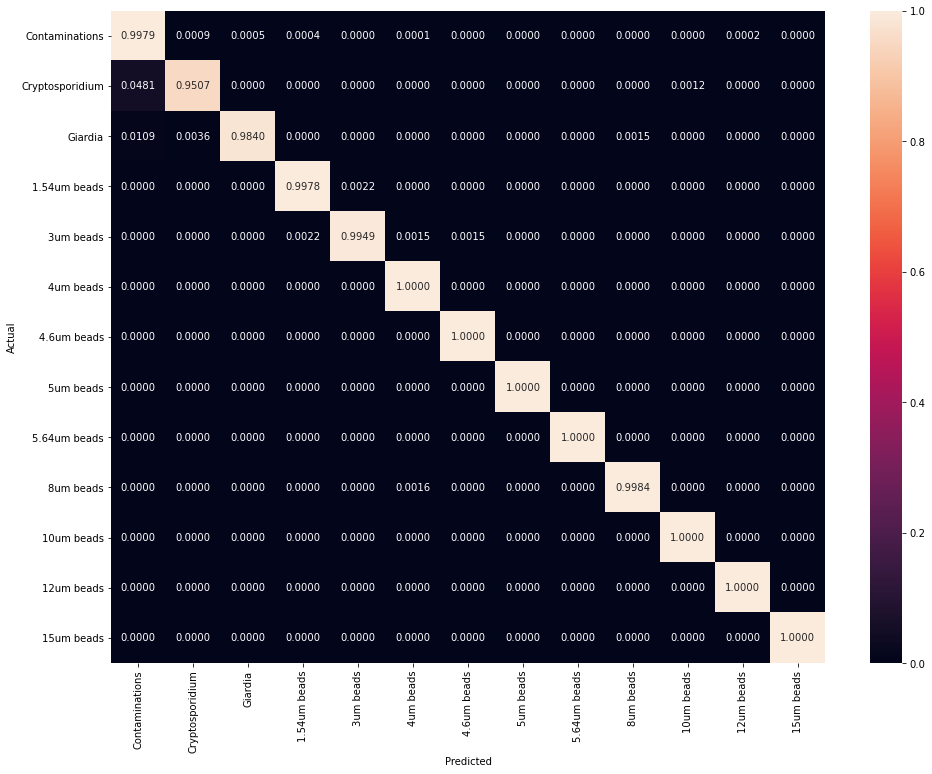

In [15]:
import seaborn as sn
import pandas

ret = confusion_matrix(y_atest, y_apred, labels=range(classes))

cmn = ret.astype('float') / ret.sum(axis=1)[:, np.newaxis]

df = pandas.DataFrame(cmn, columns=labels, index=labels)
plt.figure(figsize = (16,12))
sn.heatmap(df,fmt=".4f", annot=True)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [16]:
print(classification_report(y_atest, y_apred, digits =4))

              precision    recall  f1-score   support

           0     0.9951    0.9979    0.9965     11216
           1     0.9814    0.9507    0.9658       831
           2     0.9956    0.9840    0.9898      1375
           3     0.9940    0.9978    0.9959      1339
           4     0.9978    0.9949    0.9964      1378
           5     0.9978    1.0000    0.9989      2253
           6     0.9978    1.0000    0.9989       895
           7     1.0000    1.0000    1.0000      3860
           8     1.0000    1.0000    1.0000      1284
           9     0.9984    0.9984    0.9984      1214
          10     0.9997    1.0000    0.9999      3363
          11     0.9990    1.0000    0.9995      1912
          12     1.0000    1.0000    1.0000      1139

    accuracy                         0.9969     32059
   macro avg     0.9967    0.9941    0.9954     32059
weighted avg     0.9969    0.9969    0.9969     32059



In [17]:
print(accuracy_score(y_atest, y_apred))

0.9969119436039802


# Exchanged Confusion Matrix


In [18]:
trantable={
    0:0,
    1:1,
    2:3,
    3:4,
    4:5,
    5:6,
    6:7,
    7:8,
    8:9,
    9:2,
    10:10,
    11:11,
    12:12,
}



trantable_inv_map = {v: int(k) for k, v in trantable.items()}

print(trantable_inv_map)

{0: 0, 1: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 2: 9, 10: 10, 11: 11, 12: 12}


In [19]:
lendata = len(y_atest)

y_atestt = y_atest.copy()
y_apredt = y_apred.copy()
    
for i in range(lendata):
    y_atestt[i] = trantable_inv_map[y_atest[i]]
    y_apredt[i] = trantable_inv_map[y_apred[i]]

labelst = labels.copy()

for i in range(len(labels)):
    labelst[i] = labels[trantable[i]]
    
print(labelst)

['Contaminations', 'Cryptosporidium', '1.54um beads', '3um beads', '4um beads', '4.6um beads', '5um beads', '5.64um beads', '8um beads', 'Giardia', '10um beads', '12um beads', '15um beads']


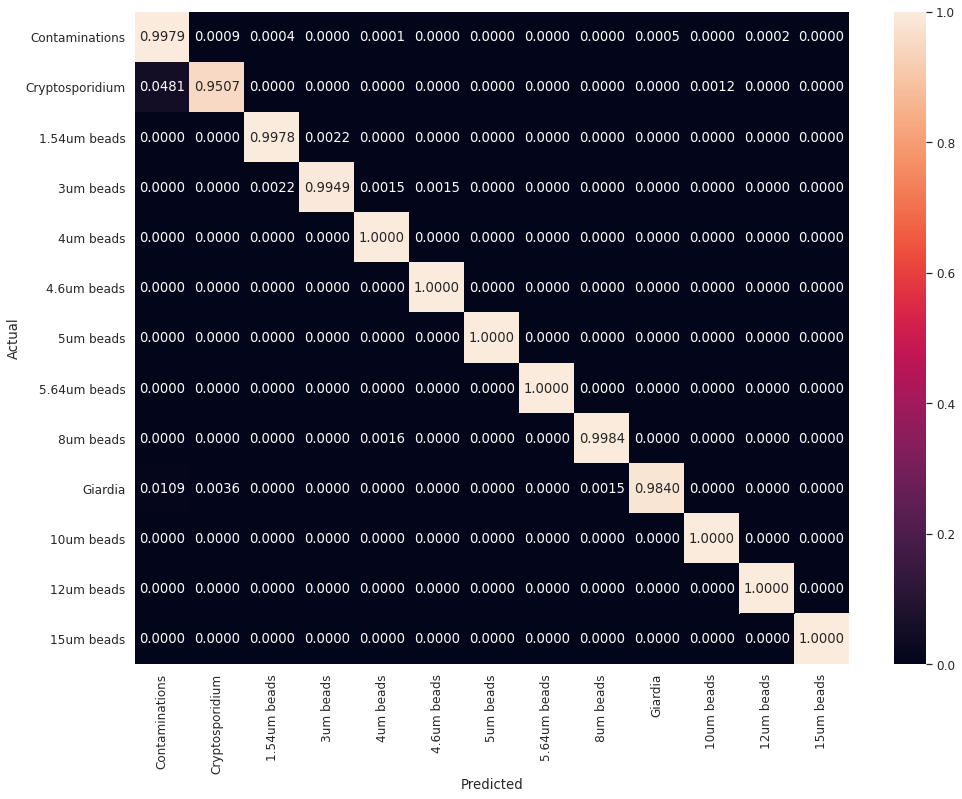

In [20]:
ret = confusion_matrix(y_atestt, y_apredt, labels=range(classes))
sn.set(font_scale=1.1)
cmn = ret.astype('float') / ret.sum(axis=1)[:, np.newaxis]

df = pandas.DataFrame(cmn, columns=labelst, index=labelst)
plt.figure(figsize = (16,12))
sn.heatmap(df,fmt=".4f", annot=True)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

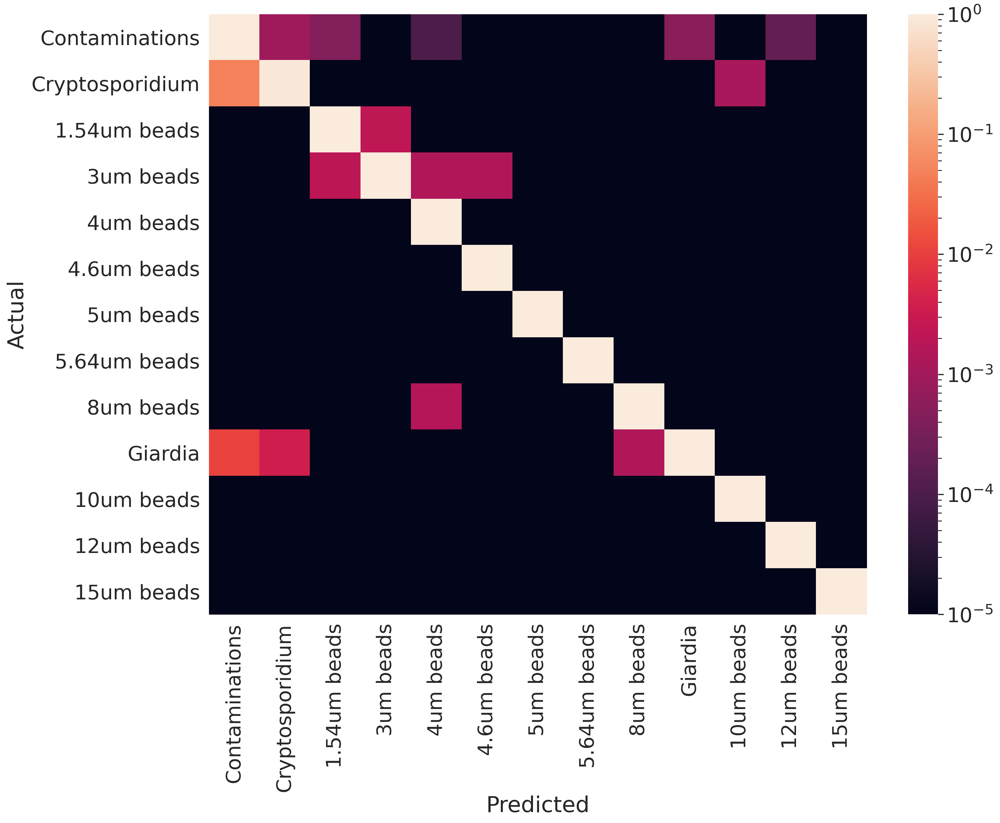

In [21]:
import math
from matplotlib.colors import LogNorm

ret = confusion_matrix(y_atestt, y_apredt, labels=range(classes))

cmn = ret.astype('float') / ret.sum(axis=1)[:, np.newaxis]

df = pandas.DataFrame(cmn, columns=labelst, index=labelst)

df = df + 0.00001
plt.figure(figsize = (16,12), dpi=200)
#sn.heatmap(df,fmt=".4f", annot=True)
sn.set(font_scale=2)
log_norm = LogNorm(vmin=df.min().min() , vmax=df.max().max())
cbar_ticks = [math.pow(10,i) for i in range(math.floor(math.log10(df.min().min())), 1+ math.ceil(math.log10(df.max().max())))]
sn.heatmap(df, norm= log_norm, cbar_kws={"ticks": cbar_ticks})
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

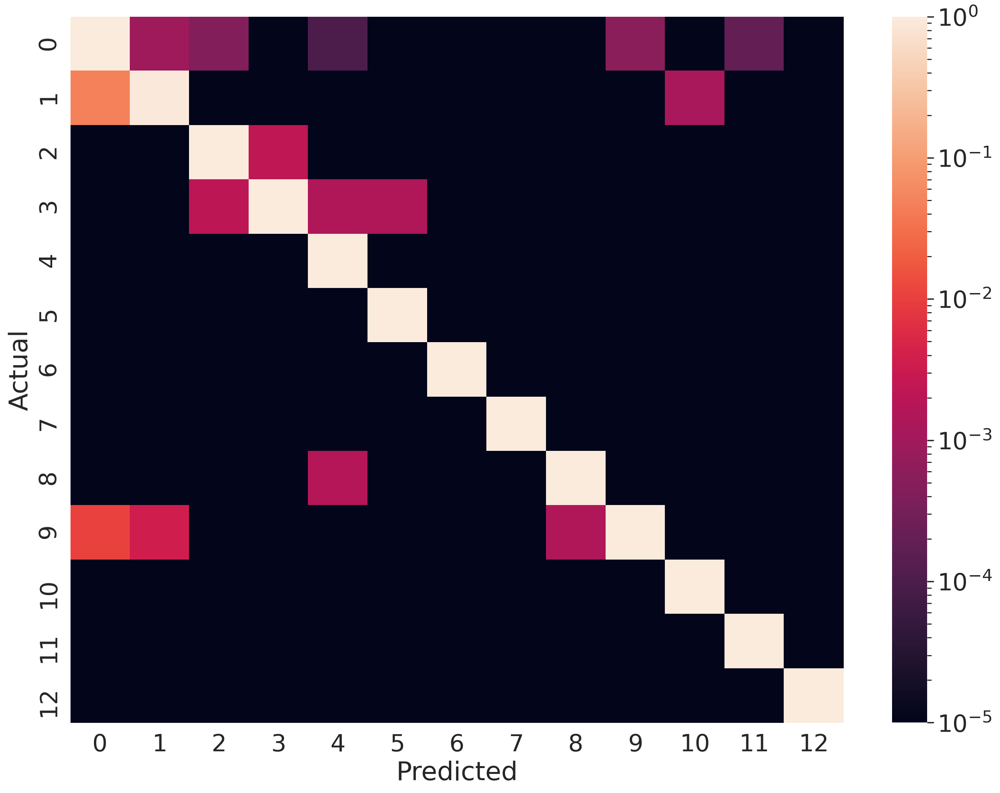

In [22]:
labelst =['0','1','2','3','4','5','6','7','8','9','10','11','12']

import math
from matplotlib.colors import LogNorm

ret = confusion_matrix(y_atestt, y_apredt, labels=range(classes))

cmn = ret.astype('float') / ret.sum(axis=1)[:, np.newaxis]

df = pandas.DataFrame(cmn, columns=labelst, index=labelst)

df = df + 0.00001
plt.figure(figsize = (16,12), dpi=200)
#sn.heatmap(df,fmt=".4f", annot=True)
sn.set(font_scale=2)
log_norm = LogNorm(vmin=df.min().min() , vmax=df.max().max())
cbar_ticks = [math.pow(10,i) for i in range(math.floor(math.log10(df.min().min())), 1+ math.ceil(math.log10(df.max().max())))]
sn.heatmap(df, norm= log_norm, cbar_kws={"ticks": cbar_ticks})
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()